# TEM Denoising with Modified EQTransformer

This notebook implements an end-to-end denoising network for Transient Electromagnetic (TEM) data based on the modified EQTransformer architecture.

In [571]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import time
import torch.nn.functional as F


In [572]:

# inp_train = np.load(r"D:\tem\3D-noise\train_data3.npy")
# out_train = np.load(r"D:\tem\3D-noise\train_labels3.npy")
inp_train = np.load("inp_train.npy")
out_train = np.load("out_train.npy")

inp_train = np.log10(inp_train)
scaler1 = StandardScaler()
inp_train_one = scaler1.fit_transform(inp_train)

out_train = np.log10(out_train)
scaler2 = StandardScaler()
out_train_one = scaler2.fit_transform(out_train)

noisy = inp_train_one.astype(np.float32)
clean = out_train_one.astype(np.float32)

# 划分数据集 8:1:1
noisy_train, noisy_temp, clean_train, clean_temp = train_test_split(
    noisy, clean, test_size=0.2, random_state=43
)
noisy_val, noisy_test, clean_val, clean_test = train_test_split(
    noisy_temp, clean_temp, test_size=0.5, random_state=43
)
print('Total size of inp_train =', inp_train.shape)


Total size of inp_train = (50000, 40)


In [573]:
class TEMDataset(Dataset):
    def __init__(self, noisy_signals, clean_signals):
        self.noisy = torch.from_numpy(noisy_signals).float().unsqueeze(1)  # (N, 1, 40)
        self.clean = torch.from_numpy(clean_signals).float().unsqueeze(1)
    def __len__(self):
        return len(self.noisy)
    def __getitem__(self, idx):
        return self.noisy[idx], self.clean[idx]

train_dataset = TEMDataset(noisy_train, clean_train)
val_dataset = TEMDataset(noisy_val, clean_val)
test_dataset = TEMDataset(noisy_test, clean_test)

batch_size = 256
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class ResidualConvBlock(nn.Module):
    def __init__(self, channels, kernel_size=3):
        super(ResidualConvBlock, self).__init__()
        padding = kernel_size // 2
        self.conv1 = nn.Conv1d(channels, channels, kernel_size=kernel_size, padding=padding)
        self.bn1 = nn.BatchNorm1d(channels)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv1d(channels, channels, kernel_size=kernel_size, padding=padding)
        self.bn2 = nn.BatchNorm1d(channels)

    def forward(self, x):
        residual = x
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        return self.relu(out + residual)

class MultiScaleConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(MultiScaleConvBlock, self).__init__()
        self.conv3 = nn.Conv1d(in_channels, out_channels, kernel_size=3, padding=1)
        self.conv5 = nn.Conv1d(in_channels, out_channels, kernel_size=5, padding=2)
        self.conv7 = nn.Conv1d(in_channels, out_channels, kernel_size=7, padding=3)
        self.bn = nn.BatchNorm1d(out_channels * 3)

    def forward(self, x):
        x3 = self.conv3(x)
        x5 = self.conv5(x)
        x7 = self.conv7(x)
        x = torch.cat([x3, x5, x7], dim=1)
        return self.bn(F.relu(x))

class GlobalAttention(nn.Module):
    def __init__(self, d_model):
        super(GlobalAttention, self).__init__()
        self.query = nn.Linear(d_model, d_model)
        self.key = nn.Linear(d_model, d_model)
        self.value = nn.Linear(d_model, d_model)
        self.softmax = nn.Softmax(dim=-1)

    def forward(self, x):  # x: (B, T, C)
        Q = self.query(x)
        K = self.key(x)
        V = self.value(x)
        attn_weights = self.softmax(Q @ K.transpose(-2, -1) / (x.size(-1) ** 0.5))  # (B, T, T)
        out = attn_weights @ V  # (B, T, C)
        return out

class TransformerEncoderLayer(nn.Module):
    def __init__(self, d_model, nhead):
        super(TransformerEncoderLayer, self).__init__()
        self.layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead, batch_first=True)

    def forward(self, x):
        return self.layer(x)


class LocalAttention(nn.Module):
    """
    
    """
    def __init__(self, channels=None, kernel_size=None,
                 hidden_dim=None, attention_width=None,
                 gamma: float = 0.0, return_attn: bool = False,
                 late_start_ratio: float = None, **kwargs):
        super(LocalAttention, self).__init__()

        # 兼容参数名 channels<->hidden_dim, kernel_size<->attention_width
        if channels is None and hidden_dim is None:
            raise ValueError("需要指定 channels 或 hidden_dim")
        if kernel_size is None and attention_width is None:
            # 给一个默认 window
            kernel_size = 7

        self.channels = int(channels) if channels is not None else int(hidden_dim)
        self.attention_width = int(kernel_size) if kernel_size is not None else int(attention_width)
        assert self.attention_width >= 1 and isinstance(self.attention_width, int)

        self.half = self.attention_width // 2
        self.scale = (self.channels ** -0.5)
        self.return_attn = bool(return_attn)

        # 保留但不使用 late_start_ratio（向后兼容）
        self.late_start_ratio = float(late_start_ratio) if late_start_ratio is not None else None

        # QKV 投影（输入最后一维应为 self.channels）
        self.Wq = nn.Linear(self.channels, self.channels)
        self.Wk = nn.Linear(self.channels, self.channels)
        self.Wv = nn.Linear(self.channels, self.channels)

        # 单一可学习标量 gamma（初始化为传入的值）
        self.gamma = nn.Parameter(torch.tensor(float(gamma)))

    def forward(self, x):
        """
        x: [B, T, C]  （C 必须等于 self.channels）
        返回: out [B, T, C] 或 (out, attn) if self.return_attn
        """
        B, T, C = x.shape
        if C != self.channels:
            # 明确报错，便于定位维度不一致
            raise ValueError(f"输入特征维 C={C} 不等于 LocalAttention 初始化的 channels={self.channels}")

        Q = self.Wq(x)  # [B, T, C]
        K = self.Wk(x)  # [B, T, C]
        V = self.Wv(x)  # [B, T, C]

        # 计算点积得分
        scores = torch.matmul(Q, K.transpose(-2, -1)) * self.scale  # [B, T, T]

        # local mask：只允许 |i-j| <= half
        idx = torch.arange(T, device=x.device)
        dist = (idx.unsqueeze(0) - idx.unsqueeze(1)).abs()  # [T, T]
        local_mask = (dist <= self.half).to(x.device)  # boolean [T, T]
        neg_inf = -1e9
        scores = scores + ((~local_mask).float() * neg_inf).unsqueeze(0)  # [B, T, T]

        # 简单的可学习 late-time bias： gamma * t , t in [0,1]
        t = torch.linspace(0.0, 1.0, steps=T, device=x.device).view(1, 1, T)  # [1,1,T]
        scores = scores + (self.gamma.view(1, 1, 1) * t)

        # softmax -> attention
        attn = F.softmax(scores, dim=-1)  # [B, T, T]
        out = torch.matmul(attn, V)       # [B, T, C]

        # 残差连接（保持接口不变）
        out = out + x

        if self.return_attn:
            return out, attn
        return out




class MSTransformerNet(nn.Module):
    def __init__(self, input_channels=1, d_model=96, nhead=4,
                 num_transformer_layers=2, lstm_hidden=64, seq_len=40,
                 local_attn_width=7, late_gamma=2.0, late_start_ratio=0.5):
        super(MSTransformerNet, self).__init__()
        self.pc_block = MultiScaleConvBlock(input_channels, d_model // 3)
        self.project = nn.Conv1d(d_model, d_model, kernel_size=1)
        self.res_blocks = nn.Sequential(
            ResidualConvBlock(d_model, kernel_size=3),
            ResidualConvBlock(d_model, kernel_size=3),
            ResidualConvBlock(d_model, kernel_size=3),
            ResidualConvBlock(d_model, kernel_size=3)
        )
        self.pos_enc = nn.Parameter(torch.randn(1, seq_len, d_model))
        # two-layer BiLSTM
        self.bilstm1 = nn.LSTM(input_size=d_model, hidden_size=lstm_hidden,
                               num_layers=2, batch_first=True, bidirectional=True)
        # Transformer encoder (use your existing wrapper)
        self.transformer1 = TransformerEncoderLayer(d_model=2 * lstm_hidden, nhead=nhead)
        # another LSTM to restore causal ordering
        # self.lstm2 = nn.LSTM(input_size=2 * lstm_hidden, hidden_size=lstm_hidden,
        #                       num_layers=1, batch_first=True)
        # late local attention (windowed self-attention with late weighting)
        self.local_attn = LocalAttention(hidden_dim=2*lstm_hidden,
                                             attention_width=local_attn_width,
                                             gamma=late_gamma,
                                             late_start_ratio=late_start_ratio)
        # final fc
        self.fc = nn.Linear(2*lstm_hidden, 1)

    def forward(self, x):
        # x: [B, C_in, T]
        x = self.pc_block(x)            # [B, d_model, T]
        x = self.project(x)             # [B, d_model, T]
        x = self.res_blocks(x)          # [B, d_model, T]
        x = x.permute(0, 2, 1)          # [B, T, d_model]
       
        # BiLSTM
        x, _ = self.bilstm1(x)          # [B, T, 2*lstm_hidden]
        # Transformer (single layer or wrapper)
        x = self.transformer1(x)        # [B, T, 2*lstm_hidden]
        # single LSTM -> [B, T, lstm_hidden]
        # x, _ = self.lstm2(x)
        # late-local attention expects [B, T, C]
        x = self.local_attn(x)          # [B, T, lstm_hidden]
        # final FC and reshape
        x = self.fc(x)                  # [B, T, 1]
        return x.permute(0, 2, 1)       # [B, 1, T]


In [577]:
import torch
import torch.nn as nn
import torch.nn.functional as F



class nores_atten_formerNet(nn.Module):
    """
    基于多尺度卷积、LSTM、Transformer的网络，实现了移除残差块与局部注意力机制的版本。
    类名需与实例化调用时一致。
    """
    def __init__(self, input_channels=1, d_model=96, nhead=4,
                 num_transformer_layers=2, lstm_hidden=64, seq_len=40):
        super(nores_atten_formerNet, self).__init__()
        # 多尺度卷积
        self.pc_block = MultiScaleConvBlock(input_channels, d_model // 3)
        # 通道投影
        self.project = nn.Conv1d(d_model, d_model, kernel_size=1)
        # 可学习位置编码
        self.pos_enc = nn.Parameter(torch.randn(1, seq_len, d_model))
        # 两层双向 LSTM
        self.bilstm1 = nn.LSTM(input_size=d_model, hidden_size=lstm_hidden,
                               num_layers=2, batch_first=True, bidirectional=True)
        # 单层 Transformer
        self.transformer1 = nn.TransformerEncoderLayer(d_model=2 * lstm_hidden, nhead=nhead, batch_first=True)
        # 再接一层 LSTM
        self.lstm2 = nn.LSTM(input_size=2 * lstm_hidden, hidden_size=lstm_hidden,
                              num_layers=1, batch_first=True)
        # 最后全连接
        self.fc = nn.Linear(2*lstm_hidden, 1)

    def forward(self, x):
        # x: [B, C_in, T]
        x = self.pc_block(x)            # [B, d_model, T]
        x = self.project(x)             # [B, d_model, T]
        x = x.permute(0, 2, 1)          # [B, T, d_model]
      
        # 两层 BiLSTM
        x, _ = self.bilstm1(x)          # [B, T, 2*lstm_hidden]
        # 单层 Transformer
        x = self.transformer1(x)        # [B, T, 2*lstm_hidden]
        # 单向 LSTM
        # x, _ = self.lstm2(x)            # [B, T, lstm_hidden]
        # 直接预测，无局部注意力
        x = self.fc(x)                  # [B, T, 1]
        return x.permute(0, 2, 1)       # [B, 1, T]


In [ ]:
class ResAttentiveDownUpNet(nn.Module):
    def __init__(self, input_channels=1, d_model=96, nhead=4,
                 num_transformer_layers=2, lstm_hidden=64, seq_len=40):
        super(ResAttentiveDownUpNet, self).__init__()
        self.pc_block = MultiScaleConvBlock(input_channels, d_model // 3)
        self.project = nn.Conv1d(d_model, d_model, kernel_size=1)
        self.res_blocks = nn.Sequential(
            ResidualConvBlock(d_model, kernel_size=3),
            ResidualConvBlock(d_model, kernel_size=3),
            # ResidualConvBlock(d_model, kernel_size=3),
            # ResidualConvBlock(d_model, kernel_size=3)
        )
        self.pos_enc = nn.Parameter(torch.randn(1, seq_len, d_model))
        # 两层双向 LSTM
        self.bilstm1 = nn.LSTM(input_size=d_model, hidden_size=lstm_hidden,
                               num_layers=2, batch_first=True, bidirectional=True)
        # 单层 Transformer
        self.transformer1 = nn.TransformerEncoderLayer(d_model=2 * lstm_hidden, nhead=nhead, batch_first=True)
        # 再接一层 LSTM
        self.lstm2 = nn.LSTM(input_size=2 * lstm_hidden, hidden_size=lstm_hidden,
                              num_layers=1, batch_first=True)
        # 局部注意力机制
        # self.local_attn = LocalAttention(channels=lstm_hidden, kernel_size=3)
        # 最后全连接
        self.fc = nn.Linear(2*lstm_hidden, 1)

    def forward(self, x):
        # x: [B, C_in, T]
        x = self.pc_block(x)            # [B, d_model, T]
        x = self.project(x)             # [B, d_model, T]
        x = self.res_blocks(x)          # [B, d_model, T]
        x = x.permute(0, 2, 1)          # [B, T, d_model]
        
        # 两层 BiLSTM
        x, _ = self.bilstm1(x)          # [B, T, 2*lstm_hidden]
        # 单层 Transformer
        x = self.transformer1(x)       # [B, T, 2*lstm_hidden]
        # 单向 LSTM
        # x, _ = self.lstm2(x)           # [B, T, lstm_hidden]
        # 全连接预测
        x = self.fc(x)                 # [B, T, 1]
        return x.permute(0, 2, 1)      # [B, 1, T]

In [579]:
#3
class AttentivePCTransformerNet(nn.Module):
    def __init__(self, input_channels=1, d_model=96, nhead=4,
                 num_transformer_layers=2, lstm_hidden=64, seq_len=40):
        super(AttentivePCTransformerNet, self).__init__()
        # 输入通道数
        self.pc_block = MultiScaleConvBlock(input_channels, d_model // 3)
        self.project = nn.Conv1d(d_model, d_model, kernel_size=1)
        self.res_blocks = nn.Sequential(
            ResidualConvBlock(d_model, kernel_size=3),
            # ResidualConvBlock(d_model, kernel_size=3),
            # ResidualConvBlock(d_model, kernel_size=3),
            ResidualConvBlock(d_model, kernel_size=3)
        )
        self.pos_enc = nn.Parameter(torch.randn(1, seq_len, d_model))
        # 两层双向 LSTM
        self.bilstm1 = nn.LSTM(input_size=d_model, hidden_size=lstm_hidden,
                               num_layers=2, batch_first=True, bidirectional=True)
        # 单层 Transformer
        self.transformer1 = nn.TransformerEncoderLayer(d_model=2 * lstm_hidden, nhead=nhead, batch_first=True)
        # 再接一层 LSTM
        # self.lstm2 = nn.LSTM(input_size=2 * lstm_hidden, hidden_size=lstm_hidden,
        #                       num_layers=1, batch_first=True)
        # # 局部注意力机制
        self.local_attn = LocalAttention(channels=2*lstm_hidden, kernel_size=3)
        # 最后全连接
        self.fc = nn.Linear(2*lstm_hidden, 1)

    def forward(self, x):
        # x: [B, C_in, T]
        x = self.pc_block(x)            # [B, d_model, T]
        x = self.project(x)             # [B, d_model, T]         # [B, d_model, T]
        x = x.permute(0, 2, 1)          # [B, T, d_model]
        # 可学习位置编码
        
        # 两层 BiLSTM
        x, _ = self.bilstm1(x)          # [B, T, 2*lstm_hidden]
        # 单层 Transformer
        x = self.transformer1(x)       # [B, T, 2*lstm_hidden]
        # 单向 LSTM
        # x, _ = self.lstm2(x)           # [B, T, lstm_hidden]
        # 局部注意力
        x = self.local_attn(x)         # [B, T, lstm_hidden]
        # 全连接预测
        x = self.fc(x)                 # [B, T, 1]
        return x.permute(0, 2, 1)      # [B, 1, T]


In [580]:
# 4TEM1Dformer
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, padding=1):
        super(ConvBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv1d(in_channels, out_channels, kernel_size, padding=padding),
            nn.ReLU(),
            nn.Conv1d(out_channels, out_channels, kernel_size, padding=padding),
            nn.ReLU()
        )
    def forward(self, x):
        return self.conv(x)

class TransformerBlock(nn.Module):
    def __init__(self, embed_size, num_heads, depth, dim_feedforward=1024):
        super(TransformerBlock, self).__init__()
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=embed_size,
            nhead=num_heads,
            dim_feedforward=dim_feedforward,
            activation="relu",
            batch_first=True
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=depth)
    def forward(self, x):
        return self.transformer(x)

class ResidualBlock1D(nn.Module):
    def __init__(self, channels, kernel_size=3, padding=1):
        # 初始化ResidualBlock1D类
        super(ResidualBlock1D, self).__init__()
        self.conv1 = nn.Conv1d(channels, channels, kernel_size, padding=padding)
        self.relu1 = nn.ReLU()
        self.conv2 = nn.Conv1d(channels, channels, kernel_size, padding=padding)
        self.relu2 = nn.ReLU()
    def forward(self, x):
        residual = x
        x = self.conv1(x)
        x = self.relu1(x)
        x = self.conv2(x)
        x = self.relu2(x)
        return x + residual

class TEM1Dformer(nn.Module):
    def __init__(self, input_channels=1, embed_size=64, num_heads=4, transformer_depth=2):
        super(TEM1Dformer, self).__init__()
        self.conv1 = ConvBlock(input_channels, embed_size)
        self.transformer = TransformerBlock(embed_size, num_heads, transformer_depth)
        self.residual1 = ResidualBlock1D(embed_size)
        self.residual2 = ResidualBlock1D(embed_size)
        self.residual3 = ResidualBlock1D(embed_size)
        self.residual4 = ResidualBlock1D(embed_size)
        self.conv2 = nn.Conv1d(embed_size, embed_size, kernel_size=3, padding=1)
        self.relu = nn.ReLU()
        self.conv3 = nn.Conv1d(embed_size, embed_size, kernel_size=3, padding=1)
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(embed_size * 40, 40)
    def forward(self, x):
        x = self.conv1(x)
        x = x.permute(0, 2, 1)
        x = self.transformer(x)
        x = x.permute(0, 2, 1)
        x = self.residual1(x)
        x = self.residual2(x)
        x = self.residual3(x)
        x = self.residual4(x)
        x = self.conv2(x)
        x = self.relu(x)
        x = self.conv3(x)
        x = self.flatten(x)
        x = self.fc(x)
        x = x.unsqueeze(1)  # (N, 1, 40)
        return x


In [581]:
# --- 5. SFSDSA ---
class SFSDSA(nn.Module):
    def __init__(self, input_dim=40):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 40),
            nn.SELU(),
            nn.Linear(40, 20),
            nn.SELU(),
        )
        self.decoder = nn.Sequential(
            nn.Linear(20, 40),
            nn.SELU(),
            nn.Linear(40, input_dim),
        )
    def forward(self, x):
        x = x.squeeze(1)  # (N, 1, 40) -> (N, 40)
        x = self.encoder(x)
        x = self.decoder(x)
        x = x.unsqueeze(1)  # (N, 40) -> (N, 1, 40)
        return x

In [582]:
#6

class AttentionBlock(nn.Module):
    def __init__(self, embed_dim, num_heads=4, dropout=0.0):
        super().__init__()
        self.attn = nn.MultiheadAttention(embed_dim, num_heads, dropout=dropout, batch_first=True)
        self.norm = nn.LayerNorm(embed_dim, eps=1e-6)

    def forward(self, x):
        # x: [B, L, D]
        attn_out, _ = self.attn(x, x, x)
        return self.norm(x + attn_out)

class ConvolutionalModule(nn.Module):
    def __init__(self, in_channels, filters, kernel_size):
        super().__init__()
        self.conv1 = nn.Conv1d(in_channels, filters, kernel_size, padding=kernel_size//2)
        self.attn1 = AttentionBlock(filters)
        self.pool1 = nn.MaxPool1d(2)

        self.conv2 = nn.Conv1d(filters, 2*filters, kernel_size, padding=kernel_size//2)
        self.pool2 = nn.MaxPool1d(2)

        self.conv3 = nn.Conv1d(2*filters, 4*filters, kernel_size, padding=kernel_size//2)
        self.pool3 = nn.MaxPool1d(2)

    def forward(self, x):
        # x: [B, C, L]
        x = F.relu(self.conv1(x))       # -> [B, filters, L]
        x = x.permute(0, 2, 1)           # -> [B, L, filters]
        x = self.attn1(x)
        x = x.permute(0, 2, 1)           # -> [B, filters, L]
        x = self.pool1(x)                # -> L/2

        x = F.relu(self.conv2(x))       # -> [B, 2*filters, L/2]
        x = self.pool2(x)                # -> L/4

        x = F.relu(self.conv3(x))       # -> [B, 4*filters, L/4]
        x = self.pool3(x)                # -> L/8

        return x                        # [B, 4*filters, L/8]

class PCBiLSTMNet(nn.Module):
    def __init__(self, input_length=40, in_channels=1, filters=16, lstm_hidden=32, lstm_layers=2, num_heads=4):
        super().__init__()
        self.branch3 = ConvolutionalModule(in_channels, filters, kernel_size=3)
        self.branch5 = ConvolutionalModule(in_channels, filters, kernel_size=5)
        self.branch7 = ConvolutionalModule(in_channels, filters, kernel_size=7)

        merged_dim = 4 * filters * 3
        self.attn_merge = AttentionBlock(merged_dim, num_heads=num_heads)

        self.bilstm = nn.LSTM(
            input_size=merged_dim,
            hidden_size=lstm_hidden,
            num_layers=lstm_layers,
            batch_first=True,
            bidirectional=True
        )

        self.fc = nn.Linear(2 * lstm_hidden, input_length)

    def forward(self, x):
        # x: [B, 1, 40]
        # 不需要 permute
        b3 = self.branch3(x)
        b5 = self.branch5(x)
        b7 = self.branch7(x)

        merged = torch.cat([b3, b5, b7], dim=1)  # [B, 12*filters, L/8]
        merged = merged.permute(0, 2, 1)          # [B, L/8, 12*filters]

        merged = self.attn_merge(merged)
        lstm_out, _ = self.bilstm(merged)

        last = lstm_out[:, -1, :]                # [B, 2*lstm_hidden]
        out = self.fc(last)                      # [B, input_length]
        return out.unsqueeze(1)                  # [B, 1, 40]

In [583]:
#7
class LSTMAutoencoderNet(nn.Module):
    def __init__(self, input_dim=40):
        super().__init__()
        self.lstm1 = nn.LSTM(input_size=1, hidden_size=40, batch_first=True, bidirectional=False)
        self.lstm2 = nn.LSTM(input_size=40, hidden_size=20, batch_first=True, bidirectional=False)
        self.bn = nn.BatchNorm1d(20)  # 修正为20
        self.lstm3 = nn.LSTM(input_size=20, hidden_size=40, batch_first=True, bidirectional=False)
        self.fc = nn.Linear(40, input_dim)

    def forward(self, x):
        # x: (batch, 1, 40)
        x = x.permute(0, 2, 1)  # (batch, 40, 1)
        out, _ = self.lstm1(x)  # (batch, 40, 40)
        out, _ = self.lstm2(out)  # (batch, 40, 20)
        out = out.permute(0, 2, 1)  # (batch, 40, 20) -> (batch, 20, 40)
        out = self.bn(out)  # BN on (batch, 20, 40)
        out = out.permute(0, 2, 1)  # (batch, 20, 40) -> (batch, 40, 20)
        out, _ = self.lstm3(out)  # (batch, 40, 40)
        out = self.fc(out)  # (batch, 40, 40)
        out = out.permute(0, 2, 1)  # (batch, 40, 40) -> (batch, 40, 40)
        out = out[:, 0:1, :]  # 只保留一个通道，(batch, 1, 40)
        return out

In [584]:
def compute_rmse(pred, target):
    return torch.sqrt(torch.mean((pred - target) ** 2)).item()

def compute_rrmse(pred, target):
    mse = torch.mean((pred - target) ** 2)
    denom = torch.mean(target ** 2)
    return torch.sqrt(mse / denom).item()

def compute_snr(pred, target):
    signal_power = torch.sum(target ** 2)
    noise_power = torch.sum((pred - target) ** 2)
    snr = 10 * torch.log10(signal_power / (noise_power + 1e-8)) 
    return snr.item()

In [585]:
def compute_metrics_original(pred, target, scaler):
    # 将张量转换为numpy数组
    pred_cpu = pred.detach().cpu().numpy()
    target_cpu = target.detach().cpu().numpy()
    
    # 处理张量维度
    if pred_cpu.ndim == 3 and pred_cpu.shape[1] == 1:
        pred_cpu = pred_cpu.squeeze(1)  # (N, 1, 40) -> (N, 40)
    if target_cpu.ndim == 3 and target_cpu.shape[1] == 1:
        target_cpu = target_cpu.squeeze(1)  # (N, 1, 40) -> (N, 40)
    
    # 使用传入的scaler参数进行逆标准化
    pred_inv = scaler.inverse_transform(pred_cpu)
    target_inv = scaler.inverse_transform(target_cpu)
    
    # 从对数空间转换回原始空间
    pred_inv = 10 ** pred_inv
    target_inv = 10 ** target_inv
    
    # 计算指标
    diff2 = (pred_inv - target_inv) ** 2
    target2 = target_inv ** 2
    rmse_per_sample = np.sqrt(np.mean(diff2, axis=1))
    denom = np.mean(target2, axis=1)
    denom[denom == 0] = 1e-8
    rrmse_per_sample = rmse_per_sample / np.sqrt(denom)
    snr_per_sample = 10 * np.log10(np.sum(target2, axis=1) / (np.sum(diff2, axis=1) + 1e-8))
    
    rmse = np.mean(rmse_per_sample)
    rrmse = np.mean(rrmse_per_sample)
    snr = np.mean(snr_per_sample)
    return rmse, rrmse, snr
def compute_metrics_original(pred, target, scaler):
    try:
        # 将张量转换为numpy数组
        pred_cpu = pred.detach().cpu().numpy()
        target_cpu = target.detach().cpu().numpy()
        
        # 处理张量维度
        if pred_cpu.ndim == 3 and pred_cpu.shape[1] == 1:
            pred_cpu = pred_cpu.squeeze(1)  # (N, 1, 40) -> (N, 40)
        if target_cpu.ndim == 3 and target_cpu.shape[1] == 1:
            target_cpu = target_cpu.squeeze(1)  # (N, 1, 40) -> (N, 40)
        
        # 检查数据形状
        if pred_cpu.shape != target_cpu.shape:
            raise ValueError(f"Shape mismatch: pred {pred_cpu.shape} vs target {target_cpu.shape}")
        
        # 使用传入的scaler参数进行逆标准化
        pred_inv = scaler.inverse_transform(pred_cpu)
        target_inv = scaler.inverse_transform(target_cpu)
        
        # 从对数空间转换回原始空间
        pred_inv = 10 ** pred_inv
        target_inv = 10 ** target_inv
        
        # 检查是否有无效值
        if np.isnan(pred_inv).any() or np.isinf(pred_inv).any():
            print("Warning: Invalid values in pred_inv after transformation")
            pred_inv = np.nan_to_num(pred_inv, nan=0.0, posinf=1e10, neginf=1e-10)
        
        if np.isnan(target_inv).any() or np.isinf(target_inv).any():
            print("Warning: Invalid values in target_inv after transformation")
            target_inv = np.nan_to_num(target_inv, nan=0.0, posinf=1e10, neginf=1e-10)
        
        # 计算指标
        diff2 = (pred_inv - target_inv) ** 2
        target2 = target_inv ** 2
        
        # 计算RMSE
        rmse_per_sample = np.sqrt(np.mean(diff2, axis=1))
        rmse = np.mean(rmse_per_sample)
        
        # 计算RRMSE
        denom = np.mean(target2, axis=1)
        # 使用更安全的方式处理零值
        denom = np.maximum(denom, 1e-12)  # 确保分母不为零
        rrmse_per_sample = rmse_per_sample / np.sqrt(denom)
        rrmse = np.mean(rrmse_per_sample)
        
        # 计算SNR
        signal_power = np.sum(target2, axis=1)
        noise_power = np.sum(diff2, axis=1)
        # 避免除零和对数计算错误
        noise_power = np.maximum(noise_power, 1e-12)
        snr_per_sample = 10 * np.log10(signal_power / noise_power)
        
        # 处理可能的无效SNR值
        snr_per_sample = np.nan_to_num(snr_per_sample, nan=0.0, posinf=100.0, neginf=-100.0)
        snr = np.mean(snr_per_sample)
        
        # 最终检查结果的有效性
        if np.isnan(rmse) or np.isinf(rmse):
            print("Warning: Invalid RMSE computed")
            rmse = 0.0
        if np.isnan(rrmse) or np.isinf(rrmse):
            print("Warning: Invalid RRMSE computed")
            rrmse = 0.0
        if np.isnan(snr) or np.isinf(snr):
            print("Warning: Invalid SNR computed")
            snr = 0.0
        
        return rmse, rrmse, snr
        
    except Exception as e:
        print(f"Error in compute_metrics_original: {e}")
        print(f"Pred shape: {pred.shape}, Target shape: {target.shape}")
        return 0.0, 0.0, 0.0


In [586]:
# # def inverse_transform(tensor, scaler):
# #     arr = tensor.detach().cpu().numpy()
# #     if arr.ndim == 3 and arr.shape[1] == 1:
# #         arr = arr.squeeze(1)  # (N, 1, 40) -> (N, 40)
# #     arr = scaler.inverse_transform(arr)
# #     arr = 10 ** arr
# #     return arr

# def compute_metrics_original(pred, target, scaler):
#     pred_inv = scaler2.inverse_transform(pred, scaler)
#     target_inv = scaler2.inverse_transform(target, scaler)
#     # 按样本分别计算，防止分母为0
#     diff2 = (pred_inv - target_inv) ** 2
#     target2 = target_inv ** 2
#     rmse_per_sample = np.sqrt(np.mean(diff2, axis=1))
#     denom = np.mean(target2, axis=1)
#     # 防止分母为0
#     denom[denom == 0] = 1e-8
#     rrmse_per_sample = rmse_per_sample / np.sqrt(denom)
#     snr_per_sample = 10 * np.log10(np.sum(target2, axis=1) / (np.sum(diff2, axis=1) + 1e-8))
#     # 返回平均值
#     rmse = np.mean(rmse_per_sample)
#     rrmse = np.mean(rrmse_per_sample)
#     snr = np.mean(snr_per_sample)
#     return rmse, rrmse, snr

In [587]:
# --- 8. 模型实例化与优化器 ---
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

if torch.cuda.device_count() > 1:
    print(f"使用 {torch.cuda.device_count()} 块GPU进行训练")
    model_no_local = nn.DataParallel(ResAttentiveDownUpNet())
    model_pcbilstm = nn.DataParallel(PCBiLSTMNet())
    model_1d = nn.DataParallel(TEM1Dformer(embed_size=8, num_heads=2, transformer_depth=1))
    model_dense = nn.DataParallel(SFSDSA(input_dim=40))
    model_no_res = nn.DataParallel(AttentivePCTransformerNet())
    model_lstm_auto = nn.DataParallel(LSTMAutoencoderNet(input_dim=40))
    model_resattpc = nn.DataParallel(MSTransformerNet())
    model_nores_atten=nn.DataParallel(nores_atten_formerNet())
else:
    model_no_local = ResAttentiveDownUpNet()
    model_pcbilstm = PCBiLSTMNet()
    model_1d = TEM1Dformer(embed_size=8, num_heads=1, transformer_depth=1)
    model_dense = SFSDSA(input_dim=40)
    model_no_res = AttentivePCTransformerNet()  
    model_lstm_auto = LSTMAutoencoderNet(input_dim=40)
    model_resattpc = MSTransformerNet()
    model_nores_atten= nores_atten_formerNet()
 
model_no_local = model_no_local.to(device)
model_1d = model_1d.to(device)
model_dense = model_dense.to(device)
model_pcbilstm = model_pcbilstm.to(device)
model_no_res = model_no_res.to(device)
model_lstm_auto = model_lstm_auto.to(device)
model_resattpc=model_resattpc.to(device)
model_nores_atten=model_nores_atten.to(device)
criterion = nn.MSELoss()
optimizer_no_local = optim.Adam(model_no_local.parameters(), lr=5e-5)
optimizer_pcbilstm = optim.Adam(model_pcbilstm.parameters(), lr=5e-5)
optimizer_1d = optim.Adam(model_1d.parameters(), lr=5e-5)
optimizer_dense = optim.Adam(model_dense.parameters(), lr=5e-5)
optimizer_no_res = optim.Adam(model_no_res.parameters(), lr=5e-5)
optimizer_lstm_auto = optim.Adam(model_lstm_auto.parameters(), lr=5e-5)
optimizer_resattpc = optim.Adam(model_resattpc.parameters(), lr=5e-5)
optimizer_no_res_atten = optim.Adam(model_nores_atten.parameters(), lr=5e-5)
epochs =2000


使用 2 块GPU进行训练


In [588]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print("no local 参数量:", count_parameters(model_no_local))
print("TEM1Dformer 参数量:", count_parameters(model_1d))
print("SFSDSA 参数量:", count_parameters(model_dense))
print("PCBiLSTMNet 参数量:", count_parameters(model_pcbilstm))
print("AttPCTransformer 参数量:", count_parameters(model_no_res))
print("LSTMAutoencoder 参数量:", count_parameters(model_lstm_auto))
print("model_resattpc 参数量:", count_parameters(model_resattpc))
print("no_res_atten  参数量:", count_parameters(model_nores_atten))

no local 参数量: 894881
TEM1Dformer 参数量: 32808
SFSDSA 参数量: 4940
PCBiLSTMNet 参数量: 276488
AttPCTransformer 参数量: 950626
LSTMAutoencoder 参数量: 23440
model_resattpc 参数量: 1062370
no_res_atten  参数量: 839009


In [589]:
# --- 9. 记录指标 ---
def init_metrics():
    return [], [], [], []

train_losses_eq, train_rmses_eq, train_rrmses_eq, train_snrs_eq = init_metrics()
val_losses_eq, val_rmses_eq, val_rrmses_eq, val_snrs_eq = init_metrics()
train_losses_1d, train_rmses_1d, train_rrmses_1d, train_snrs_1d = init_metrics()
val_losses_1d, val_rmses_1d, val_rrmses_1d, val_snrs_1d = init_metrics()
train_losses_dense, train_rmses_dense, train_rrmses_dense, train_snrs_dense = init_metrics()
val_losses_dense, val_rmses_dense, val_rrmses_dense, val_snrs_dense = init_metrics()
train_losses_pcbilstm, train_rmses_pcbilstm, train_rrmses_pcbilstm, train_snrs_pcbilstm = init_metrics()
val_losses_pcbilstm, val_rmses_pcbilstm, val_rrmses_pcbilstm, val_snrs_pcbilstm = init_metrics()
train_losses_attpc, train_rmses_attpc, train_rrmses_attpc, train_snrs_attpc = init_metrics()
val_losses_attpc, val_rmses_attpc, val_rrmses_attpc, val_snrs_attpc = init_metrics()
train_losses_nores_atten, train_rmses_nores_atten, train_rrmses_nores_atten, train_snrs_nores_atten = init_metrics()
val_losses_nores_atten, val_rmses_nores_atten, val_rrmses_nores_atten, val_snrs_nores_atten = init_metrics()
# 新增：LSTM Autoencoder 指标
train_losses_lstm_auto, train_rmses_lstm_auto, train_rrmses_lstm_auto, train_snrs_lstm_auto = init_metrics()
val_losses_lstm_auto, val_rmses_lstm_auto, val_rrmses_lstm_auto, val_snrs_lstm_auto = init_metrics()
train_losses_resattpc, train_rmses_resattpc, train_rrmses_resattpc, train_snrs_resattpc = init_metrics()
val_losses_resattpc, val_rmses_resattpc, val_rrmses_resattpc, val_snrs_resattpc = init_metrics()
val_rmses_resattpc_ori, val_rrmses_resattpc_ori, val_snrs_resattpc_ori = [], [], []
# 新增：原始空间指标
val_rmses_eq_ori, val_rrmses_eq_ori, val_snrs_eq_ori = [], [], []
val_rmses_1d_ori, val_rrmses_1d_ori, val_snrs_1d_ori = [], [], []
val_rmses_dense_ori, val_rrmses_dense_ori, val_snrs_dense_ori = [], [], []
val_rmses_pcbilstm_ori, val_rrmses_pcbilstm_ori, val_snrs_pcbilstm_ori = [], [], []
val_rmses_attpc_ori, val_rrmses_attpc_ori, val_snrs_attpc_ori = [], [], []
val_rmses_lstm_auto_ori, val_rrmses_lstm_auto_ori, val_snrs_lstm_auto_ori = [], [], []
val_rmses_nores_atten_ori, val_rrmses_nores_atten_ori, val_snrs_nores_atten_ori = [], [], []


In [590]:
# --- EarlyStopping 类 ---
class EarlyStopping:
    def __init__(self, patience=50, verbose=True):
        self.patience = patience
        self.counter = 0
        self.best_loss = None
        self.early_stop = False
        self.verbose = verbose
        self.best_epoch = 0

    def __call__(self, val_loss, epoch):
        if self.best_loss is None or val_loss < self.best_loss:
            self.best_loss = val_loss
            self.counter = 0
            self.best_epoch = epoch
        else:
            self.counter += 1
            if self.verbose:
                print(f"EarlyStopping: {self.counter}/{self.patience} without improvement.")
            if self.counter >= self.patience:
                self.early_stop = True

# --- 训练与验证主循环 ---
early_stopping_pcbilstm = EarlyStopping(patience=25, verbose=True)
early_stopping_attpc = EarlyStopping(patience=25, verbose=True)
early_stopping_1d= EarlyStopping(patience=25, verbose=True)
early_stopping_res = EarlyStopping(patience=25, verbose=True)
early_stopping_dense = EarlyStopping(patience=25, verbose=True)
start_time = time.time()
for epoch in range(1, epochs+1):
    n_train = len(train_loader.dataset)
    n_val = len(val_loader.dataset)

    # --- 训练 EQTransformer ---
    model_no_local.train()
    epoch_loss_eq = epoch_rmse_eq = epoch_rrmse_eq = epoch_snr_eq = 0.0
    for noisy_batch, clean_batch in train_loader:
        noisy_batch = noisy_batch.to(device)
        clean_batch = clean_batch.to(device)
        optimizer_no_local.zero_grad()
        output = model_no_local(noisy_batch)
        loss = criterion(output, clean_batch)
        loss.backward()
        optimizer_no_local.step()
        epoch_loss_eq += loss.item() * noisy_batch.size(0)
        epoch_rmse_eq += compute_rmse(output, clean_batch) * noisy_batch.size(0)
        epoch_rrmse_eq += compute_rrmse(output, clean_batch) * noisy_batch.size(0)
        epoch_snr_eq += compute_snr(output, clean_batch) * noisy_batch.size(0)
    train_losses_eq.append(epoch_loss_eq / n_train)
    train_rmses_eq.append(epoch_rmse_eq / n_train)
    train_rrmses_eq.append(epoch_rrmse_eq / n_train)
    train_snrs_eq.append(epoch_snr_eq / n_train)
    # --- 训练 noresatten ---
    model_nores_atten.train()
    epoch_loss_nores_atten = epoch_rmse_nores_atten = epoch_rrmse_nores_atten = epoch_snr_nores_atten = 0.0
    for noisy_batch, clean_batch in train_loader:
        noisy_batch = noisy_batch.to(device)
        clean_batch = clean_batch.to(device)
        optimizer_no_res_atten.zero_grad()
        output = model_nores_atten(noisy_batch)
        loss = criterion(output, clean_batch)
        loss.backward() 
        optimizer_no_res_atten.step()
        epoch_loss_nores_atten += loss.item() * noisy_batch.size(0)
        epoch_rmse_nores_atten += compute_rmse(output, clean_batch) * noisy_batch.size(0)
        epoch_rrmse_nores_atten += compute_rrmse(output, clean_batch) * noisy_batch.size(0)
        epoch_snr_nores_atten += compute_snr(output, clean_batch) * noisy_batch.size(0)
    train_losses_nores_atten.append(epoch_loss_nores_atten / n_train)
    train_rmses_nores_atten.append(epoch_rmse_nores_atten / n_train)
    train_rrmses_nores_atten.append(epoch_rrmse_nores_atten / n_train)
    train_snrs_nores_atten.append(epoch_snr_nores_atten / n_train)
    # --- 训练 1dformer ---
    model_1d.train()


    # --- 训练 TEM1Dformer ---
    model_1d.train()
    epoch_loss_1d = epoch_rmse_1d = epoch_rrmse_1d = epoch_snr_1d = 0.0
    for noisy_batch, clean_batch in train_loader:
        noisy_batch = noisy_batch.to(device)
        clean_batch = clean_batch.to(device)
        optimizer_1d.zero_grad()
        output = model_1d(noisy_batch)
        loss = criterion(output, clean_batch)
        loss.backward()
        optimizer_1d.step()
        epoch_loss_1d += loss.item() * noisy_batch.size(0)
        epoch_rmse_1d += compute_rmse(output, clean_batch) * noisy_batch.size(0)
        epoch_rrmse_1d += compute_rrmse(output, clean_batch) * noisy_batch.size(0)
        epoch_snr_1d += compute_snr(output, clean_batch) * noisy_batch.size(0)
    train_losses_1d.append(epoch_loss_1d / n_train)
    train_rmses_1d.append(epoch_rmse_1d / n_train)
    train_rrmses_1d.append(epoch_rrmse_1d / n_train)
    train_snrs_1d.append(epoch_snr_1d / n_train)

    # --- 训练 MSTransformerNet ---
    model_resattpc.train()
    epoch_loss_resattpc = epoch_rmse_resattpc = epoch_rrmse_resattpc = epoch_snr_resattpc = 0.0
    for noisy_batch, clean_batch in train_loader:
        noisy_batch = noisy_batch.to(device)
        clean_batch = clean_batch.to(device)
        optimizer_resattpc.zero_grad()
        output = model_resattpc(noisy_batch)
        loss = criterion(output, clean_batch)
        loss.backward()
        optimizer_resattpc.step()
        epoch_loss_resattpc += loss.item() * noisy_batch.size(0)
        epoch_rmse_resattpc += compute_rmse(output, clean_batch) * noisy_batch.size(0)
        epoch_rrmse_resattpc += compute_rrmse(output, clean_batch) * noisy_batch.size(0)
        epoch_snr_resattpc += compute_snr(output, clean_batch) * noisy_batch.size(0)
    train_losses_resattpc.append(epoch_loss_resattpc / n_train)
    train_rmses_resattpc.append(epoch_rmse_resattpc / n_train)
    train_rrmses_resattpc.append(epoch_rrmse_resattpc / n_train)
    train_snrs_resattpc.append(epoch_snr_resattpc / n_train)

    # --- 训练 SFSDSA ---
    model_dense.train()
    epoch_loss_dense = epoch_rmse_dense = epoch_rrmse_dense = epoch_snr_dense = 0.0
    for noisy_batch, clean_batch in train_loader:
        noisy_batch = noisy_batch.to(device)
        clean_batch = clean_batch.to(device)
        optimizer_dense.zero_grad()
        output = model_dense(noisy_batch)
        loss = criterion(output, clean_batch)
        loss.backward()
        optimizer_dense.step()
        epoch_loss_dense += loss.item() * noisy_batch.size(0)
        epoch_rmse_dense += compute_rmse(output, clean_batch) * noisy_batch.size(0)
        epoch_rrmse_dense += compute_rrmse(output, clean_batch) * noisy_batch.size(0)
        epoch_snr_dense += compute_snr(output, clean_batch) * noisy_batch.size(0)
    train_losses_dense.append(epoch_loss_dense / n_train)
    train_rmses_dense.append(epoch_rmse_dense / n_train)
    train_rrmses_dense.append(epoch_rrmse_dense / n_train)
    train_snrs_dense.append(epoch_snr_dense / n_train)

    # --- 训练 PCBiLSTMNet ---
    model_pcbilstm.train()
    epoch_loss_pcbilstm = epoch_rmse_pcbilstm = epoch_rrmse_pcbilstm = epoch_snr_pcbilstm = 0.0
    for noisy_batch, clean_batch in train_loader:
        noisy_batch = noisy_batch.to(device)
        clean_batch = clean_batch.to(device)
        optimizer_pcbilstm.zero_grad()
        output = model_pcbilstm(noisy_batch)
        loss = criterion(output, clean_batch)
        loss.backward()
        optimizer_pcbilstm.step()
        epoch_loss_pcbilstm += loss.item() * noisy_batch.size(0)
        epoch_rmse_pcbilstm += compute_rmse(output, clean_batch) * noisy_batch.size(0)
        epoch_rrmse_pcbilstm += compute_rrmse(output, clean_batch) * noisy_batch.size(0)
        epoch_snr_pcbilstm += compute_snr(output, clean_batch) * noisy_batch.size(0)
    train_losses_pcbilstm.append(epoch_loss_pcbilstm / n_train)
    train_rmses_pcbilstm.append(epoch_rmse_pcbilstm / n_train)
    train_rrmses_pcbilstm.append(epoch_rrmse_pcbilstm / n_train)
    train_snrs_pcbilstm.append(epoch_snr_pcbilstm / n_train)

    # --- 训练 AttentivePCTransformerNet ---
    model_no_res.train()
    epoch_loss_no_res = epoch_rmse_no_res = epoch_rrmse_no_res = epoch_snr_no_res    = 0.0
    for noisy_batch, clean_batch in train_loader:
        noisy_batch = noisy_batch.to(device)
        clean_batch = clean_batch.to(device)
        optimizer_no_res.zero_grad()
        output = model_no_res(noisy_batch)
        loss = criterion(output, clean_batch)
        loss.backward()
        optimizer_no_res.step()
        epoch_loss_no_res += loss.item() * noisy_batch.size(0)
        epoch_rmse_no_res += compute_rmse(output, clean_batch) * noisy_batch.size(0)
        epoch_rrmse_no_res += compute_rrmse(output, clean_batch) * noisy_batch.size(0)
        epoch_snr_no_res += compute_snr(output, clean_batch) * noisy_batch.size(0)
    train_losses_attpc.append(epoch_loss_no_res / n_train)
    train_rmses_attpc.append(epoch_rmse_no_res / n_train)
    train_rrmses_attpc.append(epoch_rrmse_no_res / n_train)
    train_snrs_attpc.append(epoch_snr_no_res / n_train)

    # --- 训练 LSTM Autoencoder ---
    model_lstm_auto.train()
    epoch_loss_lstm_auto = epoch_rmse_lstm_auto = epoch_rrmse_lstm_auto = epoch_snr_lstm_auto = 0.0
    for noisy_batch, clean_batch in train_loader:
        noisy_batch = noisy_batch.to(device)
        clean_batch = clean_batch.to(device)
        optimizer_lstm_auto.zero_grad()
        output = model_lstm_auto(noisy_batch)
        loss = criterion(output, clean_batch)
        loss.backward()
        optimizer_lstm_auto.step()
        epoch_loss_lstm_auto += loss.item() * noisy_batch.size(0)
        epoch_rmse_lstm_auto += compute_rmse(output, clean_batch) * noisy_batch.size(0)
        epoch_rrmse_lstm_auto += compute_rrmse(output, clean_batch) * noisy_batch.size(0)
        epoch_snr_lstm_auto += compute_snr(output, clean_batch) * noisy_batch.size(0)
    train_losses_lstm_auto.append(epoch_loss_lstm_auto / n_train)
    train_rmses_lstm_auto.append(epoch_rmse_lstm_auto / n_train)
    train_rrmses_lstm_auto.append(epoch_rrmse_lstm_auto / n_train)
    train_snrs_lstm_auto.append(epoch_snr_lstm_auto / n_train)

    # --- 验证阶段（略，保持原有代码） ---
    # ...验证各模型代码保持不变...
    # --- 验证 EQTransformer ---
    model_no_local.eval()
    val_loss_eq = val_rmse_eq = val_rrmse_eq = val_snr_eq = 0.0
    val_rmse_eq_ori = val_rrmse_eq_ori = val_snr_eq_ori = 0.0
    with torch.no_grad():
        for noisy_batch, clean_batch in val_loader:
            noisy_batch = noisy_batch.to(device)
            clean_batch = clean_batch.to(device)
            output = model_no_local(noisy_batch)
            loss = criterion(output, clean_batch)
            val_loss_eq += loss.item() * noisy_batch.size(0)
            val_rmse_eq += compute_rmse(output, clean_batch) * noisy_batch.size(0)
            val_rrmse_eq += compute_rrmse(output, clean_batch) * noisy_batch.size(0)
            val_snr_eq += compute_snr(output, clean_batch) * noisy_batch.size(0)
            rmse_ori, rrmse_ori, snr_ori = compute_metrics_original(output, clean_batch, scaler2)
            val_rmse_eq_ori += rmse_ori * noisy_batch.size(0)
            val_rrmse_eq_ori += rrmse_ori * noisy_batch.size(0)
            val_snr_eq_ori += snr_ori * noisy_batch.size(0)
    val_losses_eq.append(val_loss_eq / n_val)
    val_rmses_eq.append(val_rmse_eq / n_val)
    val_rrmses_eq.append(val_rrmse_eq / n_val)
    val_snrs_eq.append(val_snr_eq / n_val)
    val_rmses_eq_ori.append(val_rmse_eq_ori / n_val)
    val_rrmses_eq_ori.append(val_rrmse_eq_ori / n_val)
    val_snrs_eq_ori.append(val_snr_eq_ori / n_val)
    #验证no-res-atten
    model_nores_atten.eval()
    val_loss_nores_atten = val_rmse_nores_atten = val_rrmse_nores_atten = val_snr_nores_atten = 0.0
    val_rmse_nores_atten_ori = val_rrmse_nores_atten_ori = val_snr_nores_atten_ori = 0.0
    with torch.no_grad():
        for noisy_batch, clean_batch in val_loader:
            noisy_batch = noisy_batch.to(device)
            clean_batch = clean_batch.to(device)
            output = model_nores_atten(noisy_batch)
            loss = criterion(output, clean_batch)
            val_loss_nores_atten += loss.item() * noisy_batch.size(0)
            val_rmse_nores_atten += compute_rmse(output, clean_batch) * noisy_batch.size(0)
            val_rrmse_nores_atten += compute_rrmse(output, clean_batch) * noisy_batch.size(0)
            val_snr_nores_atten += compute_snr(output, clean_batch) * noisy_batch.size(0)
            rmse_ori, rrmse_ori, snr_ori = compute_metrics_original(output, clean_batch, scaler2)
            val_rmse_nores_atten_ori += rmse_ori * noisy_batch.size(0)
            val_rrmse_nores_atten_ori += rrmse_ori * noisy_batch.size(0)
            val_snr_nores_atten_ori += snr_ori * noisy_batch.size(0)
    val_losses_nores_atten.append(val_loss_nores_atten / n_val)
    val_rmses_nores_atten.append(val_rmse_nores_atten / n_val)
    val_rrmses_nores_atten.append(val_rrmse_nores_atten / n_val)
    val_snrs_nores_atten.append(val_snr_nores_atten / n_val)
    val_rmses_nores_atten_ori.append(val_rmse_nores_atten_ori / n_val)
    val_rrmses_nores_atten_ori.append(val_rrmse_nores_atten_ori / n_val)
    val_snrs_nores_atten_ori.append(val_snr_nores_atten_ori / n_val)

    # --- 验证 MSTransformerNet ---
    model_resattpc.eval()
    val_loss_resattpc = val_rmse_resattpc = val_rrmse_resattpc = val_snr_resattpc = 0.0
    val_rmse_resattpc_ori = val_rrmse_resattpc_ori = val_snr_resattpc_ori = 0.0
    with torch.no_grad():
        for noisy_batch, clean_batch in val_loader:
            noisy_batch = noisy_batch.to(device)
            clean_batch = clean_batch.to(device)
            output = model_resattpc(noisy_batch)
            loss = criterion(output, clean_batch)
            val_loss_resattpc += loss.item() * noisy_batch.size(0)
            val_rmse_resattpc += compute_rmse(output, clean_batch) * noisy_batch.size(0)
            val_rrmse_resattpc += compute_rrmse(output, clean_batch) * noisy_batch.size(0)
            val_snr_resattpc += compute_snr(output, clean_batch) * noisy_batch.size(0)
            rmse_ori, rrmse_ori, snr_ori = compute_metrics_original(output, clean_batch, scaler2)
            val_rmse_resattpc_ori += rmse_ori * noisy_batch.size(0)
            val_rrmse_resattpc_ori += rrmse_ori * noisy_batch.size(0)
            val_snr_resattpc_ori += snr_ori * noisy_batch.size(0)
    val_losses_resattpc.append(val_loss_resattpc / n_val)
    val_rmses_resattpc.append(val_rmse_resattpc / n_val)
    val_rrmses_resattpc.append(val_rrmse_resattpc / n_val)
    val_snrs_resattpc.append(val_snr_resattpc / n_val)
    val_rmses_resattpc_ori.append(val_rmse_resattpc_ori / n_val)
    val_rrmses_resattpc_ori.append(val_rrmse_resattpc_ori / n_val)
    val_snrs_resattpc_ori.append(val_snr_resattpc_ori / n_val)

    # --- 验证 TEM1Dformer ---
    model_1d.eval()
    val_loss_1d = val_rmse_1d = val_rrmse_1d = val_snr_1d = 0.0
    val_rmse_1d_ori = val_rrmse_1d_ori = val_snr_1d_ori = 0.0
    with torch.no_grad():
        for noisy_batch, clean_batch in val_loader:
            noisy_batch = noisy_batch.to(device)
            clean_batch = clean_batch.to(device)
            output = model_1d(noisy_batch)
            loss = criterion(output, clean_batch)
            val_loss_1d += loss.item() * noisy_batch.size(0)
            val_rmse_1d += compute_rmse(output, clean_batch) * noisy_batch.size(0)
            val_rrmse_1d += compute_rrmse(output, clean_batch) * noisy_batch.size(0)
            val_snr_1d += compute_snr(output, clean_batch) * noisy_batch.size(0)
            rmse_ori, rrmse_ori, snr_ori = compute_metrics_original(output, clean_batch, scaler2)
            val_rmse_1d_ori += rmse_ori * noisy_batch.size(0)
            val_rrmse_1d_ori += rrmse_ori * noisy_batch.size(0)
            val_snr_1d_ori += snr_ori * noisy_batch.size(0)
    val_losses_1d.append(val_loss_1d / n_val)
    val_rmses_1d.append(val_rmse_1d / n_val)
    val_rrmses_1d.append(val_rrmse_1d / n_val)
    val_snrs_1d.append(val_snr_1d / n_val)
    val_rmses_1d_ori.append(val_rmse_1d_ori / n_val)
    val_rrmses_1d_ori.append(val_rrmse_1d_ori / n_val)
    val_snrs_1d_ori.append(val_snr_1d_ori / n_val)

    # --- 验证 SFSDSA ---
    model_dense.eval()
    val_loss_dense = val_rmse_dense = val_rrmse_dense = val_snr_dense = 0.0
    val_rmse_dense_ori = val_rrmse_dense_ori = val_snr_dense_ori = 0.0
    with torch.no_grad():
        for noisy_batch, clean_batch in val_loader:
            noisy_batch = noisy_batch.to(device)
            clean_batch = clean_batch.to(device)
            output = model_dense(noisy_batch)
            loss = criterion(output, clean_batch)
            val_loss_dense += loss.item() * noisy_batch.size(0)
            val_rmse_dense += compute_rmse(output, clean_batch) * noisy_batch.size(0)
            val_rrmse_dense += compute_rrmse(output, clean_batch) * noisy_batch.size(0)
            val_snr_dense += compute_snr(output, clean_batch) * noisy_batch.size(0)
            rmse_ori, rrmse_ori, snr_ori = compute_metrics_original(output, clean_batch, scaler2)
            val_rmse_dense_ori += rmse_ori * noisy_batch.size(0)
            val_rrmse_dense_ori += rrmse_ori * noisy_batch.size(0)
            val_snr_dense_ori += snr_ori * noisy_batch.size(0)
    val_losses_dense.append(val_loss_dense / n_val)
    val_rmses_dense.append(val_rmse_dense / n_val)
    val_rrmses_dense.append(val_rrmse_dense / n_val)
    val_snrs_dense.append(val_snr_dense / n_val)
    val_rmses_dense_ori.append(val_rmse_dense_ori / n_val)
    val_rrmses_dense_ori.append(val_rrmse_dense_ori / n_val)
    val_snrs_dense_ori.append(val_snr_dense_ori / n_val)

    # --- 验证 PCBiLSTMNet ---
    model_pcbilstm.eval()
    val_loss_pcbilstm = val_rmse_pcbilstm = val_rrmse_pcbilstm = val_snr_pcbilstm = 0.0
    val_rmse_pcbilstm_ori = val_rrmse_pcbilstm_ori = val_snr_pcbilstm_ori = 0.0
    with torch.no_grad():
        for noisy_batch, clean_batch in val_loader:
            noisy_batch = noisy_batch.to(device)
            clean_batch = clean_batch.to(device)
            output = model_pcbilstm(noisy_batch)
            loss = criterion(output, clean_batch)
            val_loss_pcbilstm += loss.item() * noisy_batch.size(0)
            val_rmse_pcbilstm += compute_rmse(output, clean_batch) * noisy_batch.size(0)
            val_rrmse_pcbilstm += compute_rrmse(output, clean_batch) * noisy_batch.size(0)
            val_snr_pcbilstm += compute_snr(output, clean_batch) * noisy_batch.size(0)
            rmse_ori, rrmse_ori, snr_ori = compute_metrics_original(output, clean_batch, scaler2)
            val_rmse_pcbilstm_ori += rmse_ori * noisy_batch.size(0)
            val_rrmse_pcbilstm_ori += rrmse_ori * noisy_batch.size(0)
            val_snr_pcbilstm_ori += snr_ori * noisy_batch.size(0)
    val_losses_pcbilstm.append(val_loss_pcbilstm / n_val)
    val_rmses_pcbilstm.append(val_rmse_pcbilstm / n_val)
    val_rrmses_pcbilstm.append(val_rrmse_pcbilstm / n_val)
    val_snrs_pcbilstm.append(val_snr_pcbilstm / n_val)
    val_rmses_pcbilstm_ori.append(val_rmse_pcbilstm_ori / n_val)
    val_rrmses_pcbilstm_ori.append(val_rrmse_pcbilstm_ori / n_val)
    val_snrs_pcbilstm_ori.append(val_snr_pcbilstm_ori / n_val)

    # --- 验证 AttentivePCTransformerNet ---
    model_no_res.eval()
    val_loss_attpc = val_rmse_attpc = val_rrmse_attpc = val_snr_attpc = 0.0
    val_rmse_attpc_ori = val_rrmse_attpc_ori = val_snr_attpc_ori = 0.0
    with torch.no_grad():
        for noisy_batch, clean_batch in val_loader:
            noisy_batch = noisy_batch.to(device)
            clean_batch = clean_batch.to(device)
            output = model_no_res(noisy_batch)
            loss = criterion(output, clean_batch)
            val_loss_attpc += loss.item() * noisy_batch.size(0)
            val_rmse_attpc += compute_rmse(output, clean_batch) * noisy_batch.size(0)
            val_rrmse_attpc += compute_rrmse(output, clean_batch) * noisy_batch.size(0)
            val_snr_attpc += compute_snr(output, clean_batch) * noisy_batch.size(0)
            rmse_ori, rrmse_ori, snr_ori = compute_metrics_original(output, clean_batch, scaler2)
            val_rmse_attpc_ori += rmse_ori * noisy_batch.size(0)
            val_rrmse_attpc_ori += rrmse_ori * noisy_batch.size(0)
            val_snr_attpc_ori += snr_ori * noisy_batch.size(0)
    val_losses_attpc.append(val_loss_attpc / n_val)
    val_rmses_attpc.append(val_rmse_attpc / n_val)
    val_rrmses_attpc.append(val_rrmse_attpc / n_val)
    val_snrs_attpc.append(val_snr_attpc / n_val)
    val_rmses_attpc_ori.append(val_rmse_attpc_ori / n_val)
    val_rrmses_attpc_ori.append(val_rrmse_attpc_ori / n_val)
    val_snrs_attpc_ori.append(val_snr_attpc_ori / n_val)

    # --- 验证 LSTM Autoencoder ---
    model_lstm_auto.eval()
    val_loss_lstm_auto = val_rmse_lstm_auto = val_rrmse_lstm_auto = val_snr_lstm_auto = 0.0
    val_rmse_lstm_auto_ori = val_rrmse_lstm_auto_ori = val_snr_lstm_auto_ori = 0.0
    with torch.no_grad():
        for noisy_batch, clean_batch in val_loader:
            noisy_batch = noisy_batch.to(device)
            clean_batch = clean_batch.to(device)
            output = model_lstm_auto(noisy_batch)
            loss = criterion(output, clean_batch)
            val_loss_lstm_auto += loss.item() * noisy_batch.size(0)
            val_rmse_lstm_auto += compute_rmse(output, clean_batch) * noisy_batch.size(0)
            val_rrmse_lstm_auto += compute_rrmse(output, clean_batch) * noisy_batch.size(0)
            val_snr_lstm_auto += compute_snr(output, clean_batch) * noisy_batch.size(0)
            rmse_ori, rrmse_ori, snr_ori = compute_metrics_original(output, clean_batch, scaler2)
            val_rmse_lstm_auto_ori += rmse_ori * noisy_batch.size(0)
            val_rrmse_lstm_auto_ori += rrmse_ori * noisy_batch.size(0)
            val_snr_lstm_auto_ori += snr_ori * noisy_batch.size(0)
    val_losses_lstm_auto.append(val_loss_lstm_auto / n_val)
    val_rmses_lstm_auto.append(val_rmse_lstm_auto / n_val)
    val_rrmses_lstm_auto.append(val_rrmse_lstm_auto / n_val)
    val_snrs_lstm_auto.append(val_snr_lstm_auto / n_val)
    val_rmses_lstm_auto_ori.append(val_rmse_lstm_auto_ori / n_val)
    val_rrmses_lstm_auto_ori.append(val_rrmse_lstm_auto_ori / n_val)
    val_snrs_lstm_auto_ori.append(val_snr_lstm_auto_ori / n_val)

    # --- 早停判断（只针对PCBiLSTMNet和AttPCTransformer）---
    early_stopping_pcbilstm(val_losses_pcbilstm[-1], epoch)
    early_stopping_attpc(val_losses_attpc[-1], epoch)
    early_stopping_1d( val_losses_1d[-1], epoch)
    early_stopping_res( val_losses_1d[-1], epoch)
    early_stopping_dense(val_losses_dense[-1], epoch)
   
    if early_stopping_pcbilstm.early_stop and early_stopping_attpc.early_stop and early_stopping_1d.early_stop and early_stopping_res.early_stop:
        print(f"PCBiLSTMNet 和 AttPCTransformer 均已早停，训练结束于 epoch {epoch}")
        print(f"PCBiLSTMNet best epoch: {early_stopping_pcbilstm.best_epoch}, val_loss={early_stopping_pcbilstm.best_loss:.6f}")
        print(f"AttPCTransformer best epoch: {early_stopping_attpc.best_epoch}, val_loss={early_stopping_attpc.best_loss:.6f}")
        break
    

    # --- 日志输出（保持原有代码） ---
    print(
        f"Epoch {epoch}/{epochs}\n"
        f"no_local    | train: mse={train_losses_eq[-1]:.4f}, rmse={train_rmses_eq[-1]:.4f}, rrmse={train_rrmses_eq[-1]:.4f}, snr={train_snrs_eq[-1]:.2f} | "
        f"val: mse={val_losses_eq[-1]:.4f}, rmse={val_rmses_eq[-1]:.4f}, rrmse={val_rrmses_eq[-1]:.4f}, snr={val_snrs_eq[-1]:.2f} | "
        f"val_ori: rmse={val_rmses_eq_ori[-1]:.4f}, rrmse={val_rrmses_eq_ori[-1]:.4f}, snr={val_snrs_eq_ori[-1]:.2f}\n"
        f"TEM1Dformer      | train: mse={train_losses_1d[-1]:.4f}, rmse={train_rmses_1d[-1]:.4f}, rrmse={train_rrmses_1d[-1]:.4f}, snr={train_snrs_1d[-1]:.2f} | "
        f"val: mse={val_losses_1d[-1]:.4f}, rmse={val_rmses_1d[-1]:.4f}, rrmse={val_rrmses_1d[-1]:.4f}, snr={val_snrs_1d[-1]:.2f} | "
        f"val_ori: rmse={val_rmses_1d_ori[-1]:.4f}, rrmse={val_rrmses_1d_ori[-1]:.4f}, snr={val_snrs_1d_ori[-1]:.2f}\n"
        f"SFSDSA | train: mse={train_losses_dense[-1]:.4f}, rmse={train_rmses_dense[-1]:.4f}, rrmse={train_rrmses_dense[-1]:.4f}, snr={train_snrs_dense[-1]:.2f} | "
        f"val: mse={val_losses_dense[-1]:.4f}, rmse={val_rmses_dense[-1]:.4f}, rrmse={val_rrmses_dense[-1]:.4f}, snr={val_snrs_dense[-1]:.2f} | "
        f"val_ori: rmse={val_rmses_dense_ori[-1]:.4f}, rrmse={val_rrmses_dense_ori[-1]:.4f}, snr={val_snrs_dense_ori[-1]:.2f}\n"
        f"PCBiLSTMNet      | train: mse={train_losses_pcbilstm[-1]:.4f}, rmse={train_rmses_pcbilstm[-1]:.4f}, rrmse={train_rrmses_pcbilstm[-1]:.4f}, snr={train_snrs_pcbilstm[-1]:.2f} | "
        f"val: mse={val_losses_pcbilstm[-1]:.4f}, rmse={val_rmses_pcbilstm[-1]:.4f}, rrmse={val_rrmses_pcbilstm[-1]:.4f}, snr={val_snrs_pcbilstm[-1]:.2f} | "
        f"val_ori: rmse={val_rmses_pcbilstm_ori[-1]:.4f}, rrmse={val_rrmses_pcbilstm_ori[-1]:.4f}, snr={val_snrs_pcbilstm_ori[-1]:.2f}\n"
        f"no_Res | train: mse={train_losses_attpc[-1]:.4f}, rmse={train_rmses_attpc[-1]:.4f}, rrmse={train_rrmses_attpc[-1]:.4f}, snr={train_snrs_attpc[-1]:.2f} | "
        f"val: mse={val_losses_attpc[-1]:.4f}, rmse={val_rmses_attpc[-1]:.4f}, rrmse={val_rrmses_attpc[-1]:.4f}, snr={val_snrs_attpc[-1]:.2f} | "
        f"val_ori: rmse={val_rmses_attpc_ori[-1]:.4f}, rrmse={val_rrmses_attpc_ori[-1]:.4f}, snr={val_snrs_attpc_ori[-1]:.2f}\n"
        f"LSTM-Autoencoder| train: mse={train_losses_lstm_auto[-1]:.4f}, rmse={train_rmses_lstm_auto[-1]:.4f}, rrmse={train_rrmses_lstm_auto[-1]:.4f}, snr={train_snrs_lstm_auto[-1]:.2f} | "
        f"val: mse={val_losses_lstm_auto[-1]:.4f}, rmse={val_rmses_lstm_auto[-1]:.4f}, rrmse={val_rrmses_lstm_auto[-1]:.4f}, snr={val_snrs_lstm_auto[-1]:.2f} | "
        f"val_ori: rmse={val_rmses_lstm_auto_ori[-1]:.4f}, rrmse={val_rrmses_lstm_auto_ori[-1]:.4f}, snr={val_snrs_lstm_auto_ori[-1]:.2f}\n"
        f"MSTransformer| train: mse={train_losses_resattpc[-1]:.4f}, rmse={train_rmses_resattpc[-1]:.4f}, rrmse={train_rrmses_resattpc[-1]:.4f}, snr={train_snrs_resattpc[-1]:.2f} | "
        f"val: mse={val_losses_resattpc[-1]:.4f}, rmse={val_rmses_resattpc[-1]:.4f}, rrmse={val_rrmses_resattpc[-1]:.4f}, snr={val_snrs_resattpc[-1]:.2f} | "
        f"val_ori: rmse={val_rmses_resattpc_ori[-1]:.4f}, rrmse={val_rrmses_resattpc_ori[-1]:.4f}, snr={val_snrs_resattpc_ori[-1]:.2f}\n"
        f"no_res_atten | train: mse={train_losses_nores_atten[-1]:.4f}, rmse={train_rmses_nores_atten[-1]:.4f}, rrmse={train_rrmses_nores_atten[-1]:.4f}, snr={train_snrs_nores_atten[-1]:.2f} | " 
        f"val: mse={val_losses_nores_atten[-1]:.4f}, rmse={val_rmses_nores_atten[-1]:.4f}, rrmse={val_rrmses_nores_atten[-1]:.4f}, snr={val_snrs_nores_atten[-1]:.2f} | "
        f"val_ori: rmse={val_rmses_nores_atten_ori[-1]:.4f}, rrmse={val_rrmses_nores_atten_ori[-1]:.4f}, snr={val_snrs_nores_atten_ori[-1]:.2f}\n"

    )
     



# 保存模型参数
torch.save(model_no_local.state_dict(),        "model_no_local.pth")
torch.save(model_1d.state_dict(),        "model_1dformer.pth")
torch.save(model_dense.state_dict(),     "model_denseae.pth")
torch.save(model_pcbilstm.state_dict(),  "model_pcbilstm.pth")
torch.save(model_no_res.state_dict(),     "model_no_res.pth")
torch.save(model_lstm_auto.state_dict(), "model_lstm_auto.pth")
torch.save(model_resattpc.state_dict(),  "model_resattpc.pth")
torch.save(model_nores_atten.state_dict(),  "model_nores_atten.pth")

print("所有模型参数已保存。")

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


Epoch 1/2000
no_local    | train: mse=0.1291, rmse=0.3298, rrmse=0.3304, snr=10.16 | val: mse=0.0440, rmse=0.2096, rrmse=0.2085, snr=13.62 | val_ori: rmse=0.0000, rrmse=0.0943, snr=21.32
TEM1Dformer      | train: mse=0.7454, rmse=0.8543, rrmse=0.8555, snr=1.45 | val: mse=0.3094, rmse=0.5560, rrmse=0.5528, snr=5.15 | val_ori: rmse=0.0000, rrmse=0.2871, snr=14.36
SFSDSA | train: mse=0.8684, rmse=0.9296, rrmse=0.9302, snr=0.64 | val: mse=0.6940, rmse=0.8327, rrmse=0.8275, snr=1.64 | val_ori: rmse=0.0000, rrmse=0.5893, snr=8.25
PCBiLSTMNet      | train: mse=0.8554, rmse=0.9228, rrmse=0.9236, snr=0.70 | val: mse=0.6899, rmse=0.8301, rrmse=0.8247, snr=1.67 | val_ori: rmse=0.0000, rrmse=0.4153, snr=10.39
no_Res | train: mse=0.1587, rmse=0.3792, rrmse=0.3794, snr=8.74 | val: mse=0.0664, rmse=0.2575, rrmse=0.2562, snr=11.84 | val_ori: rmse=0.0000, rrmse=0.0938, snr=21.25
LSTM-Autoencoder| train: mse=0.7124, rmse=0.8398, rrmse=0.8402, snr=1.54 | val: mse=0.5493, rmse=0.7408, rrmse=0.7362, snr=2.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


Epoch 2/2000
no_local    | train: mse=0.0378, rmse=0.1928, rrmse=0.1931, snr=14.36 | val: mse=0.0170, rmse=0.1304, rrmse=0.1297, snr=17.75 | val_ori: rmse=0.0000, rrmse=0.0583, snr=24.50
TEM1Dformer      | train: mse=0.2001, rmse=0.4444, rrmse=0.4452, snr=7.09 | val: mse=0.1370, rmse=0.3700, rrmse=0.3680, snr=8.69 | val_ori: rmse=0.0000, rrmse=0.1929, snr=16.96
SFSDSA | train: mse=0.4782, rmse=0.6860, rrmse=0.6866, snr=3.33 | val: mse=0.3048, rmse=0.5518, rrmse=0.5484, snr=5.22 | val_ori: rmse=0.0000, rrmse=0.3977, snr=11.34
PCBiLSTMNet      | train: mse=0.5079, rmse=0.7080, rrmse=0.7080, snr=3.04 | val: mse=0.3580, rmse=0.5977, rrmse=0.5938, snr=4.53 | val_ori: rmse=0.0000, rrmse=0.3091, snr=12.51
no_Res | train: mse=0.0688, rmse=0.2615, rrmse=0.2620, snr=11.67 | val: mse=0.0406, rmse=0.2013, rrmse=0.2003, snr=13.98 | val_ori: rmse=0.0000, rrmse=0.0840, snr=22.32
LSTM-Autoencoder| train: mse=0.4630, rmse=0.6793, rrmse=0.6800, snr=3.36 | val: mse=0.3808, rmse=0.6169, rrmse=0.6132, snr=

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


Epoch 3/2000
no_local    | train: mse=0.0221, rmse=0.1479, rrmse=0.1481, snr=16.63 | val: mse=0.0119, rmse=0.1092, rrmse=0.1086, snr=19.29 | val_ori: rmse=0.0000, rrmse=0.0456, snr=25.62
TEM1Dformer      | train: mse=0.1259, rmse=0.3544, rrmse=0.3548, snr=9.01 | val: mse=0.1018, rmse=0.3189, rrmse=0.3172, snr=9.98 | val_ori: rmse=0.0000, rrmse=0.1573, snr=18.36
SFSDSA | train: mse=0.2299, rmse=0.4781, rrmse=0.4785, snr=6.43 | val: mse=0.1833, rmse=0.4279, rrmse=0.4254, snr=7.43 | val_ori: rmse=0.0000, rrmse=0.2359, snr=15.13
PCBiLSTMNet      | train: mse=0.2543, rmse=0.5017, rrmse=0.5022, snr=6.02 | val: mse=0.1807, rmse=0.4245, rrmse=0.4216, snr=7.51 | val_ori: rmse=0.0000, rrmse=0.2205, snr=15.91
no_Res | train: mse=0.0465, rmse=0.2146, rrmse=0.2149, snr=13.40 | val: mse=0.0365, rmse=0.1910, rrmse=0.1900, snr=14.44 | val_ori: rmse=0.0000, rrmse=0.0819, snr=22.38
LSTM-Autoencoder| train: mse=0.3191, rmse=0.5636, rrmse=0.5642, snr=4.99 | val: mse=0.2549, rmse=0.5047, rrmse=0.5018, snr=

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


Epoch 4/2000
no_local    | train: mse=0.0161, rmse=0.1266, rrmse=0.1269, snr=17.96 | val: mse=0.0107, rmse=0.1035, rrmse=0.1029, snr=19.76 | val_ori: rmse=0.0000, rrmse=0.0447, snr=25.85
TEM1Dformer      | train: mse=0.1019, rmse=0.3190, rrmse=0.3198, snr=9.92 | val: mse=0.0860, rmse=0.2931, rrmse=0.2916, snr=10.71 | val_ori: rmse=0.0000, rrmse=0.1347, snr=19.51
SFSDSA | train: mse=0.1644, rmse=0.4051, rrmse=0.4056, snr=7.85 | val: mse=0.1480, rmse=0.3845, rrmse=0.3823, snr=8.36 | val_ori: rmse=0.0000, rrmse=0.1912, snr=16.80
PCBiLSTMNet      | train: mse=0.1324, rmse=0.3620, rrmse=0.3621, snr=8.86 | val: mse=0.1005, rmse=0.3163, rrmse=0.3141, snr=10.07 | val_ori: rmse=0.0000, rrmse=0.1612, snr=18.63
no_Res | train: mse=0.0339, rmse=0.1835, rrmse=0.1839, snr=14.75 | val: mse=0.0202, rmse=0.1418, rrmse=0.1411, snr=17.03 | val_ori: rmse=0.0000, rrmse=0.0583, snr=24.51
LSTM-Autoencoder| train: mse=0.2145, rmse=0.4622, rrmse=0.4631, snr=6.70 | val: mse=0.1715, rmse=0.4140, rrmse=0.4116, sn

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


Epoch 5/2000
no_local    | train: mse=0.0128, rmse=0.1130, rrmse=0.1132, snr=18.95 | val: mse=0.0074, rmse=0.0858, rrmse=0.0854, snr=21.38 | val_ori: rmse=0.0000, rrmse=0.0335, snr=26.82
TEM1Dformer      | train: mse=0.0870, rmse=0.2947, rrmse=0.2954, snr=10.60 | val: mse=0.0712, rmse=0.2667, rrmse=0.2653, snr=11.53 | val_ori: rmse=0.0000, rrmse=0.1121, snr=20.76
SFSDSA | train: mse=0.1394, rmse=0.3731, rrmse=0.3738, snr=8.55 | val: mse=0.1284, rmse=0.3582, rrmse=0.3561, snr=8.97 | val_ori: rmse=0.0000, rrmse=0.1887, snr=16.88
PCBiLSTMNet      | train: mse=0.0755, rmse=0.2736, rrmse=0.2736, snr=11.29 | val: mse=0.0597, rmse=0.2438, rrmse=0.2421, snr=12.33 | val_ori: rmse=0.0000, rrmse=0.1271, snr=20.42
no_Res | train: mse=0.0271, rmse=0.1640, rrmse=0.1643, snr=15.72 | val: mse=0.0170, rmse=0.1301, rrmse=0.1294, snr=17.77 | val_ori: rmse=0.0000, rrmse=0.0541, snr=24.59
LSTM-Autoencoder| train: mse=0.1573, rmse=0.3961, rrmse=0.3967, snr=8.04 | val: mse=0.1387, rmse=0.3723, rrmse=0.3703, 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


Epoch 6/2000
no_local    | train: mse=0.0108, rmse=0.1038, rrmse=0.1039, snr=19.69 | val: mse=0.0052, rmse=0.0723, rrmse=0.0719, snr=22.87 | val_ori: rmse=0.0000, rrmse=0.0305, snr=27.18
TEM1Dformer      | train: mse=0.0727, rmse=0.2693, rrmse=0.2699, snr=11.39 | val: mse=0.0596, rmse=0.2440, rrmse=0.2427, snr=12.31 | val_ori: rmse=0.0000, rrmse=0.0998, snr=21.57
SFSDSA | train: mse=0.1224, rmse=0.3496, rrmse=0.3502, snr=9.12 | val: mse=0.1125, rmse=0.3353, rrmse=0.3334, snr=9.54 | val_ori: rmse=0.0000, rrmse=0.1945, snr=16.66
PCBiLSTMNet      | train: mse=0.0468, rmse=0.2152, rrmse=0.2152, snr=13.38 | val: mse=0.0398, rmse=0.1991, rrmse=0.1977, snr=14.09 | val_ori: rmse=0.0000, rrmse=0.1102, snr=21.19
no_Res | train: mse=0.0223, rmse=0.1491, rrmse=0.1494, snr=16.54 | val: mse=0.0150, rmse=0.1224, rrmse=0.1218, snr=18.30 | val_ori: rmse=0.0000, rrmse=0.0433, snr=25.87
LSTM-Autoencoder| train: mse=0.1362, rmse=0.3689, rrmse=0.3695, snr=8.66 | val: mse=0.1244, rmse=0.3527, rrmse=0.3508, 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


Epoch 7/2000
no_local    | train: mse=0.0091, rmse=0.0954, rrmse=0.0955, snr=20.42 | val: mse=0.0059, rmse=0.0766, rrmse=0.0762, snr=22.37 | val_ori: rmse=0.0000, rrmse=0.0323, snr=27.14
TEM1Dformer      | train: mse=0.0578, rmse=0.2402, rrmse=0.2407, snr=12.38 | val: mse=0.0453, rmse=0.2128, rrmse=0.2116, snr=13.50 | val_ori: rmse=0.0000, rrmse=0.0843, snr=22.67
SFSDSA | train: mse=0.1077, rmse=0.3280, rrmse=0.3285, snr=9.68 | val: mse=0.0986, rmse=0.3139, rrmse=0.3122, snr=10.12 | val_ori: rmse=0.0000, rrmse=0.2012, snr=16.40
PCBiLSTMNet      | train: mse=0.0317, rmse=0.1772, rrmse=0.1772, snr=15.06 | val: mse=0.0275, rmse=0.1653, rrmse=0.1641, snr=15.71 | val_ori: rmse=0.0000, rrmse=0.0962, snr=22.08
no_Res | train: mse=0.0206, rmse=0.1431, rrmse=0.1434, snr=16.90 | val: mse=0.0124, rmse=0.1110, rrmse=0.1105, snr=19.15 | val_ori: rmse=0.0000, rrmse=0.0371, snr=26.56
LSTM-Autoencoder| train: mse=0.1248, rmse=0.3530, rrmse=0.3537, snr=9.03 | val: mse=0.1131, rmse=0.3362, rrmse=0.3344,

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


Epoch 8/2000
no_local    | train: mse=0.0086, rmse=0.0926, rrmse=0.0928, snr=20.67 | val: mse=0.0046, rmse=0.0679, rrmse=0.0675, snr=23.42 | val_ori: rmse=0.0000, rrmse=0.0294, snr=27.53
TEM1Dformer      | train: mse=0.0461, rmse=0.2144, rrmse=0.2149, snr=13.37 | val: mse=0.0383, rmse=0.1956, rrmse=0.1945, snr=14.23 | val_ori: rmse=0.0000, rrmse=0.0781, snr=22.95
SFSDSA | train: mse=0.0948, rmse=0.3076, rrmse=0.3082, snr=10.23 | val: mse=0.0865, rmse=0.2940, rrmse=0.2924, snr=10.69 | val_ori: rmse=0.0000, rrmse=0.2037, snr=16.31
PCBiLSTMNet      | train: mse=0.0230, rmse=0.1511, rrmse=0.1511, snr=16.44 | val: mse=0.0215, rmse=0.1463, rrmse=0.1453, snr=16.76 | val_ori: rmse=0.0000, rrmse=0.0901, snr=22.32
no_Res | train: mse=0.0188, rmse=0.1367, rrmse=0.1369, snr=17.31 | val: mse=0.0106, rmse=0.1031, rrmse=0.1025, snr=19.79 | val_ori: rmse=0.0000, rrmse=0.0378, snr=26.25
LSTM-Autoencoder| train: mse=0.1175, rmse=0.3426, rrmse=0.3435, snr=9.29 | val: mse=0.1056, rmse=0.3250, rrmse=0.3233

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


Epoch 9/2000
no_local    | train: mse=0.0076, rmse=0.0873, rrmse=0.0874, snr=21.19 | val: mse=0.0045, rmse=0.0673, rrmse=0.0670, snr=23.49 | val_ori: rmse=0.0000, rrmse=0.0294, snr=27.54
TEM1Dformer      | train: mse=0.0385, rmse=0.1960, rrmse=0.1964, snr=14.15 | val: mse=0.0325, rmse=0.1802, rrmse=0.1792, snr=14.94 | val_ori: rmse=0.0000, rrmse=0.0701, snr=23.51
SFSDSA | train: mse=0.0829, rmse=0.2877, rrmse=0.2882, snr=10.82 | val: mse=0.0750, rmse=0.2737, rrmse=0.2722, snr=11.31 | val_ori: rmse=0.0000, rrmse=0.2000, snr=16.46
PCBiLSTMNet      | train: mse=0.0178, rmse=0.1329, rrmse=0.1329, snr=17.55 | val: mse=0.0161, rmse=0.1265, rrmse=0.1257, snr=18.03 | val_ori: rmse=0.0000, rrmse=0.0832, snr=22.80
no_Res | train: mse=0.0164, rmse=0.1275, rrmse=0.1277, snr=17.90 | val: mse=0.0103, rmse=0.1015, rrmse=0.1010, snr=19.92 | val_ori: rmse=0.0000, rrmse=0.0362, snr=26.62
LSTM-Autoencoder| train: mse=0.1108, rmse=0.3327, rrmse=0.3333, snr=9.55 | val: mse=0.1002, rmse=0.3164, rrmse=0.3148

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


Epoch 10/2000
no_local    | train: mse=0.0071, rmse=0.0841, rrmse=0.0842, snr=21.51 | val: mse=0.0107, rmse=0.1033, rrmse=0.1028, snr=19.77 | val_ori: rmse=0.0000, rrmse=0.0471, snr=24.50
TEM1Dformer      | train: mse=0.0335, rmse=0.1828, rrmse=0.1832, snr=14.75 | val: mse=0.0302, rmse=0.1738, rrmse=0.1728, snr=15.26 | val_ori: rmse=0.0000, rrmse=0.0718, snr=23.17
SFSDSA | train: mse=0.0711, rmse=0.2665, rrmse=0.2671, snr=11.48 | val: mse=0.0636, rmse=0.2521, rrmse=0.2507, snr=12.02 | val_ori: rmse=0.0000, rrmse=0.1892, snr=16.90
PCBiLSTMNet      | train: mse=0.0143, rmse=0.1190, rrmse=0.1191, snr=18.50 | val: mse=0.0132, rmse=0.1147, rrmse=0.1139, snr=18.88 | val_ori: rmse=0.0000, rrmse=0.0789, snr=23.03
no_Res | train: mse=0.0152, rmse=0.1230, rrmse=0.1231, snr=18.21 | val: mse=0.0093, rmse=0.0965, rrmse=0.0960, snr=20.37 | val_ori: rmse=0.0000, rrmse=0.0362, snr=26.52
LSTM-Autoencoder| train: mse=0.1061, rmse=0.3255, rrmse=0.3263, snr=9.74 | val: mse=0.0996, rmse=0.3155, rrmse=0.313

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


Epoch 11/2000
no_local    | train: mse=0.0066, rmse=0.0810, rrmse=0.0811, snr=21.85 | val: mse=0.0039, rmse=0.0623, rrmse=0.0620, snr=24.16 | val_ori: rmse=0.0000, rrmse=0.0273, snr=27.66
TEM1Dformer      | train: mse=0.0301, rmse=0.1732, rrmse=0.1735, snr=15.23 | val: mse=0.0259, rmse=0.1607, rrmse=0.1598, snr=15.94 | val_ori: rmse=0.0000, rrmse=0.0626, snr=23.95
SFSDSA | train: mse=0.0593, rmse=0.2433, rrmse=0.2438, snr=12.27 | val: mse=0.0524, rmse=0.2288, rrmse=0.2275, snr=12.87 | val_ori: rmse=0.0000, rrmse=0.1725, snr=17.62
PCBiLSTMNet      | train: mse=0.0120, rmse=0.1090, rrmse=0.1090, snr=19.27 | val: mse=0.0112, rmse=0.1058, rrmse=0.1051, snr=19.58 | val_ori: rmse=0.0000, rrmse=0.0759, snr=23.19
no_Res | train: mse=0.0141, rmse=0.1183, rrmse=0.1186, snr=18.56 | val: mse=0.0085, rmse=0.0921, rrmse=0.0916, snr=20.77 | val_ori: rmse=0.0000, rrmse=0.0352, snr=26.43
LSTM-Autoencoder| train: mse=0.1000, rmse=0.3161, rrmse=0.3167, snr=10.00 | val: mse=0.0907, rmse=0.3012, rrmse=0.29

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
Epoch 12/2000
no_local    | train: mse=0.0061, rmse=0.0777, rrmse=0.0779, snr=22.20 | val: mse=0.0039, rmse=0.0625, rrmse=0.0621, snr=24.14 | val_ori: rmse=0.0000, rrmse=0.0291, snr=27.31
TEM1Dformer      | train: mse=0.0274, rmse=0.1655, rrmse=0.1658, snr=15.62 | val: mse=0.0244, rmse=0.1561, rrmse=0.1553, snr=16.19 | val_ori: rmse=0.0000, rrmse=0.0668, snr=23.42
SFSDSA | train: mse=0.0481, rmse=0.2192, rrmse=0.2196, snr=13.18 | val: mse=0.0423, rmse=0.2057, rrmse=0.2046, snr=13.79 | val_ori: rmse=0.0000, rrmse=0.1528, snr=18.58
PCBiLSTMNet      | train: mse=0.0104, rmse=0.1015, rrmse=0.1017, snr=19.87 | val: mse=0.0096, rmse=0.0980, rrmse=0.0974, snr=20.24 | val_ori: rmse=0.0000, rrmse=0.0724, snr=23.39
no_Res | train: mse=0.0131, rmse=0.1140, rrmse=0.1141, snr=18.88 | val: mse=0.0097, rmse=0.0986, rrmse=0.0981, snr=20.17 | val_ori: rmse=0.0000, rrmse=0.0402, snr=26.95
LSTM-Autoencoder| train: mse=0.0969, rmse=0.3111, rrmse=0.3120, snr=10.13 |

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
Epoch 13/2000
no_local    | train: mse=0.0055, rmse=0.0741, rrmse=0.0742, snr=22.60 | val: mse=0.0047, rmse=0.0683, rrmse=0.0680, snr=23.36 | val_ori: rmse=0.0000, rrmse=0.0286, snr=27.41
TEM1Dformer      | train: mse=0.0253, rmse=0.1588, rrmse=0.1591, snr=15.98 | val: mse=0.0227, rmse=0.1507, rrmse=0.1499, snr=16.50 | val_ori: rmse=0.0000, rrmse=0.0646, snr=23.56
SFSDSA | train: mse=0.0386, rmse=0.1962, rrmse=0.1966, snr=14.14 | val: mse=0.0343, rmse=0.1850, rrmse=0.1839, snr=14.71 | val_ori: rmse=0.0000, rrmse=0.1328, snr=19.66
PCBiLSTMNet      | train: mse=0.0090, rmse=0.0947, rrmse=0.0948, snr=20.48 | val: mse=0.0086, rmse=0.0925, rrmse=0.0920, snr=20.73 | val_ori: rmse=0.0000, rrmse=0.0703, snr=23.52
no_Res | train: mse=0.0122, rmse=0.1100, rrmse=0.1101, snr=19.19 | val: mse=0.0090, rmse=0.0946, rrmse=0.0942, snr=20.53 | val_ori: rmse=0.0000, rrmse=0.0338, snr=27.08
LSTM-Autoencoder| train: mse=0.0922, rmse=0.3035, rrmse=0.3042, snr=10.35 |

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
Epoch 14/2000
no_local    | train: mse=0.0052, rmse=0.0719, rrmse=0.0720, snr=22.86 | val: mse=0.0034, rmse=0.0584, rrmse=0.0581, snr=24.72 | val_ori: rmse=0.0000, rrmse=0.0256, snr=27.80
TEM1Dformer      | train: mse=0.0233, rmse=0.1526, rrmse=0.1529, snr=16.33 | val: mse=0.0211, rmse=0.1453, rrmse=0.1445, snr=16.81 | val_ori: rmse=0.0000, rrmse=0.0630, snr=23.66
SFSDSA | train: mse=0.0312, rmse=0.1766, rrmse=0.1769, snr=15.06 | val: mse=0.0283, rmse=0.1682, rrmse=0.1672, snr=15.54 | val_ori: rmse=0.0000, rrmse=0.1159, snr=20.67
PCBiLSTMNet      | train: mse=0.0081, rmse=0.0898, rrmse=0.0900, snr=20.93 | val: mse=0.0077, rmse=0.0874, rrmse=0.0869, snr=21.23 | val_ori: rmse=0.0000, rrmse=0.0670, snr=23.77
no_Res | train: mse=0.0117, rmse=0.1078, rrmse=0.1079, snr=19.36 | val: mse=0.0089, rmse=0.0945, rrmse=0.0940, snr=20.55 | val_ori: rmse=0.0000, rrmse=0.0353, snr=26.69
LSTM-Autoencoder| train: mse=0.0873, rmse=0.2952, rrmse=0.2958, snr=10.59 |

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


Epoch 15/2000
no_local    | train: mse=0.0052, rmse=0.0720, rrmse=0.0721, snr=22.86 | val: mse=0.0045, rmse=0.0667, rrmse=0.0664, snr=23.57 | val_ori: rmse=0.0000, rrmse=0.0270, snr=27.94
TEM1Dformer      | train: mse=0.0218, rmse=0.1475, rrmse=0.1478, snr=16.62 | val: mse=0.0202, rmse=0.1422, rrmse=0.1414, snr=17.00 | val_ori: rmse=0.0000, rrmse=0.0615, snr=23.81
SFSDSA | train: mse=0.0260, rmse=0.1611, rrmse=0.1614, snr=15.85 | val: mse=0.0242, rmse=0.1553, rrmse=0.1544, snr=16.23 | val_ori: rmse=0.0000, rrmse=0.1035, snr=21.45
PCBiLSTMNet      | train: mse=0.0074, rmse=0.0859, rrmse=0.0860, snr=21.32 | val: mse=0.0071, rmse=0.0840, rrmse=0.0835, snr=21.58 | val_ori: rmse=0.0000, rrmse=0.0651, snr=23.90
no_Res | train: mse=0.0109, rmse=0.1039, rrmse=0.1040, snr=19.68 | val: mse=0.0064, rmse=0.0802, rrmse=0.0798, snr=21.97 | val_ori: rmse=0.0000, rrmse=0.0287, snr=27.46
LSTM-Autoencoder| train: mse=0.0828, rmse=0.2875, rrmse=0.2882, snr=10.82 | val: mse=0.0733, rmse=0.2707, rrmse=0.26

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
Epoch 16/2000
no_local    | train: mse=0.0048, rmse=0.0689, rrmse=0.0690, snr=23.24 | val: mse=0.0028, rmse=0.0528, rrmse=0.0525, snr=25.60 | val_ori: rmse=0.0000, rrmse=0.0248, snr=28.03
TEM1Dformer      | train: mse=0.0206, rmse=0.1435, rrmse=0.1437, snr=16.86 | val: mse=0.0185, rmse=0.1357, rrmse=0.1350, snr=17.40 | val_ori: rmse=0.0000, rrmse=0.0591, snr=24.09
SFSDSA | train: mse=0.0224, rmse=0.1496, rrmse=0.1499, snr=16.49 | val: mse=0.0213, rmse=0.1457, rrmse=0.1448, snr=16.79 | val_ori: rmse=0.0000, rrmse=0.0951, snr=22.00
PCBiLSTMNet      | train: mse=0.0067, rmse=0.0816, rrmse=0.0818, snr=21.76 | val: mse=0.0064, rmse=0.0796, rrmse=0.0792, snr=22.04 | val_ori: rmse=0.0000, rrmse=0.0618, snr=24.18
no_Res | train: mse=0.0106, rmse=0.1025, rrmse=0.1027, snr=19.80 | val: mse=0.0070, rmse=0.0838, rrmse=0.0833, snr=21.59 | val_ori: rmse=0.0000, rrmse=0.0300, snr=27.00
LSTM-Autoencoder| train: mse=0.0780, rmse=0.2790, rrmse=0.2797, snr=11.08 |

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


Epoch 17/2000
no_local    | train: mse=0.0047, rmse=0.0680, rrmse=0.0682, snr=23.35 | val: mse=0.0035, rmse=0.0589, rrmse=0.0586, snr=24.65 | val_ori: rmse=0.0000, rrmse=0.0248, snr=28.05
TEM1Dformer      | train: mse=0.0193, rmse=0.1389, rrmse=0.1392, snr=17.14 | val: mse=0.0177, rmse=0.1331, rrmse=0.1324, snr=17.57 | val_ori: rmse=0.0000, rrmse=0.0594, snr=24.01
SFSDSA | train: mse=0.0199, rmse=0.1410, rrmse=0.1413, snr=17.00 | val: mse=0.0192, rmse=0.1384, rrmse=0.1376, snr=17.24 | val_ori: rmse=0.0000, rrmse=0.0894, snr=22.40
PCBiLSTMNet      | train: mse=0.0062, rmse=0.0784, rrmse=0.0785, snr=22.11 | val: mse=0.0059, rmse=0.0771, rrmse=0.0766, snr=22.32 | val_ori: rmse=0.0000, rrmse=0.0597, snr=24.37
no_Res | train: mse=0.0101, rmse=0.1001, rrmse=0.1003, snr=20.01 | val: mse=0.0060, rmse=0.0774, rrmse=0.0770, snr=22.27 | val_ori: rmse=0.0000, rrmse=0.0296, snr=27.20
LSTM-Autoencoder| train: mse=0.0717, rmse=0.2675, rrmse=0.2681, snr=11.45 | val: mse=0.0628, rmse=0.2506, rrmse=0.24

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
Epoch 18/2000
no_local    | train: mse=0.0043, rmse=0.0653, rrmse=0.0654, snr=23.71 | val: mse=0.0028, rmse=0.0528, rrmse=0.0525, snr=25.60 | val_ori: rmse=0.0000, rrmse=0.0242, snr=27.98
TEM1Dformer      | train: mse=0.0182, rmse=0.1349, rrmse=0.1351, snr=17.40 | val: mse=0.0165, rmse=0.1286, rrmse=0.1279, snr=17.87 | val_ori: rmse=0.0000, rrmse=0.0583, snr=24.12
SFSDSA | train: mse=0.0181, rmse=0.1345, rrmse=0.1348, snr=17.42 | val: mse=0.0176, rmse=0.1327, rrmse=0.1319, snr=17.60 | val_ori: rmse=0.0000, rrmse=0.0858, snr=22.61
PCBiLSTMNet      | train: mse=0.0057, rmse=0.0755, rrmse=0.0756, snr=22.43 | val: mse=0.0056, rmse=0.0746, rrmse=0.0742, snr=22.60 | val_ori: rmse=0.0000, rrmse=0.0579, snr=24.55
no_Res | train: mse=0.0099, rmse=0.0994, rrmse=0.0996, snr=20.06 | val: mse=0.0075, rmse=0.0865, rrmse=0.0860, snr=21.32 | val_ori: rmse=0.0000, rrmse=0.0331, snr=26.98
LSTM-Autoencoder| train: mse=0.0656, rmse=0.2559, rrmse=0.2564, snr=11.83 |

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
Epoch 19/2000
no_local    | train: mse=0.0040, rmse=0.0632, rrmse=0.0633, snr=23.98 | val: mse=0.0025, rmse=0.0499, rrmse=0.0496, snr=26.09 | val_ori: rmse=0.0000, rrmse=0.0234, snr=28.19
TEM1Dformer      | train: mse=0.0173, rmse=0.1316, rrmse=0.1319, snr=17.61 | val: mse=0.0149, rmse=0.1220, rrmse=0.1214, snr=18.33 | val_ori: rmse=0.0000, rrmse=0.0556, snr=24.41
SFSDSA | train: mse=0.0168, rmse=0.1293, rrmse=0.1296, snr=17.76 | val: mse=0.0164, rmse=0.1280, rrmse=0.1272, snr=17.92 | val_ori: rmse=0.0000, rrmse=0.0832, snr=22.79
PCBiLSTMNet      | train: mse=0.0053, rmse=0.0727, rrmse=0.0728, snr=22.76 | val: mse=0.0051, rmse=0.0713, rrmse=0.0709, snr=23.00 | val_ori: rmse=0.0000, rrmse=0.0539, snr=24.92
no_Res | train: mse=0.0090, rmse=0.0946, rrmse=0.0948, snr=20.49 | val: mse=0.0070, rmse=0.0836, rrmse=0.0832, snr=21.61 | val_ori: rmse=0.0000, rrmse=0.0311, snr=26.99
LSTM-Autoencoder| train: mse=0.0616, rmse=0.2479, rrmse=0.2484, snr=12.11 |

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 20/2000
no_local    | train: mse=0.0040, rmse=0.0634, rrmse=0.0635, snr=23.96 | val: mse=0.0041, rmse=0.0641, rrmse=0.0638, snr=23.92 | val_ori: rmse=0.0000, rrmse=0.0310, snr=26.74
TEM1Dformer      | train: mse=0.0164, rmse=0.1280, rrmse=0.1283, snr=17.85 | val: mse=0.0151, rmse=0.1230, rrmse=0.1223, snr=18.26 | val_ori: rmse=0.0000, rrmse=0.0599, snr=23.82
SFSDSA | train: mse=0.0156, rmse=0.1250, rrmse=0.1252, snr=18.05 | val: mse=0.0154, rmse=0.1239, rrmse=0.1231, snr=18.20 | val_ori: rmse=0.0000, rrmse=0.0808, snr=22.97
PCBiLSTMNet      | train: mse=0.0050, rmse=0.0705, rrmse=0.0706, snr=23.03 | val: mse=0.0048, rmse=0.0693, rrmse=0.0689, snr=23.24 | val_ori: rmse=0.0000, rrmse=0.0501, snr=25.29
no_Res | train: mse=0.0084, rmse=0.0917, rrmse=0.0919, snr=20.76 | val: mse=0.0047, rmse=0.0682, rrmse=0.0678, snr=23.38 | val_ori: rmse=0.0000, rrmse=0.0260, snr=27.77
LSTM-Autoencoder| train: mse=0.057

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
Epoch 21/2000
no_local    | train: mse=0.0042, rmse=0.0643, rrmse=0.0644, snr=23.85 | val: mse=0.0033, rmse=0.0572, rrmse=0.0569, snr=24.91 | val_ori: rmse=0.0000, rrmse=0.0262, snr=27.88
TEM1Dformer      | train: mse=0.0158, rmse=0.1254, rrmse=0.1257, snr=18.03 | val: mse=0.0136, rmse=0.1167, rrmse=0.1161, snr=18.72 | val_ori: rmse=0.0000, rrmse=0.0558, snr=24.35
SFSDSA | train: mse=0.0147, rmse=0.1212, rrmse=0.1215, snr=18.32 | val: mse=0.0145, rmse=0.1203, rrmse=0.1196, snr=18.45 | val_ori: rmse=0.0000, rrmse=0.0790, snr=23.05
PCBiLSTMNet      | train: mse=0.0045, rmse=0.0673, rrmse=0.0674, snr=23.44 | val: mse=0.0043, rmse=0.0656, rrmse=0.0652, snr=23.72 | val_ori: rmse=0.0000, rrmse=0.0467, snr=25.66
no_Res | train: mse=0.0078, rmse=0.0883, rrmse=0.0885, snr=21.08 | val: mse=0.0051, rmse=0.0710, rrmse=0.0707, snr=23.03 | val_ori: rmse=0.0000, rrmse=0.0273, snr=27.83
LSTM-Autoencoder| train: mse=0.0545, rmse=0.2332, rrmse=0.2337, snr=12.64 |

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


Epoch 22/2000
no_local    | train: mse=0.0038, rmse=0.0611, rrmse=0.0612, snr=24.28 | val: mse=0.0028, rmse=0.0532, rrmse=0.0529, snr=25.53 | val_ori: rmse=0.0000, rrmse=0.0239, snr=28.11
TEM1Dformer      | train: mse=0.0149, rmse=0.1218, rrmse=0.1221, snr=18.28 | val: mse=0.0136, rmse=0.1165, rrmse=0.1159, snr=18.73 | val_ori: rmse=0.0000, rrmse=0.0560, snr=24.29
SFSDSA | train: mse=0.0139, rmse=0.1178, rrmse=0.1180, snr=18.57 | val: mse=0.0137, rmse=0.1169, rrmse=0.1162, snr=18.71 | val_ori: rmse=0.0000, rrmse=0.0768, snr=23.21
PCBiLSTMNet      | train: mse=0.0044, rmse=0.0660, rrmse=0.0661, snr=23.62 | val: mse=0.0041, rmse=0.0640, rrmse=0.0637, snr=23.93 | val_ori: rmse=0.0000, rrmse=0.0432, snr=26.06
no_Res | train: mse=0.0077, rmse=0.0875, rrmse=0.0877, snr=21.16 | val: mse=0.0042, rmse=0.0645, rrmse=0.0642, snr=23.86 | val_ori: rmse=0.0000, rrmse=0.0252, snr=27.97
LSTM-Autoencoder| train: mse=0.0502, rmse=0.2237, rrmse=0.2241, snr=13.01 | val: mse=0.0426, rmse=0.2062, rrmse=0.20

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 23/2000
no_local    | train: mse=0.0036, rmse=0.0598, rrmse=0.0599, snr=24.47 | val: mse=0.0024, rmse=0.0489, rrmse=0.0487, snr=26.27 | val_ori: rmse=0.0000, rrmse=0.0223, snr=28.24
TEM1Dformer      | train: mse=0.0142, rmse=0.1192, rrmse=0.1194, snr=18.47 | val: mse=0.0122, rmse=0.1103, rrmse=0.1098, snr=19.20 | val_ori: rmse=0.0000, rrmse=0.0530, snr=24.64
SFSDSA | train: mse=0.0131, rmse=0.1145, rrmse=0.1147, snr=18.82 | val: mse=0.0129, rmse=0.1136, rrmse=0.1130, snr=18.95 | val_ori: rmse=0.0000, rrmse=0.0744, snr=23.35
PCBiLSTMNet      | train: mse=0.0040, rmse=0.0628, rrmse=0.0630, snr=24.03 | val: mse=0.0042, rmse=0.0645, rrmse=0.0641, snr=23.86 | val_ori: rmse=0.0000, rrmse=0.0419, snr=26.23
no_Res | train: mse=0.0078, rmse=0.0882, rrmse=0.0883, snr=21.11 | val: mse=0.0046, rmse=0.0681, rrmse=0.0678, snr=23.39 | val_ori: rmse=0.0000, rrmse=0.0260, snr=27.83
LSTM-Autoencoder| train: mse=0.045

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
Epoch 24/2000
no_local    | train: mse=0.0034, rmse=0.0586, rrmse=0.0587, snr=24.65 | val: mse=0.0024, rmse=0.0490, rrmse=0.0487, snr=26.25 | val_ori: rmse=0.0000, rrmse=0.0246, snr=28.17
TEM1Dformer      | train: mse=0.0136, rmse=0.1165, rrmse=0.1168, snr=18.67 | val: mse=0.0116, rmse=0.1075, rrmse=0.1070, snr=19.42 | val_ori: rmse=0.0000, rrmse=0.0499, snr=25.00
SFSDSA | train: mse=0.0124, rmse=0.1113, rrmse=0.1115, snr=19.06 | val: mse=0.0122, rmse=0.1104, rrmse=0.1098, snr=19.20 | val_ori: rmse=0.0000, rrmse=0.0720, snr=23.52
PCBiLSTMNet      | train: mse=0.0036, rmse=0.0601, rrmse=0.0602, snr=24.41 | val: mse=0.0035, rmse=0.0589, rrmse=0.0586, snr=24.65 | val_ori: rmse=0.0000, rrmse=0.0378, snr=26.66
no_Res | train: mse=0.0071, rmse=0.0842, rrmse=0.0843, snr=21.51 | val: mse=0.0044, rmse=0.0661, rrmse=0.0657, snr=23.65 | val_ori: rmse=0.0000, rrmse=0.0259, snr=28.06
LSTM-Autoencoder| train: mse=0.0402, rmse=0.2001, rrmse=0.2005, snr=13.98 |

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 3/25 without improvement.
Epoch 25/2000
no_local    | train: mse=0.0034, rmse=0.0581, rrmse=0.0582, snr=24.72 | val: mse=0.0024, rmse=0.0486, rrmse=0.0484, snr=26.32 | val_ori: rmse=0.0000, rrmse=0.0233, snr=28.22
TEM1Dformer      | train: mse=0.0130, rmse=0.1140, rrmse=0.1142, snr=18.86 | val: mse=0.0114, rmse=0.1067, rrmse=0.1062, snr=19.49 | val_ori: rmse=0.0000, rrmse=0.0542, snr=24.42
SFSDSA | train: mse=0.0117, rmse=0.1082, rrmse=0.1084, snr=19.31 | val: mse=0.0115, rmse=0.1073, rrmse=0.1067, snr=19.45 | val_ori: rmse=0.0000, rrmse=0.0693, snr=23.69
PCBiLSTMNet      | train: mse=0.0034, rmse=0.0581, rrmse=0.0582, snr=24.71 | val: mse=0.0037, rmse=0.0605, rrmse=0.0602, snr=24.42 | val_ori: rmse=0.0000, rrmse=0.0361, snr=26.80
no_Res | train: mse=0.0070, rmse=0.0834, rrmse=0.0836, snr=21.58 | val: mse=0.0042, rmse=0.0647, rrmse=0.0643, snr=23.84 | val_ori: rmse=0.0000, rrmse=0.0251, snr=28.01
LSTM-Autoencoder| train: mse=0.035

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
Epoch 26/2000
no_local    | train: mse=0.0033, rmse=0.0576, rrmse=0.0577, snr=24.80 | val: mse=0.0044, rmse=0.0661, rrmse=0.0658, snr=23.65 | val_ori: rmse=0.0000, rrmse=0.0245, snr=28.13
TEM1Dformer      | train: mse=0.0124, rmse=0.1114, rrmse=0.1116, snr=19.06 | val: mse=0.0109, rmse=0.1044, rrmse=0.1038, snr=19.68 | val_ori: rmse=0.0000, rrmse=0.0527, snr=24.55
SFSDSA | train: mse=0.0111, rmse=0.1051, rrmse=0.1053, snr=19.56 | val: mse=0.0109, rmse=0.1042, rrmse=0.1036, snr=19.70 | val_ori: rmse=0.0000, rrmse=0.0663, snr=23.93
PCBiLSTMNet      | train: mse=0.0032, rmse=0.0563, rrmse=0.0564, snr=24.99 | val: mse=0.0030, rmse=0.0552, rrmse=0.0549, snr=25.22 | val_ori: rmse=0.0000, rrmse=0.0341, snr=27.09
no_Res | train: mse=0.0072, rmse=0.0844, rrmse=0.0845, snr=21.51 | val: mse=0.0048, rmse=0.0691, rrmse=0.0687, snr=23.28 | val_ori: rmse=0.0000, rrmse=0.0252, snr=28.17
LSTM-Autoencoder| train: mse=0.0332, rmse=0.1816, rrmse=0.1820, snr=14.83 |

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


Epoch 27/2000
no_local    | train: mse=0.0032, rmse=0.0564, rrmse=0.0565, snr=24.97 | val: mse=0.0020, rmse=0.0442, rrmse=0.0440, snr=27.14 | val_ori: rmse=0.0000, rrmse=0.0228, snr=28.28
TEM1Dformer      | train: mse=0.0119, rmse=0.1090, rrmse=0.1093, snr=19.24 | val: mse=0.0108, rmse=0.1041, rrmse=0.1035, snr=19.71 | val_ori: rmse=0.0000, rrmse=0.0527, snr=24.51
SFSDSA | train: mse=0.0104, rmse=0.1020, rrmse=0.1022, snr=19.82 | val: mse=0.0103, rmse=0.1012, rrmse=0.1006, snr=19.95 | val_ori: rmse=0.0000, rrmse=0.0633, snr=24.15
PCBiLSTMNet      | train: mse=0.0030, rmse=0.0545, rrmse=0.0546, snr=25.27 | val: mse=0.0029, rmse=0.0542, rrmse=0.0539, snr=25.38 | val_ori: rmse=0.0000, rrmse=0.0337, snr=27.13
no_Res | train: mse=0.0066, rmse=0.0809, rrmse=0.0810, snr=21.85 | val: mse=0.0040, rmse=0.0632, rrmse=0.0629, snr=24.04 | val_ori: rmse=0.0000, rrmse=0.0252, snr=27.82
LSTM-Autoencoder| train: mse=0.0327, rmse=0.1803, rrmse=0.1807, snr=14.90 | val: mse=0.0549, rmse=0.2341, rrmse=0.23

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 28/2000
no_local    | train: mse=0.0033, rmse=0.0574, rrmse=0.0576, snr=24.83 | val: mse=0.0018, rmse=0.0420, rrmse=0.0418, snr=27.58 | val_ori: rmse=0.0000, rrmse=0.0217, snr=28.34
TEM1Dformer      | train: mse=0.0114, rmse=0.1065, rrmse=0.1067, snr=19.45 | val: mse=0.0098, rmse=0.0987, rrmse=0.0982, snr=20.16 | val_ori: rmse=0.0000, rrmse=0.0483, snr=25.04
SFSDSA | train: mse=0.0098, rmse=0.0991, rrmse=0.0992, snr=20.07 | val: mse=0.0097, rmse=0.0983, rrmse=0.0978, snr=20.21 | val_ori: rmse=0.0000, rrmse=0.0603, snr=24.40
PCBiLSTMNet      | train: mse=0.0028, rmse=0.0526, rrmse=0.0527, snr=25.57 | val: mse=0.0039, rmse=0.0626, rrmse=0.0623, snr=24.12 | val_ori: rmse=0.0000, rrmse=0.0318, snr=27.32
no_Res | train: mse=0.0061, rmse=0.0782, rrmse=0.0783, snr=22.15 | val: mse=0.0048, rmse=0.0691, rrmse=0.0687, snr=23.27 | val_ori: rmse=0.0000, rrmse=0.0240, snr=28.06
LSTM-Autoencoder| train: mse=0.030

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


Epoch 29/2000
no_local    | train: mse=0.0031, rmse=0.0556, rrmse=0.0558, snr=25.10 | val: mse=0.0036, rmse=0.0599, rrmse=0.0596, snr=24.50 | val_ori: rmse=0.0000, rrmse=0.0285, snr=27.16
TEM1Dformer      | train: mse=0.0109, rmse=0.1044, rrmse=0.1045, snr=19.62 | val: mse=0.0096, rmse=0.0981, rrmse=0.0976, snr=20.22 | val_ori: rmse=0.0000, rrmse=0.0494, snr=24.84
SFSDSA | train: mse=0.0093, rmse=0.0963, rrmse=0.0964, snr=20.32 | val: mse=0.0091, rmse=0.0955, rrmse=0.0949, snr=20.46 | val_ori: rmse=0.0000, rrmse=0.0570, snr=24.70
PCBiLSTMNet      | train: mse=0.0027, rmse=0.0520, rrmse=0.0521, snr=25.68 | val: mse=0.0028, rmse=0.0532, rrmse=0.0529, snr=25.54 | val_ori: rmse=0.0000, rrmse=0.0306, snr=27.48
no_Res | train: mse=0.0066, rmse=0.0809, rrmse=0.0811, snr=21.85 | val: mse=0.0035, rmse=0.0593, rrmse=0.0590, snr=24.59 | val_ori: rmse=0.0000, rrmse=0.0243, snr=28.10
LSTM-Autoencoder| train: mse=0.0297, rmse=0.1717, rrmse=0.1720, snr=15.31 | val: mse=0.0270, rmse=0.1642, rrmse=0.16

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


Epoch 30/2000
no_local    | train: mse=0.0030, rmse=0.0549, rrmse=0.0550, snr=25.22 | val: mse=0.0017, rmse=0.0414, rrmse=0.0411, snr=27.72 | val_ori: rmse=0.0000, rrmse=0.0212, snr=28.41
TEM1Dformer      | train: mse=0.0105, rmse=0.1024, rrmse=0.1026, snr=19.79 | val: mse=0.0092, rmse=0.0961, rrmse=0.0956, snr=20.40 | val_ori: rmse=0.0000, rrmse=0.0490, snr=24.86
SFSDSA | train: mse=0.0088, rmse=0.0936, rrmse=0.0937, snr=20.57 | val: mse=0.0087, rmse=0.0930, rrmse=0.0924, snr=20.69 | val_ori: rmse=0.0000, rrmse=0.0539, snr=24.98
PCBiLSTMNet      | train: mse=0.0026, rmse=0.0506, rrmse=0.0506, snr=25.92 | val: mse=0.0025, rmse=0.0498, rrmse=0.0495, snr=26.11 | val_ori: rmse=0.0000, rrmse=0.0296, snr=27.57
no_Res | train: mse=0.0060, rmse=0.0770, rrmse=0.0772, snr=22.28 | val: mse=0.0033, rmse=0.0574, rrmse=0.0571, snr=24.87 | val_ori: rmse=0.0000, rrmse=0.0233, snr=28.19
LSTM-Autoencoder| train: mse=0.0282, rmse=0.1674, rrmse=0.1677, snr=15.53 | val: mse=0.0258, rmse=0.1606, rrmse=0.15

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 31/2000
no_local    | train: mse=0.0029, rmse=0.0541, rrmse=0.0542, snr=25.34 | val: mse=0.0033, rmse=0.0574, rrmse=0.0571, snr=24.88 | val_ori: rmse=0.0000, rrmse=0.0275, snr=27.94
TEM1Dformer      | train: mse=0.0100, rmse=0.1000, rrmse=0.1002, snr=19.99 | val: mse=0.0085, rmse=0.0920, rrmse=0.0915, snr=20.78 | val_ori: rmse=0.0000, rrmse=0.0492, snr=24.86
SFSDSA | train: mse=0.0083, rmse=0.0911, rrmse=0.0912, snr=20.80 | val: mse=0.0083, rmse=0.0909, rrmse=0.0903, snr=20.89 | val_ori: rmse=0.0000, rrmse=0.0510, snr=25.24
PCBiLSTMNet      | train: mse=0.0025, rmse=0.0500, rrmse=0.0501, snr=26.01 | val: mse=0.0033, rmse=0.0577, rrmse=0.0574, snr=24.83 | val_ori: rmse=0.0000, rrmse=0.0295, snr=27.58
no_Res | train: mse=0.0057, rmse=0.0755, rrmse=0.0757, snr=22.45 | val: mse=0.0037, rmse=0.0608, rrmse=0.0605, snr=24.38 | val_ori: rmse=0.0000, rrmse=0.0262, snr=27.71
LSTM-Autoencoder| train: mse=0.027

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 32/2000
no_local    | train: mse=0.0029, rmse=0.0541, rrmse=0.0543, snr=25.34 | val: mse=0.0043, rmse=0.0659, rrmse=0.0655, snr=23.68 | val_ori: rmse=0.0000, rrmse=0.0286, snr=27.73
TEM1Dformer      | train: mse=0.0097, rmse=0.0983, rrmse=0.0984, snr=20.15 | val: mse=0.0089, rmse=0.0945, rrmse=0.0940, snr=20.55 | val_ori: rmse=0.0000, rrmse=0.0511, snr=24.53
SFSDSA | train: mse=0.0079, rmse=0.0888, rrmse=0.0890, snr=21.02 | val: mse=0.0078, rmse=0.0883, rrmse=0.0878, snr=21.14 | val_ori: rmse=0.0000, rrmse=0.0483, snr=25.51
PCBiLSTMNet      | train: mse=0.0024, rmse=0.0488, rrmse=0.0489, snr=26.23 | val: mse=0.0025, rmse=0.0502, rrmse=0.0499, snr=26.04 | val_ori: rmse=0.0000, rrmse=0.0286, snr=27.71
no_Res | train: mse=0.0056, rmse=0.0747, rrmse=0.0749, snr=22.54 | val: mse=0.0039, rmse=0.0628, rrmse=0.0625, snr=24.09 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


Epoch 33/2000
no_local    | train: mse=0.0030, rmse=0.0541, rrmse=0.0541, snr=25.37 | val: mse=0.0027, rmse=0.0517, rrmse=0.0514, snr=25.79 | val_ori: rmse=0.0000, rrmse=0.0220, snr=28.25
TEM1Dformer      | train: mse=0.0093, rmse=0.0965, rrmse=0.0967, snr=20.31 | val: mse=0.0084, rmse=0.0916, rrmse=0.0911, snr=20.81 | val_ori: rmse=0.0000, rrmse=0.0499, snr=24.63
SFSDSA | train: mse=0.0075, rmse=0.0868, rrmse=0.0869, snr=21.23 | val: mse=0.0075, rmse=0.0868, rrmse=0.0863, snr=21.29 | val_ori: rmse=0.0000, rrmse=0.0457, snr=25.77
PCBiLSTMNet      | train: mse=0.0023, rmse=0.0476, rrmse=0.0477, snr=26.44 | val: mse=0.0022, rmse=0.0465, rrmse=0.0462, snr=26.71 | val_ori: rmse=0.0000, rrmse=0.0280, snr=27.76
no_Res | train: mse=0.0053, rmse=0.0727, rrmse=0.0728, snr=22.78 | val: mse=0.0030, rmse=0.0551, rrmse=0.0548, snr=25.24 | val_ori: rmse=0.0000, rrmse=0.0235, snr=28.18
LSTM-Autoencoder| train: mse=0.0256, rmse=0.1597, rrmse=0.1600, snr=15.94 | val: mse=0.0261, rmse=0.1615, rrmse=0.16

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
Epoch 34/2000
no_local    | train: mse=0.0029, rmse=0.0536, rrmse=0.0537, snr=25.44 | val: mse=0.0024, rmse=0.0494, rrmse=0.0491, snr=26.18 | val_ori: rmse=0.0000, rrmse=0.0240, snr=28.10
TEM1Dformer      | train: mse=0.0089, rmse=0.0945, rrmse=0.0946, snr=20.49 | val: mse=0.0079, rmse=0.0891, rrmse=0.0886, snr=21.06 | val_ori: rmse=0.0000, rrmse=0.0482, snr=24.82
SFSDSA | train: mse=0.0072, rmse=0.0849, rrmse=0.0850, snr=21.42 | val: mse=0.0072, rmse=0.0845, rrmse=0.0840, snr=21.53 | val_ori: rmse=0.0000, rrmse=0.0434, snr=26.01
PCBiLSTMNet      | train: mse=0.0022, rmse=0.0467, rrmse=0.0468, snr=26.60 | val: mse=0.0021, rmse=0.0463, rrmse=0.0461, snr=26.74 | val_ori: rmse=0.0000, rrmse=0.0280, snr=27.78
no_Res | train: mse=0.0050, rmse=0.0707, rrmse=0.0709, snr=23.01 | val: mse=0.0030, rmse=0.0552, rrmse=0.0549, snr=25.22 | val_ori: rmse=0.0000, rrmse=0.0243, snr=27.94
LSTM-Autoencoder| train: mse=0.0250, rmse=0.1579, rrmse=0.1582, snr=16.04 |

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 35/2000
no_local    | train: mse=0.0027, rmse=0.0516, rrmse=0.0517, snr=25.75 | val: mse=0.0039, rmse=0.0626, rrmse=0.0623, snr=24.13 | val_ori: rmse=0.0000, rrmse=0.0259, snr=28.09
TEM1Dformer      | train: mse=0.0087, rmse=0.0929, rrmse=0.0931, snr=20.63 | val: mse=0.0084, rmse=0.0919, rrmse=0.0914, snr=20.79 | val_ori: rmse=0.0000, rrmse=0.0517, snr=24.31
SFSDSA | train: mse=0.0069, rmse=0.0831, rrmse=0.0832, snr=21.60 | val: mse=0.0069, rmse=0.0828, rrmse=0.0823, snr=21.70 | val_ori: rmse=0.0000, rrmse=0.0412, snr=26.25
PCBiLSTMNet      | train: mse=0.0021, rmse=0.0461, rrmse=0.0462, snr=26.72 | val: mse=0.0024, rmse=0.0489, rrmse=0.0486, snr=26.28 | val_ori: rmse=0.0000, rrmse=0.0271, snr=27.89
no_Res | train: mse=0.0050, rmse=0.0705, rrmse=0.0706, snr=23.05 | val: mse=0.0038, rmse=0.0615, rrmse=0.0612, snr=24.28 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 3/25 without improvement.
Epoch 36/2000
no_local    | train: mse=0.0027, rmse=0.0514, rrmse=0.0515, snr=25.79 | val: mse=0.0029, rmse=0.0541, rrmse=0.0538, snr=25.39 | val_ori: rmse=0.0000, rrmse=0.0240, snr=28.15
TEM1Dformer      | train: mse=0.0084, rmse=0.0914, rrmse=0.0915, snr=20.78 | val: mse=0.0076, rmse=0.0869, rrmse=0.0865, snr=21.27 | val_ori: rmse=0.0000, rrmse=0.0490, snr=24.69
SFSDSA | train: mse=0.0067, rmse=0.0815, rrmse=0.0817, snr=21.77 | val: mse=0.0068, rmse=0.0823, rrmse=0.0818, snr=21.75 | val_ori: rmse=0.0000, rrmse=0.0391, snr=26.46
PCBiLSTMNet      | train: mse=0.0021, rmse=0.0453, rrmse=0.0454, snr=26.87 | val: mse=0.0024, rmse=0.0485, rrmse=0.0483, snr=26.33 | val_ori: rmse=0.0000, rrmse=0.0268, snr=27.89
no_Res | train: mse=0.0050, rmse=0.0709, rrmse=0.0710, snr=22.99 | val: mse=0.0051, rmse=0.0713, rrmse=0.0709, snr=23.00 | val_ori: rmse=0.0000, rrmse=0.0320, snr=26.62
LSTM-Autoencoder| train: mse=0.023

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 37/2000
no_local    | train: mse=0.0026, rmse=0.0510, rrmse=0.0511, snr=25.86 | val: mse=0.0015, rmse=0.0390, rrmse=0.0388, snr=28.24 | val_ori: rmse=0.0000, rrmse=0.0208, snr=28.48
TEM1Dformer      | train: mse=0.0081, rmse=0.0899, rrmse=0.0901, snr=20.92 | val: mse=0.0076, rmse=0.0872, rrmse=0.0868, snr=21.24 | val_ori: rmse=0.0000, rrmse=0.0490, snr=24.63
SFSDSA | train: mse=0.0064, rmse=0.0800, rrmse=0.0802, snr=21.93 | val: mse=0.0064, rmse=0.0799, rrmse=0.0794, snr=22.01 | val_ori: rmse=0.0000, rrmse=0.0373, snr=26.65
PCBiLSTMNet      | train: mse=0.0020, rmse=0.0451, rrmse=0.0452, snr=26.92 | val: mse=0.0025, rmse=0.0502, rrmse=0.0500, snr=26.04 | val_ori: rmse=0.0000, rrmse=0.0290, snr=27.71
no_Res | train: mse=0.0053, rmse=0.0723, rrmse=0.0724, snr=22.85 | val: mse=0.0034, rmse=0.0583, rrmse=0.0580, snr=24.74 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 38/2000
no_local    | train: mse=0.0025, rmse=0.0496, rrmse=0.0497, snr=26.09 | val: mse=0.0023, rmse=0.0478, rrmse=0.0475, snr=26.47 | val_ori: rmse=0.0000, rrmse=0.0240, snr=28.11
TEM1Dformer      | train: mse=0.0077, rmse=0.0879, rrmse=0.0880, snr=21.12 | val: mse=0.0078, rmse=0.0882, rrmse=0.0877, snr=21.15 | val_ori: rmse=0.0000, rrmse=0.0491, snr=24.68
SFSDSA | train: mse=0.0062, rmse=0.0786, rrmse=0.0788, snr=22.08 | val: mse=0.0062, rmse=0.0788, rrmse=0.0783, snr=22.13 | val_ori: rmse=0.0000, rrmse=0.0356, snr=26.82
PCBiLSTMNet      | train: mse=0.0020, rmse=0.0443, rrmse=0.0444, snr=27.07 | val: mse=0.0025, rmse=0.0498, rrmse=0.0496, snr=26.10 | val_ori: rmse=0.0000, rrmse=0.0275, snr=27.91
no_Res | train: mse=0.0048, rmse=0.0691, rrmse=0.0692, snr=23.22 | val: mse=0.0040, rmse=0.0629, rrmse=0.0625, snr=24.09 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 6/25 without improvement.
Epoch 39/2000
no_local    | train: mse=0.0024, rmse=0.0492, rrmse=0.0493, snr=26.17 | val: mse=0.0028, rmse=0.0530, rrmse=0.0528, snr=25.56 | val_ori: rmse=0.0000, rrmse=0.0236, snr=28.10
TEM1Dformer      | train: mse=0.0076, rmse=0.0873, rrmse=0.0874, snr=21.18 | val: mse=0.0074, rmse=0.0860, rrmse=0.0856, snr=21.36 | val_ori: rmse=0.0000, rrmse=0.0502, snr=24.52
SFSDSA | train: mse=0.0060, rmse=0.0774, rrmse=0.0776, snr=22.22 | val: mse=0.0060, rmse=0.0776, rrmse=0.0772, snr=22.26 | val_ori: rmse=0.0000, rrmse=0.0342, snr=26.98
PCBiLSTMNet      | train: mse=0.0020, rmse=0.0443, rrmse=0.0444, snr=27.06 | val: mse=0.0019, rmse=0.0430, rrmse=0.0428, snr=27.38 | val_ori: rmse=0.0000, rrmse=0.0257, snr=28.02
no_Res | train: mse=0.0047, rmse=0.0685, rrmse=0.0686, snr=23.30 | val: mse=0.0035, rmse=0.0592, rrmse=0.0589, snr=24.61 | val_ori: rmse=0.0000, rrmse=0.0262, snr=27.81
LSTM-Autoencoder| train: mse=0.0217, rmse=0.1469, rrmse=0.1471, snr=16.67 |

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 7/25 without improvement.
Epoch 40/2000
no_local    | train: mse=0.0025, rmse=0.0497, rrmse=0.0498, snr=26.08 | val: mse=0.0019, rmse=0.0436, rrmse=0.0434, snr=27.26 | val_ori: rmse=0.0000, rrmse=0.0213, snr=28.42
TEM1Dformer      | train: mse=0.0073, rmse=0.0852, rrmse=0.0853, snr=21.39 | val: mse=0.0067, rmse=0.0819, rrmse=0.0815, snr=21.79 | val_ori: rmse=0.0000, rrmse=0.0451, snr=25.07
SFSDSA | train: mse=0.0058, rmse=0.0762, rrmse=0.0764, snr=22.35 | val: mse=0.0058, rmse=0.0763, rrmse=0.0758, snr=22.41 | val_ori: rmse=0.0000, rrmse=0.0328, snr=27.12
PCBiLSTMNet      | train: mse=0.0019, rmse=0.0439, rrmse=0.0440, snr=27.15 | val: mse=0.0018, rmse=0.0429, rrmse=0.0427, snr=27.41 | val_ori: rmse=0.0000, rrmse=0.0253, snr=28.07
no_Res | train: mse=0.0044, rmse=0.0665, rrmse=0.0666, snr=23.55 | val: mse=0.0041, rmse=0.0640, rrmse=0.0636, snr=23.94 | val_ori: rmse=0.0000, rrmse=0.0249, snr=28.23
LSTM-Autoencoder| train: mse=0.0209, rmse=0.1441, rrmse=0.1444, snr=16.83 |

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 8/25 without improvement.
Epoch 41/2000
no_local    | train: mse=0.0026, rmse=0.0505, rrmse=0.0506, snr=25.95 | val: mse=0.0026, rmse=0.0511, rrmse=0.0509, snr=25.88 | val_ori: rmse=0.0000, rrmse=0.0252, snr=28.26
TEM1Dformer      | train: mse=0.0071, rmse=0.0843, rrmse=0.0845, snr=21.48 | val: mse=0.0067, rmse=0.0818, rrmse=0.0814, snr=21.79 | val_ori: rmse=0.0000, rrmse=0.0453, snr=24.99
SFSDSA | train: mse=0.0057, rmse=0.0751, rrmse=0.0753, snr=22.48 | val: mse=0.0057, rmse=0.0754, rrmse=0.0749, snr=22.52 | val_ori: rmse=0.0000, rrmse=0.0316, snr=27.23
PCBiLSTMNet      | train: mse=0.0019, rmse=0.0431, rrmse=0.0431, snr=27.31 | val: mse=0.0019, rmse=0.0433, rrmse=0.0430, snr=27.33 | val_ori: rmse=0.0000, rrmse=0.0257, snr=28.07
no_Res | train: mse=0.0045, rmse=0.0670, rrmse=0.0671, snr=23.49 | val: mse=0.0033, rmse=0.0574, rrmse=0.0571, snr=24.88 | val_ori: rmse=0.0000, rrmse=0.0259, snr=28.15
LSTM-Autoencoder| train: mse=0.020

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 9/25 without improvement.
Epoch 42/2000
no_local    | train: mse=0.0023, rmse=0.0475, rrmse=0.0476, snr=26.47 | val: mse=0.0031, rmse=0.0558, rrmse=0.0555, snr=25.12 | val_ori: rmse=0.0000, rrmse=0.0211, snr=28.40
TEM1Dformer      | train: mse=0.0069, rmse=0.0828, rrmse=0.0829, snr=21.64 | val: mse=0.0064, rmse=0.0800, rrmse=0.0795, snr=22.00 | val_ori: rmse=0.0000, rrmse=0.0444, snr=25.18
SFSDSA | train: mse=0.0055, rmse=0.0742, rrmse=0.0743, snr=22.59 | val: mse=0.0055, rmse=0.0743, rrmse=0.0739, snr=22.64 | val_ori: rmse=0.0000, rrmse=0.0307, snr=27.34
PCBiLSTMNet      | train: mse=0.0018, rmse=0.0425, rrmse=0.0426, snr=27.42 | val: mse=0.0018, rmse=0.0419, rrmse=0.0417, snr=27.61 | val_ori: rmse=0.0000, rrmse=0.0249, snr=28.11
no_Res | train: mse=0.0044, rmse=0.0663, rrmse=0.0664, snr=23.58 | val: mse=0.0039, rmse=0.0622, rrmse=0.0618, snr=24.19 | val_ori: rmse=0.0000, rrmse=0.0254, snr=28.25
LSTM-Autoencoder| train: mse=0.0202, rmse=0.1417, rrmse=0.1419, snr=16.99 |

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 10/25 without improvement.
Epoch 43/2000
no_local    | train: mse=0.0024, rmse=0.0486, rrmse=0.0486, snr=26.28 | val: mse=0.0019, rmse=0.0430, rrmse=0.0428, snr=27.38 | val_ori: rmse=0.0000, rrmse=0.0211, snr=28.42
TEM1Dformer      | train: mse=0.0067, rmse=0.0819, rrmse=0.0821, snr=21.73 | val: mse=0.0060, rmse=0.0776, rrmse=0.0772, snr=22.25 | val_ori: rmse=0.0000, rrmse=0.0449, snr=25.03
SFSDSA | train: mse=0.0054, rmse=0.0732, rrmse=0.0734, snr=22.70 | val: mse=0.0054, rmse=0.0735, rrmse=0.0731, snr=22.73 | val_ori: rmse=0.0000, rrmse=0.0297, snr=27.44
PCBiLSTMNet      | train: mse=0.0018, rmse=0.0425, rrmse=0.0425, snr=27.43 | val: mse=0.0018, rmse=0.0422, rrmse=0.0420, snr=27.55 | val_ori: rmse=0.0000, rrmse=0.0246, snr=28.15
no_Res | train: mse=0.0044, rmse=0.0662, rrmse=0.0664, snr=23.59 | val: mse=0.0037, rmse=0.0607, rrmse=0.0604, snr=24.39 | val_ori: rmse=0.0000, rrmse=0.0260, snr=27.54
LSTM-Autoencoder| train: mse=0.01

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 44/2000
no_local    | train: mse=0.0022, rmse=0.0470, rrmse=0.0470, snr=26.56 | val: mse=0.0015, rmse=0.0393, rrmse=0.0391, snr=28.16 | val_ori: rmse=0.0000, rrmse=0.0223, snr=28.14
TEM1Dformer      | train: mse=0.0064, rmse=0.0802, rrmse=0.0804, snr=21.90 | val: mse=0.0065, rmse=0.0806, rrmse=0.0801, snr=21.93 | val_ori: rmse=0.0000, rrmse=0.0451, snr=25.01
SFSDSA | train: mse=0.0052, rmse=0.0723, rrmse=0.0725, snr=22.81 | val: mse=0.0053, rmse=0.0728, rrmse=0.0723, snr=22.82 | val_ori: rmse=0.0000, rrmse=0.0291, snr=27.52
PCBiLSTMNet      | train: mse=0.0018, rmse=0.0424, rrmse=0.0425, snr=27.44 | val: mse=0.0019, rmse=0.0437, rrmse=0.0434, snr=27.25 | val_ori: rmse=0.0000, rrmse=0.0245, snr=28.18
no_Res | train: mse=0.0041, rmse=0.0637, rrmse=0.0638, snr=23.92 | val: mse=0.0026, rmse=0.0506, rrmse=0.0504, snr=25.97 | val_ori: rmse=0.0000, rrmse=0.0232, snr

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 45/2000
no_local    | train: mse=0.0023, rmse=0.0479, rrmse=0.0480, snr=26.40 | val: mse=0.0017, rmse=0.0409, rrmse=0.0406, snr=27.83 | val_ori: rmse=0.0000, rrmse=0.0209, snr=28.36
TEM1Dformer      | train: mse=0.0063, rmse=0.0793, rrmse=0.0794, snr=22.01 | val: mse=0.0064, rmse=0.0797, rrmse=0.0793, snr=22.03 | val_ori: rmse=0.0000, rrmse=0.0460, snr=24.84
SFSDSA | train: mse=0.0051, rmse=0.0715, rrmse=0.0716, snr=22.91 | val: mse=0.0052, rmse=0.0718, rrmse=0.0714, snr=22.94 | val_ori: rmse=0.0000, rrmse=0.0283, snr=27.59
PCBiLSTMNet      | train: mse=0.0018, rmse=0.0419, rrmse=0.0420, snr=27.54 | val: mse=0.0018, rmse=0.0426, rrmse=0.0424, snr=27.46 | val_ori: rmse=0.0000, rrmse=0.0248, snr=28.13
no_Res | train: mse=0.0040, rmse=0.0629, rrmse=0.0631, snr=24.02 | val: mse=0.0032, rmse=0.0564, rrmse=0.0561, snr=25.03 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
Epoch 46/2000
no_local    | train: mse=0.0022, rmse=0.0466, rrmse=0.0467, snr=26.63 | val: mse=0.0019, rmse=0.0441, rrmse=0.0438, snr=27.17 | val_ori: rmse=0.0000, rrmse=0.0214, snr=28.17
TEM1Dformer      | train: mse=0.0062, rmse=0.0787, rrmse=0.0788, snr=22.08 | val: mse=0.0059, rmse=0.0767, rrmse=0.0763, snr=22.35 | val_ori: rmse=0.0000, rrmse=0.0425, snr=25.35
SFSDSA | train: mse=0.0050, rmse=0.0708, rrmse=0.0709, snr=23.00 | val: mse=0.0051, rmse=0.0715, rrmse=0.0711, snr=22.98 | val_ori: rmse=0.0000, rrmse=0.0277, snr=27.63
PCBiLSTMNet      | train: mse=0.0017, rmse=0.0417, rrmse=0.0417, snr=27.60 | val: mse=0.0017, rmse=0.0412, rrmse=0.0410, snr=27.76 | val_ori: rmse=0.0000, rrmse=0.0242, snr=28.21
no_Res | train: mse=0.0040, rmse=0.0629, rrmse=0.0630, snr=24.04 | val: mse=0.0027, rmse=0.0518, rrmse=0.0515, snr=25.77 | val_ori: rmse=0.0000, rrmse=0.0245, snr=28.08
LSTM-Autoencoder| train: mse=0.0180, rmse=0.1336, rrmse=0.1339, snr=17.49 |

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 47/2000
no_local    | train: mse=0.0021, rmse=0.0454, rrmse=0.0455, snr=26.85 | val: mse=0.0019, rmse=0.0434, rrmse=0.0432, snr=27.30 | val_ori: rmse=0.0000, rrmse=0.0225, snr=28.40
TEM1Dformer      | train: mse=0.0060, rmse=0.0774, rrmse=0.0775, snr=22.22 | val: mse=0.0062, rmse=0.0788, rrmse=0.0784, snr=22.12 | val_ori: rmse=0.0000, rrmse=0.0438, snr=25.10
SFSDSA | train: mse=0.0049, rmse=0.0701, rrmse=0.0702, snr=23.08 | val: mse=0.0050, rmse=0.0707, rrmse=0.0703, snr=23.07 | val_ori: rmse=0.0000, rrmse=0.0272, snr=27.69
PCBiLSTMNet      | train: mse=0.0017, rmse=0.0407, rrmse=0.0408, snr=27.79 | val: mse=0.0017, rmse=0.0416, rrmse=0.0414, snr=27.67 | val_ori: rmse=0.0000, rrmse=0.0241, snr=28.21
no_Res | train: mse=0.0040, rmse=0.0633, rrmse=0.0635, snr=23.98 | val: mse=0.0044, rmse=0.0663, rrmse=0.0659, snr=23.63 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 48/2000
no_local    | train: mse=0.0021, rmse=0.0458, rrmse=0.0459, snr=26.78 | val: mse=0.0034, rmse=0.0579, rrmse=0.0576, snr=24.80 | val_ori: rmse=0.0000, rrmse=0.0261, snr=27.32
TEM1Dformer      | train: mse=0.0058, rmse=0.0762, rrmse=0.0763, snr=22.36 | val: mse=0.0063, rmse=0.0796, rrmse=0.0792, snr=22.03 | val_ori: rmse=0.0000, rrmse=0.0453, snr=24.89
SFSDSA | train: mse=0.0048, rmse=0.0693, rrmse=0.0695, snr=23.18 | val: mse=0.0049, rmse=0.0698, rrmse=0.0694, snr=23.19 | val_ori: rmse=0.0000, rrmse=0.0268, snr=27.75
PCBiLSTMNet      | train: mse=0.0017, rmse=0.0409, rrmse=0.0410, snr=27.76 | val: mse=0.0017, rmse=0.0408, rrmse=0.0406, snr=27.85 | val_ori: rmse=0.0000, rrmse=0.0242, snr=28.19
no_Res | train: mse=0.0041, rmse=0.0635, rrmse=0.0637, snr=23.95 | val: mse=0.0031, rmse=0.0561, rrmse=0.0558, snr=25.08 | val_ori: rmse=0.0000, rrmse=0.0235, snr

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 5/25 without improvement.
Epoch 49/2000
no_local    | train: mse=0.0021, rmse=0.0459, rrmse=0.0460, snr=26.77 | val: mse=0.0022, rmse=0.0471, rrmse=0.0468, snr=26.60 | val_ori: rmse=0.0000, rrmse=0.0212, snr=28.47
TEM1Dformer      | train: mse=0.0057, rmse=0.0757, rrmse=0.0758, snr=22.41 | val: mse=0.0053, rmse=0.0728, rrmse=0.0724, snr=22.81 | val_ori: rmse=0.0000, rrmse=0.0399, snr=25.66
SFSDSA | train: mse=0.0047, rmse=0.0687, rrmse=0.0688, snr=23.26 | val: mse=0.0048, rmse=0.0691, rrmse=0.0688, snr=23.26 | val_ori: rmse=0.0000, rrmse=0.0264, snr=27.80
PCBiLSTMNet      | train: mse=0.0017, rmse=0.0409, rrmse=0.0410, snr=27.77 | val: mse=0.0017, rmse=0.0411, rrmse=0.0409, snr=27.77 | val_ori: rmse=0.0000, rrmse=0.0241, snr=28.23
no_Res | train: mse=0.0039, rmse=0.0620, rrmse=0.0621, snr=24.16 | val: mse=0.0033, rmse=0.0572, rrmse=0.0568, snr=24.91 | val_ori: rmse=0.0000, rrmse=0.0259, snr=27.37
LSTM-Autoencoder| train: mse=0.016

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 6/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 50/2000
no_local    | train: mse=0.0022, rmse=0.0463, rrmse=0.0464, snr=26.70 | val: mse=0.0227, rmse=0.1505, rrmse=0.1497, snr=16.51 | val_ori: rmse=0.0000, rrmse=0.0375, snr=25.64
TEM1Dformer      | train: mse=0.0056, rmse=0.0750, rrmse=0.0751, snr=22.50 | val: mse=0.0061, rmse=0.0780, rrmse=0.0776, snr=22.21 | val_ori: rmse=0.0000, rrmse=0.0442, snr=25.00
SFSDSA | train: mse=0.0046, rmse=0.0680, rrmse=0.0681, snr=23.34 | val: mse=0.0047, rmse=0.0684, rrmse=0.0680, snr=23.36 | val_ori: rmse=0.0000, rrmse=0.0260, snr=27.83
PCBiLSTMNet      | train: mse=0.0017, rmse=0.0409, rrmse=0.0410, snr=27.77 | val: mse=0.0016, rmse=0.0402, rrmse=0.0400, snr=27.97 | val_ori: rmse=0.0000, rrmse=0.0235, snr=28.25
no_Res | train: mse=0.0037, rmse=0.0610, rrmse=0.0611, snr=24.29 | val: mse=0.0040, rmse=0.0633, rrmse=0.0630, snr=24.02 | val_ori: rmse=0.0000, rrmse=0.0283, snr

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 7/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 51/2000
no_local    | train: mse=0.0031, rmse=0.0533, rrmse=0.0534, snr=25.70 | val: mse=0.0024, rmse=0.0488, rrmse=0.0485, snr=26.28 | val_ori: rmse=0.0000, rrmse=0.0237, snr=27.76
TEM1Dformer      | train: mse=0.0055, rmse=0.0739, rrmse=0.0740, snr=22.63 | val: mse=0.0059, rmse=0.0771, rrmse=0.0767, snr=22.31 | val_ori: rmse=0.0000, rrmse=0.0439, snr=25.08
SFSDSA | train: mse=0.0045, rmse=0.0674, rrmse=0.0675, snr=23.42 | val: mse=0.0046, rmse=0.0680, rrmse=0.0676, snr=23.41 | val_ori: rmse=0.0000, rrmse=0.0258, snr=27.87
PCBiLSTMNet      | train: mse=0.0016, rmse=0.0399, rrmse=0.0400, snr=27.98 | val: mse=0.0021, rmse=0.0462, rrmse=0.0460, snr=26.76 | val_ori: rmse=0.0000, rrmse=0.0238, snr=28.26
no_Res | train: mse=0.0038, rmse=0.0617, rrmse=0.0618, snr=24.21 | val: mse=0.0041, rmse=0.0636, rrmse=0.0633, snr=23.98 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 3/25 without improvement.
Epoch 52/2000
no_local    | train: mse=0.0020, rmse=0.0445, rrmse=0.0446, snr=27.03 | val: mse=0.0018, rmse=0.0423, rrmse=0.0421, snr=27.52 | val_ori: rmse=0.0000, rrmse=0.0208, snr=28.46
TEM1Dformer      | train: mse=0.0054, rmse=0.0733, rrmse=0.0734, snr=22.70 | val: mse=0.0055, rmse=0.0744, rrmse=0.0740, snr=22.62 | val_ori: rmse=0.0000, rrmse=0.0420, snr=25.31
SFSDSA | train: mse=0.0045, rmse=0.0668, rrmse=0.0669, snr=23.50 | val: mse=0.0046, rmse=0.0674, rrmse=0.0671, snr=23.48 | val_ori: rmse=0.0000, rrmse=0.0255, snr=27.89
PCBiLSTMNet      | train: mse=0.0016, rmse=0.0400, rrmse=0.0401, snr=27.96 | val: mse=0.0018, rmse=0.0429, rrmse=0.0427, snr=27.41 | val_ori: rmse=0.0000, rrmse=0.0237, snr=28.23
no_Res | train: mse=0.0038, rmse=0.0617, rrmse=0.0618, snr=24.22 | val: mse=0.0024, rmse=0.0485, rrmse=0.0482, snr=26.34 | val_ori: rmse=0.0000, rrmse=0.0227, snr

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 4/25 without improvement.
Epoch 53/2000
no_local    | train: mse=0.0020, rmse=0.0445, rrmse=0.0446, snr=27.04 | val: mse=0.0016, rmse=0.0400, rrmse=0.0398, snr=28.02 | val_ori: rmse=0.0000, rrmse=0.0204, snr=28.47
TEM1Dformer      | train: mse=0.0052, rmse=0.0720, rrmse=0.0721, snr=22.85 | val: mse=0.0054, rmse=0.0736, rrmse=0.0732, snr=22.72 | val_ori: rmse=0.0000, rrmse=0.0405, snr=25.47
SFSDSA | train: mse=0.0044, rmse=0.0663, rrmse=0.0664, snr=23.56 | val: mse=0.0045, rmse=0.0669, rrmse=0.0665, snr=23.55 | val_ori: rmse=0.0000, rrmse=0.0252, snr=27.92
PCBiLSTMNet      | train: mse=0.0016, rmse=0.0398, rrmse=0.0399, snr=27.99 | val: mse=0.0017, rmse=0.0415, rrmse=0.0413, snr=27.68 | val_ori: rmse=0.0000, rrmse=0.0243, snr=28.24
no_Res | train: mse=0.0035, rmse=0.0587, rrmse=0.0588, snr=24.63 | val: mse=0.0022, rmse=0.0469, rrmse=0.0466, snr=26.64 | val_ori: rmse=0.0000, rrmse=0.0220, snr

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 5/25 without improvement.
Epoch 54/2000
no_local    | train: mse=0.0019, rmse=0.0435, rrmse=0.0436, snr=27.23 | val: mse=0.0014, rmse=0.0369, rrmse=0.0367, snr=28.71 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.48
TEM1Dformer      | train: mse=0.0051, rmse=0.0714, rrmse=0.0716, snr=22.92 | val: mse=0.0061, rmse=0.0778, rrmse=0.0774, snr=22.23 | val_ori: rmse=0.0000, rrmse=0.0442, snr=25.04
SFSDSA | train: mse=0.0043, rmse=0.0657, rrmse=0.0658, snr=23.65 | val: mse=0.0044, rmse=0.0664, rrmse=0.0660, snr=23.62 | val_ori: rmse=0.0000, rrmse=0.0250, snr=27.95
PCBiLSTMNet      | train: mse=0.0016, rmse=0.0395, rrmse=0.0396, snr=28.07 | val: mse=0.0016, rmse=0.0403, rrmse=0.0401, snr=27.95 | val_ori: rmse=0.0000, rrmse=0.0252, snr=28.11
no_Res | train: mse=0.0034, rmse=0.0585, rrmse=0.0586, snr=24.67 | val: mse=0.0029, rmse=0.0542, rrmse=0.0539, snr=25.38 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 6/25 without improvement.
EarlyStopping: 6/25 without improvement.
Epoch 55/2000
no_local    | train: mse=0.0019, rmse=0.0440, rrmse=0.0441, snr=27.14 | val: mse=0.0019, rmse=0.0432, rrmse=0.0430, snr=27.34 | val_ori: rmse=0.0000, rrmse=0.0213, snr=28.19
TEM1Dformer      | train: mse=0.0050, rmse=0.0707, rrmse=0.0708, snr=23.01 | val: mse=0.0056, rmse=0.0751, rrmse=0.0747, snr=22.54 | val_ori: rmse=0.0000, rrmse=0.0440, snr=24.96
SFSDSA | train: mse=0.0043, rmse=0.0652, rrmse=0.0654, snr=23.70 | val: mse=0.0044, rmse=0.0659, rrmse=0.0656, snr=23.68 | val_ori: rmse=0.0000, rrmse=0.0247, snr=27.97
PCBiLSTMNet      | train: mse=0.0016, rmse=0.0397, rrmse=0.0398, snr=28.02 | val: mse=0.0016, rmse=0.0394, rrmse=0.0392, snr=28.15 | val_ori: rmse=0.0000, rrmse=0.0236, snr=28.25
no_Res | train: mse=0.0034, rmse=0.0584, rrmse=0.0586, snr=24.67 | val: mse=0.0025, rmse=0.0502, rrmse=0.0500, snr=26.04 | val_ori: rmse=0.0000, rrmse=0.0229, snr

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 7/25 without improvement.
EarlyStopping: 7/25 without improvement.
Epoch 56/2000
no_local    | train: mse=0.0019, rmse=0.0431, rrmse=0.0432, snr=27.32 | val: mse=0.0014, rmse=0.0376, rrmse=0.0374, snr=28.55 | val_ori: rmse=0.0000, rrmse=0.0202, snr=28.56
TEM1Dformer      | train: mse=0.0049, rmse=0.0701, rrmse=0.0702, snr=23.09 | val: mse=0.0059, rmse=0.0767, rrmse=0.0763, snr=22.36 | val_ori: rmse=0.0000, rrmse=0.0411, snr=25.38
SFSDSA | train: mse=0.0042, rmse=0.0647, rrmse=0.0648, snr=23.78 | val: mse=0.0043, rmse=0.0653, rrmse=0.0650, snr=23.76 | val_ori: rmse=0.0000, rrmse=0.0246, snr=28.00
PCBiLSTMNet      | train: mse=0.0015, rmse=0.0389, rrmse=0.0389, snr=28.20 | val: mse=0.0015, rmse=0.0390, rrmse=0.0388, snr=28.23 | val_ori: rmse=0.0000, rrmse=0.0231, snr=28.30
no_Res | train: mse=0.0035, rmse=0.0592, rrmse=0.0593, snr=24.56 | val: mse=0.0025, rmse=0.0496, rrmse=0.0493, snr=26.15 | val_ori: rmse=0.0000, rrmse=0.0231, snr

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 8/25 without improvement.
EarlyStopping: 8/25 without improvement.
Epoch 57/2000
no_local    | train: mse=0.0019, rmse=0.0435, rrmse=0.0436, snr=27.23 | val: mse=0.0024, rmse=0.0491, rrmse=0.0489, snr=26.22 | val_ori: rmse=0.0000, rrmse=0.0225, snr=28.53
TEM1Dformer      | train: mse=0.0048, rmse=0.0694, rrmse=0.0696, snr=23.17 | val: mse=0.0055, rmse=0.0739, rrmse=0.0735, snr=22.68 | val_ori: rmse=0.0000, rrmse=0.0419, snr=25.25
SFSDSA | train: mse=0.0041, rmse=0.0642, rrmse=0.0643, snr=23.85 | val: mse=0.0042, rmse=0.0650, rrmse=0.0646, snr=23.80 | val_ori: rmse=0.0000, rrmse=0.0243, snr=28.01
PCBiLSTMNet      | train: mse=0.0015, rmse=0.0387, rrmse=0.0388, snr=28.24 | val: mse=0.0016, rmse=0.0405, rrmse=0.0403, snr=27.90 | val_ori: rmse=0.0000, rrmse=0.0257, snr=28.13
no_Res | train: mse=0.0033, rmse=0.0578, rrmse=0.0579, snr=24.77 | val: mse=0.0027, rmse=0.0524, rrmse=0.0521, snr=25.67 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 9/25 without improvement.
EarlyStopping: 9/25 without improvement.
Epoch 58/2000
no_local    | train: mse=0.0019, rmse=0.0435, rrmse=0.0436, snr=27.23 | val: mse=0.0018, rmse=0.0426, rrmse=0.0423, snr=27.47 | val_ori: rmse=0.0000, rrmse=0.0216, snr=28.54
TEM1Dformer      | train: mse=0.0048, rmse=0.0688, rrmse=0.0690, snr=23.24 | val: mse=0.0057, rmse=0.0754, rrmse=0.0750, snr=22.51 | val_ori: rmse=0.0000, rrmse=0.0438, snr=24.97
SFSDSA | train: mse=0.0041, rmse=0.0638, rrmse=0.0639, snr=23.90 | val: mse=0.0042, rmse=0.0644, rrmse=0.0640, snr=23.89 | val_ori: rmse=0.0000, rrmse=0.0242, snr=28.03
PCBiLSTMNet      | train: mse=0.0015, rmse=0.0386, rrmse=0.0387, snr=28.27 | val: mse=0.0018, rmse=0.0426, rrmse=0.0424, snr=27.46 | val_ori: rmse=0.0000, rrmse=0.0245, snr=28.22
no_Res | train: mse=0.0033, rmse=0.0570, rrmse=0.0571, snr=24.88 | val: mse=0.0029, rmse=0.0534, rrmse=0.0531, snr=25.50 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 6/25 without improvement.
EarlyStopping: 10/25 without improvement.
EarlyStopping: 10/25 without improvement.
Epoch 59/2000
no_local    | train: mse=0.0018, rmse=0.0428, rrmse=0.0429, snr=27.37 | val: mse=0.0020, rmse=0.0447, rrmse=0.0445, snr=27.05 | val_ori: rmse=0.0000, rrmse=0.0217, snr=28.48
TEM1Dformer      | train: mse=0.0047, rmse=0.0682, rrmse=0.0683, snr=23.33 | val: mse=0.0055, rmse=0.0739, rrmse=0.0735, snr=22.69 | val_ori: rmse=0.0000, rrmse=0.0399, snr=25.50
SFSDSA | train: mse=0.0040, rmse=0.0632, rrmse=0.0634, snr=23.97 | val: mse=0.0041, rmse=0.0640, rrmse=0.0636, snr=23.94 | val_ori: rmse=0.0000, rrmse=0.0241, snr=28.05
PCBiLSTMNet      | train: mse=0.0015, rmse=0.0388, rrmse=0.0389, snr=28.22 | val: mse=0.0015, rmse=0.0386, rrmse=0.0384, snr=28.32 | val_ori: rmse=0.0000, rrmse=0.0228, snr=28.36
no_Res | train: mse=0.0034, rmse=0.0579, rrmse=0.0580, snr=24.76 | val: mse=0.0027, rmse=0.0517, rrmse=0.0514, snr=25.79 | val_ori: rmse=0.0000, rrmse=0.0239, s

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 7/25 without improvement.
EarlyStopping: 11/25 without improvement.
EarlyStopping: 11/25 without improvement.
Epoch 60/2000
no_local    | train: mse=0.0018, rmse=0.0428, rrmse=0.0429, snr=27.38 | val: mse=0.0013, rmse=0.0365, rrmse=0.0363, snr=28.81 | val_ori: rmse=0.0000, rrmse=0.0196, snr=28.55
TEM1Dformer      | train: mse=0.0046, rmse=0.0677, rrmse=0.0678, snr=23.38 | val: mse=0.0056, rmse=0.0751, rrmse=0.0747, snr=22.54 | val_ori: rmse=0.0000, rrmse=0.0428, snr=25.07
SFSDSA | train: mse=0.0039, rmse=0.0628, rrmse=0.0629, snr=24.04 | val: mse=0.0040, rmse=0.0634, rrmse=0.0630, snr=24.02 | val_ori: rmse=0.0000, rrmse=0.0240, snr=28.06
PCBiLSTMNet      | train: mse=0.0015, rmse=0.0385, rrmse=0.0386, snr=28.29 | val: mse=0.0014, rmse=0.0380, rrmse=0.0378, snr=28.47 | val_ori: rmse=0.0000, rrmse=0.0228, snr=28.31
no_Res | train: mse=0.0032, rmse=0.0562, rrmse=0.0563, snr=25.00 | val: mse=0.0035, rmse=0.0595, rrmse=0.0592, snr=24.56 | val_ori: rmse=0.0000, rrmse=0.0274, s

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 8/25 without improvement.
EarlyStopping: 12/25 without improvement.
EarlyStopping: 12/25 without improvement.
Epoch 61/2000
no_local    | train: mse=0.0018, rmse=0.0422, rrmse=0.0423, snr=27.50 | val: mse=0.0016, rmse=0.0403, rrmse=0.0401, snr=27.95 | val_ori: rmse=0.0000, rrmse=0.0206, snr=28.27
TEM1Dformer      | train: mse=0.0045, rmse=0.0668, rrmse=0.0669, snr=23.50 | val: mse=0.0059, rmse=0.0766, rrmse=0.0762, snr=22.36 | val_ori: rmse=0.0000, rrmse=0.0418, snr=25.25
SFSDSA | train: mse=0.0039, rmse=0.0623, rrmse=0.0624, snr=24.10 | val: mse=0.0040, rmse=0.0629, rrmse=0.0626, snr=24.09 | val_ori: rmse=0.0000, rrmse=0.0239, snr=28.07
PCBiLSTMNet      | train: mse=0.0015, rmse=0.0383, rrmse=0.0384, snr=28.34 | val: mse=0.0014, rmse=0.0379, rrmse=0.0377, snr=28.49 | val_ori: rmse=0.0000, rrmse=0.0224, snr=28.37
no_Res | train: mse=0.0033, rmse=0.0570, rrmse=0.0571, snr=24.89 | val: mse=0.0025, rmse=0.0495, rrmse=0.0492, snr=26.16 | val_ori: rmse=0.0000, rrmse=0.0220, s

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 13/25 without improvement.
EarlyStopping: 13/25 without improvement.
Epoch 62/2000
no_local    | train: mse=0.0018, rmse=0.0425, rrmse=0.0426, snr=27.43 | val: mse=0.0013, rmse=0.0363, rrmse=0.0361, snr=28.85 | val_ori: rmse=0.0000, rrmse=0.0195, snr=28.53
TEM1Dformer      | train: mse=0.0044, rmse=0.0663, rrmse=0.0664, snr=23.56 | val: mse=0.0054, rmse=0.0736, rrmse=0.0733, snr=22.71 | val_ori: rmse=0.0000, rrmse=0.0408, snr=25.32
SFSDSA | train: mse=0.0039, rmse=0.0620, rrmse=0.0621, snr=24.14 | val: mse=0.0039, rmse=0.0626, rrmse=0.0623, snr=24.13 | val_ori: rmse=0.0000, rrmse=0.0237, snr=28.08
PCBiLSTMNet      | train: mse=0.0015, rmse=0.0383, rrmse=0.0384, snr=28.33 | val: mse=0.0015, rmse=0.0382, rrmse=0.0380, snr=28.41 | val_ori: rmse=0.0000, rrmse=0.0224, snr=28.38
no_Res | train: mse=0.0032, rmse=0.0564, rrmse=0.0565, snr=24.98 | val: mse=0.0022, rmse=0.0464, rrmse=0.0462, snr=26.72 | val_ori: rmse=0.0000, rrmse=0.0213, s

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 14/25 without improvement.
EarlyStopping: 14/25 without improvement.
Epoch 63/2000
no_local    | train: mse=0.0018, rmse=0.0419, rrmse=0.0420, snr=27.56 | val: mse=0.0017, rmse=0.0417, rrmse=0.0415, snr=27.65 | val_ori: rmse=0.0000, rrmse=0.0201, snr=28.55
TEM1Dformer      | train: mse=0.0044, rmse=0.0659, rrmse=0.0660, snr=23.62 | val: mse=0.0056, rmse=0.0749, rrmse=0.0745, snr=22.57 | val_ori: rmse=0.0000, rrmse=0.0423, snr=25.15
SFSDSA | train: mse=0.0038, rmse=0.0616, rrmse=0.0617, snr=24.20 | val: mse=0.0039, rmse=0.0623, rrmse=0.0620, snr=24.17 | val_ori: rmse=0.0000, rrmse=0.0235, snr=28.10
PCBiLSTMNet      | train: mse=0.0014, rmse=0.0380, rrmse=0.0381, snr=28.39 | val: mse=0.0014, rmse=0.0380, rrmse=0.0378, snr=28.45 | val_ori: rmse=0.0000, rrmse=0.0232, snr=28.25
no_Res | train: mse=0.0031, rmse=0.0557, rrmse=0.0558, snr=25.08 | val: mse=0.0021, rmse=0.0462, rrmse=0.0459, snr=26.77 | val_ori: rmse=0.0000, rrmse=0.0215, s

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
Epoch 64/2000
no_local    | train: mse=0.0018, rmse=0.0423, rrmse=0.0424, snr=27.48 | val: mse=0.0015, rmse=0.0388, rrmse=0.0386, snr=28.27 | val_ori: rmse=0.0000, rrmse=0.0214, snr=28.04
TEM1Dformer      | train: mse=0.0043, rmse=0.0655, rrmse=0.0656, snr=23.67 | val: mse=0.0053, rmse=0.0726, rrmse=0.0722, snr=22.84 | val_ori: rmse=0.0000, rrmse=0.0386, snr=25.71
SFSDSA | train: mse=0.0038, rmse=0.0612, rrmse=0.0613, snr=24.26 | val: mse=0.0038, rmse=0.0618, rrmse=0.0615, snr=24.24 | val_ori: rmse=0.0000, rrmse=0.0235, snr=28.11
PCBiLSTMNet      | train: mse=0.0014, rmse=0.0377, rrmse=0.0378, snr=28.46 | val: mse=0.0014, rmse=0.0374, rrmse=0.0372, snr=28.59 | val_ori: rmse=0.0000, rrmse=0.0225, snr=28.33
no_Res | train: mse=0.0029, rmse=0.0541, rrmse=0.0542, snr=25.33 | val: mse=0.0026, rmse=0.0507, rrmse=0.0505, snr=25.95 | val_ori: rmse=0.0000, rrmse=0.0245, snr=27.76
LSTM-Autoencoder| train: mse=0.0135, rmse=0.1159, rrmse=0.1161, snr=18.73 |

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 65/2000
no_local    | train: mse=0.0017, rmse=0.0417, rrmse=0.0417, snr=27.61 | val: mse=0.0016, rmse=0.0400, rrmse=0.0398, snr=28.00 | val_ori: rmse=0.0000, rrmse=0.0204, snr=28.42
TEM1Dformer      | train: mse=0.0042, rmse=0.0647, rrmse=0.0648, snr=23.78 | val: mse=0.0058, rmse=0.0762, rrmse=0.0758, snr=22.41 | val_ori: rmse=0.0000, rrmse=0.0409, snr=25.29
SFSDSA | train: mse=0.0037, rmse=0.0607, rrmse=0.0609, snr=24.32 | val: mse=0.0038, rmse=0.0615, rrmse=0.0611, snr=24.29 | val_ori: rmse=0.0000, rrmse=0.0233, snr=28.12
PCBiLSTMNet      | train: mse=0.0014, rmse=0.0378, rrmse=0.0379, snr=28.45 | val: mse=0.0018, rmse=0.0419, rrmse=0.0416, snr=27.62 | val_ori: rmse=0.0000, rrmse=0.0230, snr=28.34
no_Res | train: mse=0.0030, rmse=0.0548, rrmse=0.0549, snr=25.24 | val: mse=0.0032, rmse=0.0569, rrmse=0.0566, snr=24.95 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 66/2000
no_local    | train: mse=0.0017, rmse=0.0417, rrmse=0.0417, snr=27.61 | val: mse=0.0014, rmse=0.0376, rrmse=0.0374, snr=28.57 | val_ori: rmse=0.0000, rrmse=0.0195, snr=28.55
TEM1Dformer      | train: mse=0.0042, rmse=0.0646, rrmse=0.0647, snr=23.79 | val: mse=0.0053, rmse=0.0728, rrmse=0.0724, snr=22.81 | val_ori: rmse=0.0000, rrmse=0.0401, snr=25.47
SFSDSA | train: mse=0.0037, rmse=0.0604, rrmse=0.0605, snr=24.37 | val: mse=0.0037, rmse=0.0611, rrmse=0.0607, snr=24.34 | val_ori: rmse=0.0000, rrmse=0.0233, snr=28.12
PCBiLSTMNet      | train: mse=0.0014, rmse=0.0375, rrmse=0.0376, snr=28.51 | val: mse=0.0014, rmse=0.0376, rrmse=0.0374, snr=28.55 | val_ori: rmse=0.0000, rrmse=0.0222, snr=28.36
no_Res | train: mse=0.0030, rmse=0.0547, rrmse=0.0548, snr=25.24 | val: mse=0.0021, rmse=0.0457, rrmse=0.0454, snr=26.87 | val_ori: rmse=0.0000, rrmse=0.0222, snr

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 3/25 without improvement.
Epoch 67/2000
no_local    | train: mse=0.0017, rmse=0.0412, rrmse=0.0413, snr=27.70 | val: mse=0.0014, rmse=0.0371, rrmse=0.0369, snr=28.66 | val_ori: rmse=0.0000, rrmse=0.0203, snr=28.59
TEM1Dformer      | train: mse=0.0041, rmse=0.0637, rrmse=0.0638, snr=23.91 | val: mse=0.0058, rmse=0.0761, rrmse=0.0757, snr=22.42 | val_ori: rmse=0.0000, rrmse=0.0416, snr=25.22
SFSDSA | train: mse=0.0036, rmse=0.0600, rrmse=0.0601, snr=24.43 | val: mse=0.0037, rmse=0.0606, rrmse=0.0603, snr=24.41 | val_ori: rmse=0.0000, rrmse=0.0233, snr=28.13
PCBiLSTMNet      | train: mse=0.0014, rmse=0.0375, rrmse=0.0375, snr=28.52 | val: mse=0.0016, rmse=0.0396, rrmse=0.0394, snr=28.10 | val_ori: rmse=0.0000, rrmse=0.0224, snr=28.40
no_Res | train: mse=0.0029, rmse=0.0535, rrmse=0.0536, snr=25.43 | val: mse=0.0022, rmse=0.0474, rrmse=0.0471, snr=26.55 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 68/2000
no_local    | train: mse=0.0017, rmse=0.0414, rrmse=0.0414, snr=27.67 | val: mse=0.0024, rmse=0.0486, rrmse=0.0484, snr=26.32 | val_ori: rmse=0.0000, rrmse=0.0230, snr=27.88
TEM1Dformer      | train: mse=0.0040, rmse=0.0635, rrmse=0.0636, snr=23.94 | val: mse=0.0052, rmse=0.0719, rrmse=0.0715, snr=22.92 | val_ori: rmse=0.0000, rrmse=0.0373, snr=25.77
SFSDSA | train: mse=0.0036, rmse=0.0596, rrmse=0.0598, snr=24.49 | val: mse=0.0036, rmse=0.0603, rrmse=0.0600, snr=24.45 | val_ori: rmse=0.0000, rrmse=0.0231, snr=28.14
PCBiLSTMNet      | train: mse=0.0014, rmse=0.0372, rrmse=0.0372, snr=28.59 | val: mse=0.0014, rmse=0.0377, rrmse=0.0375, snr=28.52 | val_ori: rmse=0.0000, rrmse=0.0220, snr=28.41
no_Res | train: mse=0.0029, rmse=0.0537, rrmse=0.0538, snr=25.40 | val: mse=0.0026, rmse=0.0509, rrmse=0.0506, snr=25.93 | val_ori: rmse=0.0000, rrmse=0.0250, snr=27.81
LSTM-Autoencoder| train: mse=0.012

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 5/25 without improvement.
EarlyStopping: 3/25 without improvement.
Epoch 69/2000
no_local    | train: mse=0.0017, rmse=0.0415, rrmse=0.0416, snr=27.64 | val: mse=0.0012, rmse=0.0351, rrmse=0.0349, snr=29.16 | val_ori: rmse=0.0000, rrmse=0.0193, snr=28.61
TEM1Dformer      | train: mse=0.0039, rmse=0.0627, rrmse=0.0628, snr=24.05 | val: mse=0.0047, rmse=0.0684, rrmse=0.0680, snr=23.35 | val_ori: rmse=0.0000, rrmse=0.0364, snr=25.92
SFSDSA | train: mse=0.0035, rmse=0.0594, rrmse=0.0595, snr=24.52 | val: mse=0.0036, rmse=0.0602, rrmse=0.0598, snr=24.47 | val_ori: rmse=0.0000, rrmse=0.0230, snr=28.16
PCBiLSTMNet      | train: mse=0.0014, rmse=0.0372, rrmse=0.0373, snr=28.59 | val: mse=0.0015, rmse=0.0381, rrmse=0.0379, snr=28.44 | val_ori: rmse=0.0000, rrmse=0.0220, snr=28.40
no_Res | train: mse=0.0029, rmse=0.0539, rrmse=0.0540, snr=25.38 | val: mse=0.0026, rmse=0.0509, rrmse=0.0506, snr=25.93 | val_ori: rmse=0.0000, rrmse=0.0209, snr=28.55
LSTM-Autoencoder| train: mse=0.012

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 6/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 70/2000
no_local    | train: mse=0.0016, rmse=0.0397, rrmse=0.0397, snr=28.03 | val: mse=0.0014, rmse=0.0378, rrmse=0.0376, snr=28.50 | val_ori: rmse=0.0000, rrmse=0.0193, snr=28.59
TEM1Dformer      | train: mse=0.0039, rmse=0.0625, rrmse=0.0627, snr=24.07 | val: mse=0.0058, rmse=0.0761, rrmse=0.0757, snr=22.42 | val_ori: rmse=0.0000, rrmse=0.0402, snr=25.39
SFSDSA | train: mse=0.0035, rmse=0.0591, rrmse=0.0592, snr=24.57 | val: mse=0.0036, rmse=0.0596, rrmse=0.0593, snr=24.56 | val_ori: rmse=0.0000, rrmse=0.0229, snr=28.17
PCBiLSTMNet      | train: mse=0.0014, rmse=0.0367, rrmse=0.0368, snr=28.69 | val: mse=0.0017, rmse=0.0411, rrmse=0.0409, snr=27.78 | val_ori: rmse=0.0000, rrmse=0.0224, snr=28.35
no_Res | train: mse=0.0029, rmse=0.0534, rrmse=0.0535, snr=25.44 | val: mse=0.0022, rmse=0.0473, rrmse=0.0471, snr=26.55 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 5/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 71/2000
no_local    | train: mse=0.0016, rmse=0.0401, rrmse=0.0402, snr=27.94 | val: mse=0.0027, rmse=0.0517, rrmse=0.0514, snr=25.78 | val_ori: rmse=0.0000, rrmse=0.0282, snr=26.77
TEM1Dformer      | train: mse=0.0039, rmse=0.0620, rrmse=0.0621, snr=24.15 | val: mse=0.0059, rmse=0.0768, rrmse=0.0764, snr=22.34 | val_ori: rmse=0.0000, rrmse=0.0424, snr=25.11
SFSDSA | train: mse=0.0035, rmse=0.0587, rrmse=0.0589, snr=24.62 | val: mse=0.0035, rmse=0.0593, rrmse=0.0590, snr=24.59 | val_ori: rmse=0.0000, rrmse=0.0229, snr=28.18
PCBiLSTMNet      | train: mse=0.0014, rmse=0.0367, rrmse=0.0368, snr=28.70 | val: mse=0.0014, rmse=0.0371, rrmse=0.0369, snr=28.66 | val_ori: rmse=0.0000, rrmse=0.0225, snr=28.36
no_Res | train: mse=0.0028, rmse=0.0528, rrmse=0.0529, snr=25.55 | val: mse=0.0022, rmse=0.0465, rrmse=0.0463, snr=26.70 | val_ori: rmse=0.0000, rrmse=0.0229, snr

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 6/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 3/25 without improvement.
Epoch 72/2000
no_local    | train: mse=0.0017, rmse=0.0410, rrmse=0.0411, snr=27.75 | val: mse=0.0014, rmse=0.0370, rrmse=0.0368, snr=28.70 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.43
TEM1Dformer      | train: mse=0.0038, rmse=0.0617, rrmse=0.0618, snr=24.18 | val: mse=0.0055, rmse=0.0741, rrmse=0.0737, snr=22.66 | val_ori: rmse=0.0000, rrmse=0.0404, snr=25.34
SFSDSA | train: mse=0.0034, rmse=0.0584, rrmse=0.0585, snr=24.66 | val: mse=0.0035, rmse=0.0590, rrmse=0.0587, snr=24.64 | val_ori: rmse=0.0000, rrmse=0.0229, snr=28.18
PCBiLSTMNet      | train: mse=0.0014, rmse=0.0369, rrmse=0.0370, snr=28.65 | val: mse=0.0014, rmse=0.0381, rrmse=0.0379, snr=28.44 | val_ori: rmse=0.0000, rrmse=0.0230, snr=28.32
no_Res | train: mse=0.0029, rmse=0.0538, rrmse=0.0539, snr=25.39 | val: mse=0.0023, rmse=0.0477, rrmse=0.0474, snr=26.49 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 4/25 without improvement.
Epoch 73/2000
no_local    | train: mse=0.0016, rmse=0.0396, rrmse=0.0397, snr=28.06 | val: mse=0.0020, rmse=0.0450, rrmse=0.0447, snr=27.00 | val_ori: rmse=0.0000, rrmse=0.0209, snr=28.22
TEM1Dformer      | train: mse=0.0037, rmse=0.0611, rrmse=0.0612, snr=24.27 | val: mse=0.0060, rmse=0.0773, rrmse=0.0769, snr=22.29 | val_ori: rmse=0.0000, rrmse=0.0429, snr=24.99
SFSDSA | train: mse=0.0034, rmse=0.0582, rrmse=0.0583, snr=24.70 | val: mse=0.0035, rmse=0.0588, rrmse=0.0585, snr=24.68 | val_ori: rmse=0.0000, rrmse=0.0228, snr=28.18
PCBiLSTMNet      | train: mse=0.0013, rmse=0.0367, rrmse=0.0368, snr=28.71 | val: mse=0.0014, rmse=0.0370, rrmse=0.0368, snr=28.68 | val_ori: rmse=0.0000, rrmse=0.0219, snr=28.43
no_Res | train: mse=0.0028, rmse=0.0525, rrmse=0.0526, snr=25.59 | val: mse=0.0020, rmse=0.0447, rrmse=0.0445, snr=27.05 | val_ori: rmse=0.0000, rrmse=0.0225, snr=28.04
LSTM-Autoencoder| train: mse=0.011

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 5/25 without improvement.
Epoch 74/2000
no_local    | train: mse=0.0017, rmse=0.0411, rrmse=0.0412, snr=27.74 | val: mse=0.0014, rmse=0.0369, rrmse=0.0367, snr=28.72 | val_ori: rmse=0.0000, rrmse=0.0194, snr=28.58
TEM1Dformer      | train: mse=0.0037, rmse=0.0608, rrmse=0.0609, snr=24.32 | val: mse=0.0056, rmse=0.0746, rrmse=0.0742, snr=22.59 | val_ori: rmse=0.0000, rrmse=0.0415, snr=25.15
SFSDSA | train: mse=0.0034, rmse=0.0579, rrmse=0.0580, snr=24.75 | val: mse=0.0034, rmse=0.0585, rrmse=0.0582, snr=24.71 | val_ori: rmse=0.0000, rrmse=0.0227, snr=28.20
PCBiLSTMNet      | train: mse=0.0013, rmse=0.0365, rrmse=0.0366, snr=28.75 | val: mse=0.0016, rmse=0.0395, rrmse=0.0393, snr=28.12 | val_ori: rmse=0.0000, rrmse=0.0216, snr=28.43
no_Res | train: mse=0.0026, rmse=0.0514, rrmse=0.0514, snr=25.79 | val: mse=0.0020, rmse=0.0443, rrmse=0.0441, snr=27.13 | val_ori: rmse=0.0000, rrmse=0.0220, snr

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 6/25 without improvement.
EarlyStopping: 6/25 without improvement.
Epoch 75/2000
no_local    | train: mse=0.0016, rmse=0.0394, rrmse=0.0395, snr=28.09 | val: mse=0.0014, rmse=0.0380, rrmse=0.0378, snr=28.45 | val_ori: rmse=0.0000, rrmse=0.0201, snr=28.47
TEM1Dformer      | train: mse=0.0037, rmse=0.0604, rrmse=0.0606, snr=24.37 | val: mse=0.0059, rmse=0.0767, rrmse=0.0763, snr=22.36 | val_ori: rmse=0.0000, rrmse=0.0415, snr=25.16
SFSDSA | train: mse=0.0033, rmse=0.0576, rrmse=0.0578, snr=24.78 | val: mse=0.0034, rmse=0.0581, rrmse=0.0578, snr=24.78 | val_ori: rmse=0.0000, rrmse=0.0226, snr=28.21
PCBiLSTMNet      | train: mse=0.0013, rmse=0.0365, rrmse=0.0366, snr=28.74 | val: mse=0.0014, rmse=0.0380, rrmse=0.0378, snr=28.45 | val_ori: rmse=0.0000, rrmse=0.0217, snr=28.44
no_Res | train: mse=0.0028, rmse=0.0526, rrmse=0.0527, snr=25.59 | val: mse=0.0028, rmse=0.0527, rrmse=0.0524, snr=25.61 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 7/25 without improvement.
EarlyStopping: 7/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 76/2000
no_local    | train: mse=0.0015, rmse=0.0391, rrmse=0.0392, snr=28.17 | val: mse=0.0012, rmse=0.0352, rrmse=0.0350, snr=29.11 | val_ori: rmse=0.0000, rrmse=0.0196, snr=28.61
TEM1Dformer      | train: mse=0.0036, rmse=0.0599, rrmse=0.0600, snr=24.45 | val: mse=0.0058, rmse=0.0758, rrmse=0.0754, snr=22.46 | val_ori: rmse=0.0000, rrmse=0.0432, snr=25.01
SFSDSA | train: mse=0.0033, rmse=0.0573, rrmse=0.0574, snr=24.84 | val: mse=0.0034, rmse=0.0587, rrmse=0.0584, snr=24.69 | val_ori: rmse=0.0000, rrmse=0.0226, snr=28.21
PCBiLSTMNet      | train: mse=0.0014, rmse=0.0369, rrmse=0.0370, snr=28.66 | val: mse=0.0015, rmse=0.0386, rrmse=0.0384, snr=28.32 | val_ori: rmse=0.0000, rrmse=0.0218, snr=28.42
no_Res | train: mse=0.0027, rmse=0.0514, rrmse=0.0515, snr=25.78 | val: mse=0.00

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 8/25 without improvement.
EarlyStopping: 8/25 without improvement.
Epoch 77/2000
no_local    | train: mse=0.0015, rmse=0.0392, rrmse=0.0393, snr=28.13 | val: mse=0.0015, rmse=0.0386, rrmse=0.0383, snr=28.33 | val_ori: rmse=0.0000, rrmse=0.0205, snr=28.28
TEM1Dformer      | train: mse=0.0036, rmse=0.0597, rrmse=0.0598, snr=24.47 | val: mse=0.0048, rmse=0.0692, rrmse=0.0689, snr=23.25 | val_ori: rmse=0.0000, rrmse=0.0383, snr=25.60
SFSDSA | train: mse=0.0033, rmse=0.0571, rrmse=0.0572, snr=24.87 | val: mse=0.0034, rmse=0.0579, rrmse=0.0576, snr=24.81 | val_ori: rmse=0.0000, rrmse=0.0226, snr=28.21
PCBiLSTMNet      | train: mse=0.0013, rmse=0.0362, rrmse=0.0363, snr=28.81 | val: mse=0.0013, rmse=0.0361, rrmse=0.0359, snr=28.90 | val_ori: rmse=0.0000, rrmse=0.0216, snr=28.44
no_Res | train: mse=0.0026, rmse=0.0510, rrmse=0.0511, snr=25.85 | val: mse=0.0018, rmse=0.0429, rrmse=0.0427, snr=27.40 | val_ori: rmse=0.0000, rrmse=0.0218, snr=28.26
LSTM-Autoencoder| train: mse=0.011

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 9/25 without improvement.
EarlyStopping: 9/25 without improvement.
Epoch 78/2000
no_local    | train: mse=0.0016, rmse=0.0394, rrmse=0.0394, snr=28.10 | val: mse=0.0015, rmse=0.0392, rrmse=0.0389, snr=28.20 | val_ori: rmse=0.0000, rrmse=0.0203, snr=28.26
TEM1Dformer      | train: mse=0.0035, rmse=0.0591, rrmse=0.0593, snr=24.56 | val: mse=0.0049, rmse=0.0702, rrmse=0.0698, snr=23.13 | val_ori: rmse=0.0000, rrmse=0.0378, snr=25.63
SFSDSA | train: mse=0.0032, rmse=0.0568, rrmse=0.0569, snr=24.91 | val: mse=0.0033, rmse=0.0574, rrmse=0.0571, snr=24.88 | val_ori: rmse=0.0000, rrmse=0.0225, snr=28.22
PCBiLSTMNet      | train: mse=0.0013, rmse=0.0361, rrmse=0.0362, snr=28.84 | val: mse=0.0014, rmse=0.0374, rrmse=0.0372, snr=28.61 | val_ori: rmse=0.0000, rrmse=0.0216, snr=28.44
no_Res | train: mse=0.0027, rmse=0.0520, rrmse=0.0521, snr=25.69 | val: mse=0.0019, rmse=0.0432, rrmse=0.0430, snr=27.34 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 10/25 without improvement.
EarlyStopping: 10/25 without improvement.
Epoch 79/2000
no_local    | train: mse=0.0015, rmse=0.0391, rrmse=0.0391, snr=28.17 | val: mse=0.0013, rmse=0.0365, rrmse=0.0363, snr=28.82 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.54
TEM1Dformer      | train: mse=0.0035, rmse=0.0589, rrmse=0.0590, snr=24.60 | val: mse=0.0054, rmse=0.0737, rrmse=0.0733, snr=22.70 | val_ori: rmse=0.0000, rrmse=0.0396, snr=25.38
SFSDSA | train: mse=0.0032, rmse=0.0565, rrmse=0.0566, snr=24.96 | val: mse=0.0033, rmse=0.0572, rrmse=0.0569, snr=24.91 | val_ori: rmse=0.0000, rrmse=0.0225, snr=28.23
PCBiLSTMNet      | train: mse=0.0013, rmse=0.0364, rrmse=0.0365, snr=28.78 | val: mse=0.0013, rmse=0.0365, rrmse=0.0363, snr=28.81 | val_ori: rmse=0.0000, rrmse=0.0216, snr=28.44
no_Res | train: mse=0.0025, rmse=0.0504, rrmse=0.0504, snr=25.96 | val: mse=0.0024, rmse=0.0491, rrmse=0.0488, snr=26.2

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 11/25 without improvement.
EarlyStopping: 11/25 without improvement.
Epoch 80/2000
no_local    | train: mse=0.0018, rmse=0.0419, rrmse=0.0419, snr=27.59 | val: mse=0.0017, rmse=0.0413, rrmse=0.0411, snr=27.73 | val_ori: rmse=0.0000, rrmse=0.0215, snr=28.04
TEM1Dformer      | train: mse=0.0034, rmse=0.0584, rrmse=0.0586, snr=24.66 | val: mse=0.0048, rmse=0.0692, rrmse=0.0689, snr=23.25 | val_ori: rmse=0.0000, rrmse=0.0386, snr=25.51
SFSDSA | train: mse=0.0032, rmse=0.0562, rrmse=0.0563, snr=25.00 | val: mse=0.0032, rmse=0.0568, rrmse=0.0565, snr=24.97 | val_ori: rmse=0.0000, rrmse=0.0224, snr=28.23
PCBiLSTMNet      | train: mse=0.0013, rmse=0.0358, rrmse=0.0359, snr=28.92 | val: mse=0.0013, rmse=0.0360, rrmse=0.0358, snr=28.94 | val_ori: rmse=0.0000, rrmse=0.0215, snr=28.46
no_Res | train: mse=0.0026, rmse=0.0507, rrmse=0.0508, snr=25.89 | val: mse=0.0031, rmse=0.0559, rrmse=0.0555, snr=25.11 | val_ori: rmse=0.0000, rrmse=0.0250, s

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 12/25 without improvement.
EarlyStopping: 12/25 without improvement.
Epoch 81/2000
no_local    | train: mse=0.0015, rmse=0.0387, rrmse=0.0388, snr=28.24 | val: mse=0.0015, rmse=0.0387, rrmse=0.0385, snr=28.30 | val_ori: rmse=0.0000, rrmse=0.0202, snr=28.30
TEM1Dformer      | train: mse=0.0034, rmse=0.0584, rrmse=0.0585, snr=24.67 | val: mse=0.0052, rmse=0.0719, rrmse=0.0715, snr=22.92 | val_ori: rmse=0.0000, rrmse=0.0392, snr=25.41
SFSDSA | train: mse=0.0031, rmse=0.0560, rrmse=0.0561, snr=25.03 | val: mse=0.0032, rmse=0.0565, rrmse=0.0562, snr=25.01 | val_ori: rmse=0.0000, rrmse=0.0223, snr=28.23
PCBiLSTMNet      | train: mse=0.0013, rmse=0.0355, rrmse=0.0356, snr=28.98 | val: mse=0.0013, rmse=0.0359, rrmse=0.0357, snr=28.96 | val_ori: rmse=0.0000, rrmse=0.0215, snr=28.43
no_Res | train: mse=0.0026, rmse=0.0512, rrmse=0.0513, snr=25.82 | val: mse=0.0021, rmse=0.0460, rrmse=0.0458, snr=26.80 | val_ori: rmse=0.0000, rrmse=0.0213, s

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 13/25 without improvement.
EarlyStopping: 13/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 82/2000
no_local    | train: mse=0.0015, rmse=0.0386, rrmse=0.0387, snr=28.27 | val: mse=0.0018, rmse=0.0427, rrmse=0.0425, snr=27.45 | val_ori: rmse=0.0000, rrmse=0.0202, snr=28.35
TEM1Dformer      | train: mse=0.0034, rmse=0.0578, rrmse=0.0579, snr=24.75 | val: mse=0.0051, rmse=0.0714, rrmse=0.0710, snr=22.98 | val_ori: rmse=0.0000, rrmse=0.0398, snr=25.33
SFSDSA | train: mse=0.0031, rmse=0.0557, rrmse=0.0558, snr=25.08 | val: mse=0.0032, rmse=0.0566, rrmse=0.0563, snr=25.00 | val_ori: rmse=0.0000, rrmse=0.0224, snr=28.23
PCBiLSTMNet      | train: mse=0.0013, rmse=0.0361, rrmse=0.0362, snr=28.85 | val: mse=0.0014, rmse=0.0370, rrmse=0.0368, snr=28.68 | val_ori: rmse=0.0000, rrmse=0.0225, snr=28.40
no_Res | train: mse=0.0025, rmse=0.0497, rrmse=0.0498, snr=26.07 | val: mse=0.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 14/25 without improvement.
EarlyStopping: 14/25 without improvement.
Epoch 83/2000
no_local    | train: mse=0.0015, rmse=0.0389, rrmse=0.0390, snr=28.20 | val: mse=0.0012, rmse=0.0352, rrmse=0.0350, snr=29.13 | val_ori: rmse=0.0000, rrmse=0.0192, snr=28.59
TEM1Dformer      | train: mse=0.0033, rmse=0.0575, rrmse=0.0576, snr=24.80 | val: mse=0.0049, rmse=0.0698, rrmse=0.0694, snr=23.18 | val_ori: rmse=0.0000, rrmse=0.0367, snr=25.76
SFSDSA | train: mse=0.0031, rmse=0.0555, rrmse=0.0556, snr=25.11 | val: mse=0.0032, rmse=0.0564, rrmse=0.0561, snr=25.04 | val_ori: rmse=0.0000, rrmse=0.0223, snr=28.24
PCBiLSTMNet      | train: mse=0.0013, rmse=0.0358, rrmse=0.0359, snr=28.91 | val: mse=0.0013, rmse=0.0362, rrmse=0.0360, snr=28.87 | val_ori: rmse=0.0000, rrmse=0.0212, snr=28.47
no_Res | train: mse=0.0026, rmse=0.0505, rrmse=0.0506, snr=25.93 | val: mse=0.0017, rmse=0.0417, rrmse=0.0415, snr=27.65 | val_ori: rmse=0.0000, rrmse=0.0200, s

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 15/25 without improvement.
EarlyStopping: 15/25 without improvement.
Epoch 84/2000
no_local    | train: mse=0.0015, rmse=0.0384, rrmse=0.0384, snr=28.32 | val: mse=0.0014, rmse=0.0379, rrmse=0.0377, snr=28.49 | val_ori: rmse=0.0000, rrmse=0.0189, snr=28.62
TEM1Dformer      | train: mse=0.0033, rmse=0.0574, rrmse=0.0575, snr=24.82 | val: mse=0.0055, rmse=0.0739, rrmse=0.0735, snr=22.68 | val_ori: rmse=0.0000, rrmse=0.0410, snr=25.14
SFSDSA | train: mse=0.0031, rmse=0.0553, rrmse=0.0555, snr=25.13 | val: mse=0.0031, rmse=0.0560, rrmse=0.0557, snr=25.09 | val_ori: rmse=0.0000, rrmse=0.0222, snr=28.25
PCBiLSTMNet      | train: mse=0.0013, rmse=0.0359, rrmse=0.0360, snr=28.89 | val: mse=0.0013, rmse=0.0363, rrmse=0.0361, snr=28.86 | val_ori: rmse=0.0000, rrmse=0.0215, snr=28.46
no_Res | train: mse=0.0024, rmse=0.0490, rrmse=0.0491, snr=26.19 | val: mse=0.0020, rmse=0.0442, rrmse=0.0439, snr=27.1

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 16/25 without improvement.
EarlyStopping: 16/25 without improvement.
Epoch 85/2000
no_local    | train: mse=0.0015, rmse=0.0388, rrmse=0.0389, snr=28.23 | val: mse=0.0014, rmse=0.0380, rrmse=0.0378, snr=28.46 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.59
TEM1Dformer      | train: mse=0.0033, rmse=0.0573, rrmse=0.0574, snr=24.84 | val: mse=0.0051, rmse=0.0714, rrmse=0.0710, snr=22.98 | val_ori: rmse=0.0000, rrmse=0.0365, snr=25.84
SFSDSA | train: mse=0.0030, rmse=0.0551, rrmse=0.0552, snr=25.17 | val: mse=0.0031, rmse=0.0558, rrmse=0.0555, snr=25.13 | val_ori: rmse=0.0000, rrmse=0.0223, snr=28.23
PCBiLSTMNet      | train: mse=0.0013, rmse=0.0356, rrmse=0.0357, snr=28.97 | val: mse=0.0013, rmse=0.0357, rrmse=0.0356, snr=28.99 | val_ori: rmse=0.0000, rrmse=0.0215, snr=28.45
no_Res | train: mse=0.0024, rmse=0.0489, rrmse=0.0490, snr=26.22 | val: mse=0.0018, rmse=0.0428, rrmse=0.0425, snr=27.43 | val_ori: rmse=0.0000, rrmse=0.0203, s

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 17/25 without improvement.
EarlyStopping: 17/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 86/2000
no_local    | train: mse=0.0015, rmse=0.0382, rrmse=0.0383, snr=28.35 | val: mse=0.0012, rmse=0.0352, rrmse=0.0350, snr=29.13 | val_ori: rmse=0.0000, rrmse=0.0188, snr=28.61
TEM1Dformer      | train: mse=0.0032, rmse=0.0569, rrmse=0.0570, snr=24.90 | val: mse=0.0052, rmse=0.0720, rrmse=0.0716, snr=22.90 | val_ori: rmse=0.0000, rrmse=0.0406, snr=25.20
SFSDSA | train: mse=0.0030, rmse=0.0549, rrmse=0.0550, snr=25.20 | val: mse=0.0031, rmse=0.0559, rrmse=0.0556, snr=25.12 | val_ori: rmse=0.0000, rrmse=0.0221, snr=28.26
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0353, rrmse=0.0354, snr=29.04 | val: mse=0.0014, rmse=0.0368, rrmse=0.0366, snr=28.73 | val_ori: rmse=0.0000, rrmse=0.0212, snr=28.47
no_Res | train: mse=0.0024, rmse=0.0486, rrmse=0.0487, snr=26.26 | val: mse=0.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 18/25 without improvement.
EarlyStopping: 18/25 without improvement.
Epoch 87/2000
no_local    | train: mse=0.0014, rmse=0.0377, rrmse=0.0378, snr=28.48 | val: mse=0.0014, rmse=0.0368, rrmse=0.0366, snr=28.74 | val_ori: rmse=0.0000, rrmse=0.0197, snr=28.61
TEM1Dformer      | train: mse=0.0032, rmse=0.0567, rrmse=0.0568, snr=24.93 | val: mse=0.0048, rmse=0.0696, rrmse=0.0692, snr=23.21 | val_ori: rmse=0.0000, rrmse=0.0379, snr=25.58
SFSDSA | train: mse=0.0030, rmse=0.0547, rrmse=0.0548, snr=25.23 | val: mse=0.0030, rmse=0.0551, rrmse=0.0548, snr=25.23 | val_ori: rmse=0.0000, rrmse=0.0222, snr=28.25
PCBiLSTMNet      | train: mse=0.0013, rmse=0.0357, rrmse=0.0358, snr=28.94 | val: mse=0.0012, rmse=0.0353, rrmse=0.0351, snr=29.09 | val_ori: rmse=0.0000, rrmse=0.0211, snr=28.48
no_Res | train: mse=0.0023, rmse=0.0480, rrmse=0.0480, snr=26.38 | val: mse=0.0020, rmse=0.0450, rrmse=0.0447, snr=26.99 | val_ori: rmse=0.0000, rrmse=0.0231, s

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 19/25 without improvement.
EarlyStopping: 19/25 without improvement.
Epoch 88/2000
no_local    | train: mse=0.0014, rmse=0.0378, rrmse=0.0378, snr=28.46 | val: mse=0.0013, rmse=0.0357, rrmse=0.0355, snr=29.00 | val_ori: rmse=0.0000, rrmse=0.0213, snr=28.24
TEM1Dformer      | train: mse=0.0032, rmse=0.0563, rrmse=0.0565, snr=24.98 | val: mse=0.0050, rmse=0.0709, rrmse=0.0705, snr=23.05 | val_ori: rmse=0.0000, rrmse=0.0405, snr=25.26
SFSDSA | train: mse=0.0030, rmse=0.0544, rrmse=0.0545, snr=25.29 | val: mse=0.0030, rmse=0.0551, rrmse=0.0548, snr=25.24 | val_ori: rmse=0.0000, rrmse=0.0221, snr=28.25
PCBiLSTMNet      | train: mse=0.0013, rmse=0.0354, rrmse=0.0355, snr=29.01 | val: mse=0.0013, rmse=0.0366, rrmse=0.0364, snr=28.79 | val_ori: rmse=0.0000, rrmse=0.0214, snr=28.43
no_Res | train: mse=0.0024, rmse=0.0486, rrmse=0.0486, snr=26.28 | val: mse=0.0020, rmse=0.0444, rrmse=0.0441, snr=27.1

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 6/25 without improvement.
EarlyStopping: 20/25 without improvement.
EarlyStopping: 20/25 without improvement.
Epoch 89/2000
no_local    | train: mse=0.0014, rmse=0.0376, rrmse=0.0377, snr=28.49 | val: mse=0.0015, rmse=0.0389, rrmse=0.0386, snr=28.27 | val_ori: rmse=0.0000, rrmse=0.0197, snr=28.58
TEM1Dformer      | train: mse=0.0031, rmse=0.0557, rrmse=0.0558, snr=25.09 | val: mse=0.0049, rmse=0.0699, rrmse=0.0695, snr=23.16 | val_ori: rmse=0.0000, rrmse=0.0388, snr=25.47
SFSDSA | train: mse=0.0030, rmse=0.0543, rrmse=0.0544, snr=25.30 | val: mse=0.0030, rmse=0.0548, rrmse=0.0545, snr=25.29 | val_ori: rmse=0.0000, rrmse=0.0220, snr=28.27
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0352, rrmse=0.0352, snr=29.07 | val: mse=0.0013, rmse=0.0356, rrmse=0.0354, snr=29.02 | val_ori: rmse=0.0000, rrmse=0.0212, snr=28.48
no_Res | train: mse=0.0022, rmse=0.0473, rrmse=0.0474, snr=26.50 | val: mse=0.0021, rmse=0.0458, rrmse=0.0455, snr=26.8

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 7/25 without improvement.
EarlyStopping: 21/25 without improvement.
EarlyStopping: 21/25 without improvement.
Epoch 90/2000
no_local    | train: mse=0.0015, rmse=0.0386, rrmse=0.0387, snr=28.27 | val: mse=0.0014, rmse=0.0369, rrmse=0.0367, snr=28.72 | val_ori: rmse=0.0000, rrmse=0.0209, snr=28.20
TEM1Dformer      | train: mse=0.0031, rmse=0.0556, rrmse=0.0557, snr=25.10 | val: mse=0.0058, rmse=0.0760, rrmse=0.0756, snr=22.43 | val_ori: rmse=0.0000, rrmse=0.0409, snr=25.23
SFSDSA | train: mse=0.0029, rmse=0.0540, rrmse=0.0541, snr=25.35 | val: mse=0.0030, rmse=0.0545, rrmse=0.0543, snr=25.32 | val_ori: rmse=0.0000, rrmse=0.0221, snr=28.26
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0349, rrmse=0.0349, snr=29.14 | val: mse=0.0013, rmse=0.0366, rrmse=0.0364, snr=28.79 | val_ori: rmse=0.0000, rrmse=0.0211, snr=28.49
no_Res | train: mse=0.0024, rmse=0.0488, rrmse=0.0489, snr=26.23 | val: mse=0.0018, rmse=0.0421, rrmse=0.0419, snr=27.5

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 8/25 without improvement.
EarlyStopping: 22/25 without improvement.
EarlyStopping: 22/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 91/2000
no_local    | train: mse=0.0015, rmse=0.0382, rrmse=0.0382, snr=28.37 | val: mse=0.0018, rmse=0.0427, rrmse=0.0425, snr=27.44 | val_ori: rmse=0.0000, rrmse=0.0213, snr=28.65
TEM1Dformer      | train: mse=0.0031, rmse=0.0554, rrmse=0.0555, snr=25.12 | val: mse=0.0050, rmse=0.0709, rrmse=0.0705, snr=23.04 | val_ori: rmse=0.0000, rrmse=0.0371, snr=25.65
SFSDSA | train: mse=0.0029, rmse=0.0538, rrmse=0.0540, snr=25.37 | val: mse=0.0030, rmse=0.0546, rrmse=0.0543, snr=25.32 | val_ori: rmse=0.0000, rrmse=0.0220, snr=28.27
PCBiLSTMNet      | train: mse=0.0013, rmse=0.0353, rrmse=0.0354, snr=29.03 | val: mse=0.0013, rmse=0.0356, rrmse=0.0354, snr=29.02 | val_ori: rmse=0.0000, rrmse=0.0213, snr=28.48
no_Res | train: mse=0.0023, rmse=0.0481, rrmse=0.0482, snr=26.36 | val: mse=0.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 9/25 without improvement.
EarlyStopping: 23/25 without improvement.
EarlyStopping: 23/25 without improvement.
Epoch 92/2000
no_local    | train: mse=0.0015, rmse=0.0390, rrmse=0.0391, snr=28.19 | val: mse=0.0017, rmse=0.0410, rrmse=0.0408, snr=27.79 | val_ori: rmse=0.0000, rrmse=0.0206, snr=28.41
TEM1Dformer      | train: mse=0.0031, rmse=0.0553, rrmse=0.0554, snr=25.14 | val: mse=0.0056, rmse=0.0750, rrmse=0.0746, snr=22.55 | val_ori: rmse=0.0000, rrmse=0.0424, snr=24.98
SFSDSA | train: mse=0.0029, rmse=0.0536, rrmse=0.0537, snr=25.42 | val: mse=0.0029, rmse=0.0541, rrmse=0.0539, snr=25.39 | val_ori: rmse=0.0000, rrmse=0.0219, snr=28.28
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0351, rrmse=0.0352, snr=29.08 | val: mse=0.0012, rmse=0.0352, rrmse=0.0350, snr=29.12 | val_ori: rmse=0.0000, rrmse=0.0212, snr=28.48
no_Res | train: mse=0.0023, rmse=0.0477, rrmse=0.0478, snr=26.43 | val: mse=0.0022, rmse=0.0469, rrmse=0.0467, snr=26.62 | val_ori: rmse=0.0000, rrmse=0.0233, s

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 10/25 without improvement.
EarlyStopping: 24/25 without improvement.
EarlyStopping: 24/25 without improvement.
Epoch 93/2000
no_local    | train: mse=0.0014, rmse=0.0374, rrmse=0.0374, snr=28.56 | val: mse=0.0015, rmse=0.0391, rrmse=0.0389, snr=28.21 | val_ori: rmse=0.0000, rrmse=0.0196, snr=28.60
TEM1Dformer      | train: mse=0.0030, rmse=0.0547, rrmse=0.0548, snr=25.23 | val: mse=0.0060, rmse=0.0777, rrmse=0.0773, snr=22.24 | val_ori: rmse=0.0000, rrmse=0.0426, snr=24.95
SFSDSA | train: mse=0.0029, rmse=0.0535, rrmse=0.0536, snr=25.43 | val: mse=0.0029, rmse=0.0541, rrmse=0.0538, snr=25.40 | val_ori: rmse=0.0000, rrmse=0.0220, snr=28.27
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0349, rrmse=0.0350, snr=29.13 | val: mse=0.0013, rmse=0.0358, rrmse=0.0356, snr=28.97 | val_ori: rmse=0.0000, rrmse=0.0215, snr=28.37
no_Res | train: mse=0.0023, rmse=0.0482, rrmse=0.0483, snr=26.34 | val: mse=0.0019, rmse=0.0438, rrmse=0.0435, snr=27.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 11/25 without improvement.
EarlyStopping: 25/25 without improvement.
EarlyStopping: 25/25 without improvement.
Epoch 94/2000
no_local    | train: mse=0.0014, rmse=0.0379, rrmse=0.0380, snr=28.44 | val: mse=0.0034, rmse=0.0585, rrmse=0.0582, snr=24.71 | val_ori: rmse=0.0000, rrmse=0.0219, snr=28.36
TEM1Dformer      | train: mse=0.0030, rmse=0.0545, rrmse=0.0546, snr=25.27 | val: mse=0.0055, rmse=0.0742, rrmse=0.0738, snr=22.65 | val_ori: rmse=0.0000, rrmse=0.0393, snr=25.37
SFSDSA | train: mse=0.0028, rmse=0.0532, rrmse=0.0533, snr=25.47 | val: mse=0.0029, rmse=0.0539, rrmse=0.0536, snr=25.43 | val_ori: rmse=0.0000, rrmse=0.0219, snr=28.28
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0348, rrmse=0.0349, snr=29.15 | val: mse=0.0013, rmse=0.0359, rrmse=0.0357, snr=28.96 | val_ori: rmse=0.0000, rrmse=0.0212, snr=28.43
no_Res | train: mse=0.0023, rmse=0.0474, rrmse=0.0475, snr=26.48 | val: mse=0.0020, rmse=0.0446, rrmse=0.0444, snr=27.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 12/25 without improvement.
EarlyStopping: 26/25 without improvement.
EarlyStopping: 26/25 without improvement.
Epoch 95/2000
no_local    | train: mse=0.0014, rmse=0.0370, rrmse=0.0371, snr=28.66 | val: mse=0.0012, rmse=0.0348, rrmse=0.0346, snr=29.22 | val_ori: rmse=0.0000, rrmse=0.0190, snr=28.61
TEM1Dformer      | train: mse=0.0030, rmse=0.0543, rrmse=0.0544, snr=25.30 | val: mse=0.0057, rmse=0.0753, rrmse=0.0749, snr=22.51 | val_ori: rmse=0.0000, rrmse=0.0405, snr=25.17
SFSDSA | train: mse=0.0028, rmse=0.0530, rrmse=0.0531, snr=25.50 | val: mse=0.0029, rmse=0.0537, rrmse=0.0535, snr=25.45 | val_ori: rmse=0.0000, rrmse=0.0219, snr=28.28
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0347, rrmse=0.0348, snr=29.18 | val: mse=0.0018, rmse=0.0428, rrmse=0.0426, snr=27.42 | val_ori: rmse=0.0000, rrmse=0.0230, snr=28.36
no_Res | train: mse=0.0023, rmse=0.0475, rrmse=0.0476, snr=26.47 | val: mse=0.0027, rmse=0.0517, rrmse=0.0514, snr=25.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 13/25 without improvement.
EarlyStopping: 27/25 without improvement.
EarlyStopping: 27/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 96/2000
no_local    | train: mse=0.0013, rmse=0.0363, rrmse=0.0364, snr=28.80 | val: mse=0.0012, rmse=0.0348, rrmse=0.0346, snr=29.22 | val_ori: rmse=0.0000, rrmse=0.0193, snr=28.51
TEM1Dformer      | train: mse=0.0030, rmse=0.0543, rrmse=0.0544, snr=25.30 | val: mse=0.0053, rmse=0.0729, rrmse=0.0725, snr=22.80 | val_ori: rmse=0.0000, rrmse=0.0388, snr=25.39
SFSDSA | train: mse=0.0028, rmse=0.0529, rrmse=0.0530, snr=25.53 | val: mse=0.0029, rmse=0.0539, rrmse=0.0536, snr=25.43 | val_ori: rmse=0.0000, rrmse=0.0218, snr=28.29
PCBiLSTMNet      | train: mse=0.0013, rmse=0.0356, rrmse=0.0356, snr=28.99 | val: mse=0.0013, rmse=0.0363, rrmse=0.0361, snr=28.87 | val_ori: rmse=0.0000, rrmse=0.0210, snr=28.47
no_Res | train: mse=0.0023, rmse=0.0474, rrmse=0.0475, snr=26.48 | val: mse=0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 5/25 without improvement.
EarlyStopping: 28/25 without improvement.
EarlyStopping: 28/25 without improvement.
Epoch 97/2000
no_local    | train: mse=0.0014, rmse=0.0378, rrmse=0.0378, snr=28.47 | val: mse=0.0011, rmse=0.0339, rrmse=0.0337, snr=29.46 | val_ori: rmse=0.0000, rrmse=0.0189, snr=28.61
TEM1Dformer      | train: mse=0.0029, rmse=0.0539, rrmse=0.0540, snr=25.36 | val: mse=0.0050, rmse=0.0706, rrmse=0.0702, snr=23.08 | val_ori: rmse=0.0000, rrmse=0.0381, snr=25.49
SFSDSA | train: mse=0.0028, rmse=0.0527, rrmse=0.0528, snr=25.55 | val: mse=0.0028, rmse=0.0532, rrmse=0.0529, snr=25.54 | val_ori: rmse=0.0000, rrmse=0.0218, snr=28.30
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0350, rrmse=0.0350, snr=29.13 | val: mse=0.0012, rmse=0.0353, rrmse=0.0351, snr=29.10 | val_ori: rmse=0.0000, rrmse=0.0212, snr=28.49
no_Res | train: mse=0.0022, rmse=0.0467, rrmse=0.0468, snr=26.61 | val: mse=0.0017, rmse=0.0410, rrmse=0.0408, snr=27.79 | val_ori: rmse=0.0000, rrmse=0.0215, s

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 6/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 29/25 without improvement.
EarlyStopping: 29/25 without improvement.
Epoch 98/2000
no_local    | train: mse=0.0013, rmse=0.0364, rrmse=0.0365, snr=28.78 | val: mse=0.0014, rmse=0.0379, rrmse=0.0377, snr=28.49 | val_ori: rmse=0.0000, rrmse=0.0190, snr=28.58
TEM1Dformer      | train: mse=0.0029, rmse=0.0538, rrmse=0.0539, snr=25.37 | val: mse=0.0056, rmse=0.0748, rrmse=0.0744, snr=22.58 | val_ori: rmse=0.0000, rrmse=0.0406, snr=25.16
SFSDSA | train: mse=0.0028, rmse=0.0525, rrmse=0.0526, snr=25.59 | val: mse=0.0028, rmse=0.0530, rrmse=0.0527, snr=25.57 | val_ori: rmse=0.0000, rrmse=0.0218, snr=28.30
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0350, rrmse=0.0350, snr=29.14 | val: mse=0.0015, rmse=0.0388, rrmse=0.0386, snr=28.28 | val_ori: rmse=0.0000, rrmse=0.0218, snr=28.41
no_Res | train: mse=0.0022, rmse=0.0469, rrmse=0.0470, snr=26.58 | val: mse=0.0021, rmse=0.0453, rrmse=0.0450, snr=26.9

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 30/25 without improvement.
EarlyStopping: 30/25 without improvement.
Epoch 99/2000
no_local    | train: mse=0.0013, rmse=0.0364, rrmse=0.0364, snr=28.79 | val: mse=0.0011, rmse=0.0324, rrmse=0.0323, snr=29.83 | val_ori: rmse=0.0000, rrmse=0.0187, snr=28.66
TEM1Dformer      | train: mse=0.0029, rmse=0.0533, rrmse=0.0535, snr=25.45 | val: mse=0.0052, rmse=0.0721, rrmse=0.0717, snr=22.89 | val_ori: rmse=0.0000, rrmse=0.0399, snr=25.30
SFSDSA | train: mse=0.0028, rmse=0.0524, rrmse=0.0525, snr=25.61 | val: mse=0.0028, rmse=0.0530, rrmse=0.0527, snr=25.58 | val_ori: rmse=0.0000, rrmse=0.0218, snr=28.30
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0342, rrmse=0.0343, snr=29.31 | val: mse=0.0012, rmse=0.0345, rrmse=0.0344, snr=29.29 | val_ori: rmse=0.0000, rrmse=0.0211, snr=28.46
no_Res | train: mse=0.0023, rmse=0.0474, rrmse=0.0475, snr=26.48 | val: mse=0.0018, rmse=0.0423, rrmse=0.0421, snr=27.52 | val_ori: rmse=0.0000, rrmse=0.0197, s

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 31/25 without improvement.
EarlyStopping: 31/25 without improvement.
Epoch 100/2000
no_local    | train: mse=0.0014, rmse=0.0370, rrmse=0.0370, snr=28.66 | val: mse=0.0015, rmse=0.0381, rrmse=0.0379, snr=28.44 | val_ori: rmse=0.0000, rrmse=0.0205, snr=28.27
TEM1Dformer      | train: mse=0.0028, rmse=0.0533, rrmse=0.0534, snr=25.47 | val: mse=0.0057, rmse=0.0758, rrmse=0.0753, snr=22.47 | val_ori: rmse=0.0000, rrmse=0.0392, snr=25.33
SFSDSA | train: mse=0.0027, rmse=0.0522, rrmse=0.0523, snr=25.64 | val: mse=0.0028, rmse=0.0527, rrmse=0.0524, snr=25.62 | val_ori: rmse=0.0000, rrmse=0.0217, snr=28.31
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0345, rrmse=0.0345, snr=29.25 | val: mse=0.0015, rmse=0.0393, rrmse=0.0391, snr=28.17 | val_ori: rmse=0.0000, rrmse=0.0211, snr=28.47
no_Res | train: mse=0.0022, rmse=0.0467, rrmse=0.0468, snr=26.62 | val: mse=0.0018, rmse=0.0429, rrmse=0.0426, snr=27.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 32/25 without improvement.
EarlyStopping: 32/25 without improvement.
Epoch 101/2000
no_local    | train: mse=0.0014, rmse=0.0370, rrmse=0.0371, snr=28.65 | val: mse=0.0010, rmse=0.0321, rrmse=0.0319, snr=29.93 | val_ori: rmse=0.0000, rrmse=0.0187, snr=28.62
TEM1Dformer      | train: mse=0.0028, rmse=0.0532, rrmse=0.0533, snr=25.48 | val: mse=0.0058, rmse=0.0761, rrmse=0.0757, snr=22.43 | val_ori: rmse=0.0000, rrmse=0.0408, snr=25.18
SFSDSA | train: mse=0.0027, rmse=0.0521, rrmse=0.0522, snr=25.66 | val: mse=0.0028, rmse=0.0527, rrmse=0.0524, snr=25.62 | val_ori: rmse=0.0000, rrmse=0.0217, snr=28.31
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0346, rrmse=0.0347, snr=29.21 | val: mse=0.0012, rmse=0.0350, rrmse=0.0348, snr=29.18 | val_ori: rmse=0.0000, rrmse=0.0210, snr=28.50
no_Res | train: mse=0.0022, rmse=0.0465, rrmse=0.0466, snr=26.65 | val: mse=0.0022, rmse=0.0471, rrmse=0.0468, snr=26.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 33/25 without improvement.
EarlyStopping: 33/25 without improvement.
Epoch 102/2000
no_local    | train: mse=0.0013, rmse=0.0356, rrmse=0.0356, snr=28.97 | val: mse=0.0017, rmse=0.0417, rrmse=0.0415, snr=27.65 | val_ori: rmse=0.0000, rrmse=0.0204, snr=28.63
TEM1Dformer      | train: mse=0.0028, rmse=0.0529, rrmse=0.0530, snr=25.53 | val: mse=0.0054, rmse=0.0735, rrmse=0.0731, snr=22.73 | val_ori: rmse=0.0000, rrmse=0.0424, snr=24.95
SFSDSA | train: mse=0.0027, rmse=0.0519, rrmse=0.0520, snr=25.69 | val: mse=0.0028, rmse=0.0524, rrmse=0.0521, snr=25.67 | val_ori: rmse=0.0000, rrmse=0.0217, snr=28.31
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0343, rrmse=0.0344, snr=29.28 | val: mse=0.0014, rmse=0.0377, rrmse=0.0375, snr=28.54 | val_ori: rmse=0.0000, rrmse=0.0208, snr=28.47
no_Res | train: mse=0.0021, rmse=0.0462, rrmse=0.0464, snr=26.69 | val: mse=0.0026, rmse=0.0510, rrmse=0.0507, snr=25.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 6/25 without improvement.
EarlyStopping: 34/25 without improvement.
EarlyStopping: 34/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 103/2000
no_local    | train: mse=0.0014, rmse=0.0367, rrmse=0.0368, snr=28.71 | val: mse=0.0013, rmse=0.0365, rrmse=0.0363, snr=28.81 | val_ori: rmse=0.0000, rrmse=0.0191, snr=28.56
TEM1Dformer      | train: mse=0.0028, rmse=0.0525, rrmse=0.0526, snr=25.59 | val: mse=0.0050, rmse=0.0704, rrmse=0.0700, snr=23.11 | val_ori: rmse=0.0000, rrmse=0.0376, snr=25.60
SFSDSA | train: mse=0.0027, rmse=0.0517, rrmse=0.0518, snr=25.72 | val: mse=0.0028, rmse=0.0525, rrmse=0.0522, snr=25.66 | val_ori: rmse=0.0000, rrmse=0.0217, snr=28.31
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0339, rrmse=0.0340, snr=29.38 | val: mse=0.0012, rmse=0.0350, rrmse=0.0348, snr=29.19 | val_ori: rmse=0.0000, rrmse=0.0208, snr=28.46
no_Res | train: mse=0.0022, rmse=0.0466, rrmse=0.0467, snr=26.63 | val: mse=0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 5/25 without improvement.
EarlyStopping: 7/25 without improvement.
EarlyStopping: 35/25 without improvement.
EarlyStopping: 35/25 without improvement.
Epoch 104/2000
no_local    | train: mse=0.0013, rmse=0.0360, rrmse=0.0361, snr=28.87 | val: mse=0.0012, rmse=0.0341, rrmse=0.0339, snr=29.41 | val_ori: rmse=0.0000, rrmse=0.0186, snr=28.64
TEM1Dformer      | train: mse=0.0027, rmse=0.0524, rrmse=0.0525, snr=25.61 | val: mse=0.0049, rmse=0.0701, rrmse=0.0697, snr=23.14 | val_ori: rmse=0.0000, rrmse=0.0392, snr=25.32
SFSDSA | train: mse=0.0027, rmse=0.0516, rrmse=0.0517, snr=25.75 | val: mse=0.0027, rmse=0.0521, rrmse=0.0518, snr=25.72 | val_ori: rmse=0.0000, rrmse=0.0216, snr=28.32
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0344, rrmse=0.0345, snr=29.26 | val: mse=0.0012, rmse=0.0350, rrmse=0.0348, snr=29.17 | val_ori: rmse=0.0000, rrmse=0.0206, snr=28.51
no_Res | train: mse=0.0022, rmse=0.0469, rrmse=0.0469, snr=26.61 | val: mse=0.0021, rmse=0.0459, rrmse=0.0457, snr=26.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 6/25 without improvement.
EarlyStopping: 8/25 without improvement.
EarlyStopping: 36/25 without improvement.
EarlyStopping: 36/25 without improvement.
Epoch 105/2000
no_local    | train: mse=0.0013, rmse=0.0361, rrmse=0.0362, snr=28.85 | val: mse=0.0014, rmse=0.0369, rrmse=0.0367, snr=28.71 | val_ori: rmse=0.0000, rrmse=0.0198, snr=28.50
TEM1Dformer      | train: mse=0.0027, rmse=0.0522, rrmse=0.0523, snr=25.64 | val: mse=0.0050, rmse=0.0709, rrmse=0.0706, snr=23.04 | val_ori: rmse=0.0000, rrmse=0.0381, snr=25.50
SFSDSA | train: mse=0.0026, rmse=0.0514, rrmse=0.0515, snr=25.78 | val: mse=0.0027, rmse=0.0519, rrmse=0.0516, snr=25.75 | val_ori: rmse=0.0000, rrmse=0.0216, snr=28.32
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0343, rrmse=0.0343, snr=29.30 | val: mse=0.0013, rmse=0.0356, rrmse=0.0354, snr=29.02 | val_ori: rmse=0.0000, rrmse=0.0212, snr=28.43
no_Res | train: mse=0.0021, rmse=0.0452, rrmse=0.0453, snr=26.90 | val: mse=0.0021, rmse=0.0462, rrmse=0.0460, snr=26.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 7/25 without improvement.
EarlyStopping: 9/25 without improvement.
EarlyStopping: 37/25 without improvement.
EarlyStopping: 37/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 106/2000
no_local    | train: mse=0.0013, rmse=0.0363, rrmse=0.0364, snr=28.80 | val: mse=0.0013, rmse=0.0361, rrmse=0.0359, snr=28.91 | val_ori: rmse=0.0000, rrmse=0.0189, snr=28.62
TEM1Dformer      | train: mse=0.0027, rmse=0.0520, rrmse=0.0521, snr=25.67 | val: mse=0.0048, rmse=0.0693, rrmse=0.0690, snr=23.24 | val_ori: rmse=0.0000, rrmse=0.0385, snr=25.46
SFSDSA | train: mse=0.0026, rmse=0.0513, rrmse=0.0514, snr=25.80 | val: mse=0.0027, rmse=0.0521, rrmse=0.0518, snr=25.72 | val_ori: rmse=0.0000, rrmse=0.0216, snr=28.32
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0342, rrmse=0.0343, snr=29.31 | val: mse=0.0013, rmse=0.0354, rrmse=0.0352, snr=29.07 | val_ori: rmse=0.0000, rrmse=0.0216, snr=28.33
no_Res | train: mse=0.0021, rmse=0.0462, rrmse=0.0463, snr=26.71 | val: mse=0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 8/25 without improvement.
EarlyStopping: 38/25 without improvement.
EarlyStopping: 38/25 without improvement.
Epoch 107/2000
no_local    | train: mse=0.0013, rmse=0.0363, rrmse=0.0363, snr=28.83 | val: mse=0.0012, rmse=0.0341, rrmse=0.0339, snr=29.40 | val_ori: rmse=0.0000, rrmse=0.0186, snr=28.65
TEM1Dformer      | train: mse=0.0027, rmse=0.0516, rrmse=0.0517, snr=25.74 | val: mse=0.0048, rmse=0.0695, rrmse=0.0691, snr=23.22 | val_ori: rmse=0.0000, rrmse=0.0379, snr=25.48
SFSDSA | train: mse=0.0026, rmse=0.0511, rrmse=0.0512, snr=25.83 | val: mse=0.0027, rmse=0.0517, rrmse=0.0514, snr=25.80 | val_ori: rmse=0.0000, rrmse=0.0215, snr=28.33
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0340, rrmse=0.0341, snr=29.36 | val: mse=0.0013, rmse=0.0358, rrmse=0.0356, snr=28.97 | val_ori: rmse=0.0000, rrmse=0.0210, snr=28.47
no_Res | train: mse=0.0021, rmse=0.0459, rrmse=0.0460, snr=26.76 | val: mse=0.0017, rmse=0.0408, rrmse=0.0406, snr=27.84 | val_ori: rmse=0.0000, rrmse=0.0206, 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 39/25 without improvement.
EarlyStopping: 39/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 108/2000
no_local    | train: mse=0.0013, rmse=0.0357, rrmse=0.0357, snr=28.96 | val: mse=0.0015, rmse=0.0381, rrmse=0.0379, snr=28.44 | val_ori: rmse=0.0000, rrmse=0.0201, snr=28.54
TEM1Dformer      | train: mse=0.0027, rmse=0.0517, rrmse=0.0518, snr=25.73 | val: mse=0.0060, rmse=0.0775, rrmse=0.0771, snr=22.27 | val_ori: rmse=0.0000, rrmse=0.0399, snr=25.20
SFSDSA | train: mse=0.0026, rmse=0.0510, rrmse=0.0511, snr=25.85 | val: mse=0.0027, rmse=0.0517, rrmse=0.0514, snr=25.79 | val_ori: rmse=0.0000, rrmse=0.0216, snr=28.33
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0337, rrmse=0.0337, snr=29.45 | val: mse=0.0012, rmse=0.0344, rrmse=0.0342, snr=29.32 | val_ori: rmse=0.0000, rrmse=0.0206, snr=28.50
no_Res | train: mse=0.0020, rmse=0.0450, rrmse=0.0451, snr=26.94 | val: mse=0.0022, rmse=0.0473, rrmse=0.0471, snr=26.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 40/25 without improvement.
EarlyStopping: 40/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 109/2000
no_local    | train: mse=0.0013, rmse=0.0359, rrmse=0.0360, snr=28.89 | val: mse=0.0015, rmse=0.0390, rrmse=0.0388, snr=28.22 | val_ori: rmse=0.0000, rrmse=0.0209, snr=28.61
TEM1Dformer      | train: mse=0.0026, rmse=0.0514, rrmse=0.0515, snr=25.78 | val: mse=0.0051, rmse=0.0717, rrmse=0.0713, snr=22.94 | val_ori: rmse=0.0000, rrmse=0.0397, snr=25.26
SFSDSA | train: mse=0.0026, rmse=0.0508, rrmse=0.0509, snr=25.87 | val: mse=0.0027, rmse=0.0518, rrmse=0.0515, snr=25.77 | val_ori: rmse=0.0000, rrmse=0.0215, snr=28.33
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0340, rrmse=0.0341, snr=29.37 | val: mse=0.0012, rmse=0.0344, rrmse=0.0342, snr=29.33 | val_ori: rmse=0.0000, rrmse=0.0206, snr=28.50
no_Res | train: mse=0.0021, rmse=0.0462, rrmse=0.0463, snr=26.71 | val: mse=0.0023, rmse=0.0478, rrmse=0.0475, snr=26.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 41/25 without improvement.
EarlyStopping: 41/25 without improvement.
Epoch 110/2000
no_local    | train: mse=0.0013, rmse=0.0363, rrmse=0.0363, snr=28.83 | val: mse=0.0012, rmse=0.0340, rrmse=0.0338, snr=29.42 | val_ori: rmse=0.0000, rrmse=0.0186, snr=28.67
TEM1Dformer      | train: mse=0.0026, rmse=0.0513, rrmse=0.0514, snr=25.79 | val: mse=0.0050, rmse=0.0705, rrmse=0.0702, snr=23.08 | val_ori: rmse=0.0000, rrmse=0.0384, snr=25.41
SFSDSA | train: mse=0.0026, rmse=0.0509, rrmse=0.0510, snr=25.86 | val: mse=0.0026, rmse=0.0512, rrmse=0.0510, snr=25.87 | val_ori: rmse=0.0000, rrmse=0.0215, snr=28.34
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0340, rrmse=0.0341, snr=29.35 | val: mse=0.0012, rmse=0.0345, rrmse=0.0343, snr=29.30 | val_ori: rmse=0.0000, rrmse=0.0204, snr=28.52
no_Res | train: mse=0.0020, rmse=0.0448, rrmse=0.0449, snr=26.97 | val: mse=0.0015, rmse=0.0389, rrmse=0.0387, snr=28.25 | val_ori: rmse=0.0000, rrmse=0.0205, 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 42/25 without improvement.
EarlyStopping: 42/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 111/2000
no_local    | train: mse=0.0014, rmse=0.0372, rrmse=0.0373, snr=28.62 | val: mse=0.0011, rmse=0.0338, rrmse=0.0336, snr=29.48 | val_ori: rmse=0.0000, rrmse=0.0187, snr=28.61
TEM1Dformer      | train: mse=0.0026, rmse=0.0509, rrmse=0.0510, snr=25.86 | val: mse=0.0054, rmse=0.0731, rrmse=0.0727, snr=22.77 | val_ori: rmse=0.0000, rrmse=0.0393, snr=25.34
SFSDSA | train: mse=0.0026, rmse=0.0505, rrmse=0.0507, snr=25.92 | val: mse=0.0026, rmse=0.0513, rrmse=0.0510, snr=25.86 | val_ori: rmse=0.0000, rrmse=0.0215, snr=28.33
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0340, rrmse=0.0341, snr=29.36 | val: mse=0.0013, rmse=0.0355, rrmse=0.0353, snr=29.05 | val_ori: rmse=0.0000, rrmse=0.0209, snr=28.50
no_Res | train: mse=0.0020, rmse=0.0450, rrmse=0.0451, snr=26.94 | val: mse=0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 43/25 without improvement.
EarlyStopping: 43/25 without improvement.
Epoch 112/2000
no_local    | train: mse=0.0012, rmse=0.0353, rrmse=0.0354, snr=29.04 | val: mse=0.0018, rmse=0.0422, rrmse=0.0420, snr=27.54 | val_ori: rmse=0.0000, rrmse=0.0229, snr=28.60
TEM1Dformer      | train: mse=0.0026, rmse=0.0509, rrmse=0.0510, snr=25.86 | val: mse=0.0050, rmse=0.0706, rrmse=0.0702, snr=23.08 | val_ori: rmse=0.0000, rrmse=0.0375, snr=25.54
SFSDSA | train: mse=0.0025, rmse=0.0504, rrmse=0.0505, snr=25.94 | val: mse=0.0026, rmse=0.0511, rrmse=0.0509, snr=25.88 | val_ori: rmse=0.0000, rrmse=0.0214, snr=28.35
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0338, rrmse=0.0339, snr=29.42 | val: mse=0.0012, rmse=0.0347, rrmse=0.0345, snr=29.25 | val_ori: rmse=0.0000, rrmse=0.0205, snr=28.53
no_Res | train: mse=0.0020, rmse=0.0444, rrmse=0.0445, snr=27.05 | val: mse=0.0018, rmse=0.0423, rrmse=0.0421, snr=27.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 44/25 without improvement.
EarlyStopping: 44/25 without improvement.
Epoch 113/2000
no_local    | train: mse=0.0014, rmse=0.0368, rrmse=0.0369, snr=28.71 | val: mse=0.0011, rmse=0.0337, rrmse=0.0335, snr=29.52 | val_ori: rmse=0.0000, rrmse=0.0185, snr=28.64
TEM1Dformer      | train: mse=0.0026, rmse=0.0508, rrmse=0.0509, snr=25.88 | val: mse=0.0053, rmse=0.0724, rrmse=0.0720, snr=22.86 | val_ori: rmse=0.0000, rrmse=0.0389, snr=25.38
SFSDSA | train: mse=0.0025, rmse=0.0503, rrmse=0.0504, snr=25.96 | val: mse=0.0026, rmse=0.0509, rrmse=0.0507, snr=25.92 | val_ori: rmse=0.0000, rrmse=0.0214, snr=28.34
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0338, rrmse=0.0339, snr=29.41 | val: mse=0.0012, rmse=0.0346, rrmse=0.0344, snr=29.27 | val_ori: rmse=0.0000, rrmse=0.0207, snr=28.51
no_Res | train: mse=0.0021, rmse=0.0456, rrmse=0.0457, snr=26.82 | val: mse=0.0014, rmse=0.0381, rrmse=0.0379, snr=28.45 | val_ori: rmse=0.0000, rrmse=0.0199, 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 5/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 45/25 without improvement.
EarlyStopping: 45/25 without improvement.
Epoch 114/2000
no_local    | train: mse=0.0013, rmse=0.0362, rrmse=0.0362, snr=28.86 | val: mse=0.0012, rmse=0.0350, rrmse=0.0348, snr=29.18 | val_ori: rmse=0.0000, rrmse=0.0198, snr=28.58
TEM1Dformer      | train: mse=0.0026, rmse=0.0505, rrmse=0.0506, snr=25.93 | val: mse=0.0054, rmse=0.0738, rrmse=0.0734, snr=22.70 | val_ori: rmse=0.0000, rrmse=0.0393, snr=25.30
SFSDSA | train: mse=0.0025, rmse=0.0501, rrmse=0.0502, snr=25.99 | val: mse=0.0026, rmse=0.0509, rrmse=0.0506, snr=25.92 | val_ori: rmse=0.0000, rrmse=0.0214, snr=28.34
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0338, rrmse=0.0338, snr=29.42 | val: mse=0.0012, rmse=0.0353, rrmse=0.0351, snr=29.09 | val_ori: rmse=0.0000, rrmse=0.0204, snr=28.52
no_Res | train: mse=0.0021, rmse=0.0455, rrmse=0.0456, snr=26.85 | val: mse=0.0016, rmse=0.0395, rrmse=0.0393, snr=28.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 6/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 46/25 without improvement.
EarlyStopping: 46/25 without improvement.
Epoch 115/2000
no_local    | train: mse=0.0012, rmse=0.0353, rrmse=0.0354, snr=29.05 | val: mse=0.0013, rmse=0.0358, rrmse=0.0356, snr=28.97 | val_ori: rmse=0.0000, rrmse=0.0201, snr=28.40
TEM1Dformer      | train: mse=0.0025, rmse=0.0502, rrmse=0.0503, snr=25.98 | val: mse=0.0050, rmse=0.0706, rrmse=0.0702, snr=23.08 | val_ori: rmse=0.0000, rrmse=0.0386, snr=25.39
SFSDSA | train: mse=0.0025, rmse=0.0500, rrmse=0.0501, snr=26.02 | val: mse=0.0026, rmse=0.0506, rrmse=0.0503, snr=25.98 | val_ori: rmse=0.0000, rrmse=0.0214, snr=28.35
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0337, rrmse=0.0338, snr=29.44 | val: mse=0.0012, rmse=0.0351, rrmse=0.0349, snr=29.15 | val_ori: rmse=0.0000, rrmse=0.0203, snr=28.52
no_Res | train: mse=0.0019, rmse=0.0437, rrmse=0.0438, snr=27.19 | val: mse=0.0030, rmse=0.0546, rrmse=0.0543, snr=25.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 47/25 without improvement.
EarlyStopping: 47/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 116/2000
no_local    | train: mse=0.0013, rmse=0.0354, rrmse=0.0355, snr=29.01 | val: mse=0.0016, rmse=0.0399, rrmse=0.0397, snr=28.03 | val_ori: rmse=0.0000, rrmse=0.0186, snr=28.64
TEM1Dformer      | train: mse=0.0025, rmse=0.0502, rrmse=0.0503, snr=25.99 | val: mse=0.0051, rmse=0.0713, rrmse=0.0709, snr=23.00 | val_ori: rmse=0.0000, rrmse=0.0378, snr=25.52
SFSDSA | train: mse=0.0025, rmse=0.0499, rrmse=0.0500, snr=26.04 | val: mse=0.0026, rmse=0.0507, rrmse=0.0504, snr=25.96 | val_ori: rmse=0.0000, rrmse=0.0213, snr=28.35
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0334, rrmse=0.0335, snr=29.53 | val: mse=0.0012, rmse=0.0343, rrmse=0.0341, snr=29.35 | val_ori: rmse=0.0000, rrmse=0.0207, snr=28.51
no_Res | train: mse=0.0020, rmse=0.0448, rrmse=0.0449, snr=26.99 | val: mse=0.0022, rmse=0.0463, rrmse=0.0461, snr=26.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 48/25 without improvement.
EarlyStopping: 48/25 without improvement.
Epoch 117/2000
no_local    | train: mse=0.0012, rmse=0.0349, rrmse=0.0350, snr=29.16 | val: mse=0.0012, rmse=0.0346, rrmse=0.0344, snr=29.29 | val_ori: rmse=0.0000, rrmse=0.0184, snr=28.66
TEM1Dformer      | train: mse=0.0025, rmse=0.0499, rrmse=0.0500, snr=26.04 | val: mse=0.0049, rmse=0.0702, rrmse=0.0698, snr=23.13 | val_ori: rmse=0.0000, rrmse=0.0370, snr=25.58
SFSDSA | train: mse=0.0025, rmse=0.0497, rrmse=0.0498, snr=26.06 | val: mse=0.0025, rmse=0.0503, rrmse=0.0500, snr=26.03 | val_ori: rmse=0.0000, rrmse=0.0214, snr=28.35
PCBiLSTMNet      | train: mse=0.0012, rmse=0.0340, rrmse=0.0341, snr=29.37 | val: mse=0.0012, rmse=0.0345, rrmse=0.0343, snr=29.31 | val_ori: rmse=0.0000, rrmse=0.0205, snr=28.49
no_Res | train: mse=0.0021, rmse=0.0456, rrmse=0.0457, snr=26.82 | val: mse=0.0017, rmse=0.0415, rrmse=0.0412, snr=27.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 49/25 without improvement.
EarlyStopping: 49/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 118/2000
no_local    | train: mse=0.0013, rmse=0.0359, rrmse=0.0359, snr=28.93 | val: mse=0.0013, rmse=0.0363, rrmse=0.0361, snr=28.86 | val_ori: rmse=0.0000, rrmse=0.0191, snr=28.65
TEM1Dformer      | train: mse=0.0025, rmse=0.0497, rrmse=0.0498, snr=26.07 | val: mse=0.0052, rmse=0.0720, rrmse=0.0717, snr=22.90 | val_ori: rmse=0.0000, rrmse=0.0389, snr=25.32
SFSDSA | train: mse=0.0025, rmse=0.0496, rrmse=0.0497, snr=26.09 | val: mse=0.0026, rmse=0.0507, rrmse=0.0504, snr=25.96 | val_ori: rmse=0.0000, rrmse=0.0213, snr=28.36
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0334, rrmse=0.0335, snr=29.53 | val: mse=0.0013, rmse=0.0360, rrmse=0.0358, snr=28.93 | val_ori: rmse=0.0000, rrmse=0.0207, snr=28.51
no_Res | train: mse=0.0019, rmse=0.0439, rrmse=0.0440, snr=27.15 | val: mse=0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 50/25 without improvement.
EarlyStopping: 50/25 without improvement.
Epoch 119/2000
no_local    | train: mse=0.0013, rmse=0.0354, rrmse=0.0355, snr=29.02 | val: mse=0.0012, rmse=0.0353, rrmse=0.0351, snr=29.10 | val_ori: rmse=0.0000, rrmse=0.0185, snr=28.64
TEM1Dformer      | train: mse=0.0025, rmse=0.0499, rrmse=0.0500, snr=26.04 | val: mse=0.0047, rmse=0.0687, rrmse=0.0683, snr=23.32 | val_ori: rmse=0.0000, rrmse=0.0392, snr=25.32
SFSDSA | train: mse=0.0025, rmse=0.0495, rrmse=0.0496, snr=26.10 | val: mse=0.0025, rmse=0.0500, rrmse=0.0498, snr=26.08 | val_ori: rmse=0.0000, rrmse=0.0213, snr=28.36
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0334, rrmse=0.0334, snr=29.53 | val: mse=0.0011, rmse=0.0338, rrmse=0.0336, snr=29.48 | val_ori: rmse=0.0000, rrmse=0.0203, snr=28.53
no_Res | train: mse=0.0019, rmse=0.0435, rrmse=0.0436, snr=27.22 | val: mse=0.0014, rmse=0.0376, rrmse=0.0374, snr=28.55 | val_ori: rmse=0.0000, rrmse=0.0188, snr=28.62
LSTM-Autoencoder| train: mse=0.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 120/2000
no_local    | train: mse=0.0012, rmse=0.0350, rrmse=0.0351, snr=29.12 | val: mse=0.0010, rmse=0.0319, rrmse=0.0318, snr=29.97 | val_ori: rmse=0.0000, rrmse=0.0183, snr=28.66
TEM1Dformer      | train: mse=0.0025, rmse=0.0495, rrmse=0.0496, snr=26.10 | val: mse=0.0046, rmse=0.0680, rrmse=0.0677, snr=23.40 | val_ori: rmse=0.0000, rrmse=0.0373, snr=25.60
SFSDSA | train: mse=0.0024, rmse=0.0493, rrmse=0.0494, snr=26.13 | val: mse=0.0026, rmse=0.0507, rrmse=0.0505, snr=25.95 | val_ori: rmse=0.0000, rrmse=0.0212, snr=28.36
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0332, rrmse=0.0332, snr=29.58 | val: mse=0.0012, rmse=0.0345, rrmse=0.0343, snr=29.30 | val_ori: rmse=0.0000, rrmse=0.0207, snr=28.52
no_Res | train: mse=0.0019, rmse=0.0437, rrmse=0.0437, snr=27.20 | val: mse=0.0013, rmse=0.0367, rrmse=0.0365, snr=28.76 | val_ori: rmse=0.0000, rrmse=0.0189, snr=28.63
LSTM-Autoencoder| train: mse=0.00

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 121/2000
no_local    | train: mse=0.0013, rmse=0.0358, rrmse=0.0359, snr=28.94 | val: mse=0.0016, rmse=0.0404, rrmse=0.0401, snr=27.94 | val_ori: rmse=0.0000, rrmse=0.0230, snr=28.10
TEM1Dformer      | train: mse=0.0024, rmse=0.0494, rrmse=0.0495, snr=26.13 | val: mse=0.0047, rmse=0.0685, rrmse=0.0681, snr=23.34 | val_ori: rmse=0.0000, rrmse=0.0367, snr=25.67
SFSDSA | train: mse=0.0024, rmse=0.0493, rrmse=0.0494, snr=26.14 | val: mse=0.0025, rmse=0.0498, rrmse=0.0495, snr=26.12 | val_ori: rmse=0.0000, rrmse=0.0212, snr=28.36
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0338, rrmse=0.0339, snr=29.43 | val: mse=0.0013, rmse=0.0366, rrmse=0.0364, snr=28.80 | val_ori: rmse=0.0000, rrmse=0.0205, snr=28.54
no_Res | train: mse=0.0019, rmse=0.0441, rrmse=0.0441, snr=27.12 | val: mse=0.0020, rmse=0.0442, rrmse=0.0440, snr=27.14

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 122/2000
no_local    | train: mse=0.0012, rmse=0.0348, rrmse=0.0348, snr=29.18 | val: mse=0.0010, rmse=0.0314, rrmse=0.0313, snr=30.11 | val_ori: rmse=0.0000, rrmse=0.0183, snr=28.67
TEM1Dformer      | train: mse=0.0024, rmse=0.0493, rrmse=0.0494, snr=26.14 | val: mse=0.0050, rmse=0.0707, rrmse=0.0703, snr=23.07 | val_ori: rmse=0.0000, rrmse=0.0376, snr=25.50
SFSDSA | train: mse=0.0024, rmse=0.0493, rrmse=0.0494, snr=26.14 | val: mse=0.0025, rmse=0.0497, rrmse=0.0494, snr=26.13 | val_ori: rmse=0.0000, rrmse=0.0212, snr=28.37
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0336, rrmse=0.0337, snr=29.47 | val: mse=0.0012, rmse=0.0347, rrmse=0.0345, snr=29.25 | val_ori: rmse=0.0000, rrmse=0.0211, snr=28.47
no_Res | train: mse=0.0019, rmse=0.0432, rrmse=0.0433, snr=27.28 | val: mse=0.0014, rmse=0.0369, rrmse=0.0367, snr=28.71

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 3/25 without improvement.
Epoch 123/2000
no_local    | train: mse=0.0012, rmse=0.0346, rrmse=0.0347, snr=29.21 | val: mse=0.0010, rmse=0.0319, rrmse=0.0318, snr=29.97 | val_ori: rmse=0.0000, rrmse=0.0188, snr=28.61
TEM1Dformer      | train: mse=0.0024, rmse=0.0490, rrmse=0.0491, snr=26.19 | val: mse=0.0051, rmse=0.0712, rrmse=0.0709, snr=23.00 | val_ori: rmse=0.0000, rrmse=0.0382, snr=25.49
SFSDSA | train: mse=0.0024, rmse=0.0491, rrmse=0.0492, snr=26.18 | val: mse=0.0025, rmse=0.0496, rrmse=0.0494, snr=26.14 | val_ori: rmse=0.0000, rrmse=0.0212, snr=28.37
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0334, rrmse=0.0335, snr=29.53 | val: mse=0.0012, rmse=0.0340, rrmse=0.0339, snr=29.41 | val_ori: rmse=0.0000, rrmse=0.0205, snr=28.51
no_Res | train: mse=0.0019, rmse=0.0432, rrmse=0.0433, snr=27.28 | val: mse=0.0023, rmse=0.0476, rrmse=0.0473, snr=26.51

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 5/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 4/25 without improvement.
Epoch 124/2000
no_local    | train: mse=0.0012, rmse=0.0347, rrmse=0.0348, snr=29.19 | val: mse=0.0012, rmse=0.0344, rrmse=0.0342, snr=29.32 | val_ori: rmse=0.0000, rrmse=0.0194, snr=28.58
TEM1Dformer      | train: mse=0.0024, rmse=0.0488, rrmse=0.0489, snr=26.22 | val: mse=0.0048, rmse=0.0696, rrmse=0.0692, snr=23.21 | val_ori: rmse=0.0000, rrmse=0.0365, snr=25.67
SFSDSA | train: mse=0.0024, rmse=0.0489, rrmse=0.0490, snr=26.20 | val: mse=0.0025, rmse=0.0495, rrmse=0.0493, snr=26.16 | val_ori: rmse=0.0000, rrmse=0.0212, snr=28.37
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0332, rrmse=0.0333, snr=29.57 | val: mse=0.0011, rmse=0.0339, rrmse=0.0337, snr=29.46 | val_ori: rmse=0.0000, rrmse=0.0209, snr=28.53
no_Res | train: mse=0.0020, rmse=0.0443, rrmse=0.0444, snr=27.08 | val: mse=0.0014, rmse=0.0370, rrmse=0.0368, snr=28.69

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 5/25 without improvement.
EarlyStopping: 5/25 without improvement.
Epoch 125/2000
no_local    | train: mse=0.0012, rmse=0.0350, rrmse=0.0351, snr=29.11 | val: mse=0.0011, rmse=0.0334, rrmse=0.0333, snr=29.57 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.60
TEM1Dformer      | train: mse=0.0024, rmse=0.0487, rrmse=0.0488, snr=26.24 | val: mse=0.0049, rmse=0.0697, rrmse=0.0693, snr=23.19 | val_ori: rmse=0.0000, rrmse=0.0371, snr=25.57
SFSDSA | train: mse=0.0024, rmse=0.0488, rrmse=0.0489, snr=26.22 | val: mse=0.0024, rmse=0.0493, rrmse=0.0491, snr=26.20 | val_ori: rmse=0.0000, rrmse=0.0212, snr=28.37
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0333, rrmse=0.0334, snr=29.55 | val: mse=0.0011, rmse=0.0334, rrmse=0.0332, snr=29.57 | val_ori: rmse=0.0000, rrmse=0.0203, snr=28.52
no_Res | train: mse=0.0018, rmse=0.0429, rrmse=0.0429, snr=27.36 | val: mse=0.0013, rmse=0.0364, rrmse=0.0362, snr=28.85 | val_ori: rmse=0.0000, rrmse=0.0184, snr=28.66
LSTM-Autoencoder| train: mse=0.00

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 126/2000
no_local    | train: mse=0.0012, rmse=0.0343, rrmse=0.0344, snr=29.30 | val: mse=0.0010, rmse=0.0318, rrmse=0.0317, snr=29.99 | val_ori: rmse=0.0000, rrmse=0.0187, snr=28.62
TEM1Dformer      | train: mse=0.0024, rmse=0.0485, rrmse=0.0486, snr=26.29 | val: mse=0.0046, rmse=0.0678, rrmse=0.0675, snr=23.43 | val_ori: rmse=0.0000, rrmse=0.0361, snr=25.69
SFSDSA | train: mse=0.0024, rmse=0.0487, rrmse=0.0488, snr=26.25 | val: mse=0.0025, rmse=0.0497, rrmse=0.0494, snr=26.14 | val_ori: rmse=0.0000, rrmse=0.0211, snr=28.37
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0334, rrmse=0.0334, snr=29.53 | val: mse=0.0011, rmse=0.0334, rrmse=0.0332, snr=29.58 | val_ori: rmse=0.0000, rrmse=0.0205, snr=28.52
no_Res | train: mse=0.0019, rmse=0.0435, rrmse=0.0435, snr=27.24 | val: mse=0.0017, rmse=0.0417, rrmse=0.0414, snr=27.66 | val_ori: rmse=0.0000, rrmse=0.0209, snr=28.22
LSTM-Autoencoder| train: mse=0.00

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 127/2000
no_local    | train: mse=0.0012, rmse=0.0344, rrmse=0.0345, snr=29.28 | val: mse=0.0016, rmse=0.0397, rrmse=0.0395, snr=28.07 | val_ori: rmse=0.0000, rrmse=0.0205, snr=28.34
TEM1Dformer      | train: mse=0.0023, rmse=0.0484, rrmse=0.0485, snr=26.30 | val: mse=0.0047, rmse=0.0688, rrmse=0.0684, snr=23.30 | val_ori: rmse=0.0000, rrmse=0.0370, snr=25.55
SFSDSA | train: mse=0.0024, rmse=0.0486, rrmse=0.0487, snr=26.26 | val: mse=0.0024, rmse=0.0491, rrmse=0.0489, snr=26.24 | val_ori: rmse=0.0000, rrmse=0.0211, snr=28.38
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0333, rrmse=0.0334, snr=29.56 | val: mse=0.0012, rmse=0.0342, rrmse=0.0340, snr=29.38 | val_ori: rmse=0.0000, rrmse=0.0211, snr=28.45
no_Res | train: mse=0.0019, rmse=0.0433, rrmse=0.0434, snr=27.26 | val: mse=0.0016, rmse=0.0403, rrmse=0.0401, snr=27.96

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 128/2000
no_local    | train: mse=0.0012, rmse=0.0346, rrmse=0.0347, snr=29.22 | val: mse=0.0011, rmse=0.0335, rrmse=0.0333, snr=29.55 | val_ori: rmse=0.0000, rrmse=0.0191, snr=28.59
TEM1Dformer      | train: mse=0.0023, rmse=0.0482, rrmse=0.0483, snr=26.33 | val: mse=0.0052, rmse=0.0722, rrmse=0.0718, snr=22.89 | val_ori: rmse=0.0000, rrmse=0.0391, snr=25.33
SFSDSA | train: mse=0.0024, rmse=0.0484, rrmse=0.0486, snr=26.29 | val: mse=0.0024, rmse=0.0494, rrmse=0.0491, snr=26.19 | val_ori: rmse=0.0000, rrmse=0.0212, snr=28.36
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0331, rrmse=0.0331, snr=29.61 | val: mse=0.0012, rmse=0.0340, rrmse=0.0339, snr=29.41 | val_ori: rmse=0.0000, rrmse=0.0202, snr=28.54
no_Res | train: mse=0.0019, rmse=0.0434, rrmse=0.0435, snr=27.26 | val: mse=0.0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 3/25 without improvement.
Epoch 129/2000
no_local    | train: mse=0.0012, rmse=0.0342, rrmse=0.0342, snr=29.33 | val: mse=0.0011, rmse=0.0337, rrmse=0.0335, snr=29.50 | val_ori: rmse=0.0000, rrmse=0.0188, snr=28.65
TEM1Dformer      | train: mse=0.0023, rmse=0.0481, rrmse=0.0482, snr=26.34 | val: mse=0.0049, rmse=0.0699, rrmse=0.0695, snr=23.17 | val_ori: rmse=0.0000, rrmse=0.0365, snr=25.65
SFSDSA | train: mse=0.0023, rmse=0.0483, rrmse=0.0484, snr=26.31 | val: mse=0.0024, rmse=0.0489, rrmse=0.0486, snr=26.27 | val_ori: rmse=0.0000, rrmse=0.0211, snr=28.38
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0327, rrmse=0.0328, snr=29.69 | val: mse=0.0011, rmse=0.0334, rrmse=0.0332, snr=29.59 | val_ori: rmse=0.0000, rrmse=0.0202, snr=28.51
no_Res | train: mse=0.0019, rmse=0.0439, rrmse=0.0440, snr=27.16 | val: mse=0.0020, rmse=0.0445, rrmse=0.0442, snr=27.09 | val_ori: rmse=0.0000, rrmse=0.0207, sn

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 4/25 without improvement.
Epoch 130/2000
no_local    | train: mse=0.0012, rmse=0.0349, rrmse=0.0350, snr=29.16 | val: mse=0.0011, rmse=0.0326, rrmse=0.0324, snr=29.79 | val_ori: rmse=0.0000, rrmse=0.0183, snr=28.64
TEM1Dformer      | train: mse=0.0023, rmse=0.0478, rrmse=0.0479, snr=26.40 | val: mse=0.0048, rmse=0.0693, rrmse=0.0689, snr=23.25 | val_ori: rmse=0.0000, rrmse=0.0381, snr=25.43
SFSDSA | train: mse=0.0023, rmse=0.0483, rrmse=0.0484, snr=26.32 | val: mse=0.0024, rmse=0.0488, rrmse=0.0486, snr=26.29 | val_ori: rmse=0.0000, rrmse=0.0210, snr=28.38
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0329, rrmse=0.0330, snr=29.65 | val: mse=0.0013, rmse=0.0354, rrmse=0.0352, snr=29.07 | val_ori: rmse=0.0000, rrmse=0.0202, snr=28.54
no_Res | train: mse=0.0019, rmse=0.0436, rrmse=0.0437, snr=27.21 | val: mse=0.0018, rmse=0.0428, rrmse=0.0426, snr=27.43

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 6/25 without improvement.
Epoch 131/2000
no_local    | train: mse=0.0012, rmse=0.0342, rrmse=0.0343, snr=29.32 | val: mse=0.0012, rmse=0.0353, rrmse=0.0351, snr=29.11 | val_ori: rmse=0.0000, rrmse=0.0187, snr=28.69
TEM1Dformer      | train: mse=0.0023, rmse=0.0480, rrmse=0.0482, snr=26.36 | val: mse=0.0045, rmse=0.0669, rrmse=0.0666, snr=23.54 | val_ori: rmse=0.0000, rrmse=0.0345, snr=25.92
SFSDSA | train: mse=0.0023, rmse=0.0482, rrmse=0.0483, snr=26.34 | val: mse=0.0024, rmse=0.0488, rrmse=0.0485, snr=26.29 | val_ori: rmse=0.0000, rrmse=0.0210, snr=28.39
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0327, rrmse=0.0328, snr=29.70 | val: mse=0.0012, rmse=0.0352, rrmse=0.0350, snr=29.12 | val_ori: rmse=0.0000, rrmse=0.0201, snr=28.54
no_Res | train: mse=0.0018, rmse=0.0429, rrmse=0.0430, snr=27.35 | val: mse=0.0015, rmse=0.0381, rrmse=0.0379, snr=28.45 | val_ori: rmse=0.0000, rrmse=0.0192, snr=28.53
LSTM-Autoencoder| train: mse=0.00

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 7/25 without improvement.
Epoch 132/2000
no_local    | train: mse=0.0011, rmse=0.0338, rrmse=0.0338, snr=29.43 | val: mse=0.0011, rmse=0.0331, rrmse=0.0329, snr=29.65 | val_ori: rmse=0.0000, rrmse=0.0186, snr=28.64
TEM1Dformer      | train: mse=0.0023, rmse=0.0476, rrmse=0.0477, snr=26.44 | val: mse=0.0045, rmse=0.0667, rrmse=0.0664, snr=23.57 | val_ori: rmse=0.0000, rrmse=0.0349, snr=25.89
SFSDSA | train: mse=0.0023, rmse=0.0480, rrmse=0.0481, snr=26.36 | val: mse=0.0024, rmse=0.0487, rrmse=0.0485, snr=26.30 | val_ori: rmse=0.0000, rrmse=0.0210, snr=28.39
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0332, rrmse=0.0333, snr=29.57 | val: mse=0.0012, rmse=0.0349, rrmse=0.0347, snr=29.20 | val_ori: rmse=0.0000, rrmse=0.0211, snr=28.46
no_Res | train: mse=0.0018, rmse=0.0422, rrmse=0.0423, snr=27.49 | val: mse=0.0016, rmse=0.0397, rrmse=0.0395, snr=28.07 | val_ori: rmse=0.0000, rrmse=0.0208, snr=28.18
LSTM-Autoencoder| train: mse=0.00

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 8/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 133/2000
no_local    | train: mse=0.0013, rmse=0.0356, rrmse=0.0357, snr=28.99 | val: mse=0.0010, rmse=0.0323, rrmse=0.0321, snr=29.88 | val_ori: rmse=0.0000, rrmse=0.0189, snr=28.68
TEM1Dformer      | train: mse=0.0023, rmse=0.0475, rrmse=0.0476, snr=26.46 | val: mse=0.0047, rmse=0.0688, rrmse=0.0685, snr=23.30 | val_ori: rmse=0.0000, rrmse=0.0384, snr=25.40
SFSDSA | train: mse=0.0023, rmse=0.0480, rrmse=0.0481, snr=26.37 | val: mse=0.0023, rmse=0.0484, rrmse=0.0482, snr=26.35 | val_ori: rmse=0.0000, rrmse=0.0209, snr=28.40
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0331, rrmse=0.0332, snr=29.60 | val: mse=0.0013, rmse=0.0357, rrmse=0.0355, snr=29.01 | val_ori: rmse=0.0000, rrmse=0.0206, snr=28.49
no_Res | train: mse=0.0018, rmse=0.0420, rrmse=0.0421, snr=27.54 | val: mse=0.0017, rmse=0.0412, rrmse=0.0410, snr=27.76

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 5/25 without improvement.
EarlyStopping: 9/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 134/2000
no_local    | train: mse=0.0012, rmse=0.0339, rrmse=0.0340, snr=29.39 | val: mse=0.0012, rmse=0.0341, rrmse=0.0339, snr=29.39 | val_ori: rmse=0.0000, rrmse=0.0193, snr=28.45
TEM1Dformer      | train: mse=0.0023, rmse=0.0474, rrmse=0.0475, snr=26.47 | val: mse=0.0044, rmse=0.0666, rrmse=0.0663, snr=23.58 | val_ori: rmse=0.0000, rrmse=0.0349, snr=25.86
SFSDSA | train: mse=0.0023, rmse=0.0479, rrmse=0.0480, snr=26.39 | val: mse=0.0024, rmse=0.0491, rrmse=0.0489, snr=26.23 | val_ori: rmse=0.0000, rrmse=0.0209, snr=28.40
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0328, rrmse=0.0329, snr=29.67 | val: mse=0.0012, rmse=0.0341, rrmse=0.0339, snr=29.41 | val_ori: rmse=0.0000, rrmse=0.0215, snr=28.43
no_Res | train: mse=0.0018, rmse=0.0425, rrmse=0.0426, snr=27.43 | val: mse=0.0016, rmse=0.0398, rrmse=0.0396, snr=28.06 | val_ori: rmse=0.0000, rrmse=0.0194, sn

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 6/25 without improvement.
EarlyStopping: 10/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 135/2000
no_local    | train: mse=0.0011, rmse=0.0337, rrmse=0.0338, snr=29.44 | val: mse=0.0015, rmse=0.0393, rrmse=0.0391, snr=28.16 | val_ori: rmse=0.0000, rrmse=0.0202, snr=28.69
TEM1Dformer      | train: mse=0.0022, rmse=0.0472, rrmse=0.0473, snr=26.52 | val: mse=0.0046, rmse=0.0681, rrmse=0.0677, snr=23.39 | val_ori: rmse=0.0000, rrmse=0.0356, snr=25.76
SFSDSA | train: mse=0.0023, rmse=0.0477, rrmse=0.0478, snr=26.42 | val: mse=0.0023, rmse=0.0483, rrmse=0.0480, snr=26.38 | val_ori: rmse=0.0000, rrmse=0.0209, snr=28.39
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0327, rrmse=0.0328, snr=29.70 | val: mse=0.0011, rmse=0.0337, rrmse=0.0335, snr=29.51 | val_ori: rmse=0.0000, rrmse=0.0203, snr=28.50
no_Res | train: mse=0.0019, rmse=0.0430, rrmse=0.0431, snr=27.33 | val: mse=0.0016, rmse=0.0401, rrmse=0.0399, snr=28.0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 7/25 without improvement.
EarlyStopping: 11/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 136/2000
no_local    | train: mse=0.0011, rmse=0.0334, rrmse=0.0335, snr=29.52 | val: mse=0.0012, rmse=0.0347, rrmse=0.0345, snr=29.25 | val_ori: rmse=0.0000, rrmse=0.0198, snr=28.43
TEM1Dformer      | train: mse=0.0022, rmse=0.0474, rrmse=0.0475, snr=26.48 | val: mse=0.0045, rmse=0.0671, rrmse=0.0667, snr=23.53 | val_ori: rmse=0.0000, rrmse=0.0358, snr=25.77
SFSDSA | train: mse=0.0023, rmse=0.0477, rrmse=0.0478, snr=26.43 | val: mse=0.0024, rmse=0.0485, rrmse=0.0483, snr=26.34 | val_ori: rmse=0.0000, rrmse=0.0210, snr=28.40
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0330, rrmse=0.0331, snr=29.63 | val: mse=0.0013, rmse=0.0357, rrmse=0.0355, snr=29.00 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.51
no_Res | train: mse=0.0017, rmse=0.0418, rrmse=0.0418, snr=27.58 | val: mse=0.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 8/25 without improvement.
EarlyStopping: 12/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 3/25 without improvement.
Epoch 137/2000
no_local    | train: mse=0.0011, rmse=0.0335, rrmse=0.0336, snr=29.49 | val: mse=0.0010, rmse=0.0319, rrmse=0.0318, snr=29.96 | val_ori: rmse=0.0000, rrmse=0.0184, snr=28.69
TEM1Dformer      | train: mse=0.0022, rmse=0.0472, rrmse=0.0473, snr=26.51 | val: mse=0.0046, rmse=0.0679, rrmse=0.0676, snr=23.42 | val_ori: rmse=0.0000, rrmse=0.0365, snr=25.66
SFSDSA | train: mse=0.0023, rmse=0.0475, rrmse=0.0476, snr=26.46 | val: mse=0.0023, rmse=0.0482, rrmse=0.0480, snr=26.39 | val_ori: rmse=0.0000, rrmse=0.0209, snr=28.40
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0330, rrmse=0.0330, snr=29.63 | val: mse=0.0015, rmse=0.0382, rrmse=0.0380, snr=28.40 | val_ori: rmse=0.0000, rrmse=0.0201, snr=28.55
no_Res | train: mse=0.0017, rmse=0.0415, rrmse=0.0415, snr=27.64 | val: mse=0.0015, rmse=0.0386, rrmse=0.0384, snr=28.3

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 9/25 without improvement.
EarlyStopping: 13/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 4/25 without improvement.
Epoch 138/2000
no_local    | train: mse=0.0012, rmse=0.0342, rrmse=0.0342, snr=29.33 | val: mse=0.0013, rmse=0.0356, rrmse=0.0354, snr=29.02 | val_ori: rmse=0.0000, rrmse=0.0196, snr=28.63
TEM1Dformer      | train: mse=0.0022, rmse=0.0469, rrmse=0.0470, snr=26.57 | val: mse=0.0047, rmse=0.0687, rrmse=0.0683, snr=23.32 | val_ori: rmse=0.0000, rrmse=0.0371, snr=25.54
SFSDSA | train: mse=0.0023, rmse=0.0475, rrmse=0.0476, snr=26.46 | val: mse=0.0023, rmse=0.0482, rrmse=0.0479, snr=26.40 | val_ori: rmse=0.0000, rrmse=0.0209, snr=28.40
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0328, rrmse=0.0329, snr=29.68 | val: mse=0.0012, rmse=0.0340, rrmse=0.0338, snr=29.43 | val_ori: rmse=0.0000, rrmse=0.0201, snr=28.53
no_Res | train: mse=0.0017, rmse=0.0416, rrmse=0.0417, snr=27.62 | val: mse=0.0018, rmse=0.0426, rrmse=0.0424, snr=27.4

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 10/25 without improvement.
EarlyStopping: 14/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 139/2000
no_local    | train: mse=0.0012, rmse=0.0341, rrmse=0.0342, snr=29.34 | val: mse=0.0016, rmse=0.0405, rrmse=0.0402, snr=27.92 | val_ori: rmse=0.0000, rrmse=0.0192, snr=28.50
TEM1Dformer      | train: mse=0.0022, rmse=0.0467, rrmse=0.0468, snr=26.61 | val: mse=0.0045, rmse=0.0674, rrmse=0.0670, snr=23.49 | val_ori: rmse=0.0000, rrmse=0.0334, snr=26.11
SFSDSA | train: mse=0.0022, rmse=0.0474, rrmse=0.0475, snr=26.48 | val: mse=0.0024, rmse=0.0487, rrmse=0.0484, snr=26.31 | val_ori: rmse=0.0000, rrmse=0.0209, snr=28.40
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0330, rrmse=0.0330, snr=29.64 | val: mse=0.0012, rmse=0.0341, rrmse=0.0339, snr=29.39 | val_ori: rmse=0.0000, rrmse=0.0210, snr=28.42
no_Res | train: mse=0.0018, rmse=0.0427, rrmse=0.0428, snr=27.39 | val: mse=0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 11/25 without improvement.
EarlyStopping: 15/25 without improvement.
Epoch 140/2000
no_local    | train: mse=0.0011, rmse=0.0333, rrmse=0.0334, snr=29.55 | val: mse=0.0012, rmse=0.0353, rrmse=0.0351, snr=29.10 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.58
TEM1Dformer      | train: mse=0.0022, rmse=0.0467, rrmse=0.0468, snr=26.62 | val: mse=0.0044, rmse=0.0666, rrmse=0.0662, snr=23.59 | val_ori: rmse=0.0000, rrmse=0.0342, snr=25.97
SFSDSA | train: mse=0.0022, rmse=0.0473, rrmse=0.0474, snr=26.49 | val: mse=0.0023, rmse=0.0479, rrmse=0.0477, snr=26.45 | val_ori: rmse=0.0000, rrmse=0.0208, snr=28.41
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0326, rrmse=0.0326, snr=29.74 | val: mse=0.0012, rmse=0.0343, rrmse=0.0341, snr=29.35 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.55
no_Res | train: mse=0.0019, rmse=0.0431, rrmse=0.0432, snr=27.32 | val: mse=0.0023, rmse=0.0479, rrmse=0.0476, snr=26.44 | val_ori: rmse=0.0000, rrmse=0.0229, snr=27.68
LSTM-Autoencoder| train: mse=0.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 12/25 without improvement.
EarlyStopping: 16/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 141/2000
no_local    | train: mse=0.0012, rmse=0.0340, rrmse=0.0341, snr=29.38 | val: mse=0.0014, rmse=0.0367, rrmse=0.0365, snr=28.75 | val_ori: rmse=0.0000, rrmse=0.0204, snr=28.26
TEM1Dformer      | train: mse=0.0022, rmse=0.0466, rrmse=0.0467, snr=26.63 | val: mse=0.0049, rmse=0.0697, rrmse=0.0693, snr=23.20 | val_ori: rmse=0.0000, rrmse=0.0374, snr=25.47
SFSDSA | train: mse=0.0022, rmse=0.0472, rrmse=0.0473, snr=26.52 | val: mse=0.0023, rmse=0.0479, rrmse=0.0477, snr=26.45 | val_ori: rmse=0.0000, rrmse=0.0208, snr=28.41
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0327, rrmse=0.0327, snr=29.72 | val: mse=0.0012, rmse=0.0345, rrmse=0.0344, snr=29.29 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.56
no_Res | train: mse=0.0018, rmse=0.0423, rrmse=0.0424, snr=27.47 | val: mse=0.0015, rmse=0.0387, rrmse=0.0385, snr=28.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 13/25 without improvement.
EarlyStopping: 17/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 142/2000
no_local    | train: mse=0.0012, rmse=0.0339, rrmse=0.0340, snr=29.40 | val: mse=0.0010, rmse=0.0313, rrmse=0.0311, snr=30.14 | val_ori: rmse=0.0000, rrmse=0.0187, snr=28.67
TEM1Dformer      | train: mse=0.0022, rmse=0.0464, rrmse=0.0465, snr=26.66 | val: mse=0.0042, rmse=0.0649, rrmse=0.0646, snr=23.81 | val_ori: rmse=0.0000, rrmse=0.0355, snr=25.74
SFSDSA | train: mse=0.0022, rmse=0.0471, rrmse=0.0472, snr=26.54 | val: mse=0.0023, rmse=0.0483, rrmse=0.0480, snr=26.38 | val_ori: rmse=0.0000, rrmse=0.0208, snr=28.41
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0326, rrmse=0.0327, snr=29.72 | val: mse=0.0011, rmse=0.0336, rrmse=0.0334, snr=29.54 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.55
no_Res | train: mse=0.0017, rmse=0.0413, rrmse=0.0414, snr=27.68 | val: mse=0.0015, rmse=0.0386, rrmse=0.0384, snr=28.31 | val_ori: rmse=0.0000, rrmse=0.0205, 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 14/25 without improvement.
EarlyStopping: 18/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 143/2000
no_local    | train: mse=0.0011, rmse=0.0337, rrmse=0.0337, snr=29.46 | val: mse=0.0017, rmse=0.0407, rrmse=0.0405, snr=27.86 | val_ori: rmse=0.0000, rrmse=0.0192, snr=28.59
TEM1Dformer      | train: mse=0.0021, rmse=0.0463, rrmse=0.0464, snr=26.69 | val: mse=0.0050, rmse=0.0705, rrmse=0.0701, snr=23.09 | val_ori: rmse=0.0000, rrmse=0.0389, snr=25.30
SFSDSA | train: mse=0.0022, rmse=0.0471, rrmse=0.0472, snr=26.54 | val: mse=0.0023, rmse=0.0476, rrmse=0.0473, snr=26.51 | val_ori: rmse=0.0000, rrmse=0.0208, snr=28.42
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0323, rrmse=0.0324, snr=29.81 | val: mse=0.0011, rmse=0.0334, rrmse=0.0332, snr=29.58 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.54
no_Res | train: mse=0.0017, rmse=0.0416, rrmse=0.0416, snr=27.63 | val: mse=0.0014, rmse=0.0369, rrmse=0.0367, snr=28.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 15/25 without improvement.
EarlyStopping: 19/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 144/2000
no_local    | train: mse=0.0012, rmse=0.0346, rrmse=0.0347, snr=29.24 | val: mse=0.0010, rmse=0.0316, rrmse=0.0314, snr=30.06 | val_ori: rmse=0.0000, rrmse=0.0181, snr=28.70
TEM1Dformer      | train: mse=0.0022, rmse=0.0464, rrmse=0.0464, snr=26.67 | val: mse=0.0047, rmse=0.0686, rrmse=0.0683, snr=23.32 | val_ori: rmse=0.0000, rrmse=0.0363, snr=25.65
SFSDSA | train: mse=0.0022, rmse=0.0469, rrmse=0.0470, snr=26.57 | val: mse=0.0023, rmse=0.0476, rrmse=0.0474, snr=26.50 | val_ori: rmse=0.0000, rrmse=0.0208, snr=28.41
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0323, rrmse=0.0324, snr=29.80 | val: mse=0.0012, rmse=0.0343, rrmse=0.0341, snr=29.35 | val_ori: rmse=0.0000, rrmse=0.0204, snr=28.50
no_Res | train: mse=0.0017, rmse=0.0415, rrmse=0.0416, snr=27.64 | val: mse=0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 16/25 without improvement.
EarlyStopping: 20/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 3/25 without improvement.
Epoch 145/2000
no_local    | train: mse=0.0011, rmse=0.0332, rrmse=0.0333, snr=29.57 | val: mse=0.0010, rmse=0.0309, rrmse=0.0307, snr=30.26 | val_ori: rmse=0.0000, rrmse=0.0181, snr=28.67
TEM1Dformer      | train: mse=0.0021, rmse=0.0461, rrmse=0.0462, snr=26.72 | val: mse=0.0049, rmse=0.0700, rrmse=0.0696, snr=23.15 | val_ori: rmse=0.0000, rrmse=0.0369, snr=25.55
SFSDSA | train: mse=0.0022, rmse=0.0468, rrmse=0.0469, snr=26.58 | val: mse=0.0023, rmse=0.0475, rrmse=0.0473, snr=26.52 | val_ori: rmse=0.0000, rrmse=0.0208, snr=28.42
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0324, rrmse=0.0324, snr=29.79 | val: mse=0.0014, rmse=0.0372, rrmse=0.0370, snr=28.65 | val_ori: rmse=0.0000, rrmse=0.0201, snr=28.54
no_Res | train: mse=0.0017, rmse=0.0414, rrmse=0.0415, snr=27.66 | val: mse=0.0016, rmse=0.0397, rrmse=0.0394, snr=28.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 17/25 without improvement.
EarlyStopping: 21/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 4/25 without improvement.
Epoch 146/2000
no_local    | train: mse=0.0011, rmse=0.0335, rrmse=0.0336, snr=29.50 | val: mse=0.0011, rmse=0.0327, rrmse=0.0326, snr=29.75 | val_ori: rmse=0.0000, rrmse=0.0180, snr=28.69
TEM1Dformer      | train: mse=0.0021, rmse=0.0461, rrmse=0.0462, snr=26.73 | val: mse=0.0045, rmse=0.0672, rrmse=0.0669, snr=23.50 | val_ori: rmse=0.0000, rrmse=0.0359, snr=25.68
SFSDSA | train: mse=0.0022, rmse=0.0467, rrmse=0.0468, snr=26.60 | val: mse=0.0023, rmse=0.0474, rrmse=0.0472, snr=26.54 | val_ori: rmse=0.0000, rrmse=0.0207, snr=28.42
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0326, rrmse=0.0327, snr=29.74 | val: mse=0.0011, rmse=0.0338, rrmse=0.0336, snr=29.49 | val_ori: rmse=0.0000, rrmse=0.0210, snr=28.55
no_Res | train: mse=0.0017, rmse=0.0415, rrmse=0.0415, snr=27.65 | val: mse=0.0014, rmse=0.0374, rrmse=0.0372, snr=28.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 18/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 5/25 without improvement.
Epoch 147/2000
no_local    | train: mse=0.0011, rmse=0.0331, rrmse=0.0331, snr=29.61 | val: mse=0.0011, rmse=0.0333, rrmse=0.0331, snr=29.60 | val_ori: rmse=0.0000, rrmse=0.0189, snr=28.63
TEM1Dformer      | train: mse=0.0021, rmse=0.0459, rrmse=0.0460, snr=26.75 | val: mse=0.0049, rmse=0.0697, rrmse=0.0694, snr=23.19 | val_ori: rmse=0.0000, rrmse=0.0367, snr=25.61
SFSDSA | train: mse=0.0022, rmse=0.0466, rrmse=0.0467, snr=26.62 | val: mse=0.0022, rmse=0.0472, rrmse=0.0470, snr=26.58 | val_ori: rmse=0.0000, rrmse=0.0207, snr=28.42
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0325, rrmse=0.0325, snr=29.78 | val: mse=0.0012, rmse=0.0348, rrmse=0.0346, snr=29.22 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.54
no_Res | train: mse=0.0018, rmse=0.0421, rrmse=0.0422, snr=27.53 | val: mse=0.0013, rmse=0.0357, rrmse=0.0355, snr=29.00 | val_ori: rmse=0.0000, rrmse=0.0189, s

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 19/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 6/25 without improvement.
EarlyStopping: 6/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 148/2000
no_local    | train: mse=0.0011, rmse=0.0327, rrmse=0.0328, snr=29.71 | val: mse=0.0010, rmse=0.0317, rrmse=0.0315, snr=30.03 | val_ori: rmse=0.0000, rrmse=0.0191, snr=28.70
TEM1Dformer      | train: mse=0.0021, rmse=0.0459, rrmse=0.0460, snr=26.76 | val: mse=0.0049, rmse=0.0703, rrmse=0.0699, snr=23.12 | val_ori: rmse=0.0000, rrmse=0.0388, snr=25.32
SFSDSA | train: mse=0.0022, rmse=0.0465, rrmse=0.0467, snr=26.63 | val: mse=0.0022, rmse=0.0474, rrmse=0.0471, snr=26.55 | val_ori: rmse=0.0000, rrmse=0.0207, snr=28.42
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0323, rrmse=0.0323, snr=29.82 | val: mse=0.0012, rmse=0.0343, rrmse=0.0341, snr=29.36 | val_ori: rmse=0.0000, rrmse=0.0202, snr=28.52
no_Res | train: mse=0.0017, rmse=0.0410, rrmse=0.0410, snr=27.75 | val: mse=0.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 20/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 7/25 without improvement.
EarlyStopping: 7/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 149/2000
no_local    | train: mse=0.0011, rmse=0.0332, rrmse=0.0333, snr=29.57 | val: mse=0.0012, rmse=0.0341, rrmse=0.0339, snr=29.40 | val_ori: rmse=0.0000, rrmse=0.0184, snr=28.70
TEM1Dformer      | train: mse=0.0021, rmse=0.0456, rrmse=0.0457, snr=26.82 | val: mse=0.0052, rmse=0.0721, rrmse=0.0717, snr=22.90 | val_ori: rmse=0.0000, rrmse=0.0382, snr=25.34
SFSDSA | train: mse=0.0022, rmse=0.0465, rrmse=0.0466, snr=26.65 | val: mse=0.0022, rmse=0.0472, rrmse=0.0470, snr=26.58 | val_ori: rmse=0.0000, rrmse=0.0207, snr=28.42
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0323, rrmse=0.0324, snr=29.80 | val: mse=0.0011, rmse=0.0336, rrmse=0.0335, snr=29.52 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.51
no_Res | train: mse=0.0017, rmse=0.0411, rrmse=0.0412, snr=27.72 | val: mse=0.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 21/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 8/25 without improvement.
EarlyStopping: 8/25 without improvement.
Epoch 150/2000
no_local    | train: mse=0.0011, rmse=0.0326, rrmse=0.0327, snr=29.73 | val: mse=0.0009, rmse=0.0301, rrmse=0.0300, snr=30.47 | val_ori: rmse=0.0000, rrmse=0.0180, snr=28.67
TEM1Dformer      | train: mse=0.0021, rmse=0.0455, rrmse=0.0456, snr=26.84 | val: mse=0.0045, rmse=0.0672, rrmse=0.0669, snr=23.50 | val_ori: rmse=0.0000, rrmse=0.0354, snr=25.74
SFSDSA | train: mse=0.0022, rmse=0.0465, rrmse=0.0466, snr=26.65 | val: mse=0.0022, rmse=0.0469, rrmse=0.0467, snr=26.63 | val_ori: rmse=0.0000, rrmse=0.0206, snr=28.43
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0327, rrmse=0.0327, snr=29.72 | val: mse=0.0012, rmse=0.0348, rrmse=0.0347, snr=29.21 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.54
no_Res | train: mse=0.0017, rmse=0.0411, rrmse=0.0412, snr=27.72 | val: mse=0.0016, rmse=0.0399, rrmse=0.0397, snr=28.0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 22/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 9/25 without improvement.
EarlyStopping: 9/25 without improvement.
Epoch 151/2000
no_local    | train: mse=0.0011, rmse=0.0328, rrmse=0.0329, snr=29.69 | val: mse=0.0009, rmse=0.0304, rrmse=0.0302, snr=30.40 | val_ori: rmse=0.0000, rrmse=0.0186, snr=28.63
TEM1Dformer      | train: mse=0.0021, rmse=0.0454, rrmse=0.0454, snr=26.86 | val: mse=0.0047, rmse=0.0689, rrmse=0.0685, snr=23.29 | val_ori: rmse=0.0000, rrmse=0.0360, snr=25.67
SFSDSA | train: mse=0.0022, rmse=0.0464, rrmse=0.0465, snr=26.67 | val: mse=0.0022, rmse=0.0468, rrmse=0.0466, snr=26.65 | val_ori: rmse=0.0000, rrmse=0.0206, snr=28.43
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0323, rrmse=0.0323, snr=29.82 | val: mse=0.0013, rmse=0.0354, rrmse=0.0353, snr=29.06 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.52
no_Res | train: mse=0.0017, rmse=0.0408, rrmse=0.0409, snr=27.77 | val: mse=0.0013, rmse=0.0360, rrmse=0.0358, snr=28.9

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 23/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 10/25 without improvement.
EarlyStopping: 10/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 152/2000
no_local    | train: mse=0.0011, rmse=0.0329, rrmse=0.0329, snr=29.67 | val: mse=0.0009, rmse=0.0304, rrmse=0.0303, snr=30.38 | val_ori: rmse=0.0000, rrmse=0.0184, snr=28.65
TEM1Dformer      | train: mse=0.0021, rmse=0.0456, rrmse=0.0457, snr=26.81 | val: mse=0.0043, rmse=0.0654, rrmse=0.0651, snr=23.74 | val_ori: rmse=0.0000, rrmse=0.0343, snr=25.88
SFSDSA | train: mse=0.0021, rmse=0.0462, rrmse=0.0463, snr=26.70 | val: mse=0.0022, rmse=0.0472, rrmse=0.0470, snr=26.57 | val_ori: rmse=0.0000, rrmse=0.0206, snr=28.44
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0322, rrmse=0.0323, snr=29.83 | val: mse=0.0013, rmse=0.0354, rrmse=0.0352, snr=29.08 | val_ori: rmse=0.0000, rrmse=0.0198, snr=28.57
no_Res | train: mse=0.0016, rmse=0.0405, rrmse=0.0405, snr=27.86 | val: mse=

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 24/25 without improvement.
EarlyStopping: 6/25 without improvement.
EarlyStopping: 11/25 without improvement.
EarlyStopping: 11/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 153/2000
no_local    | train: mse=0.0011, rmse=0.0325, rrmse=0.0326, snr=29.76 | val: mse=0.0010, rmse=0.0316, rrmse=0.0314, snr=30.06 | val_ori: rmse=0.0000, rrmse=0.0180, snr=28.69
TEM1Dformer      | train: mse=0.0020, rmse=0.0452, rrmse=0.0453, snr=26.89 | val: mse=0.0048, rmse=0.0690, rrmse=0.0686, snr=23.28 | val_ori: rmse=0.0000, rrmse=0.0368, snr=25.58
SFSDSA | train: mse=0.0021, rmse=0.0462, rrmse=0.0463, snr=26.69 | val: mse=0.0022, rmse=0.0470, rrmse=0.0467, snr=26.62 | val_ori: rmse=0.0000, rrmse=0.0206, snr=28.44
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0318, rrmse=0.0318, snr=29.95 | val: mse=0.0012, rmse=0.0340, rrmse=0.0338, snr=29.43 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.54
no_Res | train: mse=0.0017, rmse=0.0414, rrmse=0.0415, snr=27.66 | val: mse=

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 25/25 without improvement.
EarlyStopping: 7/25 without improvement.
Epoch 154/2000
no_local    | train: mse=0.0011, rmse=0.0337, rrmse=0.0338, snr=29.45 | val: mse=0.0017, rmse=0.0410, rrmse=0.0408, snr=27.80 | val_ori: rmse=0.0000, rrmse=0.0196, snr=28.63
TEM1Dformer      | train: mse=0.0020, rmse=0.0451, rrmse=0.0452, snr=26.91 | val: mse=0.0041, rmse=0.0636, rrmse=0.0633, snr=23.98 | val_ori: rmse=0.0000, rrmse=0.0362, snr=25.61
SFSDSA | train: mse=0.0021, rmse=0.0461, rrmse=0.0462, snr=26.72 | val: mse=0.0022, rmse=0.0468, rrmse=0.0466, snr=26.65 | val_ori: rmse=0.0000, rrmse=0.0206, snr=28.43
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0323, rrmse=0.0324, snr=29.81 | val: mse=0.0011, rmse=0.0334, rrmse=0.0332, snr=29.58 | val_ori: rmse=0.0000, rrmse=0.0210, snr=28.46
no_Res | train: mse=0.0017, rmse=0.0406, rrmse=0.0406, snr=27.84 | val: mse=0.0019, rmse=0.0437, rrmse=0.0434, snr=27.26 | val_ori: rmse=0.0000, rrmse=0.0231, snr=28.02
LSTM-Autoencoder| train: mse=0.0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 26/25 without improvement.
EarlyStopping: 8/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 155/2000
no_local    | train: mse=0.0011, rmse=0.0337, rrmse=0.0338, snr=29.47 | val: mse=0.0013, rmse=0.0354, rrmse=0.0352, snr=29.08 | val_ori: rmse=0.0000, rrmse=0.0186, snr=28.66
TEM1Dformer      | train: mse=0.0020, rmse=0.0450, rrmse=0.0451, snr=26.94 | val: mse=0.0044, rmse=0.0666, rrmse=0.0662, snr=23.59 | val_ori: rmse=0.0000, rrmse=0.0351, snr=25.79
SFSDSA | train: mse=0.0021, rmse=0.0460, rrmse=0.0461, snr=26.74 | val: mse=0.0022, rmse=0.0467, rrmse=0.0465, snr=26.67 | val_ori: rmse=0.0000, rrmse=0.0206, snr=28.44
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0320, rrmse=0.0321, snr=29.89 | val: mse=0.0012, rmse=0.0342, rrmse=0.0340, snr=29.37 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.57
no_Res | train: mse=0.0017, rmse=0.0414, rrmse=0.0415, snr=27.66 | val: mse=0.0016, rmse=0.0403, rrmse=0.0401, snr=27.9

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 9/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 156/2000
no_local    | train: mse=0.0011, rmse=0.0330, rrmse=0.0331, snr=29.63 | val: mse=0.0015, rmse=0.0385, rrmse=0.0383, snr=28.35 | val_ori: rmse=0.0000, rrmse=0.0188, snr=28.65
TEM1Dformer      | train: mse=0.0020, rmse=0.0451, rrmse=0.0451, snr=26.92 | val: mse=0.0049, rmse=0.0703, rrmse=0.0699, snr=23.11 | val_ori: rmse=0.0000, rrmse=0.0372, snr=25.49
SFSDSA | train: mse=0.0021, rmse=0.0460, rrmse=0.0461, snr=26.74 | val: mse=0.0022, rmse=0.0466, rrmse=0.0463, snr=26.70 | val_ori: rmse=0.0000, rrmse=0.0206, snr=28.42
PCBiLSTMNet      | train: mse=0.0011, rmse=0.0325, rrmse=0.0325, snr=29.78 | val: mse=0.0011, rmse=0.0329, rrmse=0.0327, snr=29.71 | val_ori: rmse=0.0000, rrmse=0.0198, snr=28.53
no_Res | train: mse=0.0016, rmse=0.0401, rrmse=0.0401, snr=27.94 | val: mse=0.0014, rmse=0.0369, rrmse=0.0367, snr=28.72 | val_ori: rmse=0.0000, rrmse=0.0189, sn

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 10/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 157/2000
no_local    | train: mse=0.0011, rmse=0.0336, rrmse=0.0337, snr=29.49 | val: mse=0.0010, rmse=0.0308, rrmse=0.0307, snr=30.27 | val_ori: rmse=0.0000, rrmse=0.0180, snr=28.69
TEM1Dformer      | train: mse=0.0020, rmse=0.0448, rrmse=0.0449, snr=26.96 | val: mse=0.0044, rmse=0.0665, rrmse=0.0661, snr=23.60 | val_ori: rmse=0.0000, rrmse=0.0357, snr=25.73
SFSDSA | train: mse=0.0021, rmse=0.0458, rrmse=0.0459, snr=26.77 | val: mse=0.0022, rmse=0.0468, rrmse=0.0465, snr=26.66 | val_ori: rmse=0.0000, rrmse=0.0206, snr=28.44
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0321, rrmse=0.0322, snr=29.86 | val: mse=0.0013, rmse=0.0362, rrmse=0.0360, snr=28.88 | val_ori: rmse=0.0000, rrmse=0.0211, snr=28.44
no_Res | train: mse=0.0017, rmse=0.0407, rrmse=0.0408, snr=27.81 | val: mse=0.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 11/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 158/2000
no_local    | train: mse=0.0011, rmse=0.0333, rrmse=0.0334, snr=29.57 | val: mse=0.0009, rmse=0.0296, rrmse=0.0295, snr=30.62 | val_ori: rmse=0.0000, rrmse=0.0181, snr=28.67
TEM1Dformer      | train: mse=0.0020, rmse=0.0447, rrmse=0.0448, snr=26.99 | val: mse=0.0047, rmse=0.0684, rrmse=0.0680, snr=23.36 | val_ori: rmse=0.0000, rrmse=0.0371, snr=25.51
SFSDSA | train: mse=0.0021, rmse=0.0458, rrmse=0.0459, snr=26.78 | val: mse=0.0022, rmse=0.0466, rrmse=0.0464, snr=26.69 | val_ori: rmse=0.0000, rrmse=0.0206, snr=28.44
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0320, rrmse=0.0320, snr=29.90 | val: mse=0.0011, rmse=0.0332, rrmse=0.0331, snr=29.62 | val_ori: rmse=0.0000, rrmse=0.0213, snr=28.51
no_Res | train: mse=0.0016, rmse=0.0403, rrmse=0.0404, snr=27.90 | val: mse=0.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 3/25 without improvement.
Epoch 159/2000
no_local    | train: mse=0.0011, rmse=0.0325, rrmse=0.0326, snr=29.77 | val: mse=0.0009, rmse=0.0294, rrmse=0.0292, snr=30.69 | val_ori: rmse=0.0000, rrmse=0.0180, snr=28.70
TEM1Dformer      | train: mse=0.0020, rmse=0.0446, rrmse=0.0447, snr=27.00 | val: mse=0.0047, rmse=0.0687, rrmse=0.0683, snr=23.32 | val_ori: rmse=0.0000, rrmse=0.0378, snr=25.44
SFSDSA | train: mse=0.0021, rmse=0.0457, rrmse=0.0458, snr=26.80 | val: mse=0.0022, rmse=0.0469, rrmse=0.0467, snr=26.63 | val_ori: rmse=0.0000, rrmse=0.0205, snr=28.45
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0322, rrmse=0.0323, snr=29.84 | val: mse=0.0011, rmse=0.0332, rrmse=0.0330, snr=29.63 | val_ori: rmse=0.0000, rrmse=0.0213, snr=28.55
no_Res | train: mse=0.0016, rmse=0.0396, rrmse=0.0397, snr=28.05 | val: mse=0.0012, rmse=0.0350, rrmse=0.0348, snr=29.18

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 6/25 without improvement.
EarlyStopping: 6/25 without improvement.
Epoch 160/2000
no_local    | train: mse=0.0010, rmse=0.0321, rrmse=0.0322, snr=29.87 | val: mse=0.0016, rmse=0.0405, rrmse=0.0402, snr=27.92 | val_ori: rmse=0.0000, rrmse=0.0190, snr=28.51
TEM1Dformer      | train: mse=0.0020, rmse=0.0445, rrmse=0.0446, snr=27.02 | val: mse=0.0051, rmse=0.0711, rrmse=0.0707, snr=23.02 | val_ori: rmse=0.0000, rrmse=0.0372, snr=25.50
SFSDSA | train: mse=0.0021, rmse=0.0457, rrmse=0.0458, snr=26.79 | val: mse=0.0021, rmse=0.0462, rrmse=0.0460, snr=26.76 | val_ori: rmse=0.0000, rrmse=0.0205, snr=28.45
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0318, rrmse=0.0319, snr=29.94 | val: mse=0.0014, rmse=0.0378, rrmse=0.0376, snr=28.50 | val_ori: rmse=0.0000, rrmse=0.0197, snr=28.58
no_Res | train: mse=0.0017, rmse=0.0407, rrmse=0.0408, snr=27.81 | val: mse=0.0015, rmse=0.0383, rrmse=0.0381, snr=28.38

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 5/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 7/25 without improvement.
EarlyStopping: 7/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 161/2000
no_local    | train: mse=0.0011, rmse=0.0330, rrmse=0.0331, snr=29.64 | val: mse=0.0010, rmse=0.0311, rrmse=0.0309, snr=30.20 | val_ori: rmse=0.0000, rrmse=0.0179, snr=28.69
TEM1Dformer      | train: mse=0.0020, rmse=0.0445, rrmse=0.0446, snr=27.02 | val: mse=0.0042, rmse=0.0647, rrmse=0.0644, snr=23.84 | val_ori: rmse=0.0000, rrmse=0.0341, snr=25.97
SFSDSA | train: mse=0.0021, rmse=0.0456, rrmse=0.0456, snr=26.82 | val: mse=0.0021, rmse=0.0463, rrmse=0.0461, snr=26.75 | val_ori: rmse=0.0000, rrmse=0.0204, snr=28.45
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0317, rrmse=0.0318, snr=29.98 | val: mse=0.0011, rmse=0.0336, rrmse=0.0334, snr=29.54 | val_ori: rmse=0.0000, rrmse=0.0196, snr=28.57
no_Res | train: mse=0.0017, rmse=0.0408, rrmse=0.0409, snr=27.80 | val: mse=0.0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 6/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 8/25 without improvement.
EarlyStopping: 8/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 162/2000
no_local    | train: mse=0.0010, rmse=0.0319, rrmse=0.0320, snr=29.93 | val: mse=0.0012, rmse=0.0348, rrmse=0.0346, snr=29.24 | val_ori: rmse=0.0000, rrmse=0.0190, snr=28.55
TEM1Dformer      | train: mse=0.0020, rmse=0.0443, rrmse=0.0444, snr=27.06 | val: mse=0.0052, rmse=0.0719, rrmse=0.0715, snr=22.92 | val_ori: rmse=0.0000, rrmse=0.0367, snr=25.55
SFSDSA | train: mse=0.0021, rmse=0.0456, rrmse=0.0457, snr=26.81 | val: mse=0.0022, rmse=0.0466, rrmse=0.0463, snr=26.70 | val_ori: rmse=0.0000, rrmse=0.0206, snr=28.43
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0320, rrmse=0.0321, snr=29.89 | val: mse=0.0012, rmse=0.0347, rrmse=0.0346, snr=29.24 | val_ori: rmse=0.0000, rrmse=0.0197, snr=28.58
no_Res | train: mse=0.0016, rmse=0.0405, rrmse=0.0406, snr=27.85 | val: mse=0.0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 9/25 without improvement.
EarlyStopping: 9/25 without improvement.
EarlyStopping: 3/25 without improvement.
Epoch 163/2000
no_local    | train: mse=0.0011, rmse=0.0328, rrmse=0.0329, snr=29.70 | val: mse=0.0017, rmse=0.0416, rrmse=0.0413, snr=27.68 | val_ori: rmse=0.0000, rrmse=0.0223, snr=27.89
TEM1Dformer      | train: mse=0.0020, rmse=0.0445, rrmse=0.0446, snr=27.03 | val: mse=0.0048, rmse=0.0696, rrmse=0.0692, snr=23.20 | val_ori: rmse=0.0000, rrmse=0.0366, snr=25.57
SFSDSA | train: mse=0.0021, rmse=0.0454, rrmse=0.0455, snr=26.84 | val: mse=0.0022, rmse=0.0466, rrmse=0.0464, snr=26.68 | val_ori: rmse=0.0000, rrmse=0.0205, snr=28.45
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0321, rrmse=0.0322, snr=29.87 | val: mse=0.0011, rmse=0.0327, rrmse=0.0325, snr=29.76 | val_ori: rmse=0.0000, rrmse=0.0196, snr=28.58
no_Res | train: mse=0.0016, rmse=0.0399, rrmse=0.0399, snr=27.99 | val: mse=0.0020, rmse=0.0443, rrmse=0.0441, snr=27.12

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 10/25 without improvement.
EarlyStopping: 10/25 without improvement.
Epoch 164/2000
no_local    | train: mse=0.0011, rmse=0.0335, rrmse=0.0335, snr=29.54 | val: mse=0.0009, rmse=0.0293, rrmse=0.0291, snr=30.72 | val_ori: rmse=0.0000, rrmse=0.0182, snr=28.64
TEM1Dformer      | train: mse=0.0020, rmse=0.0442, rrmse=0.0443, snr=27.09 | val: mse=0.0044, rmse=0.0666, rrmse=0.0663, snr=23.59 | val_ori: rmse=0.0000, rrmse=0.0355, snr=25.71
SFSDSA | train: mse=0.0021, rmse=0.0454, rrmse=0.0455, snr=26.86 | val: mse=0.0021, rmse=0.0462, rrmse=0.0460, snr=26.76 | val_ori: rmse=0.0000, rrmse=0.0204, snr=28.45
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0319, rrmse=0.0320, snr=29.92 | val: mse=0.0011, rmse=0.0331, rrmse=0.0330, snr=29.65 | val_ori: rmse=0.0000, rrmse=0.0198, snr=28.52
no_Res | train: mse=0.0017, rmse=0.0406, rrmse=0.0407, snr=27.83 | val: mse=0.0018, rmse=0.0422, rrmse=0.0419, snr=27.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 6/25 without improvement.
EarlyStopping: 11/25 without improvement.
EarlyStopping: 11/25 without improvement.
Epoch 165/2000
no_local    | train: mse=0.0010, rmse=0.0315, rrmse=0.0316, snr=30.03 | val: mse=0.0008, rmse=0.0286, rrmse=0.0284, snr=30.93 | val_ori: rmse=0.0000, rrmse=0.0178, snr=28.72
TEM1Dformer      | train: mse=0.0020, rmse=0.0442, rrmse=0.0443, snr=27.09 | val: mse=0.0041, rmse=0.0644, rrmse=0.0640, snr=23.88 | val_ori: rmse=0.0000, rrmse=0.0335, snr=26.02
SFSDSA | train: mse=0.0021, rmse=0.0452, rrmse=0.0453, snr=26.89 | val: mse=0.0021, rmse=0.0460, rrmse=0.0457, snr=26.81 | val_ori: rmse=0.0000, rrmse=0.0204, snr=28.45
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0323, rrmse=0.0324, snr=29.82 | val: mse=0.0011, rmse=0.0326, rrmse=0.0325, snr=29.78 | val_ori: rmse=0.0000, rrmse=0.0198, snr=28.56
no_Res | train: mse=0.0016, rmse=0.0403, rrmse=0.0404, snr=27.89 | val: mse=0.0015, rmse=0.0385, rrmse=0.0383, snr=28.36 | val_ori: rmse=0.0000, rrmse=0.0195, 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 7/25 without improvement.
EarlyStopping: 12/25 without improvement.
EarlyStopping: 12/25 without improvement.
Epoch 166/2000
no_local    | train: mse=0.0010, rmse=0.0315, rrmse=0.0316, snr=30.02 | val: mse=0.0014, rmse=0.0377, rrmse=0.0375, snr=28.54 | val_ori: rmse=0.0000, rrmse=0.0188, snr=28.63
TEM1Dformer      | train: mse=0.0019, rmse=0.0439, rrmse=0.0440, snr=27.14 | val: mse=0.0042, rmse=0.0648, rrmse=0.0645, snr=23.82 | val_ori: rmse=0.0000, rrmse=0.0348, snr=25.79
SFSDSA | train: mse=0.0020, rmse=0.0452, rrmse=0.0453, snr=26.89 | val: mse=0.0021, rmse=0.0457, rrmse=0.0455, snr=26.86 | val_ori: rmse=0.0000, rrmse=0.0204, snr=28.45
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0316, rrmse=0.0316, snr=30.01 | val: mse=0.0011, rmse=0.0329, rrmse=0.0327, snr=29.71 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.54
no_Res | train: mse=0.0016, rmse=0.0397, rrmse=0.0398, snr=28.02 | val: mse=0.0019, rmse=0.0432, rrmse=0.0429, snr=27.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 13/25 without improvement.
EarlyStopping: 13/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 167/2000
no_local    | train: mse=0.0010, rmse=0.0321, rrmse=0.0322, snr=29.88 | val: mse=0.0012, rmse=0.0353, rrmse=0.0351, snr=29.10 | val_ori: rmse=0.0000, rrmse=0.0193, snr=28.64
TEM1Dformer      | train: mse=0.0019, rmse=0.0440, rrmse=0.0441, snr=27.13 | val: mse=0.0050, rmse=0.0706, rrmse=0.0702, snr=23.08 | val_ori: rmse=0.0000, rrmse=0.0364, snr=25.57
SFSDSA | train: mse=0.0020, rmse=0.0451, rrmse=0.0452, snr=26.91 | val: mse=0.0021, rmse=0.0463, rrmse=0.0461, snr=26.74 | val_ori: rmse=0.0000, rrmse=0.0204, snr=28.44
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0317, rrmse=0.0317, snr=29.99 | val: mse=0.0011, rmse=0.0330, rrmse=0.0328, snr=29.68 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.58
no_Res | train: mse=0.0016, rmse=0.0400, rrmse=0.0401, snr=27.96 | val: mse=0.0012, rmse=0.0348, rrmse=0.0346, snr=29.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 14/25 without improvement.
EarlyStopping: 14/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 168/2000
no_local    | train: mse=0.0011, rmse=0.0325, rrmse=0.0326, snr=29.76 | val: mse=0.0012, rmse=0.0351, rrmse=0.0350, snr=29.14 | val_ori: rmse=0.0000, rrmse=0.0182, snr=28.70
TEM1Dformer      | train: mse=0.0019, rmse=0.0439, rrmse=0.0440, snr=27.15 | val: mse=0.0045, rmse=0.0670, rrmse=0.0666, snr=23.54 | val_ori: rmse=0.0000, rrmse=0.0357, snr=25.73
SFSDSA | train: mse=0.0020, rmse=0.0450, rrmse=0.0451, snr=26.93 | val: mse=0.0021, rmse=0.0460, rrmse=0.0457, snr=26.81 | val_ori: rmse=0.0000, rrmse=0.0204, snr=28.46
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0316, rrmse=0.0317, snr=30.01 | val: mse=0.0011, rmse=0.0328, rrmse=0.0327, snr=29.73 | val_ori: rmse=0.0000, rrmse=0.0196, snr=28.58
no_Res | train: mse=0.0015, rmse=0.0393, rrmse=0.0394, snr=28.10 | val: mse=0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 15/25 without improvement.
EarlyStopping: 15/25 without improvement.
EarlyStopping: 3/25 without improvement.
Epoch 169/2000
no_local    | train: mse=0.0011, rmse=0.0325, rrmse=0.0326, snr=29.78 | val: mse=0.0010, rmse=0.0309, rrmse=0.0308, snr=30.24 | val_ori: rmse=0.0000, rrmse=0.0179, snr=28.71
TEM1Dformer      | train: mse=0.0019, rmse=0.0438, rrmse=0.0439, snr=27.17 | val: mse=0.0044, rmse=0.0665, rrmse=0.0662, snr=23.59 | val_ori: rmse=0.0000, rrmse=0.0358, snr=25.70
SFSDSA | train: mse=0.0020, rmse=0.0450, rrmse=0.0451, snr=26.93 | val: mse=0.0021, rmse=0.0461, rrmse=0.0459, snr=26.78 | val_ori: rmse=0.0000, rrmse=0.0204, snr=28.45
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0316, rrmse=0.0316, snr=30.01 | val: mse=0.0010, rmse=0.0323, rrmse=0.0321, snr=29.88 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.55
no_Res | train: mse=0.0016, rmse=0.0395, rrmse=0.0395, snr=28.08 | val: mse=0.0018, rmse=0.0427, rrmse=0.0425, snr=27.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 16/25 without improvement.
EarlyStopping: 16/25 without improvement.
EarlyStopping: 4/25 without improvement.
Epoch 170/2000
no_local    | train: mse=0.0010, rmse=0.0317, rrmse=0.0318, snr=29.97 | val: mse=0.0008, rmse=0.0290, rrmse=0.0289, snr=30.80 | val_ori: rmse=0.0000, rrmse=0.0178, snr=28.70
TEM1Dformer      | train: mse=0.0019, rmse=0.0437, rrmse=0.0438, snr=27.18 | val: mse=0.0045, rmse=0.0671, rrmse=0.0668, snr=23.52 | val_ori: rmse=0.0000, rrmse=0.0344, snr=25.93
SFSDSA | train: mse=0.0020, rmse=0.0449, rrmse=0.0450, snr=26.95 | val: mse=0.0021, rmse=0.0457, rrmse=0.0455, snr=26.85 | val_ori: rmse=0.0000, rrmse=0.0203, snr=28.46
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0317, rrmse=0.0318, snr=29.97 | val: mse=0.0010, rmse=0.0320, rrmse=0.0318, snr=29.95 | val_ori: rmse=0.0000, rrmse=0.0198, snr=28.57
no_Res | train: mse=0.0016, rmse=0.0404, rrmse=0.0405, snr=27.89 | val: mse=0.0030, rmse=0.0552, rrmse=0.0548, snr=25.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 17/25 without improvement.
EarlyStopping: 17/25 without improvement.
EarlyStopping: 5/25 without improvement.
Epoch 171/2000
no_local    | train: mse=0.0010, rmse=0.0313, rrmse=0.0313, snr=30.10 | val: mse=0.0015, rmse=0.0392, rrmse=0.0390, snr=28.19 | val_ori: rmse=0.0000, rrmse=0.0206, snr=28.58
TEM1Dformer      | train: mse=0.0019, rmse=0.0436, rrmse=0.0436, snr=27.21 | val: mse=0.0044, rmse=0.0664, rrmse=0.0661, snr=23.61 | val_ori: rmse=0.0000, rrmse=0.0349, snr=25.84
SFSDSA | train: mse=0.0020, rmse=0.0448, rrmse=0.0449, snr=26.96 | val: mse=0.0021, rmse=0.0459, rrmse=0.0457, snr=26.81 | val_ori: rmse=0.0000, rrmse=0.0203, snr=28.46
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0316, rrmse=0.0316, snr=30.01 | val: mse=0.0011, rmse=0.0325, rrmse=0.0323, snr=29.83 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.56
no_Res | train: mse=0.0016, rmse=0.0403, rrmse=0.0403, snr=27.92 | val: mse=0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 18/25 without improvement.
EarlyStopping: 18/25 without improvement.
EarlyStopping: 6/25 without improvement.
Epoch 172/2000
no_local    | train: mse=0.0010, rmse=0.0320, rrmse=0.0320, snr=29.91 | val: mse=0.0010, rmse=0.0318, rrmse=0.0316, snr=30.01 | val_ori: rmse=0.0000, rrmse=0.0186, snr=28.68
TEM1Dformer      | train: mse=0.0019, rmse=0.0436, rrmse=0.0436, snr=27.21 | val: mse=0.0045, rmse=0.0667, rrmse=0.0664, snr=23.57 | val_ori: rmse=0.0000, rrmse=0.0344, snr=25.87
SFSDSA | train: mse=0.0020, rmse=0.0448, rrmse=0.0449, snr=26.97 | val: mse=0.0021, rmse=0.0458, rrmse=0.0456, snr=26.84 | val_ori: rmse=0.0000, rrmse=0.0203, snr=28.46
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0317, rrmse=0.0318, snr=29.98 | val: mse=0.0012, rmse=0.0341, rrmse=0.0339, snr=29.41 | val_ori: rmse=0.0000, rrmse=0.0202, snr=28.48
no_Res | train: mse=0.0015, rmse=0.0393, rrmse=0.0394, snr=28.11 | val: mse=0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 6/25 without improvement.
EarlyStopping: 19/25 without improvement.
EarlyStopping: 19/25 without improvement.
Epoch 173/2000
no_local    | train: mse=0.0011, rmse=0.0331, rrmse=0.0332, snr=29.63 | val: mse=0.0011, rmse=0.0337, rrmse=0.0336, snr=29.49 | val_ori: rmse=0.0000, rrmse=0.0187, snr=28.62
TEM1Dformer      | train: mse=0.0019, rmse=0.0434, rrmse=0.0435, snr=27.25 | val: mse=0.0046, rmse=0.0676, rrmse=0.0672, snr=23.46 | val_ori: rmse=0.0000, rrmse=0.0350, snr=25.78
SFSDSA | train: mse=0.0020, rmse=0.0447, rrmse=0.0448, snr=26.98 | val: mse=0.0020, rmse=0.0452, rrmse=0.0450, snr=26.95 | val_ori: rmse=0.0000, rrmse=0.0203, snr=28.46
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0316, rrmse=0.0317, snr=30.00 | val: mse=0.0010, rmse=0.0322, rrmse=0.0320, snr=29.91 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.55
no_Res | train: mse=0.0016, rmse=0.0393, rrmse=0.0394, snr=28.11 | val: mse=0.0014, rmse=0.0368, rrmse=0.0366, snr=28.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 7/25 without improvement.
EarlyStopping: 20/25 without improvement.
EarlyStopping: 20/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 174/2000
no_local    | train: mse=0.0011, rmse=0.0323, rrmse=0.0324, snr=29.82 | val: mse=0.0012, rmse=0.0340, rrmse=0.0338, snr=29.43 | val_ori: rmse=0.0000, rrmse=0.0185, snr=28.71
TEM1Dformer      | train: mse=0.0019, rmse=0.0433, rrmse=0.0434, snr=27.27 | val: mse=0.0046, rmse=0.0676, rrmse=0.0672, snr=23.46 | val_ori: rmse=0.0000, rrmse=0.0360, snr=25.62
SFSDSA | train: mse=0.0020, rmse=0.0447, rrmse=0.0448, snr=26.98 | val: mse=0.0021, rmse=0.0455, rrmse=0.0453, snr=26.89 | val_ori: rmse=0.0000, rrmse=0.0203, snr=28.47
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0318, rrmse=0.0318, snr=29.96 | val: mse=0.0010, rmse=0.0320, rrmse=0.0319, snr=29.95 | val_ori: rmse=0.0000, rrmse=0.0197, snr=28.53
no_Res | train: mse=0.0016, rmse=0.0394, rrmse=0.0395, snr=28.09 | val: mse=0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 5/25 without improvement.
EarlyStopping: 8/25 without improvement.
EarlyStopping: 21/25 without improvement.
EarlyStopping: 21/25 without improvement.
Epoch 175/2000
no_local    | train: mse=0.0011, rmse=0.0324, rrmse=0.0325, snr=29.80 | val: mse=0.0012, rmse=0.0342, rrmse=0.0340, snr=29.38 | val_ori: rmse=0.0000, rrmse=0.0187, snr=28.65
TEM1Dformer      | train: mse=0.0019, rmse=0.0433, rrmse=0.0434, snr=27.26 | val: mse=0.0046, rmse=0.0681, rrmse=0.0678, snr=23.39 | val_ori: rmse=0.0000, rrmse=0.0364, snr=25.56
SFSDSA | train: mse=0.0020, rmse=0.0447, rrmse=0.0448, snr=26.99 | val: mse=0.0020, rmse=0.0452, rrmse=0.0449, snr=26.96 | val_ori: rmse=0.0000, rrmse=0.0203, snr=28.47
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0312, rrmse=0.0312, snr=30.12 | val: mse=0.0010, rmse=0.0322, rrmse=0.0321, snr=29.89 | val_ori: rmse=0.0000, rrmse=0.0196, snr=28.57
no_Res | train: mse=0.0015, rmse=0.0393, rrmse=0.0394, snr=28.11 | val: mse=0.0015, rmse=0.0385, rrmse=0.0383, snr=28.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 6/25 without improvement.
EarlyStopping: 9/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 176/2000
no_local    | train: mse=0.0010, rmse=0.0314, rrmse=0.0315, snr=30.06 | val: mse=0.0011, rmse=0.0328, rrmse=0.0326, snr=29.74 | val_ori: rmse=0.0000, rrmse=0.0189, snr=28.49
TEM1Dformer      | train: mse=0.0019, rmse=0.0432, rrmse=0.0433, snr=27.29 | val: mse=0.0040, rmse=0.0628, rrmse=0.0625, snr=24.09 | val_ori: rmse=0.0000, rrmse=0.0317, snr=26.29
SFSDSA | train: mse=0.0020, rmse=0.0445, rrmse=0.0446, snr=27.02 | val: mse=0.0021, rmse=0.0453, rrmse=0.0450, snr=26.94 | val_ori: rmse=0.0000, rrmse=0.0203, snr=28.46
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0319, rrmse=0.0320, snr=29.92 | val: mse=0.0011, rmse=0.0329, rrmse=0.0327, snr=29.72 | val_ori: rmse=0.0000, rrmse=0.0196, snr=28.57
no_Res | train: mse=0.0015, rmse=0.0390, rrmse=0.0390, snr=28.18 | val: mse=0.0013, rmse=0.0354, rrmse=0.0352, snr=29.07 | val_ori: rmse=0.0000, rrmse=0.0187, sn

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 7/25 without improvement.
EarlyStopping: 10/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 177/2000
no_local    | train: mse=0.0010, rmse=0.0318, rrmse=0.0319, snr=29.95 | val: mse=0.0012, rmse=0.0349, rrmse=0.0347, snr=29.20 | val_ori: rmse=0.0000, rrmse=0.0204, snr=28.48
TEM1Dformer      | train: mse=0.0019, rmse=0.0431, rrmse=0.0432, snr=27.30 | val: mse=0.0048, rmse=0.0694, rrmse=0.0690, snr=23.23 | val_ori: rmse=0.0000, rrmse=0.0362, snr=25.58
SFSDSA | train: mse=0.0020, rmse=0.0445, rrmse=0.0446, snr=27.03 | val: mse=0.0021, rmse=0.0455, rrmse=0.0452, snr=26.90 | val_ori: rmse=0.0000, rrmse=0.0202, snr=28.47
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0313, rrmse=0.0314, snr=30.08 | val: mse=0.0010, rmse=0.0321, rrmse=0.0319, snr=29.93 | val_ori: rmse=0.0000, rrmse=0.0194, snr=28.59
no_Res | train: mse=0.0016, rmse=0.0397, rrmse=0.0398, snr=28.03 | val: mse=0.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 8/25 without improvement.
EarlyStopping: 11/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 178/2000
no_local    | train: mse=0.0010, rmse=0.0312, rrmse=0.0312, snr=30.13 | val: mse=0.0024, rmse=0.0493, rrmse=0.0491, snr=26.19 | val_ori: rmse=0.0000, rrmse=0.0193, snr=28.64
TEM1Dformer      | train: mse=0.0019, rmse=0.0431, rrmse=0.0432, snr=27.30 | val: mse=0.0043, rmse=0.0653, rrmse=0.0649, snr=23.76 | val_ori: rmse=0.0000, rrmse=0.0346, snr=25.84
SFSDSA | train: mse=0.0020, rmse=0.0445, rrmse=0.0446, snr=27.03 | val: mse=0.0020, rmse=0.0449, rrmse=0.0447, snr=27.01 | val_ori: rmse=0.0000, rrmse=0.0203, snr=28.46
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0313, rrmse=0.0313, snr=30.09 | val: mse=0.0010, rmse=0.0320, rrmse=0.0319, snr=29.94 | val_ori: rmse=0.0000, rrmse=0.0195, snr=28.55
no_Res | train: mse=0.0015, rmse=0.0392, rrmse=0.0393, snr=28.13 | val: mse=0.0013, rmse=0.0360, rrmse=0.0358, snr=28.9

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 9/25 without improvement.
EarlyStopping: 12/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 179/2000
no_local    | train: mse=0.0011, rmse=0.0324, rrmse=0.0324, snr=29.81 | val: mse=0.0014, rmse=0.0378, rrmse=0.0376, snr=28.50 | val_ori: rmse=0.0000, rrmse=0.0217, snr=28.63
TEM1Dformer      | train: mse=0.0018, rmse=0.0430, rrmse=0.0430, snr=27.33 | val: mse=0.0043, rmse=0.0656, rrmse=0.0653, snr=23.72 | val_ori: rmse=0.0000, rrmse=0.0342, snr=25.91
SFSDSA | train: mse=0.0020, rmse=0.0443, rrmse=0.0444, snr=27.07 | val: mse=0.0021, rmse=0.0453, rrmse=0.0450, snr=26.94 | val_ori: rmse=0.0000, rrmse=0.0203, snr=28.46
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0322, rrmse=0.0323, snr=29.85 | val: mse=0.0011, rmse=0.0338, rrmse=0.0336, snr=29.48 | val_ori: rmse=0.0000, rrmse=0.0194, snr=28.59
no_Res | train: mse=0.0015, rmse=0.0389, rrmse=0.0390, snr=28.19 | val: mse=0.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 10/25 without improvement.
EarlyStopping: 13/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 4/25 without improvement.
Epoch 180/2000
no_local    | train: mse=0.0011, rmse=0.0324, rrmse=0.0325, snr=29.80 | val: mse=0.0015, rmse=0.0390, rrmse=0.0388, snr=28.24 | val_ori: rmse=0.0000, rrmse=0.0193, snr=28.52
TEM1Dformer      | train: mse=0.0018, rmse=0.0429, rrmse=0.0429, snr=27.36 | val: mse=0.0044, rmse=0.0661, rrmse=0.0657, snr=23.65 | val_ori: rmse=0.0000, rrmse=0.0344, snr=25.86
SFSDSA | train: mse=0.0020, rmse=0.0442, rrmse=0.0443, snr=27.08 | val: mse=0.0020, rmse=0.0449, rrmse=0.0447, snr=27.01 | val_ori: rmse=0.0000, rrmse=0.0203, snr=28.47
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0318, rrmse=0.0319, snr=29.95 | val: mse=0.0010, rmse=0.0322, rrmse=0.0320, snr=29.91 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.58
no_Res | train: mse=0.0015, rmse=0.0390, rrmse=0.0391, snr=28.17 | val: mse=0.0014, rmse=0.0368, rrmse=0.0366, snr=28.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 11/25 without improvement.
EarlyStopping: 14/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 181/2000
no_local    | train: mse=0.0010, rmse=0.0316, rrmse=0.0317, snr=30.01 | val: mse=0.0012, rmse=0.0352, rrmse=0.0350, snr=29.13 | val_ori: rmse=0.0000, rrmse=0.0181, snr=28.66
TEM1Dformer      | train: mse=0.0018, rmse=0.0429, rrmse=0.0430, snr=27.34 | val: mse=0.0045, rmse=0.0670, rrmse=0.0667, snr=23.53 | val_ori: rmse=0.0000, rrmse=0.0351, snr=25.73
SFSDSA | train: mse=0.0020, rmse=0.0442, rrmse=0.0443, snr=27.08 | val: mse=0.0020, rmse=0.0450, rrmse=0.0447, snr=27.00 | val_ori: rmse=0.0000, rrmse=0.0202, snr=28.48
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0316, rrmse=0.0317, snr=30.00 | val: mse=0.0010, rmse=0.0322, rrmse=0.0320, snr=29.90 | val_ori: rmse=0.0000, rrmse=0.0195, snr=28.59
no_Res | train: mse=0.0015, rmse=0.0390, rrmse=0.0391, snr=28.17 | val: mse=0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 12/25 without improvement.
EarlyStopping: 15/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 182/2000
no_local    | train: mse=0.0010, rmse=0.0314, rrmse=0.0315, snr=30.07 | val: mse=0.0011, rmse=0.0331, rrmse=0.0329, snr=29.66 | val_ori: rmse=0.0000, rrmse=0.0177, snr=28.71
TEM1Dformer      | train: mse=0.0018, rmse=0.0428, rrmse=0.0429, snr=27.36 | val: mse=0.0039, rmse=0.0627, rrmse=0.0624, snr=24.11 | val_ori: rmse=0.0000, rrmse=0.0312, snr=26.37
SFSDSA | train: mse=0.0020, rmse=0.0442, rrmse=0.0443, snr=27.08 | val: mse=0.0020, rmse=0.0450, rrmse=0.0448, snr=26.99 | val_ori: rmse=0.0000, rrmse=0.0202, snr=28.48
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0313, rrmse=0.0313, snr=30.09 | val: mse=0.0010, rmse=0.0321, rrmse=0.0319, snr=29.92 | val_ori: rmse=0.0000, rrmse=0.0196, snr=28.58
no_Res | train: mse=0.0015, rmse=0.0392, rrmse=0.0393, snr=28.14 | val: mse=0.0013, rmse=0.0362, rrmse=0.0360, snr=28.89 | val_ori: rmse=0.0000, rrmse=0.0195, 

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 13/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 3/25 without improvement.
Epoch 183/2000
no_local    | train: mse=0.0010, rmse=0.0311, rrmse=0.0312, snr=30.14 | val: mse=0.0008, rmse=0.0287, rrmse=0.0285, snr=30.89 | val_ori: rmse=0.0000, rrmse=0.0179, snr=28.71
TEM1Dformer      | train: mse=0.0018, rmse=0.0426, rrmse=0.0427, snr=27.40 | val: mse=0.0045, rmse=0.0669, rrmse=0.0665, snr=23.55 | val_ori: rmse=0.0000, rrmse=0.0348, snr=25.77
SFSDSA | train: mse=0.0020, rmse=0.0441, rrmse=0.0443, snr=27.09 | val: mse=0.0020, rmse=0.0450, rrmse=0.0448, snr=27.00 | val_ori: rmse=0.0000, rrmse=0.0202, snr=28.47
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0312, rrmse=0.0313, snr=30.11 | val: mse=0.0011, rmse=0.0327, rrmse=0.0325, snr=29.78 | val_ori: rmse=0.0000, rrmse=0.0201, snr=28.50
no_Res | train: mse=0.0015, rmse=0.0392, rrmse=0.0393, snr=28.14 | val: mse=0.0012, rmse=0.0340, rrmse=0.0338, snr=29.4

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 14/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 4/25 without improvement.
Epoch 184/2000
no_local    | train: mse=0.0010, rmse=0.0317, rrmse=0.0318, snr=29.99 | val: mse=0.0026, rmse=0.0514, rrmse=0.0512, snr=25.83 | val_ori: rmse=0.0000, rrmse=0.0212, snr=28.54
TEM1Dformer      | train: mse=0.0018, rmse=0.0425, rrmse=0.0426, snr=27.43 | val: mse=0.0050, rmse=0.0704, rrmse=0.0700, snr=23.10 | val_ori: rmse=0.0000, rrmse=0.0362, snr=25.59
SFSDSA | train: mse=0.0019, rmse=0.0441, rrmse=0.0442, snr=27.11 | val: mse=0.0020, rmse=0.0450, rrmse=0.0448, snr=27.00 | val_ori: rmse=0.0000, rrmse=0.0202, snr=28.47
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0311, rrmse=0.0312, snr=30.12 | val: mse=0.0011, rmse=0.0328, rrmse=0.0326, snr=29.74 | val_ori: rmse=0.0000, rrmse=0.0195, snr=28.58
no_Res | train: mse=0.0015, rmse=0.0391, rrmse=0.0392, snr=28.15 | val: mse=0.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 15/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 3/25 without improvement.
Epoch 185/2000
no_local    | train: mse=0.0010, rmse=0.0317, rrmse=0.0318, snr=30.01 | val: mse=0.0012, rmse=0.0349, rrmse=0.0347, snr=29.21 | val_ori: rmse=0.0000, rrmse=0.0188, snr=28.53
TEM1Dformer      | train: mse=0.0018, rmse=0.0425, rrmse=0.0426, snr=27.43 | val: mse=0.0042, rmse=0.0645, rrmse=0.0642, snr=23.86 | val_ori: rmse=0.0000, rrmse=0.0330, snr=26.05
SFSDSA | train: mse=0.0019, rmse=0.0440, rrmse=0.0441, snr=27.13 | val: mse=0.0020, rmse=0.0445, rrmse=0.0443, snr=27.08 | val_ori: rmse=0.0000, rrmse=0.0202, snr=28.48
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0313, rrmse=0.0314, snr=30.09 | val: mse=0.0011, rmse=0.0334, rrmse=0.0332, snr=29.58 | val_ori: rmse=0.0000, rrmse=0.0198, snr=28.59
no_Res | train: mse=0.0015, rmse=0.0386, rrmse=0.0387, snr=28.26 | val: mse=0.0012, rmse=0.0350, rrmse=0.0349, snr=29.1

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 16/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 186/2000
no_local    | train: mse=0.0010, rmse=0.0316, rrmse=0.0316, snr=30.03 | val: mse=0.0012, rmse=0.0347, rrmse=0.0345, snr=29.26 | val_ori: rmse=0.0000, rrmse=0.0183, snr=28.70
TEM1Dformer      | train: mse=0.0018, rmse=0.0425, rrmse=0.0425, snr=27.44 | val: mse=0.0043, rmse=0.0654, rrmse=0.0651, snr=23.74 | val_ori: rmse=0.0000, rrmse=0.0345, snr=25.84
SFSDSA | train: mse=0.0019, rmse=0.0439, rrmse=0.0439, snr=27.16 | val: mse=0.0020, rmse=0.0447, rrmse=0.0444, snr=27.06 | val_ori: rmse=0.0000, rrmse=0.0201, snr=28.48
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0315, rrmse=0.0315, snr=30.04 | val: mse=0.0013, rmse=0.0359, rrmse=0.0357, snr=28.96 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.58
no_Res | train: mse=0.0015, rmse=0.0392, rrmse=0.0393, snr=28.13 | val: mse=0.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 17/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 187/2000
no_local    | train: mse=0.0010, rmse=0.0318, rrmse=0.0318, snr=29.97 | val: mse=0.0011, rmse=0.0336, rrmse=0.0334, snr=29.54 | val_ori: rmse=0.0000, rrmse=0.0181, snr=28.67
TEM1Dformer      | train: mse=0.0018, rmse=0.0424, rrmse=0.0425, snr=27.44 | val: mse=0.0042, rmse=0.0645, rrmse=0.0642, snr=23.87 | val_ori: rmse=0.0000, rrmse=0.0339, snr=25.90
SFSDSA | train: mse=0.0019, rmse=0.0438, rrmse=0.0439, snr=27.16 | val: mse=0.0020, rmse=0.0446, rrmse=0.0443, snr=27.08 | val_ori: rmse=0.0000, rrmse=0.0201, snr=28.48
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0317, rrmse=0.0318, snr=29.98 | val: mse=0.0011, rmse=0.0327, rrmse=0.0325, snr=29.76 | val_ori: rmse=0.0000, rrmse=0.0194, snr=28.59
no_Res | train: mse=0.0015, rmse=0.0383, rrmse=0.0384, snr=28.34 | val: mse=0.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 18/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 6/25 without improvement.
EarlyStopping: 6/25 without improvement.
EarlyStopping: 3/25 without improvement.
Epoch 188/2000
no_local    | train: mse=0.0010, rmse=0.0322, rrmse=0.0323, snr=29.86 | val: mse=0.0010, rmse=0.0315, rrmse=0.0313, snr=30.10 | val_ori: rmse=0.0000, rrmse=0.0180, snr=28.69
TEM1Dformer      | train: mse=0.0018, rmse=0.0423, rrmse=0.0424, snr=27.47 | val: mse=0.0047, rmse=0.0688, rrmse=0.0684, snr=23.31 | val_ori: rmse=0.0000, rrmse=0.0348, snr=25.78
SFSDSA | train: mse=0.0019, rmse=0.0438, rrmse=0.0439, snr=27.17 | val: mse=0.0020, rmse=0.0446, rrmse=0.0443, snr=27.08 | val_ori: rmse=0.0000, rrmse=0.0201, snr=28.48
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0310, rrmse=0.0311, snr=30.15 | val: mse=0.0010, rmse=0.0321, rrmse=0.0319, snr=29.92 | val_ori: rmse=0.0000, rrmse=0.0202, snr=28.59
no_Res | train: mse=0.0015, rmse=0.0390, rrmse=0.0391, snr=28.17 | val: mse=0.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 6/25 without improvement.
EarlyStopping: 7/25 without improvement.
EarlyStopping: 7/25 without improvement.
Epoch 189/2000
no_local    | train: mse=0.0010, rmse=0.0320, rrmse=0.0320, snr=29.93 | val: mse=0.0010, rmse=0.0310, rrmse=0.0309, snr=30.22 | val_ori: rmse=0.0000, rrmse=0.0181, snr=28.73
TEM1Dformer      | train: mse=0.0018, rmse=0.0422, rrmse=0.0423, snr=27.48 | val: mse=0.0041, rmse=0.0643, rrmse=0.0639, snr=23.89 | val_ori: rmse=0.0000, rrmse=0.0350, snr=25.73
SFSDSA | train: mse=0.0019, rmse=0.0437, rrmse=0.0438, snr=27.18 | val: mse=0.0020, rmse=0.0444, rrmse=0.0441, snr=27.12 | val_ori: rmse=0.0000, rrmse=0.0201, snr=28.47
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0313, rrmse=0.0314, snr=30.08 | val: mse=0.0010, rmse=0.0320, rrmse=0.0318, snr=29.96 | val_ori: rmse=0.0000, rrmse=0.0195, snr=28.60
no_Res | train: mse=0.0015, rmse=0.0385, rrmse=0.0385, snr=28.31 | val: mse=0.0019, rmse=0.0440, rrmse=0.0438, snr=27.18 | val_ori: rmse=0.0000, rrmse=0.0227, sn

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 7/25 without improvement.
EarlyStopping: 8/25 without improvement.
EarlyStopping: 8/25 without improvement.
Epoch 190/2000
no_local    | train: mse=0.0010, rmse=0.0311, rrmse=0.0312, snr=30.15 | val: mse=0.0009, rmse=0.0300, rrmse=0.0299, snr=30.50 | val_ori: rmse=0.0000, rrmse=0.0190, snr=28.69
TEM1Dformer      | train: mse=0.0018, rmse=0.0423, rrmse=0.0423, snr=27.48 | val: mse=0.0042, rmse=0.0648, rrmse=0.0645, snr=23.82 | val_ori: rmse=0.0000, rrmse=0.0338, snr=25.94
SFSDSA | train: mse=0.0019, rmse=0.0436, rrmse=0.0437, snr=27.20 | val: mse=0.0020, rmse=0.0443, rrmse=0.0441, snr=27.13 | val_ori: rmse=0.0000, rrmse=0.0201, snr=28.47
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0315, rrmse=0.0316, snr=30.03 | val: mse=0.0012, rmse=0.0339, rrmse=0.0338, snr=29.44 | val_ori: rmse=0.0000, rrmse=0.0194, snr=28.56
no_Res | train: mse=0.0015, rmse=0.0385, rrmse=0.0386, snr=28.29 | val: mse=0.0013, rmse=0.0356, rrmse=0.0354, snr=29.03

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 8/25 without improvement.
EarlyStopping: 9/25 without improvement.
EarlyStopping: 9/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 191/2000
no_local    | train: mse=0.0010, rmse=0.0311, rrmse=0.0311, snr=30.16 | val: mse=0.0016, rmse=0.0404, rrmse=0.0401, snr=27.94 | val_ori: rmse=0.0000, rrmse=0.0192, snr=28.46
TEM1Dformer      | train: mse=0.0018, rmse=0.0424, rrmse=0.0425, snr=27.44 | val: mse=0.0044, rmse=0.0660, rrmse=0.0657, snr=23.66 | val_ori: rmse=0.0000, rrmse=0.0337, snr=25.95
SFSDSA | train: mse=0.0019, rmse=0.0436, rrmse=0.0437, snr=27.21 | val: mse=0.0020, rmse=0.0445, rrmse=0.0443, snr=27.09 | val_ori: rmse=0.0000, rrmse=0.0201, snr=28.47
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0311, rrmse=0.0312, snr=30.14 | val: mse=0.0010, rmse=0.0319, rrmse=0.0317, snr=29.99 | val_ori: rmse=0.0000, rrmse=0.0194, snr=28.60
no_Res | train: mse=0.0015, rmse=0.0381, rrmse=0.0381, snr=28.39 | val: mse=0.0014, rmse=0.0370, rrmse=0.0368, snr=28.68

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 9/25 without improvement.
EarlyStopping: 10/25 without improvement.
EarlyStopping: 10/25 without improvement.
Epoch 192/2000
no_local    | train: mse=0.0010, rmse=0.0311, rrmse=0.0311, snr=30.16 | val: mse=0.0009, rmse=0.0299, rrmse=0.0297, snr=30.54 | val_ori: rmse=0.0000, rrmse=0.0177, snr=28.73
TEM1Dformer      | train: mse=0.0018, rmse=0.0420, rrmse=0.0421, snr=27.52 | val: mse=0.0041, rmse=0.0644, rrmse=0.0640, snr=23.88 | val_ori: rmse=0.0000, rrmse=0.0345, snr=25.86
SFSDSA | train: mse=0.0019, rmse=0.0435, rrmse=0.0436, snr=27.22 | val: mse=0.0020, rmse=0.0442, rrmse=0.0440, snr=27.14 | val_ori: rmse=0.0000, rrmse=0.0201, snr=28.49
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0316, rrmse=0.0316, snr=30.02 | val: mse=0.0010, rmse=0.0319, rrmse=0.0318, snr=29.97 | val_ori: rmse=0.0000, rrmse=0.0194, snr=28.57
no_Res | train: mse=0.0015, rmse=0.0381, rrmse=0.0381, snr=28.39 | val: mse=0.0014, rmse=0.0372, rrmse=0.0370, snr=28.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 10/25 without improvement.
EarlyStopping: 11/25 without improvement.
EarlyStopping: 11/25 without improvement.
Epoch 193/2000
no_local    | train: mse=0.0010, rmse=0.0311, rrmse=0.0311, snr=30.16 | val: mse=0.0008, rmse=0.0280, rrmse=0.0279, snr=31.10 | val_ori: rmse=0.0000, rrmse=0.0178, snr=28.72
TEM1Dformer      | train: mse=0.0018, rmse=0.0421, rrmse=0.0422, snr=27.51 | val: mse=0.0053, rmse=0.0729, rrmse=0.0726, snr=22.79 | val_ori: rmse=0.0000, rrmse=0.0380, snr=25.31
SFSDSA | train: mse=0.0019, rmse=0.0436, rrmse=0.0437, snr=27.21 | val: mse=0.0020, rmse=0.0442, rrmse=0.0440, snr=27.15 | val_ori: rmse=0.0000, rrmse=0.0201, snr=28.48
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0308, rrmse=0.0309, snr=30.22 | val: mse=0.0011, rmse=0.0325, rrmse=0.0323, snr=29.83 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.53
no_Res | train: mse=0.0014, rmse=0.0378, rrmse=0.0378, snr=28.45 | val: mse=0.0012, rmse=0.0346, rrmse=0.0344, snr=29

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 11/25 without improvement.
EarlyStopping: 12/25 without improvement.
EarlyStopping: 12/25 without improvement.
Epoch 194/2000
no_local    | train: mse=0.0010, rmse=0.0309, rrmse=0.0310, snr=30.20 | val: mse=0.0008, rmse=0.0288, rrmse=0.0286, snr=30.87 | val_ori: rmse=0.0000, rrmse=0.0177, snr=28.71
TEM1Dformer      | train: mse=0.0018, rmse=0.0420, rrmse=0.0421, snr=27.53 | val: mse=0.0044, rmse=0.0660, rrmse=0.0657, snr=23.66 | val_ori: rmse=0.0000, rrmse=0.0336, snr=25.97
SFSDSA | train: mse=0.0019, rmse=0.0434, rrmse=0.0435, snr=27.24 | val: mse=0.0019, rmse=0.0440, rrmse=0.0438, snr=27.18 | val_ori: rmse=0.0000, rrmse=0.0201, snr=28.48
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0312, rrmse=0.0312, snr=30.13 | val: mse=0.0010, rmse=0.0322, rrmse=0.0320, snr=29.91 | val_ori: rmse=0.0000, rrmse=0.0198, snr=28.58
no_Res | train: mse=0.0015, rmse=0.0384, rrmse=0.0385, snr=28.30 | val: mse=0.0014, rmse=0.0379, rrmse=0.0376, snr=28

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 12/25 without improvement.
EarlyStopping: 13/25 without improvement.
EarlyStopping: 13/25 without improvement.
Epoch 195/2000
no_local    | train: mse=0.0009, rmse=0.0307, rrmse=0.0307, snr=30.27 | val: mse=0.0019, rmse=0.0437, rrmse=0.0434, snr=27.25 | val_ori: rmse=0.0000, rrmse=0.0185, snr=28.59
TEM1Dformer      | train: mse=0.0018, rmse=0.0420, rrmse=0.0420, snr=27.54 | val: mse=0.0041, rmse=0.0641, rrmse=0.0637, snr=23.92 | val_ori: rmse=0.0000, rrmse=0.0339, snr=25.90
SFSDSA | train: mse=0.0019, rmse=0.0434, rrmse=0.0435, snr=27.25 | val: mse=0.0019, rmse=0.0439, rrmse=0.0437, snr=27.21 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.48
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0307, rrmse=0.0308, snr=30.24 | val: mse=0.0012, rmse=0.0340, rrmse=0.0338, snr=29.42 | val_ori: rmse=0.0000, rrmse=0.0198, snr=28.59
no_Res | train: mse=0.0014, rmse=0.0380, rrmse=0.0381, snr=28.41 | val: mse=0.0013, rmse=0.0355, rrmse=0.0353, snr=29

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 13/25 without improvement.
EarlyStopping: 14/25 without improvement.
EarlyStopping: 14/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 196/2000
no_local    | train: mse=0.0009, rmse=0.0305, rrmse=0.0306, snr=30.32 | val: mse=0.0015, rmse=0.0382, rrmse=0.0380, snr=28.41 | val_ori: rmse=0.0000, rrmse=0.0192, snr=28.46
TEM1Dformer      | train: mse=0.0018, rmse=0.0418, rrmse=0.0419, snr=27.56 | val: mse=0.0043, rmse=0.0654, rrmse=0.0651, snr=23.74 | val_ori: rmse=0.0000, rrmse=0.0340, snr=25.91
SFSDSA | train: mse=0.0019, rmse=0.0433, rrmse=0.0434, snr=27.25 | val: mse=0.0019, rmse=0.0441, rrmse=0.0439, snr=27.17 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.48
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0311, rrmse=0.0312, snr=30.13 | val: mse=0.0010, rmse=0.0317, rrmse=0.0315, snr=30.04 | val_ori: rmse=0.0000, rrmse=0.0193, snr=28.59
no_Res | train: mse=0.0015, rmse=0.0382, rrmse=0.0382, snr=28.36 | val: mse=0.0013, rmse=0.0357, rrmse=0.0355, snr=29

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 14/25 without improvement.
EarlyStopping: 15/25 without improvement.
EarlyStopping: 15/25 without improvement.
Epoch 197/2000
no_local    | train: mse=0.0010, rmse=0.0317, rrmse=0.0317, snr=30.00 | val: mse=0.0009, rmse=0.0306, rrmse=0.0305, snr=30.33 | val_ori: rmse=0.0000, rrmse=0.0184, snr=28.69
TEM1Dformer      | train: mse=0.0017, rmse=0.0417, rrmse=0.0418, snr=27.59 | val: mse=0.0041, rmse=0.0639, rrmse=0.0635, snr=23.95 | val_ori: rmse=0.0000, rrmse=0.0342, snr=25.86
SFSDSA | train: mse=0.0019, rmse=0.0432, rrmse=0.0433, snr=27.28 | val: mse=0.0019, rmse=0.0438, rrmse=0.0435, snr=27.23 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.49
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0310, rrmse=0.0310, snr=30.18 | val: mse=0.0010, rmse=0.0314, rrmse=0.0312, snr=30.12 | val_ori: rmse=0.0000, rrmse=0.0192, snr=28.60
no_Res | train: mse=0.0015, rmse=0.0383, rrmse=0.0383, snr=28.34 | val: mse=0.0012, rmse=0.0350, rrmse=0.0348, snr=29.18 | val_ori: rmse=0.0000, rrmse=0.0191,

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 15/25 without improvement.
EarlyStopping: 16/25 without improvement.
EarlyStopping: 16/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 198/2000
no_local    | train: mse=0.0010, rmse=0.0313, rrmse=0.0314, snr=30.10 | val: mse=0.0011, rmse=0.0338, rrmse=0.0337, snr=29.47 | val_ori: rmse=0.0000, rrmse=0.0180, snr=28.68
TEM1Dformer      | train: mse=0.0018, rmse=0.0419, rrmse=0.0419, snr=27.56 | val: mse=0.0044, rmse=0.0664, rrmse=0.0661, snr=23.61 | val_ori: rmse=0.0000, rrmse=0.0353, snr=25.69
SFSDSA | train: mse=0.0019, rmse=0.0432, rrmse=0.0433, snr=27.28 | val: mse=0.0019, rmse=0.0439, rrmse=0.0436, snr=27.22 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.49
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0309, rrmse=0.0309, snr=30.20 | val: mse=0.0012, rmse=0.0348, rrmse=0.0346, snr=29.23 | val_ori: rmse=0.0000, rrmse=0.0198, snr=28.53
no_Res | train: mse=0.0015, rmse=0.0383, rrmse=0.0384, snr=28.34 | val: mse=

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 16/25 without improvement.
EarlyStopping: 17/25 without improvement.
EarlyStopping: 17/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 199/2000
no_local    | train: mse=0.0010, rmse=0.0310, rrmse=0.0311, snr=30.17 | val: mse=0.0009, rmse=0.0302, rrmse=0.0301, snr=30.44 | val_ori: rmse=0.0000, rrmse=0.0181, snr=28.69
TEM1Dformer      | train: mse=0.0017, rmse=0.0416, rrmse=0.0417, snr=27.61 | val: mse=0.0041, rmse=0.0642, rrmse=0.0639, snr=23.90 | val_ori: rmse=0.0000, rrmse=0.0344, snr=25.86
SFSDSA | train: mse=0.0019, rmse=0.0432, rrmse=0.0432, snr=27.29 | val: mse=0.0019, rmse=0.0441, rrmse=0.0438, snr=27.18 | val_ori: rmse=0.0000, rrmse=0.0201, snr=28.49
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0308, rrmse=0.0309, snr=30.23 | val: mse=0.0014, rmse=0.0372, rrmse=0.0370, snr=28.64 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.54
no_Res | train: mse=0.0015, rmse=0.0383, rrmse=0.0384, snr=28.35 | val: mse=

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 17/25 without improvement.
EarlyStopping: 18/25 without improvement.
EarlyStopping: 18/25 without improvement.
EarlyStopping: 3/25 without improvement.
Epoch 200/2000
no_local    | train: mse=0.0009, rmse=0.0305, rrmse=0.0306, snr=30.31 | val: mse=0.0009, rmse=0.0297, rrmse=0.0295, snr=30.61 | val_ori: rmse=0.0000, rrmse=0.0181, snr=28.63
TEM1Dformer      | train: mse=0.0017, rmse=0.0416, rrmse=0.0417, snr=27.60 | val: mse=0.0046, rmse=0.0680, rrmse=0.0676, snr=23.41 | val_ori: rmse=0.0000, rrmse=0.0343, snr=25.88
SFSDSA | train: mse=0.0019, rmse=0.0430, rrmse=0.0431, snr=27.32 | val: mse=0.0020, rmse=0.0442, rrmse=0.0439, snr=27.16 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.49
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0314, rrmse=0.0315, snr=30.05 | val: mse=0.0010, rmse=0.0316, rrmse=0.0314, snr=30.07 | val_ori: rmse=0.0000, rrmse=0.0205, snr=28.55
no_Res | train: mse=0.0015, rmse=0.0390, rrmse=0.0391, snr=28.19 | val: mse=

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 18/25 without improvement.
EarlyStopping: 19/25 without improvement.
EarlyStopping: 19/25 without improvement.
Epoch 201/2000
no_local    | train: mse=0.0009, rmse=0.0307, rrmse=0.0307, snr=30.28 | val: mse=0.0020, rmse=0.0446, rrmse=0.0444, snr=27.07 | val_ori: rmse=0.0000, rrmse=0.0181, snr=28.68
TEM1Dformer      | train: mse=0.0017, rmse=0.0416, rrmse=0.0417, snr=27.61 | val: mse=0.0043, rmse=0.0655, rrmse=0.0652, snr=23.73 | val_ori: rmse=0.0000, rrmse=0.0325, snr=26.16
SFSDSA | train: mse=0.0019, rmse=0.0430, rrmse=0.0431, snr=27.33 | val: mse=0.0019, rmse=0.0437, rrmse=0.0434, snr=27.25 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.49
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0305, rrmse=0.0306, snr=30.30 | val: mse=0.0010, rmse=0.0319, rrmse=0.0317, snr=29.98 | val_ori: rmse=0.0000, rrmse=0.0194, snr=28.59
no_Res | train: mse=0.0015, rmse=0.0381, rrmse=0.0381, snr=28.40 | val: mse=0.0012, rmse=0.0353, rrmse=0.0351, snr=29

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 5/25 without improvement.
EarlyStopping: 19/25 without improvement.
EarlyStopping: 20/25 without improvement.
EarlyStopping: 20/25 without improvement.
Epoch 202/2000
no_local    | train: mse=0.0009, rmse=0.0304, rrmse=0.0304, snr=30.36 | val: mse=0.0008, rmse=0.0284, rrmse=0.0283, snr=30.98 | val_ori: rmse=0.0000, rrmse=0.0180, snr=28.67
TEM1Dformer      | train: mse=0.0017, rmse=0.0415, rrmse=0.0416, snr=27.64 | val: mse=0.0043, rmse=0.0658, rrmse=0.0655, snr=23.69 | val_ori: rmse=0.0000, rrmse=0.0330, snr=26.05
SFSDSA | train: mse=0.0018, rmse=0.0430, rrmse=0.0431, snr=27.33 | val: mse=0.0019, rmse=0.0436, rrmse=0.0433, snr=27.27 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.48
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0309, rrmse=0.0309, snr=30.20 | val: mse=0.0011, rmse=0.0326, rrmse=0.0324, snr=29.79 | val_ori: rmse=0.0000, rrmse=0.0196, snr=28.57
no_Res | train: mse=0.0014, rmse=0.0372, rrmse=0.0373, snr=28.59 | val: mse=0.0013, rmse=0.0361, rrmse=0.0359, snr=28

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 6/25 without improvement.
EarlyStopping: 21/25 without improvement.
EarlyStopping: 21/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 203/2000
no_local    | train: mse=0.0009, rmse=0.0302, rrmse=0.0303, snr=30.41 | val: mse=0.0009, rmse=0.0293, rrmse=0.0292, snr=30.71 | val_ori: rmse=0.0000, rrmse=0.0180, snr=28.73
TEM1Dformer      | train: mse=0.0017, rmse=0.0415, rrmse=0.0416, snr=27.64 | val: mse=0.0046, rmse=0.0676, rrmse=0.0672, snr=23.46 | val_ori: rmse=0.0000, rrmse=0.0351, snr=25.77
SFSDSA | train: mse=0.0018, rmse=0.0429, rrmse=0.0430, snr=27.34 | val: mse=0.0019, rmse=0.0438, rrmse=0.0436, snr=27.22 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.49
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0311, rrmse=0.0312, snr=30.14 | val: mse=0.0010, rmse=0.0319, rrmse=0.0317, snr=29.99 | val_ori: rmse=0.0000, rrmse=0.0192, snr=28.59
no_Res | train: mse=0.0014, rmse=0.0376, rrmse=0.0377, snr=28.49 | val: mse=0.0011, rmse=0.0335, rrmse=0.0334, snr=29.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 7/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 22/25 without improvement.
EarlyStopping: 22/25 without improvement.
Epoch 204/2000
no_local    | train: mse=0.0010, rmse=0.0312, rrmse=0.0313, snr=30.14 | val: mse=0.0010, rmse=0.0315, rrmse=0.0313, snr=30.09 | val_ori: rmse=0.0000, rrmse=0.0180, snr=28.71
TEM1Dformer      | train: mse=0.0017, rmse=0.0414, rrmse=0.0414, snr=27.66 | val: mse=0.0046, rmse=0.0677, rrmse=0.0674, snr=23.44 | val_ori: rmse=0.0000, rrmse=0.0350, snr=25.76
SFSDSA | train: mse=0.0018, rmse=0.0428, rrmse=0.0429, snr=27.36 | val: mse=0.0019, rmse=0.0435, rrmse=0.0432, snr=27.29 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.48
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0306, rrmse=0.0307, snr=30.28 | val: mse=0.0011, rmse=0.0327, rrmse=0.0325, snr=29.77 | val_ori: rmse=0.0000, rrmse=0.0191, snr=28.61
no_Res | train: mse=0.0015, rmse=0.0383, rrmse=0.0384, snr=28.35 | val: mse=0.0013, rmse=0.0363, rrmse=0.0361, snr=28.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 8/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 23/25 without improvement.
EarlyStopping: 23/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 205/2000
no_local    | train: mse=0.0009, rmse=0.0302, rrmse=0.0303, snr=30.40 | val: mse=0.0012, rmse=0.0340, rrmse=0.0338, snr=29.43 | val_ori: rmse=0.0000, rrmse=0.0178, snr=28.71
TEM1Dformer      | train: mse=0.0017, rmse=0.0413, rrmse=0.0414, snr=27.68 | val: mse=0.0040, rmse=0.0629, rrmse=0.0625, snr=24.09 | val_ori: rmse=0.0000, rrmse=0.0327, snr=26.08
SFSDSA | train: mse=0.0018, rmse=0.0429, rrmse=0.0430, snr=27.34 | val: mse=0.0019, rmse=0.0435, rrmse=0.0433, snr=27.29 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.49
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0309, rrmse=0.0310, snr=30.19 | val: mse=0.0010, rmse=0.0315, rrmse=0.0313, snr=30.09 | val_ori: rmse=0.0000, rrmse=0.0197, snr=28.50
no_Res | train: mse=0.0014, rmse=0.0378, rrmse=0.0379, snr=28.44 | val: mse=0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 9/25 without improvement.
EarlyStopping: 24/25 without improvement.
EarlyStopping: 24/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 206/2000
no_local    | train: mse=0.0009, rmse=0.0307, rrmse=0.0307, snr=30.28 | val: mse=0.0010, rmse=0.0323, rrmse=0.0322, snr=29.86 | val_ori: rmse=0.0000, rrmse=0.0184, snr=28.61
TEM1Dformer      | train: mse=0.0017, rmse=0.0411, rrmse=0.0412, snr=27.72 | val: mse=0.0047, rmse=0.0686, rrmse=0.0683, snr=23.33 | val_ori: rmse=0.0000, rrmse=0.0346, snr=25.80
SFSDSA | train: mse=0.0018, rmse=0.0428, rrmse=0.0429, snr=27.36 | val: mse=0.0019, rmse=0.0438, rrmse=0.0435, snr=27.24 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.49
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0311, rrmse=0.0312, snr=30.15 | val: mse=0.0010, rmse=0.0317, rrmse=0.0315, snr=30.03 | val_ori: rmse=0.0000, rrmse=0.0194, snr=28.58
no_Res | train: mse=0.0014, rmse=0.0375, rrmse=0.0376, snr=28.52 | val: mse=0.0010, rmse=0.0323, rrmse=0.0321, snr=29.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 10/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 207/2000
no_local    | train: mse=0.0010, rmse=0.0309, rrmse=0.0309, snr=30.22 | val: mse=0.0010, rmse=0.0310, rrmse=0.0309, snr=30.21 | val_ori: rmse=0.0000, rrmse=0.0188, snr=28.57
TEM1Dformer      | train: mse=0.0017, rmse=0.0412, rrmse=0.0413, snr=27.69 | val: mse=0.0038, rmse=0.0619, rrmse=0.0615, snr=24.23 | val_ori: rmse=0.0000, rrmse=0.0329, snr=26.05
SFSDSA | train: mse=0.0018, rmse=0.0427, rrmse=0.0428, snr=27.38 | val: mse=0.0019, rmse=0.0432, rrmse=0.0430, snr=27.34 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.50
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0305, rrmse=0.0306, snr=30.31 | val: mse=0.0010, rmse=0.0321, rrmse=0.0320, snr=29.91 | val_ori: rmse=0.0000, rrmse=0.0192, snr=28.61
no_Res | train: mse=0.0014, rmse=0.0373, rrmse=0.0374, snr=28.57 | val: mse=0.0013, rmse=0.0360, rrmse=0.0358, snr=28.93 | val_ori: rmse=0.0000, rrmse=0.0188, snr=28.64
LSTM-Autoencoder| train: mse=0.0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 208/2000
no_local    | train: mse=0.0009, rmse=0.0300, rrmse=0.0301, snr=30.44 | val: mse=0.0008, rmse=0.0274, rrmse=0.0273, snr=31.29 | val_ori: rmse=0.0000, rrmse=0.0175, snr=28.74
TEM1Dformer      | train: mse=0.0017, rmse=0.0412, rrmse=0.0413, snr=27.70 | val: mse=0.0037, rmse=0.0607, rrmse=0.0604, snr=24.39 | val_ori: rmse=0.0000, rrmse=0.0317, snr=26.26
SFSDSA | train: mse=0.0018, rmse=0.0426, rrmse=0.0427, snr=27.40 | val: mse=0.0019, rmse=0.0435, rrmse=0.0433, snr=27.29 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.49
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0307, rrmse=0.0308, snr=30.25 | val: mse=0.0010, rmse=0.0310, rrmse=0.0309, snr=30.21 | val_ori: rmse=0.0000, rrmse=0.0192, snr=28.61
no_Res | train: mse=0.0014, rmse=0.0380, rrmse=0.0381, snr=28.41 | val: mse=0.0012, rmse=0.0343, rrmse=0.0341, snr=29.36 | val_ori: rmse=0.0000, rrmse=0.0184, snr=28.66
LSTM-Autoencoder| train: mse=0.00

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 209/2000
no_local    | train: mse=0.0009, rmse=0.0302, rrmse=0.0303, snr=30.39 | val: mse=0.0022, rmse=0.0464, rrmse=0.0461, snr=26.73 | val_ori: rmse=0.0000, rrmse=0.0181, snr=28.68
TEM1Dformer      | train: mse=0.0017, rmse=0.0411, rrmse=0.0412, snr=27.72 | val: mse=0.0039, rmse=0.0623, rrmse=0.0620, snr=24.16 | val_ori: rmse=0.0000, rrmse=0.0331, snr=26.04
SFSDSA | train: mse=0.0018, rmse=0.0426, rrmse=0.0427, snr=27.41 | val: mse=0.0019, rmse=0.0434, rrmse=0.0432, snr=27.31 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.49
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0310, rrmse=0.0311, snr=30.16 | val: mse=0.0011, rmse=0.0332, rrmse=0.0330, snr=29.63 | val_ori: rmse=0.0000, rrmse=0.0192, snr=28.62
no_Res | train: mse=0.0015, rmse=0.0384, rrmse=0.0385, snr=28.32 | val: mse=0.0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 2/25 without improvement.
EarlyStopping: 3/25 without improvement.
Epoch 210/2000
no_local    | train: mse=0.0010, rmse=0.0311, rrmse=0.0311, snr=30.17 | val: mse=0.0009, rmse=0.0297, rrmse=0.0296, snr=30.60 | val_ori: rmse=0.0000, rrmse=0.0186, snr=28.62
TEM1Dformer      | train: mse=0.0017, rmse=0.0411, rrmse=0.0412, snr=27.72 | val: mse=0.0045, rmse=0.0673, rrmse=0.0669, snr=23.50 | val_ori: rmse=0.0000, rrmse=0.0360, snr=25.59
SFSDSA | train: mse=0.0018, rmse=0.0426, rrmse=0.0427, snr=27.40 | val: mse=0.0019, rmse=0.0434, rrmse=0.0432, snr=27.30 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.49
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0304, rrmse=0.0305, snr=30.33 | val: mse=0.0011, rmse=0.0336, rrmse=0.0334, snr=29.53 | val_ori: rmse=0.0000, rrmse=0.0202, snr=28.50
no_Res | train: mse=0.0014, rmse=0.0378, rrmse=0.0379, snr=28.44 | val: mse=0.0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 3/25 without improvement.
EarlyStopping: 4/25 without improvement.
Epoch 211/2000
no_local    | train: mse=0.0009, rmse=0.0297, rrmse=0.0297, snr=30.56 | val: mse=0.0009, rmse=0.0296, rrmse=0.0294, snr=30.64 | val_ori: rmse=0.0000, rrmse=0.0182, snr=28.71
TEM1Dformer      | train: mse=0.0017, rmse=0.0410, rrmse=0.0411, snr=27.74 | val: mse=0.0040, rmse=0.0634, rrmse=0.0631, snr=24.01 | val_ori: rmse=0.0000, rrmse=0.0326, snr=26.10
SFSDSA | train: mse=0.0018, rmse=0.0425, rrmse=0.0426, snr=27.43 | val: mse=0.0019, rmse=0.0435, rrmse=0.0433, snr=27.28 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.50
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0307, rrmse=0.0307, snr=30.26 | val: mse=0.0010, rmse=0.0312, rrmse=0.0310, snr=30.18 | val_ori: rmse=0.0000, rrmse=0.0191, snr=28.62
no_Res | train: mse=0.0014, rmse=0.0375, rrmse=0.0376, snr=28.51 | val: mse=0.0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 6/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 4/25 without improvement.
EarlyStopping: 5/25 without improvement.
Epoch 212/2000
no_local    | train: mse=0.0009, rmse=0.0301, rrmse=0.0302, snr=30.42 | val: mse=0.0010, rmse=0.0308, rrmse=0.0307, snr=30.27 | val_ori: rmse=0.0000, rrmse=0.0181, snr=28.72
TEM1Dformer      | train: mse=0.0017, rmse=0.0409, rrmse=0.0410, snr=27.76 | val: mse=0.0041, rmse=0.0644, rrmse=0.0640, snr=23.88 | val_ori: rmse=0.0000, rrmse=0.0340, snr=25.89
SFSDSA | train: mse=0.0018, rmse=0.0424, rrmse=0.0425, snr=27.44 | val: mse=0.0019, rmse=0.0435, rrmse=0.0433, snr=27.29 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.49
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0311, rrmse=0.0312, snr=30.15 | val: mse=0.0011, rmse=0.0334, rrmse=0.0332, snr=29.57 | val_ori: rmse=0.0000, rrmse=0.0193, snr=28.60
no_Res | train: mse=0.0014, rmse=0.0367, rrmse=0.0368, snr=28.69 | val: mse=0.0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 5/25 without improvement.
EarlyStopping: 7/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 5/25 without improvement.
EarlyStopping: 6/25 without improvement.
Epoch 213/2000
no_local    | train: mse=0.0009, rmse=0.0305, rrmse=0.0305, snr=30.33 | val: mse=0.0008, rmse=0.0289, rrmse=0.0287, snr=30.85 | val_ori: rmse=0.0000, rrmse=0.0178, snr=28.73
TEM1Dformer      | train: mse=0.0017, rmse=0.0407, rrmse=0.0408, snr=27.79 | val: mse=0.0041, rmse=0.0642, rrmse=0.0639, snr=23.91 | val_ori: rmse=0.0000, rrmse=0.0326, snr=26.07
SFSDSA | train: mse=0.0018, rmse=0.0426, rrmse=0.0427, snr=27.41 | val: mse=0.0019, rmse=0.0435, rrmse=0.0433, snr=27.28 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.49
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0309, rrmse=0.0309, snr=30.21 | val: mse=0.0010, rmse=0.0317, rrmse=0.0315, snr=30.03 | val_ori: rmse=0.0000, rrmse=0.0192, snr=28.57
no_Res | train: mse=0.0014, rmse=0.0373, rrmse=0.0374, snr=28.57 | val: mse=0.0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 6/25 without improvement.
EarlyStopping: 8/25 without improvement.
EarlyStopping: 6/25 without improvement.
EarlyStopping: 6/25 without improvement.
Epoch 214/2000
no_local    | train: mse=0.0009, rmse=0.0298, rrmse=0.0298, snr=30.53 | val: mse=0.0009, rmse=0.0303, rrmse=0.0301, snr=30.43 | val_ori: rmse=0.0000, rrmse=0.0182, snr=28.72
TEM1Dformer      | train: mse=0.0017, rmse=0.0408, rrmse=0.0409, snr=27.78 | val: mse=0.0043, rmse=0.0653, rrmse=0.0650, snr=23.75 | val_ori: rmse=0.0000, rrmse=0.0335, snr=25.96
SFSDSA | train: mse=0.0018, rmse=0.0424, rrmse=0.0425, snr=27.45 | val: mse=0.0019, rmse=0.0432, rrmse=0.0429, snr=27.35 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.50
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0303, rrmse=0.0304, snr=30.37 | val: mse=0.0010, rmse=0.0315, rrmse=0.0314, snr=30.08 | val_ori: rmse=0.0000, rrmse=0.0193, snr=28.61
no_Res | train: mse=0.0013, rmse=0.0366, rrmse=0.0366, snr=28.73 | val: mse=0.0011, rmse=0.0339, rrmse=0.0337, snr=29.46

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 7/25 without improvement.
EarlyStopping: 9/25 without improvement.
EarlyStopping: 7/25 without improvement.
EarlyStopping: 7/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 215/2000
no_local    | train: mse=0.0010, rmse=0.0310, rrmse=0.0310, snr=30.19 | val: mse=0.0008, rmse=0.0287, rrmse=0.0286, snr=30.88 | val_ori: rmse=0.0000, rrmse=0.0176, snr=28.73
TEM1Dformer      | train: mse=0.0017, rmse=0.0408, rrmse=0.0408, snr=27.79 | val: mse=0.0044, rmse=0.0664, rrmse=0.0661, snr=23.61 | val_ori: rmse=0.0000, rrmse=0.0331, snr=26.00
SFSDSA | train: mse=0.0018, rmse=0.0423, rrmse=0.0424, snr=27.47 | val: mse=0.0019, rmse=0.0434, rrmse=0.0432, snr=27.30 | val_ori: rmse=0.0000, rrmse=0.0200, snr=28.50
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0307, rrmse=0.0308, snr=30.26 | val: mse=0.0010, rmse=0.0314, rrmse=0.0313, snr=30.11 | val_ori: rmse=0.0000, rrmse=0.0195, snr=28.55
no_Res | train: mse=0.0014, rmse=0.0372, rrmse=0.0372, snr=28.60 | val: mse=0.0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 8/25 without improvement.
EarlyStopping: 10/25 without improvement.
EarlyStopping: 8/25 without improvement.
EarlyStopping: 8/25 without improvement.
Epoch 216/2000
no_local    | train: mse=0.0009, rmse=0.0303, rrmse=0.0304, snr=30.38 | val: mse=0.0015, rmse=0.0389, rrmse=0.0387, snr=28.25 | val_ori: rmse=0.0000, rrmse=0.0207, snr=28.29
TEM1Dformer      | train: mse=0.0017, rmse=0.0407, rrmse=0.0408, snr=27.80 | val: mse=0.0043, rmse=0.0654, rrmse=0.0651, snr=23.74 | val_ori: rmse=0.0000, rrmse=0.0330, snr=26.10
SFSDSA | train: mse=0.0018, rmse=0.0423, rrmse=0.0424, snr=27.48 | val: mse=0.0018, rmse=0.0428, rrmse=0.0425, snr=27.43 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.50
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0311, rrmse=0.0312, snr=30.14 | val: mse=0.0010, rmse=0.0322, rrmse=0.0321, snr=29.89 | val_ori: rmse=0.0000, rrmse=0.0194, snr=28.61
no_Res | train: mse=0.0014, rmse=0.0369, rrmse=0.0369, snr=28.66 | val: mse=0.0013, rmse=0.0356, rrmse=0.0354, snr=29.0

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 9/25 without improvement.
EarlyStopping: 11/25 without improvement.
EarlyStopping: 9/25 without improvement.
EarlyStopping: 9/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 217/2000
no_local    | train: mse=0.0009, rmse=0.0307, rrmse=0.0307, snr=30.27 | val: mse=0.0009, rmse=0.0292, rrmse=0.0290, snr=30.75 | val_ori: rmse=0.0000, rrmse=0.0179, snr=28.73
TEM1Dformer      | train: mse=0.0017, rmse=0.0408, rrmse=0.0409, snr=27.77 | val: mse=0.0049, rmse=0.0702, rrmse=0.0698, snr=23.13 | val_ori: rmse=0.0000, rrmse=0.0349, snr=25.73
SFSDSA | train: mse=0.0018, rmse=0.0422, rrmse=0.0423, snr=27.49 | val: mse=0.0019, rmse=0.0430, rrmse=0.0428, snr=27.39 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.50
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0303, rrmse=0.0304, snr=30.36 | val: mse=0.0010, rmse=0.0317, rrmse=0.0315, snr=30.05 | val_ori: rmse=0.0000, rrmse=0.0195, snr=28.58
no_Res | train: mse=0.0014, rmse=0.0372, rrmse=0.0373, snr=28.58 | val: mse=0.

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 10/25 without improvement.
EarlyStopping: 12/25 without improvement.
EarlyStopping: 10/25 without improvement.
EarlyStopping: 10/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 218/2000
no_local    | train: mse=0.0009, rmse=0.0304, rrmse=0.0305, snr=30.35 | val: mse=0.0009, rmse=0.0304, rrmse=0.0302, snr=30.40 | val_ori: rmse=0.0000, rrmse=0.0177, snr=28.74
TEM1Dformer      | train: mse=0.0017, rmse=0.0407, rrmse=0.0408, snr=27.80 | val: mse=0.0043, rmse=0.0652, rrmse=0.0648, snr=23.77 | val_ori: rmse=0.0000, rrmse=0.0332, snr=25.99
SFSDSA | train: mse=0.0018, rmse=0.0422, rrmse=0.0423, snr=27.48 | val: mse=0.0018, rmse=0.0428, rrmse=0.0426, snr=27.42 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.50
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0304, rrmse=0.0305, snr=30.33 | val: mse=0.0010, rmse=0.0312, rrmse=0.0311, snr=30.16 | val_ori: rmse=0.0000, rrmse=0.0190, snr=28.62
no_Res | train: mse=0.0014, rmse=0.0377, rrmse=0.0377, snr=28.49 | val: mse

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 11/25 without improvement.
EarlyStopping: 13/25 without improvement.
EarlyStopping: 11/25 without improvement.
EarlyStopping: 11/25 without improvement.
Epoch 219/2000
no_local    | train: mse=0.0009, rmse=0.0299, rrmse=0.0300, snr=30.49 | val: mse=0.0008, rmse=0.0282, rrmse=0.0280, snr=31.06 | val_ori: rmse=0.0000, rrmse=0.0177, snr=28.75
TEM1Dformer      | train: mse=0.0017, rmse=0.0406, rrmse=0.0407, snr=27.82 | val: mse=0.0039, rmse=0.0623, rrmse=0.0619, snr=24.17 | val_ori: rmse=0.0000, rrmse=0.0327, snr=26.09
SFSDSA | train: mse=0.0018, rmse=0.0421, rrmse=0.0422, snr=27.51 | val: mse=0.0018, rmse=0.0427, rrmse=0.0424, snr=27.46 | val_ori: rmse=0.0000, rrmse=0.0198, snr=28.51
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0307, rrmse=0.0307, snr=30.27 | val: mse=0.0010, rmse=0.0313, rrmse=0.0311, snr=30.15 | val_ori: rmse=0.0000, rrmse=0.0191, snr=28.62
no_Res | train: mse=0.0014, rmse=0.0369, rrmse=0.0370, snr=28.66 | val: mse=0.0011, rmse=0.0337, rrmse=0.0335, snr=2

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 12/25 without improvement.
EarlyStopping: 14/25 without improvement.
EarlyStopping: 12/25 without improvement.
EarlyStopping: 12/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 220/2000
no_local    | train: mse=0.0010, rmse=0.0316, rrmse=0.0316, snr=30.04 | val: mse=0.0008, rmse=0.0288, rrmse=0.0286, snr=30.87 | val_ori: rmse=0.0000, rrmse=0.0179, snr=28.75
TEM1Dformer      | train: mse=0.0017, rmse=0.0406, rrmse=0.0407, snr=27.82 | val: mse=0.0041, rmse=0.0641, rrmse=0.0638, snr=23.92 | val_ori: rmse=0.0000, rrmse=0.0322, snr=26.16
SFSDSA | train: mse=0.0018, rmse=0.0421, rrmse=0.0422, snr=27.51 | val: mse=0.0018, rmse=0.0428, rrmse=0.0426, snr=27.42 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.50
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0307, rrmse=0.0308, snr=30.25 | val: mse=0.0010, rmse=0.0315, rrmse=0.0313, snr=30.10 | val_ori: rmse=0.0000, rrmse=0.0190, snr=28.62
no_Res | train: mse=0.0014, rmse=0.0370, rrmse=0.0371, snr=28.63 | val: mse

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 13/25 without improvement.
EarlyStopping: 15/25 without improvement.
EarlyStopping: 13/25 without improvement.
EarlyStopping: 13/25 without improvement.
Epoch 221/2000
no_local    | train: mse=0.0009, rmse=0.0305, rrmse=0.0305, snr=30.34 | val: mse=0.0008, rmse=0.0286, rrmse=0.0285, snr=30.92 | val_ori: rmse=0.0000, rrmse=0.0185, snr=28.70
TEM1Dformer      | train: mse=0.0016, rmse=0.0405, rrmse=0.0406, snr=27.85 | val: mse=0.0044, rmse=0.0663, rrmse=0.0660, snr=23.62 | val_ori: rmse=0.0000, rrmse=0.0350, snr=25.72
SFSDSA | train: mse=0.0018, rmse=0.0420, rrmse=0.0421, snr=27.53 | val: mse=0.0018, rmse=0.0426, rrmse=0.0424, snr=27.47 | val_ori: rmse=0.0000, rrmse=0.0198, snr=28.51
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0304, rrmse=0.0305, snr=30.33 | val: mse=0.0013, rmse=0.0359, rrmse=0.0357, snr=28.96 | val_ori: rmse=0.0000, rrmse=0.0191, snr=28.61
no_Res | train: mse=0.0014, rmse=0.0372, rrmse=0.0373, snr=28.59 | val: mse=0.0024, rmse=0.0485, rrmse=0.0483, snr=2

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 14/25 without improvement.
EarlyStopping: 16/25 without improvement.
EarlyStopping: 14/25 without improvement.
EarlyStopping: 14/25 without improvement.
Epoch 222/2000
no_local    | train: mse=0.0009, rmse=0.0294, rrmse=0.0295, snr=30.63 | val: mse=0.0010, rmse=0.0311, rrmse=0.0310, snr=30.19 | val_ori: rmse=0.0000, rrmse=0.0175, snr=28.74
TEM1Dformer      | train: mse=0.0016, rmse=0.0404, rrmse=0.0405, snr=27.85 | val: mse=0.0044, rmse=0.0665, rrmse=0.0661, snr=23.60 | val_ori: rmse=0.0000, rrmse=0.0330, snr=26.11
SFSDSA | train: mse=0.0018, rmse=0.0419, rrmse=0.0420, snr=27.54 | val: mse=0.0018, rmse=0.0425, rrmse=0.0423, snr=27.49 | val_ori: rmse=0.0000, rrmse=0.0198, snr=28.51
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0306, rrmse=0.0307, snr=30.29 | val: mse=0.0010, rmse=0.0316, rrmse=0.0314, snr=30.06 | val_ori: rmse=0.0000, rrmse=0.0193, snr=28.61
no_Res | train: mse=0.0015, rmse=0.0381, rrmse=0.0382, snr=28.39 | val: mse=0.0013, rmse=0.0366, rrmse=0.0364, snr=2

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 15/25 without improvement.
EarlyStopping: 17/25 without improvement.
EarlyStopping: 15/25 without improvement.
EarlyStopping: 15/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 223/2000
no_local    | train: mse=0.0009, rmse=0.0295, rrmse=0.0296, snr=30.60 | val: mse=0.0017, rmse=0.0415, rrmse=0.0413, snr=27.69 | val_ori: rmse=0.0000, rrmse=0.0185, snr=28.58
TEM1Dformer      | train: mse=0.0016, rmse=0.0406, rrmse=0.0407, snr=27.83 | val: mse=0.0039, rmse=0.0623, rrmse=0.0620, snr=24.16 | val_ori: rmse=0.0000, rrmse=0.0338, snr=25.92
SFSDSA | train: mse=0.0018, rmse=0.0420, rrmse=0.0420, snr=27.54 | val: mse=0.0019, rmse=0.0431, rrmse=0.0429, snr=27.37 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.50
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0302, rrmse=0.0303, snr=30.39 | val: mse=0.0010, rmse=0.0311, rrmse=0.0309, snr=30.21 | val_ori: rmse=0.0000, rrmse=0.0192, snr=28.60
no_Res | train: mse=0.0013, rmse=0.0365, rrmse=0.0366, snr=28.73 | val: mse

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 16/25 without improvement.
EarlyStopping: 18/25 without improvement.
EarlyStopping: 16/25 without improvement.
EarlyStopping: 16/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 224/2000
no_local    | train: mse=0.0010, rmse=0.0313, rrmse=0.0314, snr=30.10 | val: mse=0.0010, rmse=0.0322, rrmse=0.0321, snr=29.89 | val_ori: rmse=0.0000, rrmse=0.0177, snr=28.74
TEM1Dformer      | train: mse=0.0017, rmse=0.0406, rrmse=0.0407, snr=27.82 | val: mse=0.0038, rmse=0.0615, rrmse=0.0612, snr=24.28 | val_ori: rmse=0.0000, rrmse=0.0328, snr=26.05
SFSDSA | train: mse=0.0018, rmse=0.0419, rrmse=0.0420, snr=27.55 | val: mse=0.0018, rmse=0.0425, rrmse=0.0423, snr=27.49 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.49
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0304, rrmse=0.0305, snr=30.34 | val: mse=0.0011, rmse=0.0329, rrmse=0.0328, snr=29.70 | val_ori: rmse=0.0000, rrmse=0.0193, snr=28.62
no_Res | train: mse=0.0013, rmse=0.0362, rrmse=0.0362, snr=28.83 | val: mse

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 19/25 without improvement.
EarlyStopping: 17/25 without improvement.
EarlyStopping: 17/25 without improvement.
Epoch 225/2000
no_local    | train: mse=0.0009, rmse=0.0307, rrmse=0.0307, snr=30.28 | val: mse=0.0008, rmse=0.0275, rrmse=0.0273, snr=31.28 | val_ori: rmse=0.0000, rrmse=0.0176, snr=28.74
TEM1Dformer      | train: mse=0.0016, rmse=0.0403, rrmse=0.0404, snr=27.89 | val: mse=0.0041, rmse=0.0642, rrmse=0.0638, snr=23.91 | val_ori: rmse=0.0000, rrmse=0.0335, snr=25.95
SFSDSA | train: mse=0.0018, rmse=0.0418, rrmse=0.0419, snr=27.56 | val: mse=0.0018, rmse=0.0424, rrmse=0.0422, snr=27.51 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.50
PCBiLSTMNet      | train: mse=0.0010, rmse=0.0308, rrmse=0.0309, snr=30.23 | val: mse=0.0009, rmse=0.0308, rrmse=0.0306, snr=30.30 | val_ori: rmse=0.0000, rrmse=0.0191, snr=28.61
no_Res | train: mse=0.0013, rmse=0.0362, rrmse=0.0363, snr=28.82 | val: mse=0.0013, rmse=0.0355, rrmse=0.0353, snr=29.05 | val_ori: rmse=0.0000, rrmse=0.0192,

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 1/25 without improvement.
EarlyStopping: 20/25 without improvement.
EarlyStopping: 18/25 without improvement.
EarlyStopping: 18/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 226/2000
no_local    | train: mse=0.0009, rmse=0.0291, rrmse=0.0292, snr=30.71 | val: mse=0.0012, rmse=0.0339, rrmse=0.0338, snr=29.44 | val_ori: rmse=0.0000, rrmse=0.0180, snr=28.71
TEM1Dformer      | train: mse=0.0016, rmse=0.0402, rrmse=0.0403, snr=27.91 | val: mse=0.0041, rmse=0.0642, rrmse=0.0639, snr=23.90 | val_ori: rmse=0.0000, rrmse=0.0354, snr=25.70
SFSDSA | train: mse=0.0017, rmse=0.0417, rrmse=0.0418, snr=27.58 | val: mse=0.0018, rmse=0.0425, rrmse=0.0423, snr=27.49 | val_ori: rmse=0.0000, rrmse=0.0198, snr=28.51
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0305, rrmse=0.0306, snr=30.30 | val: mse=0.0010, rmse=0.0319, rrmse=0.0317, snr=29.98 | val_ori: rmse=0.0000, rrmse=0.0198, snr=28.58
no_Res | train: mse=0.0014, rmse=0.0372, rrmse=0.0372, snr=28.61 | val: mse=

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 2/25 without improvement.
EarlyStopping: 21/25 without improvement.
EarlyStopping: 19/25 without improvement.
EarlyStopping: 19/25 without improvement.
EarlyStopping: 2/25 without improvement.
Epoch 227/2000
no_local    | train: mse=0.0009, rmse=0.0304, rrmse=0.0305, snr=30.36 | val: mse=0.0013, rmse=0.0364, rrmse=0.0362, snr=28.84 | val_ori: rmse=0.0000, rrmse=0.0180, snr=28.65
TEM1Dformer      | train: mse=0.0016, rmse=0.0402, rrmse=0.0403, snr=27.90 | val: mse=0.0041, rmse=0.0637, rrmse=0.0634, snr=23.97 | val_ori: rmse=0.0000, rrmse=0.0333, snr=25.94
SFSDSA | train: mse=0.0018, rmse=0.0420, rrmse=0.0420, snr=27.54 | val: mse=0.0018, rmse=0.0424, rrmse=0.0422, snr=27.50 | val_ori: rmse=0.0000, rrmse=0.0199, snr=28.50
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0304, rrmse=0.0305, snr=30.33 | val: mse=0.0010, rmse=0.0309, rrmse=0.0307, snr=30.27 | val_ori: rmse=0.0000, rrmse=0.0191, snr=28.61
no_Res | train: mse=0.0014, rmse=0.0367, rrmse=0.0368, snr=28.70 | val: mse=

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 3/25 without improvement.
EarlyStopping: 22/25 without improvement.
EarlyStopping: 20/25 without improvement.
EarlyStopping: 20/25 without improvement.
EarlyStopping: 3/25 without improvement.
Epoch 228/2000
no_local    | train: mse=0.0009, rmse=0.0293, rrmse=0.0293, snr=30.67 | val: mse=0.0009, rmse=0.0307, rrmse=0.0306, snr=30.30 | val_ori: rmse=0.0000, rrmse=0.0175, snr=28.72
TEM1Dformer      | train: mse=0.0016, rmse=0.0401, rrmse=0.0402, snr=27.92 | val: mse=0.0038, rmse=0.0620, rrmse=0.0616, snr=24.21 | val_ori: rmse=0.0000, rrmse=0.0333, snr=26.12
SFSDSA | train: mse=0.0017, rmse=0.0418, rrmse=0.0419, snr=27.57 | val: mse=0.0018, rmse=0.0425, rrmse=0.0422, snr=27.50 | val_ori: rmse=0.0000, rrmse=0.0198, snr=28.51
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0306, rrmse=0.0307, snr=30.29 | val: mse=0.0010, rmse=0.0315, rrmse=0.0314, snr=30.08 | val_ori: rmse=0.0000, rrmse=0.0193, snr=28.61
no_Res | train: mse=0.0014, rmse=0.0370, rrmse=0.0371, snr=28.63 | val: mse=

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 4/25 without improvement.
EarlyStopping: 23/25 without improvement.
EarlyStopping: 21/25 without improvement.
EarlyStopping: 21/25 without improvement.
Epoch 229/2000
no_local    | train: mse=0.0009, rmse=0.0294, rrmse=0.0294, snr=30.65 | val: mse=0.0008, rmse=0.0278, rrmse=0.0276, snr=31.18 | val_ori: rmse=0.0000, rrmse=0.0176, snr=28.75
TEM1Dformer      | train: mse=0.0016, rmse=0.0403, rrmse=0.0404, snr=27.88 | val: mse=0.0040, rmse=0.0631, rrmse=0.0628, snr=24.06 | val_ori: rmse=0.0000, rrmse=0.0328, snr=26.03
SFSDSA | train: mse=0.0017, rmse=0.0417, rrmse=0.0418, snr=27.60 | val: mse=0.0018, rmse=0.0422, rrmse=0.0419, snr=27.56 | val_ori: rmse=0.0000, rrmse=0.0198, snr=28.51
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0302, rrmse=0.0302, snr=30.41 | val: mse=0.0010, rmse=0.0311, rrmse=0.0309, snr=30.20 | val_ori: rmse=0.0000, rrmse=0.0192, snr=28.60
no_Res | train: mse=0.0014, rmse=0.0371, rrmse=0.0371, snr=28.62 | val: mse=0.0012, rmse=0.0340, rrmse=0.0338, snr=29

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 5/25 without improvement.
EarlyStopping: 24/25 without improvement.
EarlyStopping: 1/25 without improvement.
Epoch 230/2000
no_local    | train: mse=0.0010, rmse=0.0314, rrmse=0.0315, snr=30.11 | val: mse=0.0011, rmse=0.0330, rrmse=0.0328, snr=29.69 | val_ori: rmse=0.0000, rrmse=0.0189, snr=28.51
TEM1Dformer      | train: mse=0.0016, rmse=0.0401, rrmse=0.0402, snr=27.92 | val: mse=0.0037, rmse=0.0606, rrmse=0.0603, snr=24.40 | val_ori: rmse=0.0000, rrmse=0.0307, snr=26.44
SFSDSA | train: mse=0.0017, rmse=0.0416, rrmse=0.0417, snr=27.61 | val: mse=0.0018, rmse=0.0427, rrmse=0.0425, snr=27.45 | val_ori: rmse=0.0000, rrmse=0.0198, snr=28.50
PCBiLSTMNet      | train: mse=0.0009, rmse=0.0303, rrmse=0.0303, snr=30.38 | val: mse=0.0011, rmse=0.0336, rrmse=0.0334, snr=29.52 | val_ori: rmse=0.0000, rrmse=0.0190, snr=28.62
no_Res | train: mse=0.0013, rmse=0.0363, rrmse=0.0364, snr=28.80 | val: mse=0.0011, rmse=0.0333, rrmse=0.0332, snr=29.59 | val_ori: rmse=0.0000, rrmse=0.0181, s

c:\Users\USTC\anaconda3\envs\gpupytorch\lib\site-packages\torch\cuda\nccl.py:17: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn("PyTorch is not compiled with NCCL support")


EarlyStopping: 6/25 without improvement.
EarlyStopping: 25/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 1/25 without improvement.
EarlyStopping: 2/25 without improvement.
PCBiLSTMNet 和 AttPCTransformer 均已早停，训练结束于 epoch 231
PCBiLSTMNet best epoch: 225, val_loss=0.000946
AttPCTransformer best epoch: 206, val_loss=0.001045
所有模型参数已保存。


231


C:\Users\USTC\AppData\Local\Temp\ipykernel_39860\3065856126.py:147: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=2.0, rect=[0, 0.08, 1, 1])


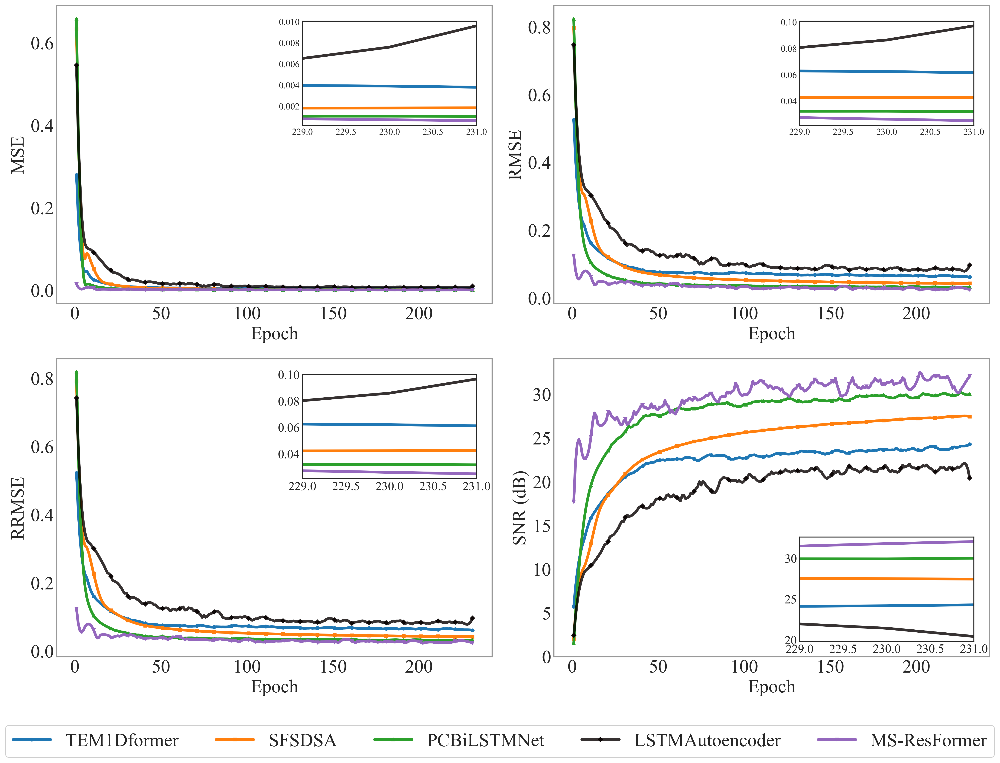

epochs_range length: 231


In [591]:
# --- 可视化原始空间指标 + 插入局部放大子图 ---
import numpy as np
from scipy.signal import savgol_filter
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# 计算 MSE
val_mses_1d = [rmse**2 for rmse in val_rmses_1d]
val_mses_dense = [rmse**2 for rmse in val_rmses_dense]
val_mses_pcbilstm = [rmse**2 for rmse in val_rmses_pcbilstm]
val_mses_lstm_auto = [rmse**2 for rmse in val_rmses_lstm_auto]
val_mses_resattpc = [rmse**2 for rmse in val_rmses_resattpc]

# 平滑函数
def smooth_data(data, window_length=11, polyorder=3):
    if len(data) < window_length:
        window_length = len(data) if len(data) % 2 == 1 else len(data) - 1
    if window_length < 3:
        return data
    return savgol_filter(data, window_length, polyorder)

# 设置绘图样式
plt.style.use('seaborn-v0_8-white')
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

# 创建2x2子图
fig, axes = plt.subplots(2, 2, figsize=(18, 14))
fig.patch.set_facecolor('white')

# 定义颜色、线型、标记
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', "#060000CE", '#9467bd', '#8c564b']
line_styles = ['-'] * 6  # 全部实线
markers = ['o', 's', '^', 'D', 'v', 'h']
labels = ['TEM1Dformer', 'SFSDSA', 'PCBiLSTMNet', 'AttPCTransformer', 'LSTMAutoencoder', 'MS-ResFormer']

epochs_range = range(1, len(val_mses_1d) + 1)
print(len(epochs_range))
# 定义子图插图位置和缩放区间
inset_epoch_start = 229

# 子图1: MSE
ax1 = axes[0, 0]
datasets_mse = [val_mses_1d, val_mses_dense, val_mses_pcbilstm, val_mses_lstm_auto, val_mses_resattpc]
for i, (data, label) in enumerate(zip(datasets_mse, [labels[0], labels[1], labels[2], labels[4], labels[5]])):
    smoothed_data = smooth_data(data)
    ax1.plot(epochs_range, smoothed_data, linestyle='-', color=colors[i], 
             linewidth=3.5, marker=markers[i], markersize=4, markevery=10, label=label)

# 插入局部放大
axins1 = inset_axes(ax1, width="40%", height="35%", loc='upper right', borderpad=2)
for i, data in enumerate(datasets_mse):
    smoothed_data = smooth_data(data)
    axins1.plot(epochs_range[inset_epoch_start-1:], smoothed_data[inset_epoch_start-1:], 
                linestyle='-', color=colors[i], linewidth=3.5)
axins1.set_xlim(inset_epoch_start, len(val_mses_1d))
axins1.tick_params(axis='both', which='major', labelsize=12)
axins1.grid(False)

ax1.set_xlabel('Epoch', fontsize=24, fontweight='normal')
ax1.set_ylabel('MSE', fontsize=24, fontweight='normal')
# ax1.set_title('Validation MSE', fontsize=24, fontweight='normal', pad=20)
ax1.tick_params(axis='both', which='major', labelsize=24)
ax1.grid(False)


# 子图2: RMSE
ax2 = axes[0, 1]
datasets_rmse = [val_rmses_1d, val_rmses_dense, val_rmses_pcbilstm, val_rmses_lstm_auto, val_rmses_resattpc]
for i, (data, label) in enumerate(zip(datasets_rmse, [labels[0], labels[1], labels[2], labels[4], labels[5]])):
    smoothed_data = smooth_data(data)
    ax2.plot(epochs_range, smoothed_data, linestyle='-', color=colors[i], 
             linewidth=3.5, marker=markers[i], markersize=4, markevery=10, label=label)

axins2 = inset_axes(ax2, width="40%", height="35%", loc='upper right', borderpad=2)
for i, data in enumerate(datasets_rmse):
    smoothed_data = smooth_data(data)
    axins2.plot(epochs_range[inset_epoch_start-1:], smoothed_data[inset_epoch_start-1:], 
                linestyle='-', color=colors[i], linewidth=3.5)
axins2.set_xlim(inset_epoch_start, len(val_mses_1d))
axins2.tick_params(axis='both', which='major', labelsize=12)
axins2.grid(False)

ax2.set_xlabel('Epoch', fontsize=24, fontweight='normal')
ax2.set_ylabel('RMSE', fontsize=24, fontweight='normal')
# ax2.set_title('Validation RMSE', fontsize=24, fontweight='normal', pad=20)
ax2.tick_params(axis='both', which='major', labelsize=24)
ax2.grid(False)

# 子图3: RRMSE
ax3 = axes[1, 0]
datasets_rrmse = [val_rrmses_1d, val_rrmses_dense, val_rrmses_pcbilstm, val_rrmses_lstm_auto, val_rrmses_resattpc]
for i, (data, label) in enumerate(zip(datasets_rrmse, [labels[0], labels[1], labels[2], labels[4], labels[5]])):
    smoothed_data = smooth_data(data)
    ax3.plot(epochs_range, smoothed_data, linestyle='-', color=colors[i], 
             linewidth=3.5, marker=markers[i], markersize=4, markevery=10, label=label)

axins3 = inset_axes(ax3, width="40%", height="35%", loc='upper right', borderpad=2)
for i, data in enumerate(datasets_rrmse):
    smoothed_data = smooth_data(data)
    axins3.plot(epochs_range[inset_epoch_start-1:], smoothed_data[inset_epoch_start-1:], 
                linestyle='-', color=colors[i], linewidth=3.5)
axins3.set_xlim(inset_epoch_start, len(val_mses_1d))
axins3.tick_params(axis='both', which='major', labelsize=16)
axins3.grid(False)

ax3.set_xlabel('Epoch', fontsize=24, fontweight='normal')
ax3.set_ylabel('RRMSE', fontsize=24, fontweight='normal')
# ax3.set_title('Validation RRMSE', fontsize=24, fontweight='normal', pad=20)
ax3.tick_params(axis='both', which='major', labelsize=24)
ax3.grid(False)

# 子图4: SNR
ax4 = axes[1, 1]
datasets_snr = [val_snrs_1d, val_snrs_dense, val_snrs_pcbilstm, val_snrs_lstm_auto, val_snrs_resattpc]
for i, (data, label) in enumerate(zip(datasets_snr, [labels[0], labels[1], labels[2], labels[4], labels[5]])):
    smoothed_data = smooth_data(data)
    ax4.plot(epochs_range, smoothed_data, linestyle='-', color=colors[i], 
             linewidth=3.5, marker=markers[i], markersize=4, markevery=10, label=label)

# 这里改为 lower right 放右下角
axins4 = inset_axes(ax4, width="40%", height="35%", loc='lower right', borderpad=2)
for i, data in enumerate(datasets_snr):
    smoothed_data = smooth_data(data)
    axins4.plot(epochs_range[inset_epoch_start-1:], smoothed_data[inset_epoch_start-1:], 
                linestyle='-', color=colors[i], linewidth=3.5)
axins4.set_xlim(inset_epoch_start, len(val_mses_1d))
axins4.tick_params(axis='both', which='major', labelsize=16)
axins4.grid(False)

ax4.set_xlabel('Epoch', fontsize=24, fontweight='normal')
ax4.set_ylabel('SNR (dB)', fontsize=24, fontweight='normal')
# ax4.set_title('Validation SNR', fontsize=24, fontweight='normal', pad=20)
ax4.tick_params(axis='both', which='major', labelsize=24)
ax4.grid(False)

# 设置子图边框
for ax in axes.flat:
    for spine in ax.spines.values():
        spine.set_color('#999999')
        spine.set_linewidth(1.5)

# 布局调整
plt.tight_layout(pad=2.0, rect=[0, 0.08, 1, 1])

# 图例放到底部
handles, labels_legend = ax1.get_legend_handles_labels()
fig.legend(handles, labels_legend, 
           loc='lower center',
           bbox_to_anchor=(0.5, 0.01),
           ncol=5,
           frameon=True,
           framealpha=0.95,
           fontsize=24,
           columnspacing=2.0,
           fancybox=True,
           shadow=False)

plt.show()
print('epochs_range length:', len(epochs_range))

C:\Users\USTC\AppData\Local\Temp\ipykernel_39860\2073824179.py:142: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=3.0, rect=[0, 0.08, 1, 1])


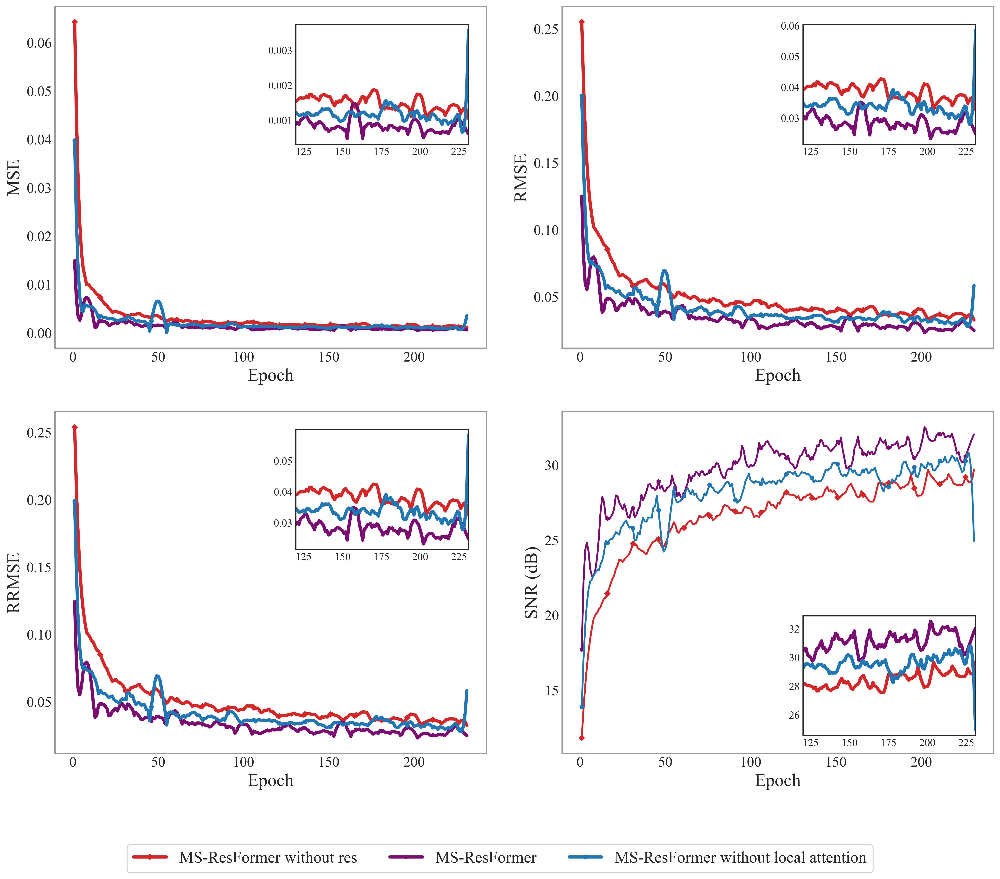

In [592]:
import numpy as np
from scipy.signal import savgol_filter
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# 平滑函数
def smooth_data(data, window_length=11, polyorder=3):
    if len(data) < window_length:
        window_length = len(data) if len(data) % 2 == 1 else len(data) - 1
    if window_length < 3:
        return data
    return savgol_filter(data, window_length, polyorder)

# 设置绘图样式
plt.style.use('seaborn-v0_8-white')
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['figure.dpi'] = 400
plt.rcParams['savefig.dpi'] = 300

# 创建2x2子图布局
fig, axes = plt.subplots(2, 2, figsize=(16, 14))
fig.patch.set_facecolor('white')

# 定义颜色和样式 - 针对三个模型
colors = ['#d62728', "#7a0b71", '#1f77b4']  # 红色、棕色、蓝色
markers = ['D', 'h', 'o']  # 菱形、六边形、圆形
labels = ['MS-ResFormer without res', 'MS-ResFormer', 'MS-ResFormer without local attention']

epochs_range = range(1, len(val_rmses_attpc) + 1)
inset_epoch_start = 120  # 嵌入子图从第120个epoch开始

# 计算MSE
val_mses_attpc = [rmse**2 for rmse in val_rmses_attpc]
val_mses_resattpc = [rmse**2 for rmse in val_rmses_resattpc]
val_mses_eq = [rmse**2 for rmse in val_rmses_eq]

# 子图1: MSE
ax1 = axes[0, 0]
datasets_mse = [val_mses_attpc, val_mses_resattpc, val_mses_eq]
for i, (data, label) in enumerate(zip(datasets_mse, labels)):
    smoothed_data = smooth_data(data)
    ax1.plot(epochs_range, smoothed_data, linestyle='-', color=colors[i], 
             linewidth=3.5, marker=markers[i], markersize=4, markevery=15, label=label)

# 创建嵌入子图 - MSE
axins1 = inset_axes(ax1, width="40%", height="35%", loc='upper right', borderpad=2)
for i, data in enumerate(datasets_mse):
    smoothed_data = smooth_data(data)
    axins1.plot(epochs_range[inset_epoch_start-1:], smoothed_data[inset_epoch_start-1:], 
                linestyle='-', color=colors[i], linewidth=3.5)
axins1.set_xlim(inset_epoch_start, len(val_rmses_attpc))
axins1.tick_params(axis='both', which='major', labelsize=12)
axins1.grid(False)

ax1.set_xlabel('Epoch', fontsize=20, fontweight='normal')
ax1.set_ylabel('MSE', fontsize=20, fontweight='normal')
# ax1.set_title('Validation MSE', fontsize=22, fontweight='normal', pad=20)
ax1.tick_params(axis='both', which='major', labelsize=16)
ax1.grid(False)

# 子图2: RMSE
ax2 = axes[0, 1]
datasets_rmse = [val_rmses_attpc, val_rmses_resattpc, val_rmses_eq]
for i, (data, label) in enumerate(zip(datasets_rmse, labels)):
    smoothed_data = smooth_data(data)
    ax2.plot(epochs_range, smoothed_data, linestyle='-', color=colors[i], 
             linewidth=3.5, marker=markers[i], markersize=4, markevery=15, label=label)

# 创建嵌入子图 - RMSE
axins2 = inset_axes(ax2, width="40%", height="35%", loc='upper right', borderpad=2)
for i, data in enumerate(datasets_rmse):
    smoothed_data = smooth_data(data)
    axins2.plot(epochs_range[inset_epoch_start-1:], smoothed_data[inset_epoch_start-1:], 
                linestyle='-', color=colors[i], linewidth=3.5)
axins2.set_xlim(inset_epoch_start, len(val_rmses_attpc))
axins2.tick_params(axis='both', which='major', labelsize=12)
axins2.grid(False)

ax2.set_xlabel('Epoch', fontsize=20, fontweight='normal')
ax2.set_ylabel('RMSE', fontsize=20, fontweight='normal')
# ax2.set_title('Validation RMSE', fontsize=22, fontweight='normal', pad=20)
ax2.tick_params(axis='both', which='major', labelsize=16)
ax2.grid(False)

# 子图3: RRMSE
ax3 = axes[1, 0]
datasets_rrmse = [val_rrmses_attpc, val_rrmses_resattpc, val_rrmses_eq]
for i, (data, label) in enumerate(zip(datasets_rrmse, labels)):
    smoothed_data = smooth_data(data)
    ax3.plot(epochs_range, smoothed_data, linestyle='-', color=colors[i], 
             linewidth=3.5, marker=markers[i], markersize=4, markevery=15, label=label)

# 创建嵌入子图 - RRMSE
axins3 = inset_axes(ax3, width="40%", height="35%", loc='upper right', borderpad=2)
for i, data in enumerate(datasets_rrmse):
    smoothed_data = smooth_data(data)
    axins3.plot(epochs_range[inset_epoch_start-1:], smoothed_data[inset_epoch_start-1:], 
                linestyle='-', color=colors[i], linewidth=3.5)
axins3.set_xlim(inset_epoch_start, len(val_rmses_attpc))
axins3.tick_params(axis='both', which='major', labelsize=12)
axins3.grid(False)

ax3.set_xlabel('Epoch', fontsize=20, fontweight='normal')
ax3.set_ylabel('RRMSE', fontsize=20, fontweight='normal')
# ax3.set_title('Validation RRMSE', fontsize=22, fontweight='normal', pad=20)
ax3.tick_params(axis='both', which='major', labelsize=16)
ax3.grid(False)

# 子图4: SNR
ax4 = axes[1, 1]
datasets_snr = [val_snrs_attpc, val_snrs_resattpc, val_snrs_eq]
for i, (data, label) in enumerate(zip(datasets_snr, labels)):
    smoothed_data = smooth_data(data)
    ax4.plot(epochs_range, smoothed_data, linestyle='-', color=colors[i], 
             linewidth=2, marker=markers[i], markersize=4, markevery=15, label=label)

# 创建嵌入子图 - SNR (位置在右下角，因为SNR越高越好)
axins4 = inset_axes(ax4, width="40%", height="35%", loc='lower right', borderpad=2)
for i, data in enumerate(datasets_snr):
    smoothed_data = smooth_data(data)
    axins4.plot(epochs_range[inset_epoch_start-1:], smoothed_data[inset_epoch_start-1:], 
                linestyle='-', color=colors[i], linewidth=3.5)
axins4.set_xlim(inset_epoch_start, len(val_rmses_attpc))
axins4.tick_params(axis='both', which='major', labelsize=12)
axins4.grid(False)

ax4.set_xlabel('Epoch', fontsize=20, fontweight='normal')
ax4.set_ylabel('SNR (dB)', fontsize=20, fontweight='normal')
# ax4.set_title('Validation SNR', fontsize=22, fontweight='normal', pad=20)
ax4.tick_params(axis='both', which='major', labelsize=16)
ax4.grid(False)

# 设置所有子图的边框
for ax in axes.flat:
    for spine in ax.spines.values():
        spine.set_color('#999999')
        spine.set_linewidth(1.5)

# 调整子图布局，为底部图例预留空间
plt.tight_layout(pad=3.0, rect=[0, 0.08, 1, 1])

# 创建统一的图例，放在整张图的底部
handles, labels_legend = ax1.get_legend_handles_labels()
fig.legend(handles, labels_legend, 
          loc='lower center',
          bbox_to_anchor=(0.5, 0.01),
          ncol=3,
          frameon=True,
          framealpha=0.95,
          fontsize=18,
          columnspacing=2.0,
          fancybox=True,
          shadow=False)

plt.show()


In [593]:
# 修改颜色、标记和标签列表 - 现在有四个模型
colors = ['#d62728', "#7a0b71", '#1f77b4', '#2ca02c']  # 红色、紫色、蓝色、绿色
markers = ['D', 'h', 'o', 's']  # 菱形、六边形、圆形、正方形
labels = ['MS-ResFormer without res', 'MS-ResFormer', 'MS-ResFormer without local attention', 'MS-ResFormer without attention']

# 计算MSE - 添加第四个模型
val_mses_nore_atten = [rmse**2 for rmse in val_rmses_nores_atten]  # 假设有这个数据

# 子图1: MSE - 添加第四个数据集
ax1 = axes[0, 0]
datasets_mse = [val_mses_attpc, val_mses_resattpc, val_mses_eq, val_mses_nore_atten]
for i, (data, label) in enumerate(zip(datasets_mse, labels)):
    smoothed_data = smooth_data(data)
    ax1.plot(epochs_range, smoothed_data, linestyle='-', color=colors[i], 
             linewidth=3.5, marker=markers[i], markersize=4, markevery=15, label=label)

# 创建嵌入子图 - MSE (同样添加第四个模型)
axins1 = inset_axes(ax1, width="40%", height="35%", loc='upper right', borderpad=2)
for i, data in enumerate(datasets_mse):
    smoothed_data = smooth_data(data)
    axins1.plot(epochs_range[inset_epoch_start-1:], smoothed_data[inset_epoch_start-1:], 
                linestyle='-', color=colors[i], linewidth=3.5)

# 子图2: RMSE - 添加第四个数据集
ax2 = axes[0, 1]
datasets_rmse = [val_rmses_attpc, val_rmses_resattpc, val_rmses_eq, val_rmses_nores_atten]
for i, (data, label) in enumerate(zip(datasets_rmse, labels)):
    smoothed_data = smooth_data(data)
    ax2.plot(epochs_range, smoothed_data, linestyle='-', color=colors[i], 
             linewidth=3.5, marker=markers[i], markersize=4, markevery=15, label=label)

# 子图3: RRMSE - 添加第四个数据集
ax3 = axes[1, 0]
datasets_rrmse = [val_rrmses_attpc, val_rrmses_resattpc, val_rrmses_eq, val_rrmses_nores_atten]
for i, (data, label) in enumerate(zip(datasets_rrmse, labels)):
    smoothed_data = smooth_data(data)
    ax3.plot(epochs_range, smoothed_data, linestyle='-', color=colors[i], 
             linewidth=3.5, marker=markers[i], markersize=4, markevery=15, label=label)

# 子图4: SNR - 添加第四个数据集
ax4 = axes[1, 1]
datasets_snr = [val_snrs_attpc, val_snrs_resattpc, val_snrs_eq, val_snrs_nores_atten]
for i, (data, label) in enumerate(zip(datasets_snr, labels)):
    smoothed_data = smooth_data(data)
    ax4.plot(epochs_range, smoothed_data, linestyle='-', color=colors[i], 
             linewidth=3.5, marker=markers[i], markersize=4, markevery=15, label=label)

# 调整图例布局 (因为现在有4个模型，可能需要调整列数或位置)
plt.tight_layout(pad=3.0, rect=[0, 0.08, 1, 1])  # 可能需要调整rect参数

# 创建统一的图例 - 现在有4个模型
handles, labels_legend = ax1.get_legend_handles_labels()
fig.legend(handles, labels_legend, 
          loc='lower center',
          bbox_to_anchor=(0.5, 0.01),
          ncol=2,  # 改为2列，每列2个模型
          frameon=True,
          framealpha=0.95,
          fontsize=18,
          columnspacing=2.0,
          fancybox=True,
          shadow=False)
plt.show()

<Figure size 2560x1920 with 0 Axes>

In [594]:
# --- 各模型测试集性能评估 ---
def eval_on_testset(model, model_name, scaler1, scaler2, test_loader, device):
    model.eval()
    preds = []
    targets = []
    noisys = []
    with torch.no_grad():
        for noisy_batch, clean_batch in test_loader:
            noisy_batch = noisy_batch.to(device)
            clean_batch = clean_batch.to(device)
            output = model(noisy_batch)
            preds.append(output.cpu())
            targets.append(clean_batch.cpu())
            noisys.append(noisy_batch.cpu())
    preds = torch.cat(preds, dim=0)
    targets = torch.cat(targets, dim=0)
    noisys = torch.cat(noisys, dim=0)

    def inverse_transform(tensor, scaler):
        arr = tensor.detach().cpu().numpy().squeeze(1)
        arr = scaler.inverse_transform(arr)
        arr = 10 ** arr
        return arr

    y_pred = inverse_transform(preds, scaler2)
    y_true = inverse_transform(targets, scaler2)
    x_noisy = inverse_transform(noisys, scaler1)

    mse = np.mean((y_true - y_pred) ** 2)
    rmse = np.sqrt(mse)
    rrmse = np.sqrt(np.mean((y_true - y_pred) ** 2) / np.mean(y_true ** 2))
    snr = np.mean(10 * np.log10(np.sum(y_true ** 2, axis=1) / (np.sum((y_true - y_pred) ** 2, axis=1) + 1e-8)))
    original_snr = np.mean(10 * np.log10(np.sum(y_true ** 2, axis=1) / (np.sum((y_true - x_noisy) ** 2, axis=1) + 1e-8)))

    print(f'【{model_name}】测试集 MSE: {mse:.6f}')
    print(f'【{model_name}】测试集 RMSE: {rmse:.6f}')
    print(f'【{model_name}】测试集 RRMSE: {rrmse:.6f}')
    print(f'【{model_name}】测试集 SNR: {snr:.2f} dB')
    print(f'【{model_name}】测试集原始输入 SNR: {original_snr:.2f} dB\n')

# eval_on_testset(model_no_local, "EQTransformer", scaler1, scaler2, test_loader, device)
eval_on_testset(model_1d, "TEM1Dformer", scaler1, scaler2, test_loader, device)
eval_on_testset(model_dense, "SFSDSA", scaler1, scaler2, test_loader, device)
eval_on_testset(model_pcbilstm, "PCBiLSTMNet", scaler1, scaler2, test_loader, device)
eval_on_testset(model_no_res, "AttPCTransformer", scaler1, scaler2, test_loader, device)

【TEM1Dformer】测试集 MSE: 0.000000
【TEM1Dformer】测试集 RMSE: 0.000000
【TEM1Dformer】测试集 RRMSE: 0.053776
【TEM1Dformer】测试集 SNR: -10.97 dB
【TEM1Dformer】测试集原始输入 SNR: -10.97 dB

【SFSDSA】测试集 MSE: 0.000000
【SFSDSA】测试集 RMSE: 0.000000
【SFSDSA】测试集 RRMSE: 0.022098
【SFSDSA】测试集 SNR: -10.97 dB
【SFSDSA】测试集原始输入 SNR: -10.97 dB

【PCBiLSTMNet】测试集 MSE: 0.000000
【PCBiLSTMNet】测试集 RMSE: 0.000000
【PCBiLSTMNet】测试集 RRMSE: 0.021431
【PCBiLSTMNet】测试集 SNR: -10.97 dB
【PCBiLSTMNet】测试集原始输入 SNR: -10.97 dB

【AttPCTransformer】测试集 MSE: 0.000000
【AttPCTransformer】测试集 RMSE: 0.000000
【AttPCTransformer】测试集 RRMSE: 0.023470
【AttPCTransformer】测试集 SNR: -10.97 dB
【AttPCTransformer】测试集原始输入 SNR: -10.97 dB



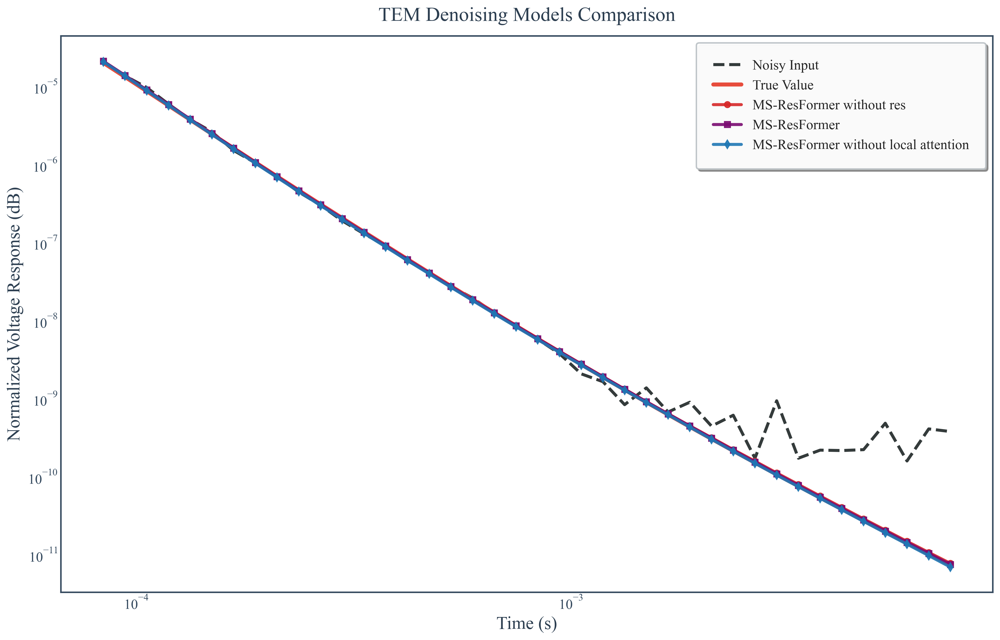

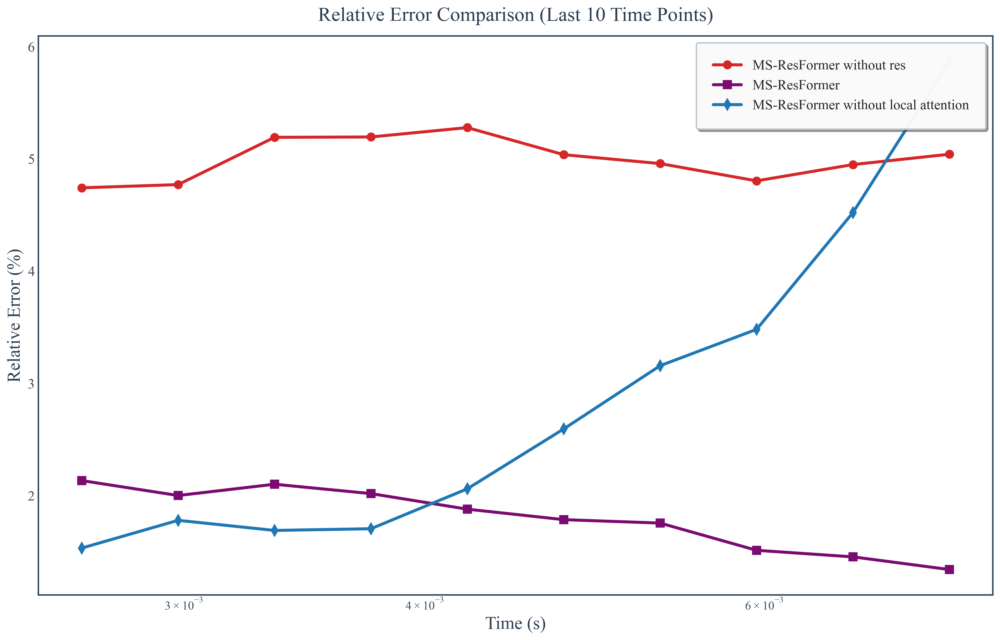

In [595]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from collections import OrderedDict

# --- 假设以下模型定义和scaler已提前导入 ---
# from your_model_file import MSTransformerNet_nores, MSTransformerNet, MSTransformerNet_noatt
# scaler1, scaler2 也要提前定义和加载

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# 1. 加载 MS-ResFormer without res 模型
model_nores = AttentivePCTransformerNet().to(device)
state_dict_nores = torch.load('model_no_res.pth', map_location=device)
new_state_dict_nores = OrderedDict()
for k, v in state_dict_nores.items():
    name = k.replace('module.', '')
    new_state_dict_nores[name] = v
model_nores.load_state_dict(new_state_dict_nores)
model_nores.eval()

# 2. 加载 MS-ResFormer 模型
model_resatt = MSTransformerNet().to(device)
state_dict_resatt = torch.load('model_resattpc.pth', map_location=device)
new_state_dict_resatt = OrderedDict()
for k, v in state_dict_resatt.items():
    name = k.replace('module.', '')
    new_state_dict_resatt[name] = v
model_resatt.load_state_dict(new_state_dict_resatt)
model_resatt.eval()

# 3. 加载 MS-ResFormer without local attention 模型
model_noatt = ResAttentiveDownUpNet().to(device)
state_dict_noatt = torch.load('model_no_local.pth', map_location=device)
new_state_dict_noatt = OrderedDict()
for k, v in state_dict_noatt.items():
    name = k.replace('module.', '')
    new_state_dict_noatt[name] = v
model_noatt.load_state_dict(new_state_dict_noatt)
model_noatt.eval()

# 4. 准备样本数据
sample_idx = 2000
noisy_sample, clean_sample = test_dataset[sample_idx]
noisy_sample = noisy_sample.unsqueeze(0).to(device)
clean_sample = clean_sample.unsqueeze(0).to(device)

# 5. 推理
with torch.no_grad():
    output_nores = model_nores(noisy_sample)
    output_resatt = model_resatt(noisy_sample)
    output_noatt = model_noatt(noisy_sample)

# 6. 反归一化函数
def inverse_transform(tensor, scaler):
    arr = tensor.detach().cpu().numpy().squeeze(1)
    arr = scaler.inverse_transform(arr)
    arr = 10 ** arr
    return arr

# 反归一化
y_true = inverse_transform(clean_sample, scaler2)
x_noisy = inverse_transform(noisy_sample, scaler1)
y_pred_nores = inverse_transform(output_nores, scaler2)
y_pred_resatt = inverse_transform(output_resatt, scaler2)
y_pred_noatt = inverse_transform(output_noatt, scaler2)

# 7. 时间轴
t = np.array([
    8.39966e-05, 9.42457e-05, 1.05745e-04, 1.18648e-04, 1.33126e-04,
    1.49369e-04, 1.67595e-04, 1.88045e-04, 2.10990e-04, 2.36734e-04,
    2.65620e-04, 2.98031e-04, 3.34396e-04, 3.75199e-04, 4.20980e-04,
    4.72347e-04, 5.29982e-04, 5.94650e-04, 6.67208e-04, 7.48620e-04,
    8.39966e-04, 9.42457e-04, 1.05745e-03, 1.18648e-03, 1.33126e-03,
    1.49369e-03, 1.67595e-03, 1.88045e-03, 2.10990e-03, 2.36734e-03,
    2.65620e-03, 2.98031e-03, 3.34396e-03, 3.75199e-03, 4.20980e-03,
    4.72347e-03, 5.29982e-03, 5.94650e-03, 6.67208e-03, 7.48620e-03
])
t = t[:y_true.shape[1]]

# 8. 画图风格设置
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': 'Times New Roman',
    'axes.unicode_minus': False,
    'figure.dpi': 300,
    'savefig.dpi': 300
})

colors = ['#d62728', "#7a0b71", '#1f77b4']  # 代码一颜色
labels = ['MS-ResFormer without res', 'MS-ResFormer', 'MS-ResFormer without local attention']
markers = ['o', 's', 'd']

# =======================
# 第一张图：模型预测对比
# =======================
fig, ax = plt.subplots(figsize=(14, 9))
fig.patch.set_facecolor('white')
ax.set_facecolor('white')

ax.loglog(t, x_noisy[0], '--', color="#010A0A", linewidth=3, alpha=0.8, label='Noisy Input')
ax.loglog(t, y_true[0], '-', color="#E74C3C", linewidth=4.0, alpha=1.0, label='True Value')

ax.loglog(t, y_pred_nores[0], marker=markers[0], linestyle='-', color=colors[0], linewidth=3, alpha=0.9, label=labels[0])
ax.loglog(t, y_pred_resatt[0], marker=markers[1], linestyle='-', color=colors[1], linewidth=3, alpha=0.9, label=labels[1])
ax.loglog(t, y_pred_noatt[0], marker=markers[2], linestyle='-', color=colors[2], linewidth=3, alpha=0.9, label=labels[2])

ax.set_xlabel('Time (s)', fontsize=18, fontweight='normal', color='#2C3E50')
ax.set_ylabel('Normalized Voltage Response (dB)', fontsize=18, fontweight='normal', color='#2C3E50')
ax.set_title('TEM Denoising Models Comparison', fontsize=20, fontweight='normal', color='#2C3E50', pad=15)

legend = ax.legend(frameon=True, loc='upper right', framealpha=0.95,
                   edgecolor='#BDC3C7', facecolor='white',
                   fontsize=14, shadow=True, fancybox=True, borderpad=1.2)
legend.get_frame().set_linewidth(1.5)

ax.tick_params(axis='both', which='major', labelsize=14, colors='#34495E', width=1.5)
ax.tick_params(axis='both', which='minor', labelsize=12, colors='#34495E', width=1.0)
for spine in ax.spines.values():
    spine.set_color('#34495E')
    spine.set_linewidth(1.5)

plt.tight_layout()
plt.show()

# =======================
# 第二张图：相对误差对比
# =======================
rel_error_nores = np.abs((y_pred_nores[0] - y_true[0]) / y_true[0]) * 100
rel_error_resatt = np.abs((y_pred_resatt[0] - y_true[0]) / y_true[0]) * 100
rel_error_noatt = np.abs((y_pred_noatt[0] - y_true[0]) / y_true[0]) * 100

fig, ax = plt.subplots(figsize=(14, 9))
fig.patch.set_facecolor('white')
ax.set_facecolor('white')

ax.semilogx(t[-10:], rel_error_nores[-10:], '-o', color=colors[0], linewidth=3, markersize=8, label=labels[0])
ax.semilogx(t[-10:], rel_error_resatt[-10:], '-s', color=colors[1], linewidth=3, markersize=8, label=labels[1])
ax.semilogx(t[-10:], rel_error_noatt[-10:], '-d', color=colors[2], linewidth=3, markersize=8, label=labels[2])

ax.set_xlabel('Time (s)', fontsize=18, fontweight='normal', color='#2C3E50')
ax.set_ylabel('Relative Error (%)', fontsize=18, fontweight='normal', color='#2C3E50')
ax.set_title('Relative Error Comparison (Last 10 Time Points)', fontsize=20, fontweight='normal', color='#2C3E50', pad=15)

legend = ax.legend(frameon=True, loc='upper right', framealpha=0.95,
                   edgecolor='#BDC3C7', facecolor='white',
                   fontsize=14, shadow=True, fancybox=True, borderpad=1.2)
legend.get_frame().set_linewidth(1.5)

ax.tick_params(axis='both', which='major', labelsize=14, colors='#34495E', width=1.5)
ax.tick_params(axis='both', which='minor', labelsize=12, colors='#34495E', width=1.0)
for spine in ax.spines.values():
    spine.set_color('#34495E')
    spine.set_linewidth(1.5)

plt.tight_layout()
plt.show()


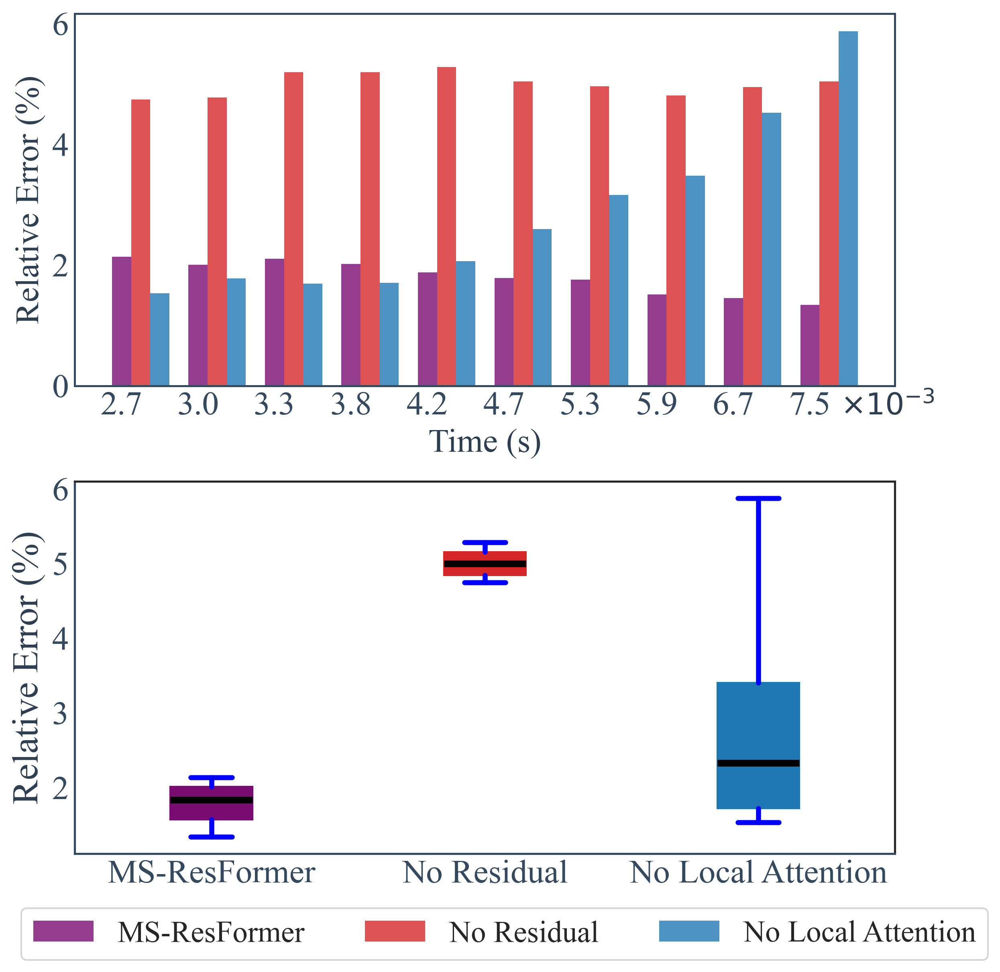

In [596]:
import matplotlib.pyplot as plt
import numpy as np

# 假设你已经有这些数据
# t, rel_error_resatt, rel_error_nores, rel_error_noatt, colors, labels

time_points = t[-10:]
x = np.arange(len(time_points))
width = 0.25

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 8))
fig.patch.set_facecolor('white')
ax1.set_facecolor('white')
ax2.set_facecolor('white')

# ================== 第一张图：条形图 ==================
ax1.bar(x, rel_error_resatt[-10:], width=width, color=colors[1], label='MS-ResFormer', alpha=0.8)
ax1.bar(x + width, rel_error_nores[-10:], width=width, color=colors[0], label='No Residual', alpha=0.8)
ax1.bar(x + 2*width, rel_error_noatt[-10:], width=width, color=colors[2], label='No Local Attention', alpha=0.8)

# x轴只显示等间隔时间点
num_ticks = 10
indices_to_show = np.linspace(0, len(time_points) - 1, num_ticks, dtype=int)
time_labels = [f'{time_points[i]*1e3:.1f}' for i in indices_to_show]
ax1.set_xticks(x[indices_to_show])
ax1.set_xticklabels(time_labels, rotation=0, fontsize=20, fontweight='normal')

# 在最后一个刻度右边放置单位
x_last = x[indices_to_show[-1]]
ax1.text(x_last + 0.4, -0.1, r'$\times 10^{-3}$', fontsize=18, fontweight='normal', ha='left', va='top', color='#2C3E50')

ax1.set_xlabel('Time (s)', fontsize=20, fontweight='normal', color='#2C3E50')
ax1.set_ylabel('Relative Error (%)', fontsize=20, fontweight='normal', color='#2C3E50')
ax1.tick_params(axis='both', which='major', labelsize=20, colors='#34495E', width=1.2)
ax1.tick_params(axis='both', which='minor', labelsize=20, colors='#34495E', width=1.0)
for spine in ax1.spines.values():
    spine.set_color('#34495E')
    spine.set_linewidth(1.2)

# ================== 第二张图：箱型图 ==================
data = [rel_error_resatt[-10:], rel_error_nores[-10:], rel_error_noatt[-10:]]
box_labels = ['MS-ResFormer', 'No Residual', 'No Local Attention']

box = ax2.boxplot(data, patch_artist=True,
                  medianprops=dict(color='black', linewidth=4),   # 中位线改为黑色
                  whiskerprops=dict(color='blue', linewidth=3),
                  capprops=dict(color='blue', linewidth=3),
                  flierprops=dict(markerfacecolor='red', marker='o', markersize=18, linestyle='none'))

# 设置 box 颜色和 bar 对应
for patch, color in zip(box['boxes'], [colors[1], colors[0], colors[2]]):
    patch.set_facecolor(color)
    patch.set_edgecolor(color)

ax2.set_xticks([1, 2, 3])
ax2.set_xticklabels(box_labels, fontsize=20, fontweight='normal')
ax2.set_ylabel('Relative Error (%)', fontsize=22, fontweight='normal', color='#2C3E50')
ax2.tick_params(axis='x', labelsize=20, colors='#34495E', width=1.2)
ax2.tick_params(axis='y', labelsize=20, colors='#34495E', width=1.2)
for label in ax2.get_xticklabels():
    label.set_fontweight('normal')

ax2.spines['bottom'].set_color('#34495E')
ax2.spines['left'].set_color('#34495E')

# ================== 统一图例 ==================
fig.legend(
    box_labels,
    loc='lower center',
    bbox_to_anchor=(0.53, -0.02),   # 在整个 figure 下方
    fontsize=18,
    ncol=3,
    frameon=True
)

plt.tight_layout(rect=[0, 0.05, 1, 1])  # 给 legend 留空间
plt.show()


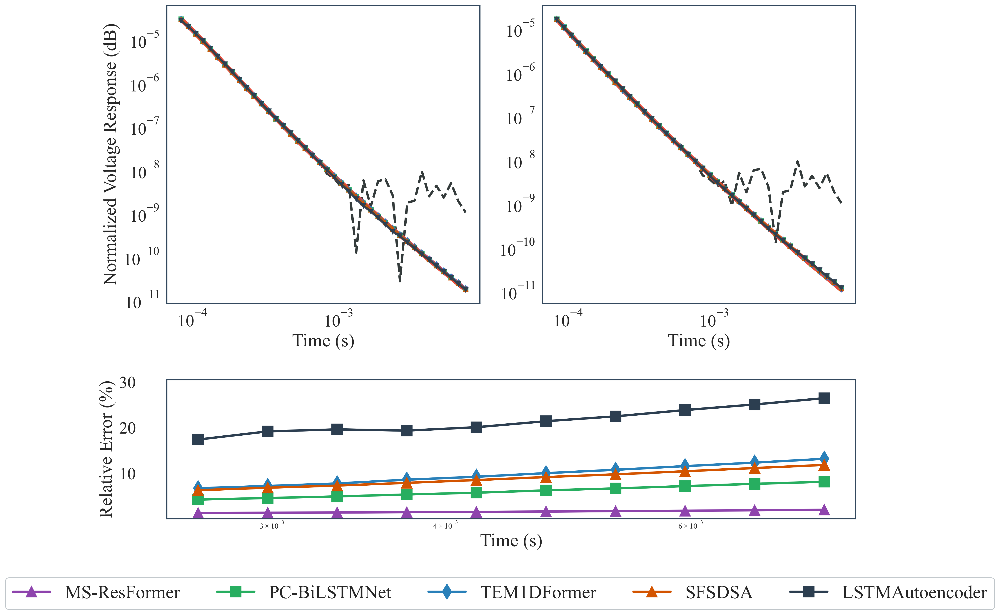

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec

# ========================
# 1. 设备
# ========================
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ========================
# 2. 加载 SFSDSA 和 LSTMAutoencoder 模型
# ========================
# SFSDSA
# ---------- 加载 SFSDSA ----------
model_sfsdsa = SFSDSA().to(device)  # 替换成你的 SFSDSA 模型类
checkpoint_sfsdsa = torch.load('model_denseae.pth', map_location=device)

# 去掉 module. 前缀
from collections import OrderedDict
new_state_dict = OrderedDict()
for k, v in checkpoint_sfsdsa.items():
    name = k.replace('module.', '')  # 去掉 module.
    new_state_dict[name] = v

model_sfsdsa.load_state_dict(new_state_dict)
model_sfsdsa.eval()


model_lstm_auto = LSTMAutoencoderNet().to(device)
checkpoint_lstm_auto = torch.load('model_lstm_auto.pth', map_location=device)

new_state_dict_auto = OrderedDict()
for k, v in checkpoint_lstm_auto.items():
    name = k.replace('module.', '')
    new_state_dict_auto[name] = v

model_lstm_auto.load_state_dict(new_state_dict_auto)
model_lstm_auto.eval()


# ========================
# 3. 反归一化函数
# ========================
def inv(tensor, scaler):
    arr = tensor.detach().cpu().numpy().squeeze(1)
    arr = scaler.inverse_transform(arr)
    return 10**arr

# ========================
# 4. 时间轴
# ========================
t = np.array([
    8.39966e-05, 9.42457e-05, 1.05745e-04, 1.18648e-04, 1.33126e-04,
    1.49369e-04, 1.67595e-04, 1.88045e-04, 2.10990e-04, 2.36734e-04,
    2.65620e-04, 2.98031e-04, 3.34396e-04, 3.75199e-04, 4.20980e-04,
    4.72347e-04, 5.29982e-04, 5.94650e-04, 6.67208e-04, 7.48620e-04,
    8.39966e-04, 9.42457e-04, 1.05745e-03, 1.18648e-03, 1.33126e-03,
    1.49369e-03, 1.67595e-03, 1.88045e-03, 2.10990e-03, 2.36734e-03,
    2.65620e-03, 2.98031e-03, 3.34396e-03, 3.75199e-03, 4.20980e-03,
    4.72347e-03, 5.29982e-03, 5.94650e-03, 6.67208e-03, 7.48620e-03
])
t_tail = t[-10:]

# ========================
# 5. 颜色、标签、标记
# ========================
colors = ['#8E44AD', '#27AE60', '#2980B9', '#D35400', '#2C3E50']
labels = ['MS-ResFormer', 'PC-BiLSTMNet', 'TEM1DFormer', 'SFSDSA', 'LSTMAutoencoder']
markers = ['o', 's', 'd', '^', 'v']

# ========================
# 6. 画布设置
# ========================
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'axes.unicode_minus': False,
    'figure.dpi': 300,
    'savefig.dpi': 300
})
fig = plt.figure(figsize=(16, 12), facecolor='white')
gs = gridspec.GridSpec(2, 2, height_ratios=[3, 1.4], hspace=0.35, wspace=0.2)

# ========================
# 7. 上半部分：两个样本 loglog 曲线
# ========================
sample_idx_list = [10, 2001]

for i, sample_idx in enumerate(sample_idx_list):
    noisy_sample, clean_sample = test_dataset[sample_idx]
    noisy_sample = noisy_sample.unsqueeze(0).to(device)
    clean_sample = clean_sample.unsqueeze(0).to(device)

    with torch.no_grad():
        out_resatt = model_resatt(noisy_sample)
        out_pcbilstm = model_pcbilstm(noisy_sample)
        out_1d = model_1d(noisy_sample)
        out_sfsdsa = model_sfsdsa(noisy_sample)
        out_lstm_auto = model_lstm_auto(noisy_sample)

    y_true = inv(clean_sample, scaler2)
    x_noisy = inv(noisy_sample, scaler1)
    y_resatt = inv(out_resatt, scaler2)
    y_pcbilstm = inv(out_pcbilstm, scaler2)
    y_1d = inv(out_1d, scaler2)
    y_sfsdsa = inv(out_sfsdsa, scaler2)
    y_lstm_auto = inv(out_lstm_auto, scaler2)

    ax = fig.add_subplot(gs[0, i])
    ax.set_facecolor('white')

    ax.loglog(t, x_noisy[0], '--', color="#010A0A", linewidth=3, alpha=0.8, label='Noisy Input')
    ax.loglog(t, y_true[0], '-', color="#E74C3C", linewidth=6, alpha=1.0, label='True Value')
    ax.loglog(t, y_resatt[0], marker=markers[0], linestyle='-', color=colors[0], linewidth=3, alpha=0.9, label=labels[0])
    ax.loglog(t, y_pcbilstm[0], marker=markers[1], linestyle='-', color=colors[1], linewidth=3, alpha=0.9, label=labels[1])
    ax.loglog(t, y_1d[0], marker=markers[2], linestyle='-.', color=colors[2], linewidth=3, alpha=0.9, label=labels[2])
    ax.loglog(t, y_sfsdsa[0], marker=markers[3], linestyle='-', color=colors[3], linewidth=3, alpha=0.9, label=labels[3])
    ax.loglog(t, y_lstm_auto[0], marker=markers[4], linestyle='-', color=colors[4], linewidth=3, alpha=0.9, label=labels[4])

    ax.set_xlabel('Time (s)', fontsize=24)
    if i == 0:
        ax.set_ylabel('Normalized Voltage Response (dB)', fontsize=24)

    ax.tick_params(axis='both', labelsize=22, pad=10)
    for spine in ax.spines.values():
        spine.set_color('#34495E'); spine.set_linewidth(1.5)

# ========================
# 8. 下半部分：测试集平均误差
# ========================
all_err_resatt, all_err_pcbilstm, all_err_1d = [], [], []
all_err_sfsdsa, all_err_lstm_auto = [], []

for noisy_sample, clean_sample in test_dataset:
    noisy_sample = noisy_sample.unsqueeze(0).to(device)
    clean_sample = clean_sample.unsqueeze(0).to(device)

    with torch.no_grad():
        out_resatt = model_resatt(noisy_sample)
        out_pcbilstm = model_pcbilstm(noisy_sample)
        out_1d = model_1d(noisy_sample)
        out_sfsdsa = model_sfsdsa(noisy_sample)
        out_lstm_auto = model_lstm_auto(noisy_sample)

    y_true = inv(clean_sample, scaler2)
    y_resatt = inv(out_resatt, scaler2)
    y_pcbilstm = inv(out_pcbilstm, scaler2)
    y_1d = inv(out_1d, scaler2)
    y_sfsdsa = inv(out_sfsdsa, scaler2)
    y_lstm_auto = inv(out_lstm_auto, scaler2)

    all_err_resatt.append(np.abs((y_resatt[0] - y_true[0]) / y_true[0]) * 100)
    all_err_pcbilstm.append(np.abs((y_pcbilstm[0] - y_true[0]) / y_true[0]) * 100)
    all_err_1d.append(np.abs((y_1d[0] - y_true[0]) / y_true[0]) * 100)
    all_err_sfsdsa.append(np.abs((y_sfsdsa[0] - y_true[0]) / y_true[0]) * 100)
    all_err_lstm_auto.append(np.abs((y_lstm_auto[0] - y_true[0]) / y_true[0]) * 100)


    

mean_err_resatt = np.array(all_err_resatt).mean(axis=0)
mean_err_pcbilstm = np.array(all_err_pcbilstm).mean(axis=0)
mean_err_1d = np.array(all_err_1d).mean(axis=0)
mean_err_sfsdsa = np.array(all_err_sfsdsa).mean(axis=0)
mean_err_lstm_auto = np.array(all_err_lstm_auto).mean(axis=0)

err_resatt_tail = mean_err_resatt[-10:]
err_pcbilstm_tail = mean_err_pcbilstm[-10:] 
err_1d_tail = mean_err_1d[-10:] 
err_sfsdsa_tail = mean_err_sfsdsa[-10:]
err_lstm_auto_tail = mean_err_lstm_auto[-10:]

ax_err = fig.add_subplot(gs[1, :])
ax_err.set_facecolor('white')

ax_err.semilogx(t_tail, err_resatt_tail, '-^', color=colors[0], linewidth=3, markersize=14, label=labels[0])
ax_err.semilogx(t_tail, err_pcbilstm_tail, '-s', color=colors[1], linewidth=3, markersize=14, label=labels[1])
ax_err.semilogx(t_tail, err_1d_tail, '-d', color=colors[2], linewidth=3, markersize=14, label=labels[2])
ax_err.semilogx(t_tail, err_sfsdsa_tail, '-^', color=colors[3], linewidth=3, markersize=14, label=labels[3])
ax_err.semilogx(t_tail, err_lstm_auto_tail, '-s', color=colors[4], linewidth=3, markersize=14, label=labels[4])

ymin, ymax = ax_err.get_ylim()
ax_err.set_ylim(ymin * 0.9, ymax * 1.1)
ax_err.set_xlabel('Time (s)', fontsize=24)
ax_err.set_ylabel('Relative Error (%)', fontsize=24)

ax_err.tick_params(axis='both', labelsize=22, pad=40)
for spine in ax_err.spines.values():
    spine.set_color('#34495E'); spine.set_linewidth(1.5)

# ========================
# 9. 图例
# ========================
handles, labels_combined = ax_err.get_legend_handles_labels()
fig.legend(
    handles, labels_combined,
    loc='lower center',
    bbox_to_anchor=(0.5, -0.04),
    ncol=5,
    frameon=True,
    framealpha=0.95,
    fontsize=24,
    columnspacing=2.0,
    fancybox=True,
    shadow=False,
    edgecolor='#BDC3C7',
    facecolor='white'
)

plt.show()


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec

# ========== 1. 加载模型 & 数据处理 ==========
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# (略：加载 model_resatt、model_pcbilstm、model_1d，和 scaler1, scaler2)

# 反归一化函数
def inv(tensor, scaler):
    arr = tensor.detach().cpu().numpy().squeeze(1)
    arr = scaler.inverse_transform(arr)
    return 10**arr

# 时间轴
t = np.array([
    8.39966e-05, 9.42457e-05, 1.05745e-04, 1.18648e-04, 1.33126e-04,
    1.49369e-04, 1.67595e-04, 1.88045e-04, 2.10990e-04, 2.36734e-04,
    2.65620e-04, 2.98031e-04, 3.34396e-04, 3.75199e-04, 4.20980e-04,
    4.72347e-04, 5.29982e-04, 5.94650e-04, 6.67208e-04, 7.48620e-04,
    8.39966e-04, 9.42457e-04, 1.05745e-03, 1.18648e-03, 1.33126e-03,
    1.49369e-03, 1.67595e-03, 1.88045e-03, 2.10990e-03, 2.36734e-03,
    2.65620e-03, 2.98031e-03, 3.34396e-03, 3.75199e-03, 4.20980e-03,
    4.72347e-03, 5.29982e-03, 5.94650e-03, 6.67208e-03, 7.48620e-03
])
t_tail = t[-10:]

colors = ['#8E44AD', '#27AE60', "#2980B9"]
labels = ['MS-ResFormer', 'PC-BiLSTMNet', 'TEM1DFormer']
markers = ['o', 's', 'd']

# ========== 2. 准备画布 ==========
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': 'Times New Roman',
    'axes.unicode_minus': False,
    'figure.dpi': 300,
    'savefig.dpi': 300
})

fig = plt.figure(figsize=(16, 12), facecolor='white')
gs = gridspec.GridSpec(2, 2, height_ratios=[3, 1.4], hspace=0.35, wspace=0.2)

# ========== 3. 上半部分：两个样本 loglog 曲线 ==========
sample_idx_list = [12, 2001]

for i, sample_idx in enumerate(sample_idx_list):
    noisy_sample, clean_sample = test_dataset[sample_idx]
    noisy_sample = noisy_sample.unsqueeze(0).to(device)
    clean_sample = clean_sample.unsqueeze(0).to(device)

    with torch.no_grad():
        out_resatt = model_resatt(noisy_sample)
        out_pcbilstm = model_pcbilstm(noisy_sample)
        out_1d = model_1d(noisy_sample)

    y_true = inv(clean_sample, scaler2)
    x_noisy = inv(noisy_sample, scaler1)
    y_resatt = inv(out_resatt, scaler2)
    y_pcbilstm = inv(out_pcbilstm, scaler2)
    y_1d = inv(out_1d, scaler2)

    ax = fig.add_subplot(gs[0, i])
    ax.set_facecolor('white')

    ax.loglog(t, x_noisy[0], '--', color="#010A0A", linewidth=3, alpha=0.8, label='Noisy Input')
    ax.loglog(t, y_true[0], '-', color="#E74C3C", linewidth=6, alpha=1.0, label='True Value')
    ax.loglog(t, y_resatt[0], marker=markers[0], linestyle='-', color=colors[0], linewidth=3, alpha=0.9, label=labels[0])
    ax.loglog(t, y_pcbilstm[0], marker=markers[1], linestyle='-', color=colors[1], linewidth=3, alpha=0.9, label=labels[1])
    ax.loglog(t, y_1d[0], marker=markers[2], linestyle='-.', color=colors[2], linewidth=3, alpha=0.9, label=labels[2])

    ax.set_xlabel('Time (s)', fontsize=24, fontweight='normal', color='#2C3E50', labelpad=15)
    if i == 0:
        ax.set_ylabel('Normalized Voltage Response (dB)', fontsize=24, fontweight='normal', color='#2C3E50', labelpad=15)

    ax.tick_params(axis='both', which='major', labelsize=24, pad=10, colors='#34495E', width=1.5)
    for spine in ax.spines.values():
        spine.set_color('#34495E'); spine.set_linewidth(1.5)

# ========== 4. 下半部分：测试集平均误差 ==========
all_err_resatt, all_err_pcbilstm, all_err_1d = [], [], []

for noisy_sample, clean_sample in test_dataset:
    noisy_sample = noisy_sample.unsqueeze(0).to(device)
    clean_sample = clean_sample.unsqueeze(0).to(device)

    with torch.no_grad():
        out_resatt = model_resatt(noisy_sample)
        out_pcbilstm = model_pcbilstm(noisy_sample)
        out_1d = model_1d(noisy_sample)

    y_true = inv(clean_sample, scaler2)
    y_resatt = inv(out_resatt, scaler2)
    y_pcbilstm = inv(out_pcbilstm, scaler2)
    y_1d = inv(out_1d, scaler2)

    err_resatt = np.abs((y_resatt[0] - y_true[0]) / y_true[0]) * 100
    err_pcbilstm = np.abs((y_pcbilstm[0] - y_true[0]) / y_true[0]) * 100
    err_1d = np.abs((y_1d[0] - y_true[0]) / y_true[0]) * 100

    all_err_resatt.append(err_resatt)
    all_err_pcbilstm.append(err_pcbilstm)
    all_err_1d.append(err_1d)

# 转换为 numpy 并计算平均值
mean_err_resatt = np.array(all_err_resatt).mean(axis=0)
mean_err_pcbilstm = np.array(all_err_pcbilstm).mean(axis=0)
mean_err_1d = np.array(all_err_1d).mean(axis=0)

# 取最后 10 个点
err_resatt_tail = mean_err_resatt[-10:]
err_pcbilstm_tail = mean_err_pcbilstm[-10:]
err_1d_tail = mean_err_1d[-10:]

# 绘制下半图
ax_err = fig.add_subplot(gs[1, :])
ax_err.set_facecolor('white')

ax_err.semilogx(t_tail, err_resatt_tail, '-^', color=colors[0], linewidth=3, markersize=14, label=labels[0])
ax_err.semilogx(t_tail, err_pcbilstm_tail, '-s', color=colors[1], linewidth=3, markersize=14, label=labels[1])
ax_err.semilogx(t_tail, err_1d_tail, '-d', color=colors[2], linewidth=3, markersize=14, label=labels[2])

# 设置坐标轴标签，并让横坐标标签离坐标轴远一点
# ax_err.set_xlabel('Time (s)', fontsize=24, fontweight='normal', color='#2C3E50', labelpad=25)  # 原来15 → 改25
# ax_err.set_ylabel('Relative Error (%)', fontsize=24, fontweight='normal', color='#2C3E50', labelpad=15)
# 设置横纵坐标标签
ax_err.set_xlabel('Time (s)', fontsize=24, fontweight='normal', color='#2C3E50', labelpad=20)
ax_err.set_ylabel('Relative Error (%)', fontsize=24, fontweight='normal', color='#2C3E50', labelpad=40)

# ⬇️ 关键：把 x 轴刻度数字往下移，离 x 轴更远
ax_err.tick_params(axis='x', which='both', labelsize=24, pad=20, colors='#34495E', width=1.5)
ax_err.tick_params(axis='y', which='major', labelsize=24, pad=20, colors='#34495E', width=1.5)

# 设置纵轴范围（在原基础上上下各扩展10%）
ymin, ymax = ax_err.get_ylim()
ax_err.set_ylim(ymin * 0.9, ymax * 1.1)

for spine in ax_err.spines.values():
    spine.set_color('#34495E'); spine.set_linewidth(1.5)

# ========== 5. 统一 legend ==========
handles, labels_combined = ax_err.get_legend_handles_labels()
fig.legend(
    handles, labels_combined,
    loc='lower center',
    bbox_to_anchor=(0.5, -0.07),  # 放在下半图下方，离图稍远
    ncol=3,
    frameon=True,
    framealpha=0.95,
    fontsize=24,
    columnspacing=2.0,
    fancybox=True,
    shadow=False,
    edgecolor='#BDC3C7',
    facecolor='white'
)

plt.show()


C:\Users\USTC\AppData\Local\Temp\ipykernel_39860\3931968388.py:173: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


✅ 图像已保存到: C:\Users\USTC\Desktop\王浩然\瞬变电磁\noise\figure\denoising_comparison_fixed_seed_20251101_225044.png


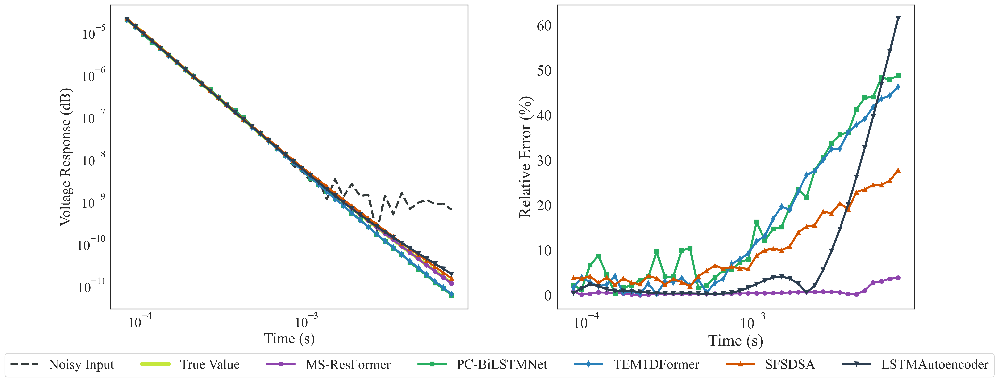

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec
import os
import time
import random

# ========================
# 1. 固定随机种子（可复现）
# ========================
seed_value = 27  # 复杂随机种子
torch.manual_seed(seed_value)
np.random.seed(seed_value)
random.seed(seed_value)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed_value)

# ========================
# 2. 设备
# ========================
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ========================
# 3. 反归一化函数（安全版）
# ========================
def inv(tensor, scaler):
    arr = tensor.detach().cpu().numpy()
    arr = np.squeeze(arr)
    if arr.ndim == 1:
        arr = arr.reshape(1, -1)
    arr = scaler.inverse_transform(arr)
    return 10 ** arr

# ========================
# 4. 时间轴
# ========================
t = np.array([
    8.39966e-05, 9.42457e-05, 1.05745e-04, 1.18648e-04, 1.33126e-04,
    1.49369e-04, 1.67595e-04, 1.88045e-04, 2.10990e-04, 2.36734e-04,
    2.65620e-04, 2.98031e-04, 3.34396e-04, 3.75199e-04, 4.20980e-04,
    4.72347e-04, 5.29982e-04, 5.94650e-04, 6.67208e-04, 7.48620e-04,
    8.39966e-04, 9.42457e-04, 1.05745e-03, 1.18648e-03, 1.33126e-03,
    1.49369e-03, 1.67595e-03, 1.88045e-03, 2.10990e-03, 2.36734e-03,
    2.65620e-03, 2.98031e-03, 3.34396e-03, 3.75199e-03, 4.20980e-03,
    4.72347e-03, 5.29982e-03, 5.94650e-03, 6.67208e-03, 7.48620e-03
])
t_tail = t[-40:]

# ========================
# 5. 颜色、标签
# ========================
colors = ['#8E44AD', '#27AE60', '#2980B9', '#D35400', '#2C3E50']
labels = ['MS-ResFormer', 'PC-BiLSTMNet', 'TEM1DFormer', 'SFSDSA', 'LSTMAutoencoder']
markers = ['o', 's', 'd', '^', 'v']

# ========================
# 6. 加载数据并构造测试集
# ========================
raw_noisy = np.load('train_data_shice3.npy')
raw_clean = np.load('train_labels_shice3.npy')

N, n_rx, T = raw_noisy.shape
noisy_all = raw_noisy.reshape(N * n_rx, 1, T)
clean_all = raw_clean.reshape(N * n_rx, 1, T)

# num_test = min(10, noisy_all.shape[0])
num_test1=29
indices = np.random.permutation(noisy_all.shape[0])[:num_test1]  # 固定种子保证可复现
noisy_sel = noisy_all[indices]
clean_sel = clean_all[indices]

noisy_tensor = torch.tensor(noisy_sel, dtype=torch.float32)
clean_tensor = torch.tensor(clean_sel, dtype=torch.float32)
test_dataset = [(noisy_tensor[i], clean_tensor[i]) for i in range(num_test1)]

# ========================
# 7. 绘图配置
# ========================
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'axes.unicode_minus': False,
    'figure.dpi': 300,
    'savefig.dpi': 300
})

fig = plt.figure(figsize=(21, 8), facecolor='white')
gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1], wspace=0.25)

# ========================
# 8. 左图：单样本去噪结果
# ========================
sample_idx = 1  # 固定样本索引
noisy_sample, clean_sample = test_dataset[sample_idx]
noisy_sample = noisy_sample.unsqueeze(0).to(device)
clean_sample = clean_sample.unsqueeze(0).to(device)

with torch.no_grad():
    out_resatt = model_resatt(noisy_sample)
    out_pcbilstm = model_pcbilstm(noisy_sample)
    out_1d = model_1d(noisy_sample)
    out_sfsdsa = model_sfsdsa(noisy_sample)
    out_lstm_auto = model_lstm_auto(noisy_sample)

y_true = inv(clean_sample, scaler2)
x_noisy = inv(noisy_sample, scaler1)
y_preds = [
    inv(out_resatt, scaler2),
    inv(out_pcbilstm, scaler2),
    inv(out_1d, scaler2),
    inv(out_sfsdsa, scaler2),
    inv(out_lstm_auto, scaler2)
]

ax1 = fig.add_subplot(gs[0, 0])
ax1.set_facecolor('white')
ax1.loglog(t, x_noisy[0], '--', color="#010A0A", linewidth=3, alpha=0.8, label='Noisy Input')
ax1.loglog(t, y_true[0], '-', color="#C5E73C", linewidth=5, alpha=1.0, label='True Value')
for i, y_pred in enumerate(y_preds):
    ax1.loglog(t, y_pred[0], '-', color=colors[i], marker=markers[i], linewidth=3, label=labels[i])
ax1.set_xlabel('Time (s)', fontsize=22)
ax1.set_ylabel('Voltage Response (dB)', fontsize=22)
ax1.tick_params(axis='both', labelsize=20, pad=8)

# ========================
# 9. 右图：五个模型的平均相对误差
# ========================
all_err = [[] for _ in range(5)]

for noisy_sample, clean_sample in test_dataset:
    noisy_sample = noisy_sample.unsqueeze(0).to(device)
    clean_sample = clean_sample.unsqueeze(0).to(device)

    with torch.no_grad():
        out_preds = [
            model_resatt(noisy_sample),
            model_pcbilstm(noisy_sample),
            model_1d(noisy_sample),
            model_sfsdsa(noisy_sample),
            model_lstm_auto(noisy_sample)
        ]
    y_true = inv(clean_sample, scaler2)
    for i, out in enumerate(out_preds):
        y_pred = inv(out, scaler2)
        all_err[i].append(np.abs((y_pred[0] - y_true[0]) / y_true[0]) * 100)

mean_err = [np.array(err).mean(axis=0)[-40:] for err in all_err]

ax2 = fig.add_subplot(gs[0, 1])
ax2.set_facecolor('white')
for i, err in enumerate(mean_err):
    ax2.semilogx(t_tail, err, '-', color=colors[i], marker=markers[i], linewidth=3, label=labels[i])
ax2.set_xlabel('Time (s)', fontsize=24)
ax2.set_ylabel('Relative Error (%)', fontsize=24)
ax2.tick_params(axis='both', labelsize=22, pad=8)

# ========================
# 10. 图例（统一放下方，去重）
# ========================
handles, labels_combined = [], []
for ax in [ax1, ax2]:
    h, l = ax.get_legend_handles_labels()
    handles += h
    labels_combined += l

unique = dict(zip(labels_combined, handles))
fig.legend(unique.values(), unique.keys(),
           loc='lower center', bbox_to_anchor=(0.5, -0.08),
           ncol=7, frameon=True, fontsize=20,
           columnspacing=2.0, fancybox=True, facecolor='white')

plt.tight_layout()

# ========================
# 11. 保存图像
# ========================
save_dir = r"C:\Users\USTC\Desktop\王浩然\瞬变电磁\noise\figure"
os.makedirs(save_dir, exist_ok=True)
timestamp = time.strftime("%Y%m%d_%H%M%S")
save_path = os.path.join(save_dir, f"denoising_comparison_fixed_seed_{timestamp}.png")
plt.savefig(save_path, bbox_inches='tight')
print(f"✅ 图像已保存到: {save_path}")

plt.show()


C:\Users\USTC\AppData\Local\Temp\ipykernel_39860\1244835880.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


✅ 图像已保存到: C:\Users\USTC\Desktop\王浩然\瞬变电磁\noise\figure\denoising_comparison_seed_123456_20251101_225046.png


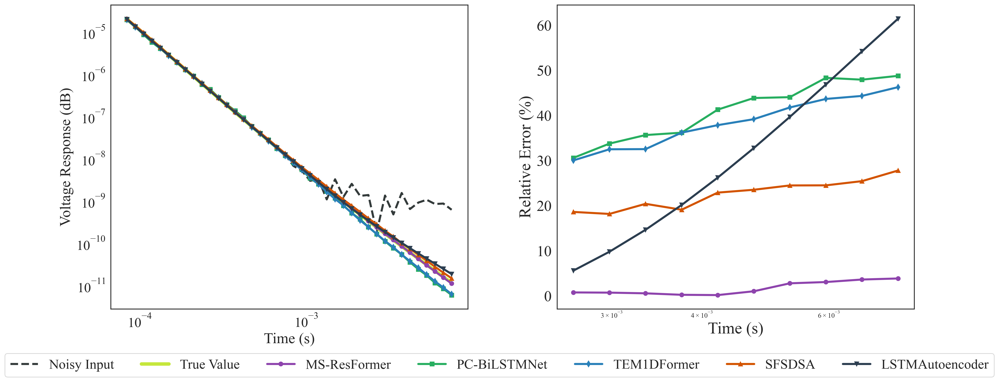

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec
import os
import random
import time

# ========================
# 1. 设备
# ========================
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ========================
# 2. 随机种子（可修改）
# ========================
seed_value = 123456  # 复杂随机种子
torch.manual_seed(seed_value)
np.random.seed(seed_value)
random.seed(seed_value)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed_value)

# ========================
# 3. 反归一化函数（安全版）
# ========================
def inv(tensor, scaler):
    arr = tensor.detach().cpu().numpy()
    arr = np.squeeze(arr)
    if arr.ndim == 1:
        arr = arr.reshape(1, -1)
    arr = scaler.inverse_transform(arr)
    return 10 ** arr

# ========================
# 4. 时间轴
# ========================
t = np.array([
    8.39966e-05, 9.42457e-05, 1.05745e-04, 1.18648e-04, 1.33126e-04,
    1.49369e-04, 1.67595e-04, 1.88045e-04, 2.10990e-04, 2.36734e-04,
    2.65620e-04, 2.98031e-04, 3.34396e-04, 3.75199e-04, 4.20980e-04,
    4.72347e-04, 5.29982e-04, 5.94650e-04, 6.67208e-04, 7.48620e-04,
    8.39966e-04, 9.42457e-04, 1.05745e-03, 1.18648e-03, 1.33126e-03,
    1.49369e-03, 1.67595e-03, 1.88045e-03, 2.10990e-03, 2.36734e-03,
    2.65620e-03, 2.98031e-03, 3.34396e-03, 3.75199e-03, 4.20980e-03,
    4.72347e-03, 5.29982e-03, 5.94650e-03, 6.67208e-03, 7.48620e-03
])
t_tail = t[-10:]

# ========================
# 5. 颜色、标签
# ========================
colors = ['#8E44AD', '#27AE60', '#2980B9', '#D35400', '#2C3E50']
labels = ['MS-ResFormer', 'PC-BiLSTMNet', 'TEM1DFormer', 'SFSDSA', 'LSTMAutoencoder']
markers = ['o', 's', 'd', '^', 'v']

# ========================
# 6. 加载数据
# ========================
raw_noisy = np.load('train_data_shice3.npy')
raw_clean = np.load('train_labels_shice3.npy')
N, n_rx, T = raw_noisy.shape
noisy_all = raw_noisy.reshape(N * n_rx, 1, T)
clean_all = raw_clean.reshape(N * n_rx, 1, T)

# ========================
# 7. 构造测试集（随机选择）
# ========================
num_test = 100  # 测试样本数量，可改
indices = np.random.permutation(noisy_all.shape[0])[:num_test]  # 随机种子控制选择
noisy_sel = noisy_all[indices]
clean_sel = clean_all[indices]

noisy_tensor = torch.tensor(noisy_sel, dtype=torch.float32)
clean_tensor = torch.tensor(clean_sel, dtype=torch.float32)
test_dataset = [(noisy_tensor[i], clean_tensor[i]) for i in range(num_test)]

# ========================
# 8. 绘图配置
# ========================
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'axes.unicode_minus': False,
    'figure.dpi': 300,
    'savefig.dpi': 300
})
fig = plt.figure(figsize=(21, 8), facecolor='white')
gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1], wspace=0.25)

# ========================
# 9. 左图：单样本去噪
# ========================
sample_idx = np.random.randint(0, num_test)  # 随机单样本
noisy_sample, clean_sample = test_dataset[sample_idx]
noisy_sample = noisy_sample.unsqueeze(0).to(device)
clean_sample = clean_sample.unsqueeze(0).to(device)

with torch.no_grad():
    out_resatt = model_resatt(noisy_sample)
    out_pcbilstm = model_pcbilstm(noisy_sample)
    out_1d = model_1d(noisy_sample)
    out_sfsdsa = model_sfsdsa(noisy_sample)
    out_lstm_auto = model_lstm_auto(noisy_sample)

y_true = inv(clean_sample, scaler2)
x_noisy = inv(noisy_sample, scaler1)
y_preds = [
    inv(out_resatt, scaler2),
    inv(out_pcbilstm, scaler2),
    inv(out_1d, scaler2),
    inv(out_sfsdsa, scaler2),
    inv(out_lstm_auto, scaler2)
]

ax1 = fig.add_subplot(gs[0, 0])
ax1.set_facecolor('white')
ax1.loglog(t, x_noisy[0], '--', color="#010A0A", linewidth=3, alpha=0.8, label='Noisy Input')
ax1.loglog(t, y_true[0], '-', color="#C5E73C", linewidth=5, alpha=1.0, label='True Value')
for i, y_pred in enumerate(y_preds):
    ax1.loglog(t, y_pred[0], '-', color=colors[i], marker=markers[i], linewidth=3, label=labels[i])
ax1.set_xlabel('Time (s)', fontsize=22)
ax1.set_ylabel('Voltage Response (dB)', fontsize=22)
ax1.tick_params(axis='both', labelsize=20, pad=8)

# ========================
# 10. 右图：平均相对误差
# ========================
all_err = [[] for _ in range(5)]
for noisy_sample, clean_sample in test_dataset:
    noisy_sample = noisy_sample.unsqueeze(0).to(device)
    clean_sample = clean_sample.unsqueeze(0).to(device)

    with torch.no_grad():
        out_preds = [
            model_resatt(noisy_sample),
            model_pcbilstm(noisy_sample),
            model_1d(noisy_sample),
            model_sfsdsa(noisy_sample),
            model_lstm_auto(noisy_sample)
        ]
    y_true = inv(clean_sample, scaler2)
    for i, out in enumerate(out_preds):
        y_pred = inv(out, scaler2)
        all_err[i].append(np.abs((y_pred[0] - y_true[0]) / y_true[0]) * 100)

mean_err = [np.array(err).mean(axis=0)[-10:] for err in all_err]
ax2 = fig.add_subplot(gs[0, 1])
ax2.set_facecolor('white')
for i, err in enumerate(mean_err):
    ax2.semilogx(t_tail, err, '-', color=colors[i], marker=markers[i], linewidth=3, label=labels[i])
ax2.set_xlabel('Time (s)', fontsize=24)
ax2.set_ylabel('Relative Error (%)', fontsize=24)
ax2.tick_params(axis='both', labelsize=22, pad=8)

# ========================
# 11. 图例
# ========================
handles, labels_combined = [], []
for ax in [ax1, ax2]:
    h, l = ax.get_legend_handles_labels()
    handles += h
    labels_combined += l

unique = dict(zip(labels_combined, handles))
fig.legend(unique.values(), unique.keys(),
           loc='lower center', bbox_to_anchor=(0.5, -0.08),
           ncol=7, frameon=True, fontsize=20,
           columnspacing=2.0, fancybox=True, facecolor='white')

plt.tight_layout()

# ========================
# 12. 保存图像（带时间戳）
# ========================
# save_dir = r"C:\Users\USTC\Desktop\王浩然\瞬变电磁\noise\figure"
os.makedirs(save_dir, exist_ok=True)
timestamp = time.strftime("%Y%m%d_%H%M%S")
save_path = os.path.join(save_dir, f"denoising_comparison_seed_{seed_value}_{timestamp}.png")
plt.savefig(save_path, bbox_inches='tight')
print(f"✅ 图像已保存到: {save_path}")

plt.show()


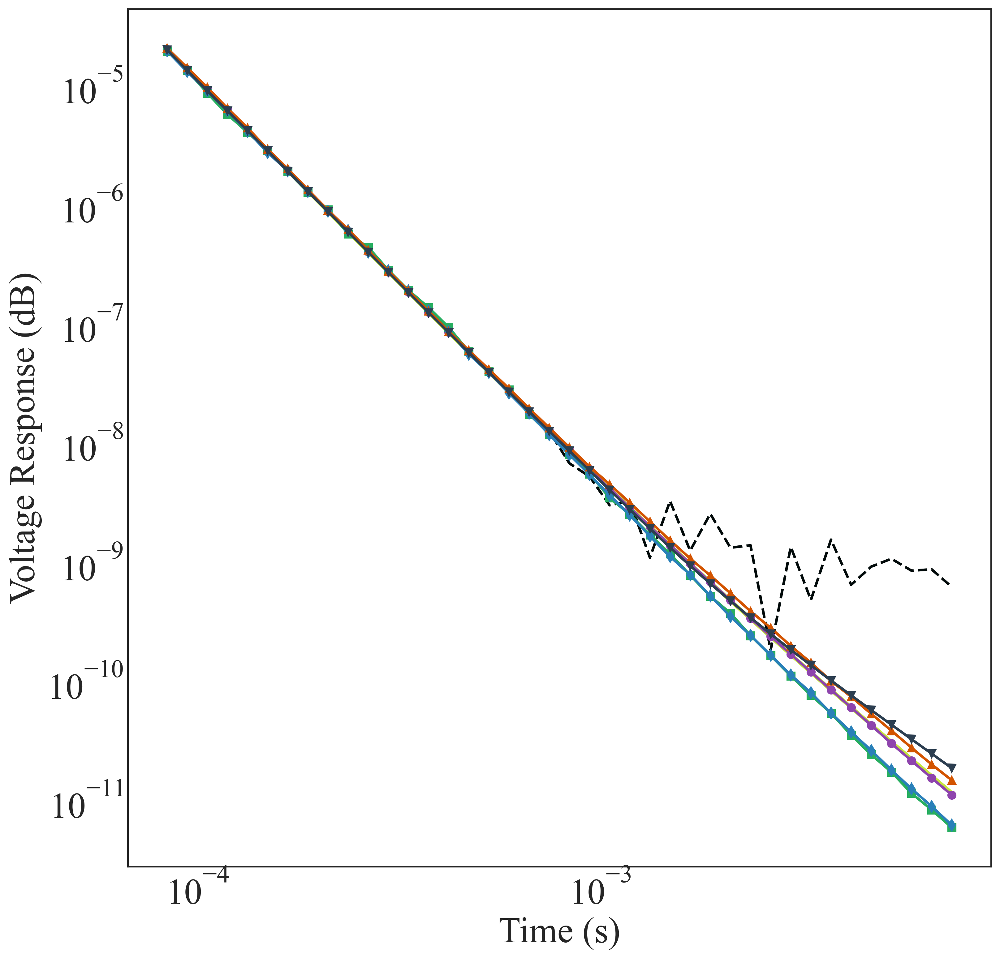

C:\Users\USTC\AppData\Local\Temp\ipykernel_39860\863813267.py:179: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


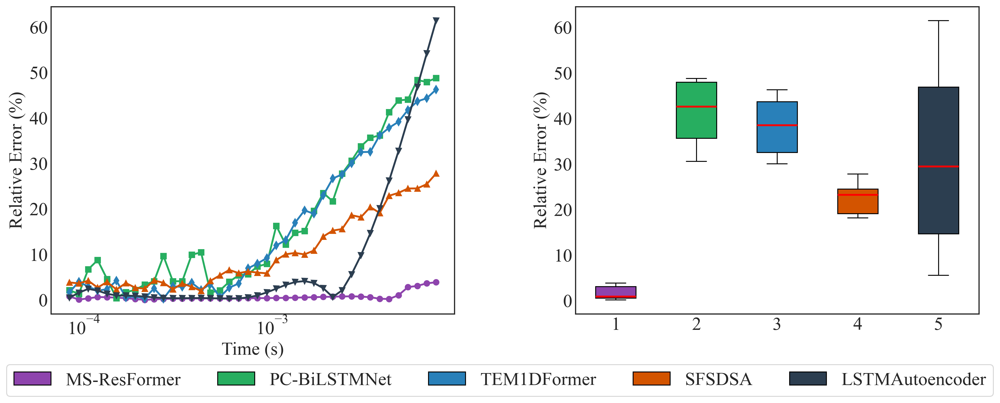

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec
import random
from matplotlib.patches import Patch

# ========================
# 1. 设备
# ========================
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ========================
# 2. 随机种子
# ========================
seed_value = 123456
torch.manual_seed(seed_value)
np.random.seed(seed_value)
random.seed(seed_value)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed_value)

# ========================
# 3. 反归一化函数
# ========================
def inv(tensor, scaler):
    arr = tensor.detach().cpu().numpy()
    arr = np.squeeze(arr)
    if arr.ndim == 1:
        arr = arr.reshape(1, -1)
    arr = scaler.inverse_transform(arr)
    return 10 ** arr

# ========================
# 4. 时间轴
# ========================
t = np.array([
    8.39966e-05, 9.42457e-05, 1.05745e-04, 1.18648e-04, 1.33126e-04,
    1.49369e-04, 1.67595e-04, 1.88045e-04, 2.10990e-04, 2.36734e-04,
    2.65620e-04, 2.98031e-04, 3.34396e-04, 3.75199e-04, 4.20980e-04,
    4.72347e-04, 5.29982e-04, 5.94650e-04, 6.67208e-04, 7.48620e-04,
    8.39966e-04, 9.42457e-04, 1.05745e-03, 1.18648e-03, 1.33126e-03,
    1.49369e-03, 1.67595e-03, 1.88045e-03, 2.10990e-03, 2.36734e-03,
    2.65620e-03, 2.98031e-03, 3.34396e-03, 3.75199e-03, 4.20980e-03,
    4.72347e-03, 5.29982e-03, 5.94650e-03, 6.67208e-03, 7.48620e-03
])
t_tail = t[-10:]

# ========================
# 5. 颜色、标签
# ========================
colors = ['#8E44AD', '#27AE60', '#2980B9', '#D35400', '#2C3E50']
labels = ['MS-ResFormer', 'PC-BiLSTMNet', 'TEM1DFormer', 'SFSDSA', 'LSTMAutoencoder']
markers = ['o', 's', 'd', '^', 'v']

# ========================
# 6. 加载数据
# ========================
raw_noisy = np.load('train_data_shice3.npy')
raw_clean = np.load('train_labels_shice3.npy')
N, n_rx, T = raw_noisy.shape
noisy_all = raw_noisy.reshape(N * n_rx, 1, T)
clean_all = raw_clean.reshape(N * n_rx, 1, T)

num_test = 100
indices = np.random.permutation(noisy_all.shape[0])[:num_test]
noisy_sel = noisy_all[indices]
clean_sel = clean_all[indices]
noisy_tensor = torch.tensor(noisy_sel, dtype=torch.float32)
clean_tensor = torch.tensor(clean_sel, dtype=torch.float32)
test_dataset = [(noisy_tensor[i], clean_tensor[i]) for i in range(num_test)]

# ========================
# 7. 单样本去噪
# ========================
sample_idx = np.random.randint(0, num_test)
noisy_sample, clean_sample = test_dataset[sample_idx]
noisy_sample = noisy_sample.unsqueeze(0).to(device)
clean_sample = clean_sample.unsqueeze(0).to(device)

with torch.no_grad():
    out_resatt = model_resatt(noisy_sample)
    out_pcbilstm = model_pcbilstm(noisy_sample)
    out_1d = model_1d(noisy_sample)
    out_sfsdsa = model_sfsdsa(noisy_sample)
    out_lstm_auto = model_lstm_auto(noisy_sample)

y_true = inv(clean_sample, scaler2)
x_noisy = inv(noisy_sample, scaler1)
y_preds = [
    inv(out_resatt, scaler2),
    inv(out_pcbilstm, scaler2),
    inv(out_1d, scaler2),
    inv(out_sfsdsa, scaler2),
    inv(out_lstm_auto, scaler2)
]

# ========================
# 图 1：单样本去噪
# ========================
plt.figure(figsize=(12,12))
plt.loglog(t, x_noisy[0], '--', color="#010A0A", linewidth=2, label='Noisy Input')
plt.loglog(t, y_true[0], '-', color="#C5E73C", linewidth=3, label='True Value')
for i, y_pred in enumerate(y_preds):
    plt.loglog(t, y_pred[0], '-', color=colors[i], marker=markers[i], linewidth=2, label=labels[i])
plt.xlabel('Time (s)', fontsize=28)
plt.ylabel('Voltage Response (dB)', fontsize=28)
# plt.title('Single Sample Denoising', fontsize=20)
plt.xticks(fontsize=28)
plt.yticks(fontsize=28)
plt.show()

# ========================
# 图 2：左图单样本相对误差 + 右图箱型图
# ========================
plt.figure(figsize=(18,6))
gs = gridspec.GridSpec(1,2,width_ratios=[1,1], wspace=0.3)

# 左图：单样本相对误差
ax1 = plt.subplot(gs[0,0])
for i, y_pred in enumerate(y_preds):
    rel_err = np.abs((y_pred[0] - y_true[0]) / y_true[0]) * 100
    ax1.semilogx(t, rel_err, '-', color=colors[i], marker=markers[i], linewidth=2, label=labels[i])
ax1.set_xlabel('Time (s)', fontsize=20)
ax1.set_ylabel('Relative Error (%)', fontsize=20)
# ax1.set_title('Single Sample Relative Error', fontsize=20)
ax1.tick_params(axis='both', which='major', labelsize=20)

# 右图：箱型图（最后10个点相对误差分布）
ax2 = plt.subplot(gs[0,1])
all_err_box = []

for i in range(5):
    model_err = []
    for noisy_sample, clean_sample in test_dataset:
        noisy_sample = noisy_sample.unsqueeze(0).to(device)
        clean_sample = clean_sample.unsqueeze(0).to(device)
        with torch.no_grad():
            out = [model_resatt, model_pcbilstm, model_1d, model_sfsdsa, model_lstm_auto][i](noisy_sample)
            y_pred = inv(out, scaler2)
            y_true_sample = inv(clean_sample, scaler2)
            rel_err = np.abs((y_pred[0,-10:] - y_true_sample[0,-10:]) / y_true_sample[0,-10:]) * 100
            model_err.extend(rel_err)
    all_err_box.append(model_err)

box_colors = colors
bp = ax2.boxplot(all_err_box, patch_artist=True,
                 medianprops=dict(color='red', linewidth=2),
                 whiskerprops=dict(color='black'),
                 capprops=dict(color='black'),
                 flierprops=dict(marker='o', color='red', alpha=0.6))
for patch, color in zip(bp['boxes'], box_colors):
    patch.set_facecolor(color)

ax2.set_ylabel('Relative Error (%)', fontsize=20)
# ax2.set_title('Error Distribution of Last 10 Points', fontsize=20)
ax2.tick_params(axis='both', which='major', labelsize=20)

# ========================
# 底部统一图例（整体白色框）
# ========================
unique = {labels[i]: colors[i] for i in range(len(labels))}
legend_handles = [Patch(facecolor=unique[k], edgecolor='black', label=k) for k in unique]

fig = plt.gcf()
fig.legend(
    handles=legend_handles,
    loc='lower center',
    bbox_to_anchor=(0.5, -0.12),
    ncol=len(unique),
    frameon=True,
    fontsize=20,
    columnspacing=2.0,
    fancybox=True,
    facecolor='white',
    
)

plt.tight_layout()
plt.show()


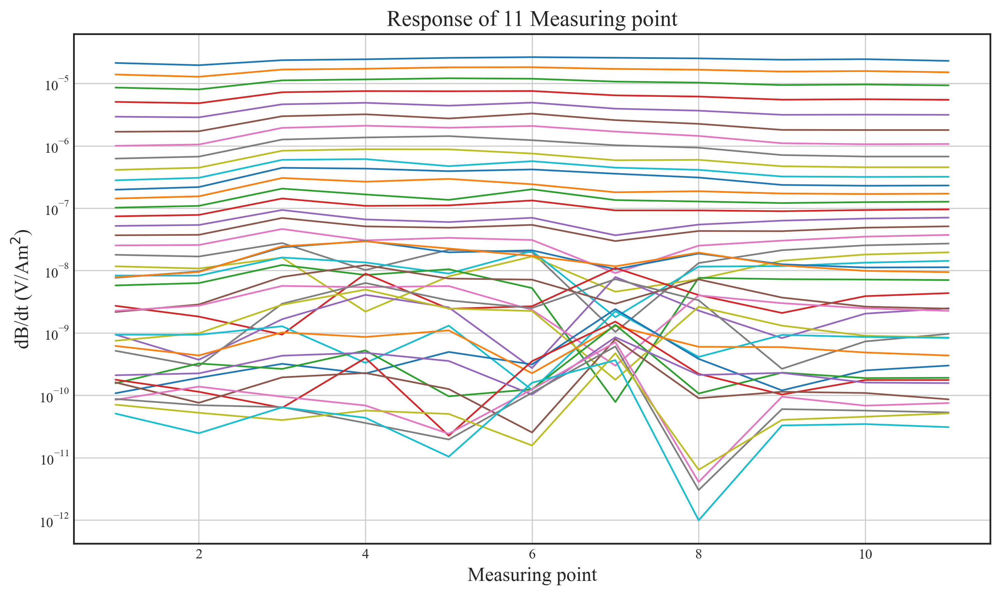

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat


# ===== 1. 加载并转置数据 =====
mat = loadmat('dbz.mat')          # 加载 .mat 文件
dbz = mat['dbz']                  # 提取 dbz 变量（40×11）
dbz = dbz.T                       # 转置为 11×40，每行一个样本

# ===== 2. 绘图 =====
plt.figure(figsize=(10, 6))
for i in range(dbz.shape[1]):     # 对每个时间点画一条曲线（每列是一个时间点）
    plt.semilogy(range(1, 12), dbz[:, i], linewidth=1.2)

# ===== 3. 添加坐标标签和标题 =====
plt.xlabel('Measuring point', fontsize=14, fontweight='normal')
plt.ylabel('dB/dt (V/Am$^2$)', fontsize=14, fontweight='normal')
plt.title('Response of 11 Measuring point', fontsize=16, fontweight='normal')
plt.grid(True)
plt.tight_layout()
plt.show()


去噪结果 shape: (11, 40)


C:\Users\USTC\AppData\Local\Temp\ipykernel_39860\3648841176.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10', dbz.shape[1])  # 11 个颜色


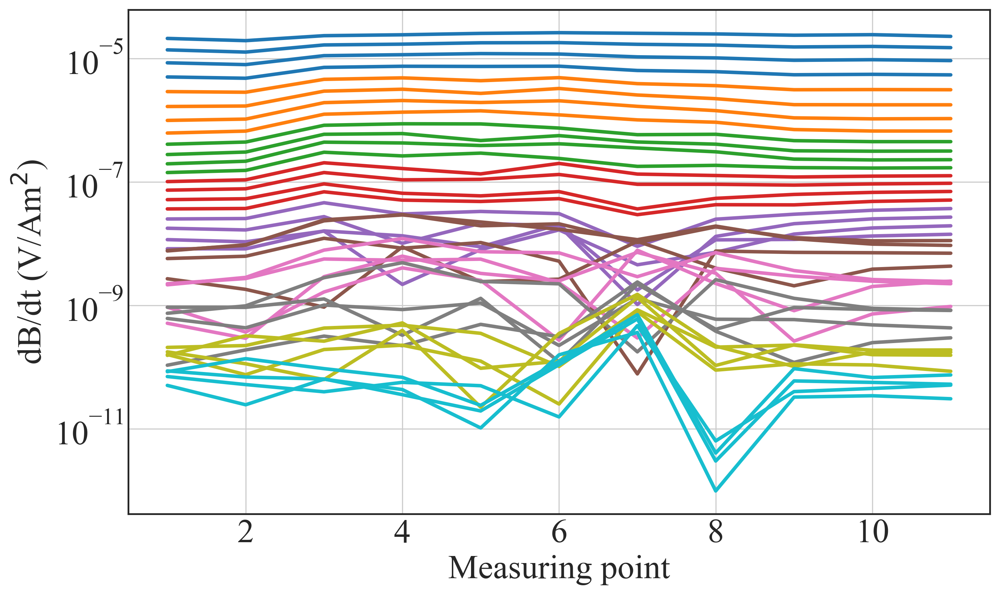

C:\Users\USTC\AppData\Local\Temp\ipykernel_39860\3648841176.py:64: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10', all_preds_array.shape[1])  # 11 个颜色


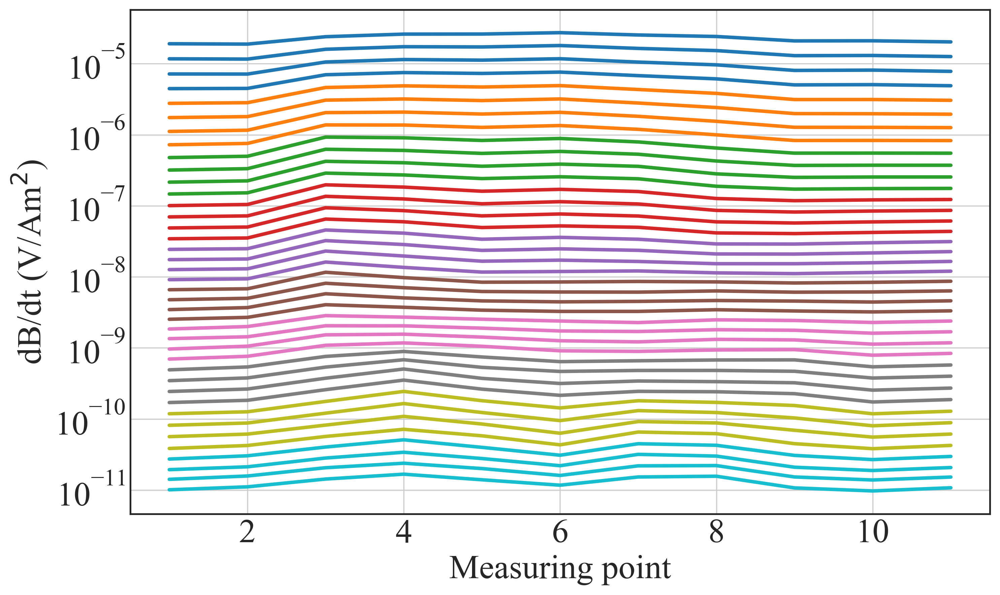

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from collections import OrderedDict
from scipy.io import loadmat, savemat
import matplotlib.cm as cm

# ========== 1. 设置设备 ==========
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ========== 2. 加载模型 ==========
model_resatt = MSTransformerNet().to(device)
state_dict = torch.load('model_resattpc.pth', map_location=device)
new_state_dict = OrderedDict((k.replace('module.', ''), v) for k, v in state_dict.items())
model_resatt.load_state_dict(new_state_dict)
model_resatt.eval()

# ========== 3. 加载数据 ==========
mat = loadmat('dbz.mat')        # 原始 shape (40, 11)
dbz = mat['dbz'].T              # 转为 (11, 40)，每行是一个样本（一个时间点），共 11 个时间点

# 归一化输入（log10 + scaler1）
import joblib


dbz_log = np.log10(dbz)                         # (11, 40)
dbz_norm = scaler1.transform(dbz_log)           # (11, 40)
dbz_tensor = torch.from_numpy(dbz_norm).float().unsqueeze(1).to(device)  # (11,1,40)

# ========== 4. 模型推理 ==========
all_preds = []  # 每个样本的预测结果 shape=(40,)
with torch.no_grad():
    for i in range(dbz_tensor.shape[0]):  # 遍历每个样本（共11个）
        sample = dbz_tensor[i:i+1]              # shape (1,1,40)
        pred_norm = model_resatt(sample)        # shape (1,1,40)
        pred_np = pred_norm.cpu().numpy().reshape(1, -1)  # shape (1, 40)
        pred_log = scaler2.inverse_transform(pred_np)     # shape (1, 40)
        pred = 10 ** pred_log.flatten()                   # shape (40,)
        all_preds.append(pred)

# 转置成 shape (40, 11)，便于逐时间点画图
all_preds_array = np.array(all_preds)
print('去噪结果 shape:', all_preds_array.shape)

# ========== 5. 绘图 ==========

# ===== 原始数据 =====
colors = cm.get_cmap('tab10', dbz.shape[1])  # 11 个颜色

plt.figure(figsize=(10,6))
for i in range(dbz.shape[1]):     # 每个时间点画一条曲线
    plt.semilogy(range(1, 12), dbz[:, i], color=colors(i), linewidth=2.5)

plt.xlabel('Measuring point', fontsize=24, fontweight='normal')
plt.ylabel('dB/dt (V/Am$^2$)', fontsize=24, fontweight='normal')
plt.tick_params(axis='x', which='major', labelsize=24)  # 设置x轴主刻度的标签大小
plt.tick_params(axis='y', which='major', labelsize=24)  # 设置y轴主刻度的标签大小

plt.grid(True)
plt.tight_layout()
plt.show()

# ===== 去噪后数据 =====
colors = cm.get_cmap('tab10', all_preds_array.shape[1])  # 11 个颜色

plt.figure(figsize=(10, 6))
for i in range(all_preds_array.shape[1]):     # 每个时间点画一条曲线
    plt.semilogy(range(1, 12), all_preds_array[:, i], color=colors(i), linewidth=2.5)

plt.xlabel('Measuring point', fontsize=24, fontweight='normal')
plt.ylabel('dB/dt (V/Am$^2$)', fontsize=24, fontweight='normal')
plt.tick_params(axis='x', which='major', labelsize=24)  # 设置x轴主刻度的标签大小
plt.tick_params(axis='y', which='major', labelsize=24)  # 设置y轴主刻度的标签大小
# plt.rcParams['xtick.labelsize'] = 20
# plt.rcParams['ytick.labelsize'] = 20

plt.grid(True)
plt.tight_layout()
plt.show()

# ========== 6. 保存数据 ==========
# 转置为 (40, 11)
all_preds_array_T = all_preds_array.T

# 保存为 mat 文件
savemat('denoised_dbz.mat', {'dbz': all_preds_array_T})


去噪结果 shape: (11, 40)


C:\Users\USTC\AppData\Local\Temp\ipykernel_39860\124870621.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10', dbz.shape[1])  # 11 个颜色


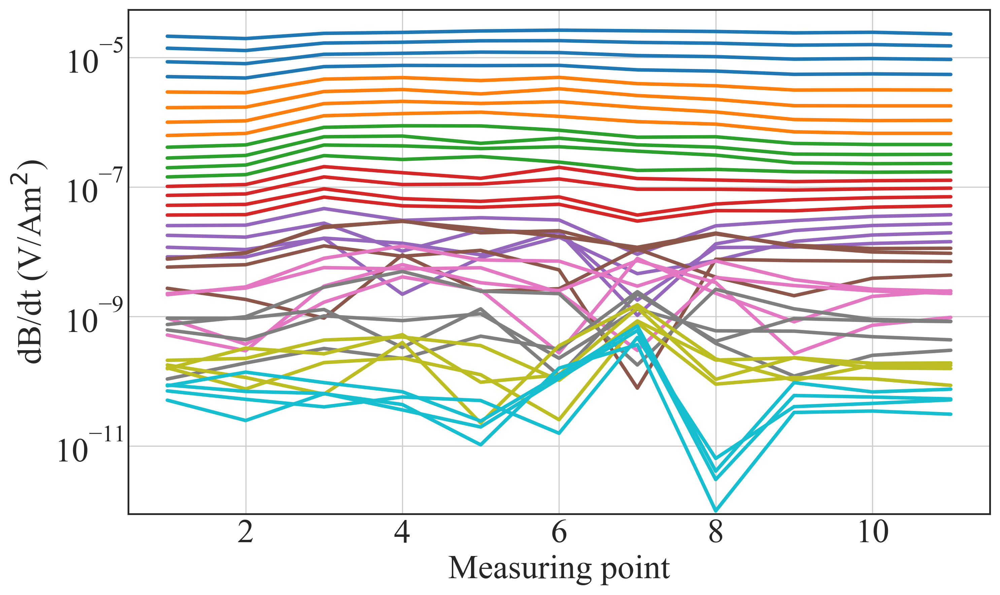

C:\Users\USTC\AppData\Local\Temp\ipykernel_39860\124870621.py:67: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10', all_preds_array.shape[1])  # 11 个颜色


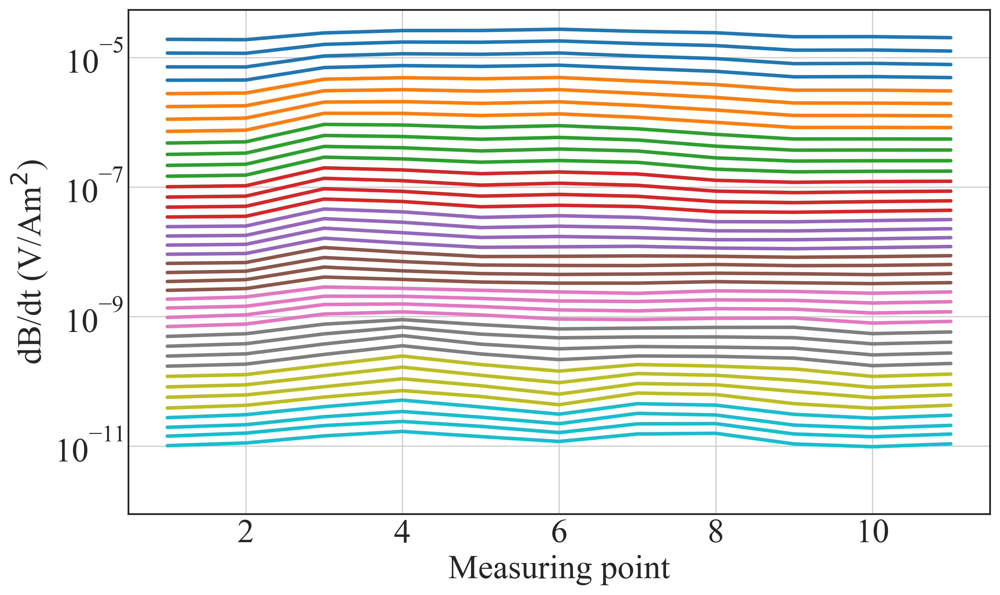

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from collections import OrderedDict
from scipy.io import loadmat, savemat
import matplotlib.cm as cm

# ========== 1. 设置设备 ==========
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ========== 2. 加载模型 ==========
model_resatt = MSTransformerNet().to(device)
state_dict = torch.load('model_resattpc.pth', map_location=device)
new_state_dict = OrderedDict((k.replace('module.', ''), v) for k, v in state_dict.items())
model_resatt.load_state_dict(new_state_dict)
model_resatt.eval()

# ========== 3. 加载数据 ==========
mat = loadmat('dbz.mat')        # 原始 shape (40, 11)
dbz = mat['dbz'].T              # 转为 (11, 40)

# 归一化输入（log10 + scaler1）
import joblib

dbz_log = np.log10(dbz)                         # (11, 40)
dbz_norm = scaler1.transform(dbz_log)           # (11, 40)
dbz_tensor = torch.from_numpy(dbz_norm).float().unsqueeze(1).to(device)  # (11,1,40)

# ========== 4. 模型推理 ==========
all_preds = []  # 每个样本的预测结果 shape=(40,)
with torch.no_grad():
    for i in range(dbz_tensor.shape[0]):  # 遍历每个样本（共11个）
        sample = dbz_tensor[i:i+1]              # shape (1,1,40)
        pred_norm = model_resatt(sample)        # shape (1,1,40)
        pred_np = pred_norm.cpu().numpy().reshape(1, -1)  # shape (1, 40)
        pred_log = scaler2.inverse_transform(pred_np)     # shape (1, 40)
        pred = 10 ** pred_log.flatten()                   # shape (40,)
        all_preds.append(pred)

# 转置成 shape (40, 11)，便于逐时间点画图
all_preds_array = np.array(all_preds)
print('去噪结果 shape:', all_preds_array.shape)

# ========== 5. 统一纵轴范围 ==========
all_data = np.concatenate([dbz, all_preds_array], axis=0)
ymin, ymax = all_data.min(), all_data.max()
# 可以选取稍大范围，如上下各扩大10%
ymin *= 0.9
ymax *= 2

# ========== 6. 绘图 ==========
# ----- 原始数据 -----
colors = cm.get_cmap('tab10', dbz.shape[1])  # 11 个颜色
plt.figure(figsize=(10,6))
for i in range(dbz.shape[1]):     # 每个时间点画一条曲线
    plt.semilogy(range(1, 12), dbz[:, i], color=colors(i), linewidth=2.5)
plt.xlabel('Measuring point', fontsize=24)
plt.ylabel('dB/dt (V/Am$^2$)', fontsize=24)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.ylim(ymin, ymax)  # 统一纵轴范围
plt.grid(True)
plt.tight_layout()
plt.show()

# ----- 去噪后数据 -----
colors = cm.get_cmap('tab10', all_preds_array.shape[1])  # 11 个颜色
plt.figure(figsize=(10,6))
for i in range(all_preds_array.shape[1]):     # 每个时间点画一条曲线
    plt.semilogy(range(1, 12), all_preds_array[:, i], color=colors(i), linewidth=2.5)
plt.xlabel('Measuring point', fontsize=24)
plt.ylabel('dB/dt (V/Am$^2$)', fontsize=24)
plt.tick_params(axis='x', labelsize=24)
plt.tick_params(axis='y', labelsize=24)
plt.ylim(ymin, ymax)  # 统一纵轴范围
plt.grid(True)
plt.tight_layout()
plt.show()

# ========== 7. 保存去噪数据 ==========
all_preds_array_T = all_preds_array.T
savemat('denoised_dbz.mat', {'dbz': all_preds_array_T})


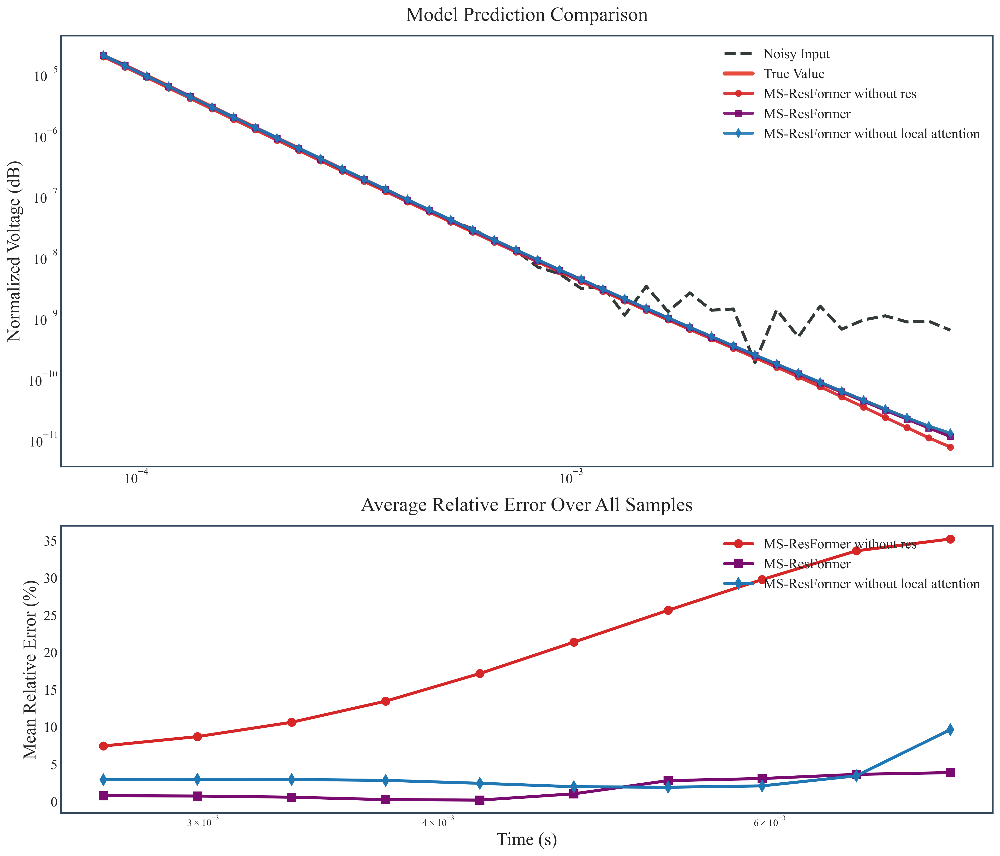

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from collections import OrderedDict
from matplotlib import gridspec

# === 假设以下预先定义 ===
# test_dataset, scaler1, scaler2
# 模型定义: AttentivePCTransformerNet, MSTransformerNet, ResAttentiveDownUpNet

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# === 1. 加载模型函数 ===
def load_model(model_class, path):
    model = model_class().to(device)
    state_dict = torch.load(path, map_location=device)
    new_state_dict = OrderedDict((k.replace("module.", ""), v) for k, v in state_dict.items())
    model.load_state_dict(new_state_dict)
    model.eval()
    return model

model_nores = load_model(AttentivePCTransformerNet, 'model_no_res.pth')
model_resatt = load_model(MSTransformerNet, 'model_resattpc.pth')
model_noatt = load_model(ResAttentiveDownUpNet, 'model_no_local.pth')

# === 2. 时间轴 ===
t = np.array([
    8.39966e-05, 9.42457e-05, 1.05745e-04, 1.18648e-04, 1.33126e-04,
    1.49369e-04, 1.67595e-04, 1.88045e-04, 2.10990e-04, 2.36734e-04,
    2.65620e-04, 2.98031e-04, 3.34396e-04, 3.75199e-04, 4.20980e-04,
    4.72347e-04, 5.29982e-04, 5.94650e-04, 6.67208e-04, 7.48620e-04,
    8.39966e-04, 9.42457e-04, 1.05745e-03, 1.18648e-03, 1.33126e-03,
    1.49369e-03, 1.67595e-03, 1.88045e-03, 2.10990e-03, 2.36734e-03,
    2.65620e-03, 2.98031e-03, 3.34396e-03, 3.75199e-03, 4.20980e-03,
    4.72347e-03, 5.29982e-03, 5.94650e-03, 6.67208e-03, 7.48620e-03
])
t_tail = t[-10:]

# === 3. 反归一化函数 ===
def inverse_transform(tensor, scaler):
    arr = tensor.detach().cpu().numpy().squeeze(1)
    arr = scaler.inverse_transform(arr)
    return 10 ** arr

# === 4. 平均相对误差计算 ===
def compute_mean_relative_error(model, dataset, scaler1, scaler2):
    model.eval()
    all_rel_errors = []
    for i in range(len(dataset)):
        noisy_sample, clean_sample = dataset[i]
        noisy_sample = noisy_sample.unsqueeze(0).to(device)
        clean_sample = clean_sample.unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(noisy_sample)
        y_true = inverse_transform(clean_sample, scaler2)
        y_pred = inverse_transform(output, scaler2)
        denom = np.where(y_true == 0, 1e-12, y_true)
        rel_error = np.abs((y_pred - y_true) / denom) * 100
        all_rel_errors.append(rel_error)
    all_rel_errors = np.array(all_rel_errors)
    return np.mean(all_rel_errors, axis=(0, 1))  # shape [40]

# === 5. 三个模型的平均相对误差 ===
mean_err_nores = compute_mean_relative_error(model_nores, test_dataset, scaler1, scaler2)
mean_err_resatt = compute_mean_relative_error(model_resatt, test_dataset, scaler1, scaler2)
mean_err_noatt = compute_mean_relative_error(model_noatt, test_dataset, scaler1, scaler2)

# === 6. 设置绘图样式 ===
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': 'Times New Roman',
    'axes.unicode_minus': False,
    'figure.dpi': 300,
    'savefig.dpi': 300
})

colors = ['#d62728', "#7a0b71", '#1f77b4']
labels = ['MS-ResFormer without res', 'MS-ResFormer', 'MS-ResFormer without local attention']
markers = ['o', 's', 'd']

# === 7. 开始绘图 ===
fig = plt.figure(figsize=(14, 12))
gs = gridspec.GridSpec(2, 1, height_ratios=[3, 2])

# === 上图：某个样本的预测曲线 ===
ax1 = fig.add_subplot(gs[0])
sample_idx = 20
noisy_sample, clean_sample = test_dataset[sample_idx]
noisy_sample = noisy_sample.unsqueeze(0).to(device)
clean_sample = clean_sample.unsqueeze(0).to(device)

with torch.no_grad():
    out_nores = model_nores(noisy_sample)
    out_resatt = model_resatt(noisy_sample)
    out_noatt = model_noatt(noisy_sample)

y_true = inverse_transform(clean_sample, scaler2)
x_noisy = inverse_transform(noisy_sample, scaler1)
y_nores = inverse_transform(out_nores, scaler2)
y_resatt = inverse_transform(out_resatt, scaler2)
y_noatt = inverse_transform(out_noatt, scaler2)

ax1.loglog(t, x_noisy[0], '--', color="#010A0A", linewidth=3, alpha=0.8, label='Noisy Input')
ax1.loglog(t, y_true[0], '-', color="#E74C3C", linewidth=4.0, alpha=1.0, label='True Value')
ax1.loglog(t, y_nores[0], marker=markers[0], linestyle='-', color=colors[0], linewidth=3, alpha=0.9, label=labels[0])
ax1.loglog(t, y_resatt[0], marker=markers[1], linestyle='-', color=colors[1], linewidth=3, alpha=0.9, label=labels[1])
ax1.loglog(t, y_noatt[0], marker=markers[2], linestyle='-', color=colors[2], linewidth=3, alpha=0.9, label=labels[2])

ax1.set_ylabel('Normalized Voltage (dB)', fontsize=18, fontweight='normal')
ax1.set_title('Model Prediction Comparison', fontsize=20, fontweight='normal', pad=15)
ax1.tick_params(axis='both', labelsize=14)
ax1.legend(fontsize=14, loc='upper right')
for spine in ax1.spines.values():
    spine.set_color('#34495E')
    spine.set_linewidth(1.5)

# === 下图：平均相对误差（最后10个时间点） ===
ax2 = fig.add_subplot(gs[1])
ax2.semilogx(t_tail, mean_err_nores[-10:], '-o', color=colors[0], linewidth=3, markersize=8, label=labels[0])
ax2.semilogx(t_tail, mean_err_resatt[-10:], '-s', color=colors[1], linewidth=3, markersize=8, label=labels[1])
ax2.semilogx(t_tail, mean_err_noatt[-10:], '-d', color=colors[2], linewidth=3, markersize=8, label=labels[2])

ax2.set_xlabel('Time (s)', fontsize=18, fontweight='normal')
ax2.set_ylabel('Mean Relative Error (%)', fontsize=18, fontweight='normal')
ax2.set_title('Average Relative Error Over All Samples', fontsize=20, fontweight='normal', pad=15)
ax2.tick_params(axis='both', labelsize=14)
ax2.legend(fontsize=14, loc='upper right')
for spine in ax2.spines.values():
    spine.set_color('#34495E')
    spine.set_linewidth(1.5)

plt.tight_layout()
plt.show()
